# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
running file: action_list.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100998.27887305  99723.88095634 101303.67223198 103092.61280875
  99532.83469866  99532.86737755 103208.50728239 101546.55324918
  99065.53858503 101090.91919622  99077.5383033   99072.95740148
 100485.04873236  96246.09556884  96609.32594441  98881.83582563
  97994.91492509 100630.41060507  98200.52092999  97215.18620668
 102974.38116142  99549.51030708 100135.13413065  97190.99577765
  98917.24782412 100222.06920894  97724.53133637 100754.1504107
  98806.02781904  99418.36888778  98803.91770933 103773.6459511
  99973.01189183  97907.00331514 101658.52873405  97588.11897026
 1

Omni_P_RQi ================== 0.09901158823279839
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100998.27887305235, 'S': 10000, 'W': 10000, 'P': 0.09901158823279839, 'dP': 0}, 'j': {'R': 97209.22372704794, 'S': 10000, 'W': 10000, 'P': 0.10287089657334189}, 'k': {'R': 97209.22372704794, 'S': 10000, 'W': 10000, 'P': 0.10287089657334189}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09901158823279839
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100998.27887305235, 'S': 10000, 'W': 10000, 'P': 0.09901158823279839, 'dP': 0}, 'j': {'R': 97209.22372704794, 'S': 10000, 'W': 10000, 'P': 0.10287089657334189}, 'k': {'R': 97209.22372704794, 'S': 10000, 'W': 10000, 'P': 0.10287089657334189}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10027688357192863
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.09847700074527566
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101546.55324918331, 'S': 10000, 'W': 10000, 'P': 0.09847700074527566, 'dP': 0}, 'j': {'R': 100349.73085387227, 'S': 10000, 'W': 10000, 'P': 0.09965148800012076}, 'k': {'R': 100349.73085387227, 'S': 10000, 'W': 10000, 'P': 0.09965148800012076}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09847700074527566
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101546.55324918331, 'S': 10000, 'W': 10000, 'P': 0.09847700074527566, 'dP': 0}, 'j': {'R': 100349.73085387227, 'S': 10000, 'W': 10000, 'P': 0.09965148800012076}, 'k': {'R': 100349.73085387227, 'S': 10000, 'W': 10000, 'P': 0.09965148800012076}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09847700074527566
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.10390031866640598
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96246.09556884154, 'S': 10000, 'W': 10000, 'P': 0.10390031866640598, 'dP': 0}, 'j': {'R': 105049.33561649351, 'S': 10000, 'W': 10000, 'P': 0.09519336739555664}, 'k': {'R': 105049.33561649351, 'S': 10000, 'W': 10000, 'P': 0.09519336739555664}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10390031866640598
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96246.09556884154, 'S': 10000, 'W': 10000, 'P': 0.10390031866640598, 'dP': 0}, 'j': {'R': 105049.33561649351, 'S': 10000, 'W': 10000, 'P': 0.09519336739555664}, 'k': {'R': 105049.33561649351, 'S': 10000, 'W': 10000, 'P': 0.09519336739555664}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10350967571964848
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.09711153286101243
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102974.38116142353, 'S': 10000, 'W': 10000, 'P': 0.09711153286101243, 'dP': 0}, 'j': {'R': 101594.48408897384, 'S': 10000, 'W': 10000, 'P': 0.09843054069000691}, 'k': {'R': 101594.48408897384, 'S': 10000, 'W': 10000, 'P': 0.09843054069000691}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10045252828620312
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99549.51030708376, 'S': 10000, 'W': 10000, 'P': 0.10045252828620312, 'dP': 0}, 'j': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600804}, 'k': {'R': 98197.84354310772, 'S': 10000, 'W': 10000, 'P': 0.10183523017600804}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10045252828620312
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Ass

Omni_P_RQi ================== 0.10120840014250117
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98806.02781903504, 'S': 10000, 'W': 10000, 'P': 0.10120840014250117, 'dP': 0}, 'j': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212262}, 'k': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212262}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10120840014250117
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98806.02781903504, 'S': 10000, 'W': 10000, 'P': 0.10120840014250117, 'dP': 0}, 'j': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212262}, 'k': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212262}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10120840014250117
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.10247149043877976
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97588.11897026488, 'S': 10000, 'W': 10000, 'P': 0.10247149043877976, 'dP': 0}, 'j': {'R': 103148.09539139428, 'S': 10000, 'W': 10000, 'P': 0.09694798495362529}, 'k': {'R': 103148.09539139428, 'S': 10000, 'W': 10000, 'P': 0.09694798495362529}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.0995831856660074
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100418.55894768273, 'S': 10000, 'W': 10000, 'P': 0.0995831856660074, 'dP': 0}, 'j': {'R': 98445.85349377709, 'S': 10000, 'W': 10000, 'P': 0.10157868153006683}, 'k': {'R': 98445.85349377709, 'S': 10000, 'W': 10000, 'P': 0.10157868153006683}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.0995831856660074
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.10060396373390862
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99399.6620893526, 'S': 10000, 'W': 10000, 'P': 0.10060396373390862, 'dP': 0}, 'j': {'R': 100369.91329494095, 'S': 10000, 'W': 10000, 'P': 0.09963145002043197}, 'k': {'R': 100369.91329494095, 'S': 10000, 'W': 10000, 'P': 0.09963145002043197}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10060396373390862
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99399.6620893526, 'S': 10000, 'W': 10000, 'P': 0.10060396373390862, 'dP': 0}, 'j': {'R': 100369.91329494095, 'S': 10000, 'W': 10000, 'P': 0.09963145002043197}, 'k': {'R': 100369.91329494095, 'S': 10000, 'W': 10000, 'P': 0.09963145002043197}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10060396373390862
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.10358861850280668
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96535.70193842343, 'S': 10000, 'W': 10000, 'P': 0.10358861850280668, 'dP': 0}, 'j': {'R': 100595.67710429328, 'S': 10000, 'W': 10000, 'P': 0.09940785019650925}, 'k': {'R': 100595.67710429328, 'S': 10000, 'W': 10000, 'P': 0.09940785019650925}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09935399252255206
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100650.20786889999, 'S': 10000, 'W': 10000, 'P': 0.09935399252255206, 'dP': 0}, 'j': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703891}, 'k': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703891}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09935399252255206
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.A

Omni_P_RQi ================== 0.10062027873299449
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99383.54500623034, 'S': 10000, 'W': 10000, 'P': 0.10062027873299449, 'dP': 0}, 'j': {'R': 100952.0747645891, 'S': 10000, 'W': 10000, 'P': 0.09905690421241044}, 'k': {'R': 100952.0747645891, 'S': 10000, 'W': 10000, 'P': 0.09905690421241044}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10062027873299449
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99383.54500623034, 'S': 10000, 'W': 10000, 'P': 0.10062027873299449, 'dP': 0}, 'j': {'R': 100952.0747645891, 'S': 10000, 'W': 10000, 'P': 0.09905690421241044}, 'k': {'R': 100952.0747645891, 'S': 10000, 'W': 10000, 'P': 0.09905690421241044}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09933972880854477
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.09732424123902556
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102749.32403983799, 'S': 10000, 'W': 10000, 'P': 0.09732424123902556, 'dP': 0}, 'j': {'R': 100828.89579036595, 'S': 10000, 'W': 10000, 'P': 0.09917791840933247}, 'k': {'R': 100828.89579036595, 'S': 10000, 'W': 10000, 'P': 0.09917791840933247}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09732424123902556
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102749.32403983799, 'S': 10000, 'W': 10000, 'P': 0.09732424123902556, 'dP': 0}, 'j': {'R': 100828.89579036595, 'S': 10000, 'W': 10000, 'P': 0.09917791840933247}, 'k': {'R': 100828.89579036595, 'S': 10000, 'W': 10000, 'P': 0.09917791840933247}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09732424123902556
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.10007167058566326
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99928.38074427677, 'S': 10000, 'W': 10000, 'P': 0.10007167058566326, 'dP': 0}, 'j': {'R': 99845.93080680243, 'S': 10000, 'W': 10000, 'P': 0.10015430693264374}, 'k': {'R': 99845.93080680243, 'S': 10000, 'W': 10000, 'P': 0.10015430693264374}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10007167058566326
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99928.38074427677, 'S': 10000, 'W': 10000, 'P': 0.10007167058566326, 'dP': 0}, 'j': {'R': 99845.93080680243, 'S': 10000, 'W': 10000, 'P': 0.10015430693264374}, 'k': {'R': 99845.93080680243, 'S': 10000, 'W': 10000, 'P': 0.10015430693264374}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09691947135449715
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.09981666505930097
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100183.67167505558, 'S': 10000, 'W': 10000, 'P': 0.09981666505930097, 'dP': 0}, 'j': {'R': 99472.13737046569, 'S': 10000, 'W': 10000, 'P': 0.10053066380545175}, 'k': {'R': 99472.13737046569, 'S': 10000, 'W': 10000, 'P': 0.10053066380545175}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10405479027714562
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96103.2161360896, 'S': 10000, 'W': 10000, 'P': 0.10405479027714562, 'dP': 0}, 'j': {'R': 105590.47096851427, 'S': 10000, 'W': 10000, 'P': 0.0947055156424283}, 'k': {'R': 105590.47096851427, 'S': 10000, 'W': 10000, 'P': 0.0947055156424283}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10405479027714562
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.09818603289587673
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101847.47977958019, 'S': 10000, 'W': 10000, 'P': 0.09818603289587673, 'dP': 0}, 'j': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576606}, 'k': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576606}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09818603289587673
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101847.47977958019, 'S': 10000, 'W': 10000, 'P': 0.09818603289587673, 'dP': 0}, 'j': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576606}, 'k': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.09905808346576606}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09934471990209928
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.101413867692922
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98605.84383074398, 'S': 10000, 'W': 10000, 'P': 0.101413867692922, 'dP': 0}, 'j': {'R': 100429.06252755571, 'S': 10000, 'W': 10000, 'P': 0.09957277055390416}, 'k': {'R': 100429.06252755571, 'S': 10000, 'W': 10000, 'P': 0.09957277055390416}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10065741029203944
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99346.88336394502, 'S': 10000, 'W': 10000, 'P': 0.10065741029203944, 'dP': 0}, 'j': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800463}, 'k': {'R': 97539.54654440518, 'S': 10000, 'W': 10000, 'P': 0.10252251885800463}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10065741029203944
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.10047022948466636
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99531.97132416411, 'S': 10000, 'W': 10000, 'P': 0.10047022948466636, 'dP': 0}, 'j': {'R': 97740.21245130735, 'S': 10000, 'W': 10000, 'P': 0.10231203461913739}, 'k': {'R': 97740.21245130735, 'S': 10000, 'W': 10000, 'P': 0.10231203461913739}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10047022948466636
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99531.97132416411, 'S': 10000, 'W': 10000, 'P': 0.10047022948466636, 'dP': 0}, 'j': {'R': 97740.21245130735, 'S': 10000, 'W': 10000, 'P': 0.10231203461913739}, 'k': {'R': 97740.21245130735, 'S': 10000, 'W': 10000, 'P': 0.10231203461913739}}}
config_param a value =============  1.5
configs fourth [<cadCAD.configuration.Configuration object at 0x0000013AE152D4C0>, <cadCAD.configuration.Configuration object at 0x0

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

1897.0   iPOOL Class 1.5 Class Price = 0.5 Asset  i  Class Price =  0.09492555606685234
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09492555606685234
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09492555606685234
POOL Class   A value =  1.5  R over W=  9.931698273384464 Q over Wq =  1.0
1897.0   POOL Class  A value = 
 Class Price = 
 0.09511528894054962Asset   A value =  1 Asset 
POOL Class   A value =  1 Asset  j  Class Price =  0.09511528894054962
POOL Class   A value =  1 Asset  k  Class Price =  0.09511528894054962
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
1899.0  i  Class Price =  0.09893205027282229
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09893205027282229
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09893205027282229
POOL Class 1.5 Asset  i  Class Price =  0.09149170524484929
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09149170524484929
POOL Class   A value =  1.5 Asset  k  Class Price =  0.

POOL Class   A value =  0.5 Asset Q over Wq =  Asset 0.0969803573771292POOL Class   k  Class Price =  0.09152515826584215
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
   k
11.0
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
1863.0 A value =  POOL Class   A value =  0.5 Asset  i  Class Price = 1759.01827.0 Asset 
 

POOL Class 0.08979185994865346POOL Class   A value =  0.5  Class Price = 0.08935058108385249
POOL Class 
 POOL Class   Asset    A value =  1.5 Asset  i  Class Price =  0.09135193405910592
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09135193405910592
POOL Class   A value =  1.5 Asset  ki  Class Price =  0.09636777181282431
POOL Class   A value =  1 Asset  j  Class Price =  0.09636777181282431
POOL Class   A value =  1 Asset  k  Class Price =  0.09636777181282431
POOL Class   A value =  1  R over W=  9.916232170728213 Q over Wq =  1.0
1897.0 1 POOL Class  A value = 0.08761175000621396 
i  Class Price =  Class 

POOL Class   A value =  0.5 Asset  j  Class Price =   A value =  0.5 iPOOL Class  Asset  i  Class Price =  0.09445972112033854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09445972112033854  Class Price =  0.08543274123261356
POOL Class   A value =  0.5 Asset  j  Class Price = 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09445972112033854
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
  0.08767806684895076  0.08543274123261356
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08543274123261356
POOL Class    R over W=  10.384403732595567 Q over Wq =  1.0
1766.0 A value =  0.5  R over W=  9.720922372704793 A value = 
1  A value =  1 Asset  i  Class Price =  0.08931992449205067
POOL Class   A value =  1 Asset  j  Class Price =  0.08931992449205067
POOL Class   A value =  1 Asset  k  Class Price =  0.08931992449205067
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
 A value = 
Asset  i  Class Price =  0.089733

 A value =  1 Asset  i  1861.0 Class Price = POOL Class 
 A value =    POOL Class  A value =    A value = 0.09445972112033854 A value =  0.08931992449205067POOL Class  
 1
  A value =   A value =  0.5 Asset  i  Class Price =  0.08656721215085038
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08656721215085038
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08656721215085038
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
 1.5POOL Class 1.5 1729.01POOL Class 0.5   Asset 
Asset  A value =  0.5 Asset  j  Class Price =  0.09445972112033854
POOL Class   A value =  0.5 Asset  k   Class Price =  0.09445972112033854
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =    Asset  i  Class Price =  0.08131170071607152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08131170071607152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08131170071607152
POOL Class   A value =  0.5 iAsset   A value =  1 Asset   R over W=  9.720922

   POOL Class POOL Class  Class Price =  A value = 1732.01   Asset  i  Class Price =  0.08277771369028791
POOL Class   A value =  1 Asset  j  Class Price =  0.08277771369028791
POOL Class   A value =  1 Asset  k  Class Price =  0.08277771369028791
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
1659.0 A value = 1510.0  
 Class Price = 1.5
 
 Asset  i  Class Price =  0.08331015707552915
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08331015707552915
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08331015707552915
POOL Class   A value =  1.5  R over W=  10.384403732595567 Q over Wq =  1.0
0.5  A value = 0.087079087190137140.09203611529699353
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
1772.0 Asset   i  Class Price =  0.08032481078726544
POOL Class  POOL Class 
POOL Class 1
POOL Class   A value =  1 Asset  j  Class Price =  0.08707908719013714
POOL Class   A value =  1 Asset  k  Class Price =  0.08707908719013714
PO

1711.0 1
1728.0 i A value = 
POOL Class   R over W=  9.916232170728213 Q over Wq =  POOL Class  Class Price =  1
1.0    A value =  1 Asset  iPOOL Class 0.07935033064504071
POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.08130495654322671
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08130495654322671 A value = Asset 
   Class Price =  0.08183247352412888
POOL Class   A value =  1 Asset  j  Class Price =  0.08183247352412888
POOL Class   A value =  1 Asset  k  Class Price =  0.08183247352412888
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
1518.0
 Asset 
 1551.01.5POOL Class  POOL Class ji  Class Price =  0.08077092547460159
POOL Class   A value =  1 Asset  j  Class Price =  POOL Class 
 0.08077092547460159  A value =  1 Asset  i 
POOL Class   A value =  1 Asset  Asset  i  Class Price =  0.08416838740682528
 Class Price =  0.08323407851028945
POOL Class   A value =  1 Asset  j  Class Price =  0.08323407851028945
POOL Class   A

 POOL Class POOL Class 1561.0Asset  i  Class Price =  0.08746057548574016
POOL Class   A value =  
 0.5 Asset  j  Class Price =  POOL Class    A value = POOL Class 0.08746057548574016  0.07890896115846133 A value =  0.5 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08746057548574016
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.08122399989623554
POOL Class   A value =  1 Asset  j  Class Price =  0.08122399989623554
POOL Class   A value =  1 Asset  k  Class Price =  
POOL Class   A value =  1 Asset  j  Class Price =  0.07890896115846133
POOL Class   A value =  1 Asset  k  Class Price =  0.07890896115846133
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.00.081223999896235540.5 A value =  1.5
1576.0   A value =   

 1 Asset  i  Class Price =  0.07697026083983848
POOL Class   A value =  1 Asset  j  Class Price =  0.07697026083983848
POOL Class   A value =  1 Asset  k  Class Price =  0.07697026083983848
POOL Class   A value =  POOL Class

POOL Class   0.5 Asset  i  Class Price =  0.07656663017077199
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07656663017077199
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07656663017077199
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0
1552.0 A value =  
 A value =  0.5 Asset  i  Class Price =  0.07050917052799502
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07050917052799502
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07050917052799502
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
1POOL Class   A value =  0.5   A value =  0.5  A value = 1408.0   Asset 1.5 
   A value = Asset 1 Asset  i  Class Price =  0.07796920555161718 1 1.5 
 Asset  i  Class Price =  0.07429307534562449 Asset  iAsset POOL Class iPOOL Class   i  Class Price = 
POOL Class   A value =  1 Asset  j  Class Price =  0.07429307534562449
POOL Class   A value =  1 i   Asset  k  Class Price =  0.07429307534562449
POOL Class   A va

 A value =  i1373.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0709354171485888
POOL Class    Asset   A value =  11 Asset  i  Class Price =  0.07524849819025375
POOL Class   A value =  1 Asset  j  Asset  j1606.0 Class Price = Asset  A value =  0.08220554149034748 

     Class Price = POOL Class 0.07524849819025375
POOL Class   A value =  1 Asset  k  Class Price =  0.07524849819025375
POOL Class   A value =  1  R over W= POOL Class   A value =  0.5 Asset  j  Class Price =  0.08220554149034748
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08220554149034748
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
1332.0 1.5i  Class Price =  i
POOL Class 0.0709354171485888  10.081129422038043  A value =    A value =  0.5 Asset  i  Class Price =  0.08220554149034748
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08220554149034748
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08220554149034748
POOL Class   A value =  0.5  R over W=  10.0

1249.0 Class Price =  A value =  A value = 1
 Asset  i  Class Price =  0.07928589181578403
POOL Class   A value =  1 Asset  j  Class Price =  0.07928589181578403
POOL Class   A value =  1 Asset  k  Class Price =  0.07928589181578403
POOL Class   A value =  1  R over W=  9.916232170728213 Q over Wq =  1.0
1568.0 0.5   
1.5 Asset  i  Class Price =  0.07750594859330079
POOL Class   A value =  1.5 Asset  j Class Price =  0.07222511690188553
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07222511690188553
POOL Class   A value =  0.5 Asset 
  Class Price =  0.07750594859330079
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07750594859330079
POOL Class   A value =  1.5  R over W=  10.384403732595567 Q over Wq =  1.0
1210.0
0.07013158129310353
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
 Asset  i  Class Price =  0.06375710352885987
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06375710352885987
POOL Class   A value =  0.5 Asset  k  Class Pr

1185.0 A value =  0.5 Asset  i  Class Price =  0.07140121802108529
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07140121802108529
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07140121802108529
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0

1447.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.07561214059591292
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07059133957596407
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07059133957596407
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07059133957596407
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0
1431.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06979516187446175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06979516187446175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06979516187446175
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0
 A value = 1415.0 
 A valu

POOL Class POOL Class 1345.0POOL Class 
Asset 
 
 POOL Class   i0.06238863244177922 A value =    
 POOL Class POOL Class  Class Price = POOL Class 0.5 A value =   A value =  0.5 Asset  i  Class Price =  0.06600933409672438
POOL Class   A value =  0.5  0.06713873008918264
POOL Class   A value =  1 Asset   A value =  1.5 Asset  i  Class Price =  0.0681158062726131
POOL Class   1.5 Asset  j Asset  j  Class Price =  0.06600933409672438
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06600933409672438 A value =   A value =  0.5 Asset  j  Class Price =  0.06238863244177922 Asset  i  Class Price =  0.07302270065639499
POOL Class   A value =  1 Asset  i  Class Price =  0.07218794786088395
POOL Class   A value =  1 Asset  A value =  1.5 Asset  j  Class Price =  0.0681158062726131
POOL Class   A value =  1.5 Asset  k  j
 Class Price = POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0
1338.00.5  Class Price =  0.06713873008918264
POOL Class   A value =  1 Asset  k 

POOL Class  A value =   
 1.5 Asset  i  Class Price =  Q over Wq =  1.0
POOL Class 1168.00.061063755214213721 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06106375521421372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06106375521421372
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
 A value =  0.5
POOL Class   POOL Class   A value =   0.069874485139775231220.0 1 Asset  i  Class Price =  0.06822517213056659
POOL Class   A value =  1 Asset  j  Class Price =  0.06822517213056659
POOL Class   A value =  1 Asset  k  Class Price =  0.06822517213056659
POOL Class   A value =  1  R over W=  9.916232170728213 Q over Wq =  1.0
1350.0 A value = 
Asset Asset  

 i  Class Price =  0.06425810573896343
POOL Class   A value =  1 Asset  j  Class Price =  0.06425810573896343
POOL Class   A value =  1 Asset  k  Class Price =  0.06425810573896343
 A value =  1.5 Asset  i  Class Price =  0.06589216442056879
POOL Class   A value =  1.5 Asset  j  Class Price =

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.05978063784087438
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05978063784087438
POOL Class   A value = Q over Wq =   A value =  1 Asset  i  Class Price =  0.06347363859991789
POOL Class   A value =  1 Asset  j  Class Price =  0.06347363859991789
POOL Class   A value =  1 Asset  k  Class Price =  0.06347363859991789
POOL Class   A value =  1  R over W=  9.985123382117473 1.0
 Q over Wq =  1.0 1058.0

0.51189.0POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.06977573610452707
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  k  Class Price =  0.05978063784087438
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  POOL Class   A value =  1 Asset  i  Class Price =  0.06347363859991789
POOL Class   A value =  1 Asset  j  Class Price =  0.06347363859991789
POOL Class   A value =  1 1.0Asset  k  Class Price =  0.06347363859991789
POOL Class   A value =  1  R over W=  9.98512338211

1183.09.931698273384464POOL Class  Q over Wq =  
 A value = 10.384403732595567 A value =  0.5 Asset  j  Class Price =  0.06388384948417092
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06388384948417092
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0
1039.0 1.0
1051.0 POOL Class Q over Wq = 0.5   A value = 
  
1POOL Class  A value =  POOL Class     POOL Class 1.0Asset 0.5Asset   A value = 1  A value =  0.5 Asset  i  Class Price =  0.06388384948417092
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06388384948417092
POOL Class   A value =  0.5 Asset  i  Class Price =  0.060272728134595624
POOL Class   A value =  1 Asset  j  Class Price =  0.060272728134595624
POOL Class   A value =  1 Asset  k Asset  i  Class Price =  0.06457994336304612  Class Price =  0.060272728134595624
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
1141.0   A value = 

  
Asset  i  Class Price =  0.05853755132791927
POOL Class   A value =  0.5 As

 Asset  j 1 Asset  i  Class Price =  0.05713016872751614
POOL Class   A value =  1 Asset  j  Class Price =  0.05713016872751614
POOL Class   A value =  1 Asset   i0.5   A value =  1.5 Asset    Class Price =  0.05674438608907514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05902638285337613
POOL Class   A value =  1 Asset  k  Class Price =  0.05902638285337613
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
 i 1.5POOL Class j1179.0 Class Price = k  Class Price =  0.05713016872751614
POOL Class   A value =  1  R over W=  9.985123382117473 Q over Wq =  1.0
 0.05674438608907514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05674438608907514
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
  Class Price =  0.060468099088036964
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060468099088036964
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060468099088036964
POOL Class   A value =  1.5  R over W=  9.9316982

 POOL Class   A value =   POOL Class Asset  0.06748057338178312 Class Price = 1   A value =  1.5 Asset  A value =  0.5 Asset  0.05722811290253334
POOL Class   A value =  1 Asset  j i  Class Price =  Asset  i Asset  i  Class Price =  0.054856458794085676

POOL Class   A value =  POOL Class   A value =  1  i  Class Price =  0.06399906720618075
  Class Price =  0.05722811290253334
POOL Class   A value =  1 Asset  k  Class Price =  0.05722811290253334
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
1143.00.5 Asset  k  Class Price =  0.06748057338178312
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
972.0
POOL Class Asset POOL Class 0.05983752371210296
 POOL Class   
   A value =  1 Asset  i  Class Price =  0.06320324191017926
POOL Class   A value =  1 Asset  j  Class Price =  0.06320324191017926
POOL Class   A value =  1 Asset  k  Class Price =  0.06320324191017926
  A value = jPOOL Class POOL Class   A value =  1  R over W=  9.9162321

k0.50.5  POOL Class POOL Class Asset   Class Price =   Asset  A value =  j  1.5 Asset  j  Class Price =  0.06264604226061912
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06264604226061912  k  Class Price =  0.06529682191274741
POOL Class   A value =  0.5  R over W=  10.051637794144547
 Class Price =  Q over Wq =  1.0
1262.00.05495549574456036 A value =  POOL Class   A value = 
POOL Class 0.05992969998757355
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05992969998757355
POOL Class   A value =  0.5  R over W=   
9.720922372704793 Q over Wq =  1.0
1214.0
POOL Class   A value = 1 POOL Class   Asset 0.5 i  Class Price =  0.06320324191017926
POOL Class   A value =  1   A value =  Asset Asset  j  Class Price =  0.06320324191017926
POOL Class   A value =  1 Asset  k  Class Price =  0.06320324191017926
POOL Class  i  Class Price =  0.05930649419872893
POOL Class   A value =  0.5 0.5Asset  j  Class Price =  0.05930649419872893
POOL Class   A value =  0.5 Asset  Asset   i  Cla

POOL Class  POOL Class   A value =   Class Price =   1030.0POOL Class 1 0.0572335205992432
POOL Class   A value =  0.5  R over W=  9.720922372704793 Q over Wq =  1.0

  A value =  1.5 Asset  i  Class Price =  0.05800388032934484
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05800388032934484
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05800388032934484
POOL Class   A value =  1.5  R over W=  9.931698273384464 Q over Wq =  
888.0 0.055032375044705165  A value = 1.0
1152.0Asset   i  Class Price =  0.06158210474172825
POOL Class   A value =  1 Asset  j  Class Price =  0.06158210474172825
POOL Class   A value =  1 Asset  k  Class Price =  0.06158210474172825
POOL Class   A value =  1  R over W=  9.916232170728213 Q over Wq =  1.0
POOL Class  A value = 1
 1.5 Asset  i  Class Price =  0.06042743482210991
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06042743482210991
POOL Class   A value =  1.5 Asset  k  Class Price =  
0.06042743482210991
POOL Class   A value = 

1178.00.51118.0
i  Class Price =  0.05044528347757415
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05044528347757415
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05044528347757415
POOL Class   A value =  0.5  R over W=  9.967798042562775 Q over Wq =  1.0
995.0  

Asset  POOL Class   A value =  1 Asset  i  Class Price =  0.051329451624132605
POOL Class   A value =  1 Asset  j  Class Price =  0.051329451624132605
POOL Class   A value =  1 Asset  k  Class Price =  0.051329451624132605
POOL Class   A value =  1  R over W=  10.081129422038043 Q over Wq =  1.0
j  Class Price =  0.060032934955007375
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060032934955007375
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
908.0POOL Class 974.0

 1974.0 Class Price = POOL Class POOL Class   A value = POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.057993334649090296  A value =  1 Asset  POOL Class   A value =  0.5 Asset  i  
  Class 

  1062.0Q over Wq =  1.0
873.0
i  Class Price =  0.05782109614993857
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05782109614993857
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05782109614993857
POOL Class   A value =  1.5  R over W=  10.384403732595567 Q over Wq =  1.0
i  Class Price =  0.09514204212499272
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09514204212499272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09514204212499272
POOL Class   A value =  0.5  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class 1934.0iPOOL Class   A value =  0.5  
Asset  i  Class Price =  0.05656840007138374
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05656840007138374
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05656840007138374
POOL Class   A value =  0.5  R over W=  10.051637794144547 Q over Wq =  1.0
  A value = POOL Class   A value =  1 Asset  i  Class Price =  0.052756562064638135
POOL Class   A value =  1 Asset  j  Class Price =  0

1  0.09337496692119808
POOL Class   A value =  1  0.089877132328753771793.01.5Asset 1862.01.5 


POOL Class Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.09467263591918715
POOL Class   A value =  1.5  addliq - Sq delta Sq Class Price =    j  Class Price =  0.09337496692119808
POOL Class   A value =  1 Asset   j  Class Price = Asset  j  Class Price =  0.09467263591918715
POOL Class   A value =  1.5 Asset  0.08973020576707014
POOL Class  0.09284693037894025
POOL Class   A value =  1 Asset  j  Class Price =  0.09284693037894025
POOL Class   A value =  1 Asset  k  Class Price =  0.09284693037894025
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
 A value = Asset   Asset k1897.0 i  Class Price =  0.0898111666227972
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0898111666227972
POOL Class   A value =  1.5 Asset    Class Price =  0.09337496692119808
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0

k  Class Price =  0.08

1696.0POOL Class 0.09107688634643196 Class Price = 

POOL Class  POOL Class  A value =  POOL Class  A value =  1 Asset  k  Class Price =  0.09160273052579264
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
  A value =  1.5 0.08867117608649606
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08867117608649606
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
1758.0Asset POOL Class  0.08777724682061963  
  A value =  1 Asset  j  Class Price =  0.09107688634643196
POOL Class   A value =  1 Asset  k  Class Price =  0.09107688634643196
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
 0.5POOL Class  A value = 1825.0 A value = 1821.0 i 
  Class Price =  0.09450180325349475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09450180325349475
POOL Class   A value =  1.5addliq - Sq delta Sq

POOL Class   A value =  1  R over W=   9.84084077292155 Q over Wq =  1.0
1859.0 Asset  i  Class Price =  0.086925900337498

POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0POOL Class 
1762.01752.0
  A value =  1.5 Asset  i  Class Price =  0.0853785083628727
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0853785083628727
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0853785083628727
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
1633.0POOL Class POOL Class POOL Class 
 1796.0  Q over Wq =  1.0
 A value =  
 1 Asset  i  Class Price =  0.09043133540512957
POOL Class   A value =  1 Asset  j  Class Price =  0.09043133540512957
POOL Class   A value =  1 Asset  k  Class Price =  0.09043133540512957
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
1833.0 POOL Class 

 Class Price = 1654.0POOL Class  
0.08711221833048256  A value =  1 Asset  i  Class Price =  0.08876290249544276
POOL Class   A value =  1 Asset   A value = POOL Class 
 j POOL Class   A value =  0.5 Asset  j  Class Price =  0.08711221833048256
POOL Class   A v

 1 A value =  POOL Class  1 Q over Wq = 0.5 Asset  j  Class Price =  0.08452392468897092
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08452392468897092
POOL Class   A value =  0.5  R over W=  10.034973085387227 Q over Wq =  1.0
1701.0  Asset  1.5
1.0
 A value =  0.5 Asset  i  Class Price =  0.086026156278605
POOL Class   A value =  0.5 Asset  j  Class Price =  0.086026156278605
POOL Class   A value =  0.5 Asset  k  Class Price =  0.086026156278605
POOL Class   A value =  0.5  R over W=  9.84084077292155 Q over Wq =  1.0
1658.0 Asset  i  Class Price =  0.08973889031489195
POOL Class   A value =  1.5 Asset  j  Class Price = 
 1624.0 R over W=  10.051637794144547 Q over Wq =  1.0
1594.0

POOL Class j  Class Price =  0.0865360114502524
POOL Class   A value =  1 Asset  k  Class Price =  0.0865360114502524
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
1729.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.08164167565065514
POOL Class    A 

POOL Class POOL Class POOL Class POOL Class   
  1595.0 A value =  1 Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.07949000949537964
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07949000949537964
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07949000949537964
POOL Class  A value =  1 Asset  i  Class Price =  0.07775363804674579
POOL Class   A value =  1 Asset  j  Class Price =  0.07775363804674579
POOL Class   A value =  1 Asset  k  Class Price =  0.07775363804674579
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
1759.0 POOL Class  A value = 0.08489828445930929 
 A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.08028445070372742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08028445070372742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08028445070372742
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
1628.0
POOL Class    A value =  POOL Class  
11.5 A value 

POOL Class   A value =  0.5  R over W=  POOL Class   A value =  0.5 Asset  i  0.08489828445930929
POOL Class   A value =  1
  Asset  k  Class Price =  0.08489828445930929
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
1721.0 9.84084077292155 Q over Wq =  1.0
1624.0 Class Price = 
POOL Class j  
Asset POOL Class    A value =  1.5 Asset  i  Class Price =  0.07847636214593369
POOL Class   A value =  1.5 Asset  j  Class Price = 0.07682502791093188POOL Class  i Class Price =  0.07936769274846531
POOL Class    A value =  0.5 Asset  i  Class Price =  0.07896211898160276
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07896211898160276
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07896211898160276
POOL Class   A value =  0.5  R over W=  9.84084077292155 Q over Wq =  1.0
0.07668256787183803
  Class Price =  0.08222845142134083
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08222845142134083
POOL Class   A value =  1.5 Asset  k  Class Price =  0

1658.0  Class Price =  0.07485847177943027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07485847177943027
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07485847177943027
POOL Class   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
1551.0 POOL Class  Class Price = 0.073884948078781061413.0

  A value =  1.5 Asset  i  Class Price =  0.0783526427125145
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0783526427125145
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0783526427125145
POOL Class   A value =  


POOL Class 1.5  R over W=  9.916232170728213 Q over Wq =  1.0
1521.0  
POOL Class  A value = 0.07591295859774053POOL Class   A value =  1 Asset  i   Class Price =  0.08082952990310675
POOL Class  POOL Class  POOL Class 0.5 Asset  
 A value =  kPOOL Class   A value =   POOL Class  A value =   1 Asset  j  Class Price =  0.08082952990310675
POOL Class   A value =  1 Asset  k  Class Price =  0.08082952990310675
POOL Class   A value =  1  R ove

1420.0 Asset 0.07841681791788718 Class Price =  
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
Asset  i  Class Price = Asset 1566.01  k  

 j  Class Price =  0.07474451150191441
POOL Class   A value =  1.5 Asset  k  Class Price =  Class Price =  0.0744358964012255
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0744358964012255
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0744358964012255
POOL Class   A value =  0.5  R over W=  9.84084077292155 Q over Wq =  1.0
1300.0 Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.0774829385065816
POOL Class   A value =  1 Asset  j  Class Price =  0.0774829385065816
POOL Class   A value =  1 Asset  k  Class Price =  0.0774829385065816
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
1548.0  0.0723067528677455POOL Class 
 0.07474451150191441
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
1452.00.074892776050287480.07525367562715456 POOL Cl

POOL Class  0.0719045208886919 A value = POOL Class 
1351.0
 POOL Class   A value =  0.5 Asset  j  Class Price =  0.0719045208886919
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0719045208886919
POOL Class   A value =  0.5  R over W=  9.84084077292155 Q over Wq =  1.0
1462.0i    Class Price =  0.07303320164815001
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07303320164815001
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07303320164815001
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
1370.0POOL Class 
 A value =   A value =  A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.06916721309715534
POOL Class   A value =  1 Asset 
POOL Class  POOL Class j 1 Asset  i  Class Price =  0.07438069101391946
POOL Class   A value =  1 Asset  j  Class Price =  0.07438069101391946
POOL Class   A value =  1 Asset  k  Class Price =  0.07438069101391946
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
1507.0i 1.

 A value =  POOL Class  Asset   k  A value =  1.5 Asset  i  Class Price =  0.070574364801481481.5 Asset  Asset  i  Class Price =  0.06833475106260742
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06833475106260742
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06833475106260742
POOL Class   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
1424.0 
i  
  Class Price =  0.06838770671392705
POOL Class   A value =  1 Asset  j  Class Price =  0.06838770671392705
POOL Class   A value =  1 Asset  k  Class Price =  0.06838770671392705
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
1447.0POOL Class  Class Price = iPOOL Class j A value = 
 0.07149620018413266
POOL Class   A value =  0.5  R over W=  10.034973085387227 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.07057436480148148
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07057436480148148
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0

  Class Price =  0.06822122468340545
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
POOL Class  A value = 1383.0 1 Asset  i  Class Price =  0.07057748788443718
POOL Class   A value =  1 Asset  j  Class Price =  0.07057748788443718
POOL Class   A value =  1 Asset  k  Class Price =  0.07057748788443718
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
 
POOL Class 1225.0  A value =  1.5 Asset  i  Class Price =  0.0674655958911176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0674655958911176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0674655958911176
POOL Class   A value =  1.5  R over W= 
POOL Class  A value =  1 Asset  i  Class Price =  0.06539783075574712
POOL Class   A value =  1 Asset  j  Class Price =  0.06539783075574712
POOL Class   A value =  1 Asset  k  Class Price =  0.06539783075574712
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
1264.0
 POOL Class  A value =   A value =  1 As

1262.0     R over W=  Asset 0.06599152825727889 0.06721433114404844 Class Price = 
 Class Price =  0.0659867209376119
POOL Class   A value =  1 Asset  k  Class Price =   0.06944817792151207
POOL Class   A value =  1 Asset  j  Class Price =  0.06944817792151207
POOL Class   A value =  1 Asset  k  Class Price =  0.06608396720485696
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06608396720485696
POOL Class   A value =   Class Price =  0.06944817792151207
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
1407.0
0.0659867209376119
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06721433114404844
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06721433114404844
POOL Class   A value =  0.5  R over W=  9.84084077292155 Q over Wq =  1.0
1145.010.051637794144547POOL Class   A value =  1.5 Asset  i  Class Price =  0.06674370458457647
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06674370458457647
POOL Class   A value =  1.5 Asset  k  Class Pr

POOL Class  1.5 A value =  1 Asset POOL Class   A value =  i  Class Price =  0.06259981960410324
POOL Class   A value =  1 
 A value =    Class Price =  Asset  j  Class Price =  0.06259981960410324
POOL Class   A value =  1 Asset  k  Class Price =  0.06259981960410324
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
1289.0
POOL Class    A value = POOL Class  A value = 1.5 0.50.06326278913666666Asset   A value =  1 Asset  i  Class Price =  0.06317063781862929
POOL Class   A value =  1 Asset  j  Class Price =  0.06317063781862929
POOL Class   A value =  1 Asset  k  Class Price =  0.06317063781862929
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
1261.0
POOL Class  A value =  
      A value =  1 Asset   1 Asset  i  Class Price =  0.06259981960410324
POOL Class   A value =  1 Asset  j  Class Price =  0.06259981960410324
POOL Class   A value =  1 Asset  k  Class Price =  0.06259981960410324
POOL Class   A value =  1  R over W=  10.051637794

POOL Class 0.5 A value =  1 Asset  i  Class Price =  0.061267691435546084
POOL Class   A value =  1 Asset  j  Class Price =  0.061267691435546084
POOL Class   A value =  1 Asset  k  Class Price =  0.061267691435546084
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
1185.0    
  A value =  1 Asset  i  Class Price =  0.06642748737094224
POOL Class   A value =  1 Asset  j  Class Price =  0.06642748737094224
POOL Class  A value = 0.5POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.060617516689944875
POOL Class  R over W=   A value =  1.5 Asset  i  Class Price =  0.06321668649687344
   A value =  1 Asset  j  Class Price =  0.060617516689944875
POOL Class   A value =  1 Asset  k  Class Price =  0.060617516689944875
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
   9.84084077292155 Q over Wq =  1.0
1094.01.5 Asset  i  Class Price =  0.06251099256221528
POOL Class   A value =  1.5 Asset  j POOL Class  A value = 
1173.01.5  Ass

 1.5 Asset   k  Class Price =  0.06053104448249579
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
1209.0
k0.060039141987930111119.01295.0
1024.00.06258572226154403 
POOL Class POOL Class  Class Price =  
  A value =  1 Asset  i  Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.061847988857013564
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061847988857013564
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061847988857013564
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
1102.0POOL Class  POOL Class 
 i  A value =  1.5 Asset  j  Class Price =  0.06003914198793011
POOL Class   A value =  1.5 Asset   Class Price =  0.05934783239404549
POOL Class   A value =  1 Asset  j  Class Price =  0.05934783239404549
POOL Class   A value =  1 Asset  k  Class Price =  0.05934783239404549
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  k  Class Price =  0.06003914198793011
POOL Class   A value =  1.5 0

POOL Class   A value =  1 Asset  j1001.0
POOL Class   1.0
 A value =  1 Asset  j  Class Price =  0.06159564062628607
POOL Class   A value =  1 Asset  k  Class Price =  0.06159564062628607
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
Asset  j  Class Price =  0.05629379358119756
POOL Class   A value =  1 Asset  k  Class Price =  0.05629379358119756
POOL Class   A value =  1  R over W=  9.967798042562775 Q over Wq =  1.0
1101.0952.01166.0 1143.0

 Class Price =  0.057516827888984684
POOL Class 

POOL Class POOL Class 
   A value =  1 Asset  i  Class Price =  0.06159564062628607
POOL Class   A value =  1 Asset  j  Class Price =  0.06159564062628607
POOL Class   A value =  1 Asset  k  Class Price =  0.06159564062628607
POOL Class   A value =  1  R over W=  9.720922372704793 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.06126380187733143
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06126380187733143
POOL Class   A value =  0.5 A value =  0

 0.05572497780739877
 
 POOL Class  
 A value =  Class Price =  0.05906768409171494
POOL Class   A value =  1 Asset  0.5  R over W=  9.84084077292155 Q over Wq =  1.0
1203.0POOL Class j k  Class Price = 
POOL Class  1POOL Class     Class Price =  0.05695236348807797
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05695236348807797
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
 A value = POOL Class  1098.0  0.05572497780739877 A value =   A value =  0.5 Asset  i  Class Price =  0.06061849308973649
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06061849308973649
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06061849308973649
POOL Class   A value =  0.5  R over W=  10.034973085387227 Q over Wq =  1.0
1027.0
 Asset   A value = 
1.5
 0.5 Asset  i  Class Price =  0.058504566503864416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058504566503864416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058504566503864416
POOL Class

j POOL Class    1.5 i  Class Price =  0.0574888646494396
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0574888646494396
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0574888646494396
POOL Class   A value =  1.5  R over W=   Class Price =   A value =  A value = Asset   A value =  0.5 Asset  k  Class Price =  0.05813659790062623
POOL Class   A value =  0.5  R over W=  10.034973085387227 Q over Wq =  1.0
999.0  Asset POOL Class j  
9.9851233821174731  A value =  0.5 Asset  i  Class Price =  0.05616368079117039
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05616368079117039
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05616368079117039
POOL Class   A value =  0.5  R over W=   R over W=  9.967798042562775 Q over Wq =  1.0
1038.0 i  1.5  9.84084077292155
 Class Price =  0.05366167781449545
POOL Class   A value =  1.5 Asset  j  Class Price =   0.05520442560133183 POOL Class 0.05366167781449545Asset 
Q over Wq =    POOL Class Q over Wq =  Class Price = POOL

POOL Class   A value =  1.5 Asset  k  Class Price =  1 Asset  j 0.0557605755611648
POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
 Class Price =  0.05464811621356879
POOL Class   A value =  1 Asset  k  Class Price =  0.05464811621356879
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
1546701088.0 A value = 

  A value =  1.5 Asset  i  Class Price =  0.05067665071156387
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05067665071156387
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05067665071156387
POOL Class   A value =  1.5  R over W=  9.916232170728213 Q over Wq =  1.0
1996.0POOL Class POOL Class 
    A value =  1.5 Asset  i  Class Price =  0.054227979176737696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054227979176737696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054227979176737696
POOL Class   A value =  1.5  R over W=  10.081129422038043 Q over Wq =  1.0
1065.0Asset i
 POOL Class     A val

POOL Class   A value =  0.5 Asset  j POOL Class   
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09707848307682188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09707848307682188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09707848307682188
POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
1936.0Asset   A value =  i  Class Price =  0.05384937154600315
POOL Class   A value =  1 Asset  j  Class Price =  0.05384937154600315
POOL Class   A value =  1 Asset  k  Class Price =  0.05384937154600315
POOL Class   A value =  1  R over W=  10.051637794144547 Q over Wq =  1.0
1014.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.05379862371402536
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05379862371402536
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05379862371402536
POOL Class   A value =  0.5  R over W=  9.84084077292155 Q over Wq =  1.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05337933679303073
PO

 Class Price =  
 Class Price =    0.051875582260446744
POOL Class   A value =  1.5 Asset  k  Class Price =  0.051875582260446744
 Class Price =  POOL Class   A value =  1.5  R over W=  9.985123382117473 Q over Wq =  1.0
955.0iAsset POOL Class  0.5 i  Asset  i  Class Price =  0.09134330296324183
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09134330296324183
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09134330296324183
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
 POOL Class  Class Price = 1828.0  A value =  1 Asset  i  Class Price =  0.05306801898617926
POOL Class   A value =  1 Asset  j  Class Price =   
 0.055305621935994406  Class Price = 
addliq - Sq delta Sq 4772.9389888891465
addliq - Sq delta S 4772.938988889147
 A value = 0.049966475273428436
POOL Class Wq ADD LIQUIDITY Timestep ===   0.05306801898617926
POOL Class   A value =    10  delta W =  4567.165148162092
POOL ADD LIQUIDITY Timestep ===  10 delta W  4567.165148162092
POO


 k  Class Price =  0.08821229558258516
POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
 A value = POOL Class POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.09893455791217555
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09893455791217555
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09893455791217555
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class 1935.0
    1974.0  A value = 0.091485455199004631765.0 A value = 1POOL Class  


   A value =   A value =  1.5 Asset  i  Class Price =  0.09893455791217555
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09893455791217555
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09893455791217555
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
POOL Class 1.5Asset  0.5POOL Class 1935.0   0.5  A value =  1.5 Asset  i  Class Price =  0.08709900370326253
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0870

 R over W=   0.5  POOL Class POOL Class  Class Price =  A value = 9.967798042562775 Q over Wq =  1.0
1897.0
1974.01.5     
 A value =  1 Asset  i  Class Price =  0.08988121940940005
POOL Class   A value =  1 Asset  j  Class Price =  0.08988121940940005
POOL Class   A value =  1 Asset  k  Class Price =  0.08988121940940005
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
1831.00.095074964766608371.5 Asset  i  Class Price =  0.09325545376275232
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09325545376275232
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09325545376275232
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
1824.0
 A value = 
 
 POOL Class Asset  R over W=  j  Class Price =  0.08493471649227956
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08493471649227956
POOL Class   A value =   10.384403732595567 Q over Wq =  1.0
0.51.5POOL Class  Asset  i  Class Price =  0.08362595867014191
POOL Class   A value =

Asset  i  Class Price =  0.09507496476660837
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09507496476660837
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09507496476660837
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  
 A value =  A value = POOL Class Asset     A value =  1.5 Asset  i  Class Price =  0.07986414312171346
POOL Class   A value =  1.51.0 POOL Class  0.5i   A value =  1.5 Asset  i  Class Price =  0.09108245585493328
POOL Class   A value =  1.5 Asset  j  1 Class Price = iAsset POOL Class 
 1860.0  Asset  
 Class Price =    A value =  0.5 Asset  Asset  j  Class Price =  0.08978375956014843
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08978375956014843
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq = k  Class Price =  0.08260382213865396
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
1573.0
 Class Price = POOL Class  0.09108245585493328 POOL Class  
1.0j  0.09029457517757021

7  160000  
 1 Asset  i  Class Price =  0.08617139882205355
POOL Class   A value =  1 Asset  j  Class Price =  0.08617139882205355
POOL Class   A value =  1 Asset  k  Class Price =  0.08617139882205355
POOL Class   A value =  1  R over W=  10.034973085387227 Q over Wq =  1.0
1729.0Asset  POOL Class   
POOL Class  Asset  4783.604895374083  A value = Asset   A value =  1 Asset  i k  Class Price =  0.081600315516424
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
 Class Price =  0.08460350369093196
POOL Class   A value =  1 Asset  j  Class Price =  0.08460350369093196
POOL Class   A value =  1 Asset  k  Class Price =  0.08460350369093196
POOL Class   A value =  1  R over W=  10.034973085387227 
addliq - Sq delta S 4783.604895374084
Wq ADD LIQUIDITY Timestep ===  10  A value =   Q over Wq = 1629.0  delta W =  4572.478084243507
POOL ADD LIQUIDITY Timestep ===  10 delta W  4572.478084243507
POOL Class 
Q over Wq =  1.0
j   A value =  0.5 Asset  i  Class Price =  0.

POOL Class 1.5   A value =  0.5 Asset  i  Class Price =  0.08432815919863852
POOL Class   A value =  0.5 Asset  j   1.5 POOL Class  Class Price =  0.08432815919863852
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08432815919863852
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.08911827265478497
POOL Class 
 A value = 1746.0 POOL Class  POOL Class  A value =  
Asset  A value =    A value =  1 Asset   A value =  1 0.5 Asset  j  Class Price =  0.08911827265478497
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08911827265478497
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
 Asset 1.5  POOL Class 1750.0 i 0.5Asset   
POOL Class Asset   A value =  ki   A value =  0.5 Asset  i  Class Price =  0.08798591467669768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08798591467669768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08798591467669768
POOL Class   A value 

k  POOL Class  1.5POOL Class  1.5  Asset 0.5POOL Class   A value =  0.5 Asset  POOL Class  A value =    j A value =  Class Price =   A value =  1 Asset  i  Class Price =  0.07946104079742071
POOL Class   A value =  1 Asset  j  Class Price =  0.07946104079742071
POOL Class   A value =  1 Asset  k  Class Price =  0.07946104079742071
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
1596.0    R over W= iAsset  
0.5  9.623552751612085 Q over Wq =  1.0
 Class Price =  0.08654345169677485
POOL Class   A value =  1.5 Asset  k  Class Price = 0.0795367839392773POOL Class  1.5
Asset   1643.0 Asset  i  Class Price =  0.08654345169677485
 Class Price =  0.07935509881679602
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07935509881679602
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07935509881679602
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
1704.0 POOL Class k
i 
POOL Class  A value =   A value =  0.5 Asset  i  Class Price = 

1304.0
 0.5 1759.0 1613.0
POOL Class  0.5POOL Class   
 R over W= POOL Class Asset  i  Class Price =  0.07841338396075746
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07841338396075746
POOL Class   A value =  A value = 1.0   A value =  1 Asset  i  Class Price =  0.07580406592595038
POOL Class   A value =  1 Asset  j  Class Price =  0.07580406592595038 0.5 Asset  i  Class Price =  0.07249707352533025
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07249707352533025
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07249707352533025
POOL Class   A value =  
POOL Class 
1538.0POOL Class 0.07666481376379339
 A value =  9.623552751612085  A value =  1.5 Asset  i  Class Price =  0.08165090898658331
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08165090898658331
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08165090898658331
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0 1.5 Asset  i  Class Price =  0.08440013835776543
POOL 

 i1.50.5 Asset  i  Class Price =  0.07775829101104877
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07775829101104877
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07775829101104877
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
1621.0 A value =   A value = 
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07006213874195698
  Class Price =    A value =  1 Asset  i  Class Price =  0.07403548860187366
POOL Class   A value =  1 Asset POOL Class   A value =  0.07316038578165635
POOL Class   A value =  1 Asset  j  Class Price =  0.07316038578165635
POOL Class   A value =  1 Asset  k  Class Price =  0.07316038578165635
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
1470.0  Asset  
0.5 Asset  i  Class Price =  0.07657956460082667
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07657956460082667
POOL Class   A value =  0.5 Asset  1.5
j0.5   ikPOOL Class POOL Class Asset     Class Price = POOL Class  

POOL Class  A value =  1.5  Asset  i  Class Price =  0.07686421576235893
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07686421576235893
POOL Class   A value = i  Class Price =  0.06850636882688718
POOL Class   A value =  0.5
 POOL Class  A value =    A value =  A value = 1.5   A value = Asset  j  Class Price =  0.06850636882688718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06850636882688718
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
POOL Class 0.5   Asset  k  Class Price =  0.07480933014708072
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
1.5  1223.0 1510.0 A value =  A value = 0.5Asset  k  Class Price =  0.07686421576235893
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0


   1500.0Asset 1.5POOL Class 1   
1 POOL Class   A value =  Asset 0.5 Asset  i  Class Price =  0.06850636882688718
POOL Class   A value =  0.5 Asset  j  Class Price =  Asset  kPOOL Class 0.0685063688268871

POOL Class i  Class Price =  0.07503653009706814
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07503653009706814
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07503653009706814
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
 1422.0 A value =  1 Asset  i  Class Price =  0.06908582104934975
POOL Class   A value =  1 Asset  j  Class Price =  0.06908582104934975
POOL Class   A value =  1 Asset 
POOL Class  1475.0k  Class Price =  0.06908582104934975
POOL Class   A value =  1  R over W=  10.034973085387227 Q over Wq =  1.0
1408.0 

 A value = POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =     A value =  1 Asset  i  Class Price =  0.06830932080973187
POOL Class   A value =  1 Asset  j  Class Price =  0.06830932080973187
POOL Class   A value =  1 Asset  k  Class Price =  0.06830932080973187
POOL Class   A value =  1  R over W=  10.034973085387227 Q over Wq =  1.0
1392.00.07416097412198461.5
 Asset  i  Class Price =  0.0701916495178

POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07165586149011194
POOL Class   A value =  1.5 Asset   A value =  1 Asset  i j  Class Price =   Class Price =  0.06758046005303583
POOL Class   A value =  1 Asset  j  Class Price =  0.06758046005303583
POOL Class   A value =  1 Asset  k  Class Price =  0.06758046005303583
POOL Class   A value =  1  R over W=  9.84084077292155  0.07165586149011194
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07165586149011194
POOL Class   A value = Q over Wq =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
 1399.01.0

1359.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07083946721166338
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07083946721166338
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07083946721166338
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
1383.0
 A value = POOL Class  0.5 Asset  k  Class Price =  0.06850636882688718
POOL Class   A value =  0.5POOL

POOL Class   A value =  0.5  R over W=  9.931698273384464 POOL Class   A value =  0.5 Asset  i  Class Price =  0.06985193134263196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06985193134263196
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06985193134263196
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
Q over Wq =  1.0
1324.01447.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06907378854837683
POOL Class   A value =  0.5 Asset Asset   j  Class Price =  0.07657663823937137
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07657663823937137
POOL Class   A value = j  Class Price =  POOL Class  0.06907378854837683  A value =  0.5 Asset  i  Class Price =  0.06554637754146699
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06554637754146699
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06554637754146699
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
1.5
1310.0POOL Class   A value =  0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07330065817437213
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07330065817437213
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07330065817437213
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
1356.0

POOL Class 1369.0
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.06979257321248179
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06979257321248179
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06979257321248179
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
 A value = 1285.0
 0.5 Asset  i  Class Price =  0.07330065817437213
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07330065817437213
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07330065817437213
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
1333.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07330065817437213
POOL 

POOL Class   A value = 1 Asset  k  Class Price =  0.06467399983628379
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
1301.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06397668170136521
POOL Class   A value =  1 Asset  j  Class Price =  0.06397668170136521
POOL Class   A value =  1 Asset  k  Class Price =  0.06397668170136521
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
1279.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06397668170136521
POOL Class   A value =  1 Asset  j  Class Price =  0.06397668170136521
POOL Class   A value =  1 Asset  k  Class Price =  0.06397668170136521
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
1288.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06329058143685706
POOL Class   A value =  1 Asset  j  Class Price =  0.06329058143685706
POOL Class   A value =  1 Asset  k  Class Price =  0.06329058143685706
POOL Class   A value =  1  R over W=  9.84084077292155

jPOOL Class   A value =  0.5 Asset  i POOL Class  Class Price = 993.0   A value =  1 Asset  i  Class Price =  0.060020172973267456
POOL Class   A value =  1 Asset  j  Class Price =  0.060020172973267456
POOL Class   A value =  1 Asset  k  Class Price =  0.060020172973267456
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0

POOL Class 1145.0 Class Price =  0.06755601833414512
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06755601833414512
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06755601833414512
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
1192.0
  
 A value =  0.5 Asset  i  Class Price =  0.06210860231264887
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06210860231264887
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06210860231264887
POOL Class POOL Class   POOL Class 0.061383230206316766  A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
 A value =  A value =  1 Asset  i  Class 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.06608773469547528
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06608773469547528
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
1092.0POOL Class POOL Class 
  A value =  0.5 Asset  i POOL Class  Class Price =  A value =    A value =  0.5 Asset  i  Class Price =  0.06608773469547528
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06608773469547528
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06608773469547528
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
 0.05867050307514586
 A value =  1.5 Asset  i  Class Price =  0.06673374682620561
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06673374682620561
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06673374682620561
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1369.0
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.0653714803428792
POOL Class 

POOL Class   A value =  0.5POOL Class   A value =  1 Asset   R over W=  9.623552751612085 Q over Wq =  1.0
1098.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06618862272193522
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06618862272193522
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06618862272193522
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
1081.0 
i  Class Price =  0.06121512397190384
POOL Class   A value =  1 Asset  j  Class Price =  0.06121512397190384
POOL Class   A value =  1 Asset  k  Class Price =  0.06121512397190384
POOL Class   A value =  1  R over W=  10.034973085387227 Q over Wq =  1.0
1247.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.060567159646198195
POOL Class   A value =  1 Asset  j  Class Price =  0.060567159646198195
POOL Class   A value =  1 Asset  k  Class Price =  0.060567159646198195
POOL Class   A value =  1  R over W=  10.034973085387227 Q over Wq =  1.0
1234.0 A value =  0.5

1024.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05545818397769473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05545818397769473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05545818397769473
POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
1112.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05490214730796724
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05490214730796724
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05490214730796724
POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
1009.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05490214730796724
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05490214730796724
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05490214730796724
POOL Class   A value =  1.5  R over W=  9.720922372704793 Q over Wq =  1.0
994.0
154672
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3418.4460319408213 delta S  4672
POO

POOL Class  i  Class Price =  0.05534239759143693
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05534239759143693
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05534239759143693
POOL Class   A value =  0.5  R over W=  9.931698273384464 Q over Wq =  1.0
1107.00.5  A value = POOL Class 
 Asset   A value =  1.5 Asset  i  Class Price =  0.05534073531676979
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05534073531676979
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05534073531676979
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
1.5 Asset  j  Class Price =  POOL Class   A value =  0.5 1058.00.0631849605219105 Asset 
 i  Class Price =  0.054554619956739464
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054554619956739464
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054554619956739464
POOL Class   A value =  0.5
k  Class Price =  0.06003831381252812
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q o

  i 0.06118994450547665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06118994450547665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06118994450547665
POOL Class   A value =  1.5  R over W=  9.967798042562775 Q over Wq =  1.0
1189.0Asset POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06006363048850738
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06006363048850738
POOL Class   A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.0574766413081564
POOL Class   A value =  1 Asset  j  Class Price =  0.0574766413081564
POOL Class   A value =  1 Asset  k  Class Price =  0.0574766413081564
POOL Class   A value =  1  R over W=  10.034973085387227 Q over Wq =  1.0
1121.0 Class Price = 
 
k  Class Price =  0.058205526924066504
POOL Class   A value =  0.5  R over W=  10.384403732595567 Q over Wq =  1.0
939.0
 POOL Class 0.09310968636362954154663
POOL REMOVE LIQUIDITY Timestep === kPOOL Class  
 90 delta W  3453.9038233781885 delta S  4663


POOL Class   A value =  1.5 Asset  i  Class Price =  0.054107491720348455
POOL Class   A value =  1.5 Asset  A value =  1 Asset  i  Class Price =  0.0551714344493218
 POOL Class jPOOL Class   A value =  0.5 Asset  i  Class Price =  0.05881820462828409
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05881820462828409
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05881820462828409
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
920.0  
154804
 A value =  1 Asset  j  Class Price =  0.0551714344493218 Class Price =  0.054107491720348455
POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  3508.9462286455723 delta S  4804
POOL REMOVE LIQUIDITY share fraction of pool = 0.19383782223290194
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31059064317618773
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31059064317618773
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05881820462828409
POOL Class POOL Class POOL Class   A value =  0.5 Asset  j

POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
1016.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05187359330581664
POOL Class   A value =  1 Asset  j  Class Price =  0.05187359330581664
POOL Class   A value =  1 Asset  k  Class Price =  0.05187359330581664
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
1001.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05187359330581664
POOL Class   A value =  1 Asset  j  Class Price =  0.05187359330581664
POOL Class   A value =  1 Asset  k  Class Price =  0.05187359330581664
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
987.0Asset 
POOL Class    A value =  1 Asset  i  Class Price =  0.05187359330581664
POOL Class   A value =  1 Asset  j  Class Price =  0.05187359330581664
POOL Class   A value =  1 Asset  k  Class Price =  0.05187359330581664
POOL Class   A value =  1  R over W=  9.84084077292155 Q over Wq =  1.0
973.0k  Class Price =  0.05534073531676979
POO

1167.0
 k  Class Price =  0.0882287886413789
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
POOL Class  1.5 Asset  i1974.0
Asset   i  Class Price =  0.08470627432964063
POOL Class   A value =  1 Asset  j  Class Price =  0.08470627432964063
POOL Class   A value =  1 Asset  k  Class Price =  0.08470627432964063
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
 1722.0POOL Class  A value =  Class Price =   A value =  1.5 Asset  i  Class Price =  0.0882287886413789
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0882287886413789
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0882287886413789
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
1797.0 

0.05220134578420852
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05220134578420852
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05220134578420852
POOL Class   A value =  1.5  R over W=  10.051637794144547 Q over Wq =  1.0
 0.059287953142

Asset Asset  j  Class Price =  0.0932381476176395
POOL Class   A value =  1 Asset  k  Class Price =  0.0932381476176395
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
1901.0   A value = i  Class Price =  0.0796563465727691
POOL Class   A value = POOL Class 
Asset   0.5 Asset  i  Class Price =  0.05623756955861354
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05623756955861354
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05623756955861354
POOL Class   A value =  0.5  R over W=  9.623552751612085 Q over Wq =  1.0
  A value =  1120.0 1.5 Asset  i  Class Price =  0.05587089383200988
POOL Class   A value =  1.5 Asset  j  Class Price = i  Class Price =  POOL Class 1
0.09511299785951947   A value =  1 Asset  i  Class Price =  0.09148858010282195
POOL Class   A value =  1 Asset  j  Class Price =  0.09148858010282195
POOL Class   A value =  
POOL Class   A value =   Asset  j  Class Price =  0.0796563465727691
POOL Class   A value =  1 Asset  k  Clas

POOL Class   A value =  1 Asset  i  Class Price =  0.05359099462091091
POOL Class   A value =  1 Asset  j  Class Price =  0.05359099462091091
POOL Class   A value =  1 Asset  k  Class Price =  0.05359099462091091
POOL Class   A value =  1  R over W=  10.034973085387227 Q over Wq =  1.0
919.01974.0 
 Class Price =  0.0928423897483685
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0928423897483685
POOL Class   A value =  0.5  R over W=  10.081129422038043 Q over Wq =  1.0
1974.0

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.0928423897483685
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0928423897483685
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0928423897483685
POOL Class   A value =  0.5  R over W=  10.081129422038043 Q over Wq =  1.0
1936.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05359099462091091
POOL Class   A value =  1 Asset  j  Class Price =  0.05359099462091091
POOL Class   A value =  1 Asset  k  Class Price =  0.0535

POOL Class   A value =  0.5 Asset  POOL Class i  A value =  1.5 Asset  i  Class Price =  0.0911499104396255
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0911499104396255
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0911499104396255
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
1828.0 
POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.08944592341930596
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08944592341930596
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08944592341930596
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
 0.08806301616404766
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08806301616404766
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08806301616404766
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
1723.0
1794.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08806301616404766
POOL Class   A value =  0

POOL Class   A value =  1 Asset  i  Class Price =  0.07870066516784945
POOL Class   A value =  1833.0 1 A value = 
  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
1597.0POOL Class 
Asset   A value =  0.5 Asset  i  Class Price =  0.08920274118557787
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08920274118557787
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08920274118557787
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
 j  Class Price =  0.07870066516784945
POOL Class   A value = 1810.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.0776331804544151
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0776331804544151
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0776331804544151
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
1POOL Class  1578.0 Asset 
 A value = POOL Class     A value =  1.5 Asset  i  Class Price =  0.07671203282456412
POOL Class   A value =  1.5 Asset  j  Class Price =  

1 Asset   i  Class Price =  0.07684021350995617POOL Class   A value =  0.5 Asset  i  Class Price =  0.0858872531803491
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0858872531803491
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0858872531803491
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
1633.0 Class Price =   A value =  A value =  1 Asset  i  Class Price =  0.08041488432427596
POOL Class   A value =  1 Asset  j  Class Price =  0.08041488432427596
POOL Class   A value =  1 Asset  k  Class Price =  0.08041488432427596
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
1866.0
 
 POOL Class 1.50.08656718146713684  A value =  1 Asset  i  Class Price =  0.08041488432427596
POOL Class   A value =  1 Asset  j  Class Price =  0.08041488432427596
POOL Class   A value =  1 Asset  k  Class Price =  0.08041488432427596
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
 Asset  i  Class Price =  0.0740448

 POOL Class  Class Price = POOL Class    Asset 0.0932404362904431
POOL Class   A value =  1 Asset  j  Class Price =  0.0932404362904431
POOL Class   A value =  1 Asset  k  Class Price =  0.0932404362904431
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0
1830.0
 Class Price =   A value =  A value = POOL Class   A value =  1 1  R over W=  9.931698273384464 Q over Wq =  1.0
1519.0   A value =   
POOL Class  0.08482309121792787Asset i  A value =  1 Asset  i  Class Price =  0.07331188547293747
POOL Class   A value =  1 Asset  j  Class Price =  0.07331188547293747
POOL Class   A value =  1 Asset  k  Class Price =  0.07331188547293747
POOL Class   A value =   i  Class Price =  0.092033289951151581  R over W=  9.931698273384464 Q over Wq =  1.0
1490.0
POOL Class 1

0.5   A value =  1 Asset  i  Class Price =  0.07246777697261055
POOL Class   A value =  1 Asset  j  Class Price =  0.07246777697261055
POOL Class   A value =  1 Asset  k  Class Price =  0.07246777697261055
P

1 Asset  i  Class Price =  0.07163816184233653
POOL Class   A value =  1 Asset  j  Class Price =  0.07163816184233653
POOL Class   A value =  1 Asset  k  Class Price =  0.07163816184233653
POOL Class   A value =  1 
 A value =  1 Asset  j  Class Price =  0.0757298059453062
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class POOL Class  R over W= POOL Class     A value =  1.5 Asset  i  Class Price =  0.08668512174030028
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08668512174030028
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08668512174030028
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.0847824672703192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0847824672703192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0847824672703192
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
1492.09.931698273384464 POOL Class   A value =  0.5 Asset  i  Q ov

POOL Class  
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
1438.0 A value =  
POOL Class POOL Class  0.08174664588055265   A value =  1.5 Asset  i  Class Price =  0.06989881884677014
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06989881884677014
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06989881884677014
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.07002112064851367
POOL Class  1722.01
 A value =  1 Asset  j  Class Price =  0.07002112064851367
POOL Class   A value =  1 Asset  k  Class Price =  0.07002112064851367
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
  Asset  i  Class Price =  0.0757298059453062
POOL Class   A value =  1 Asset  j  Class Price =  0.0757298059453062
1370.0POOL Class 
POOL Class 0.5 Asset  j  Class Price =  0.08168188894905336
POOL Class   A value =  0.5  
POOL Class   A value = Asset  k  Class Price =  0.0816818889490

 POOL Class 1  R over W=  9.623552751612085 Q over Wq =  1.0
1674.0
POOL Class  Class Price = Q over Wq =   A value =  1 Asset  i  Class Price =  0.08420337848598222
POOL Class   A value =  1 Asset  j  Class Price =  0.08420337848598222
POOL Class   A value =  1 Asset  k  Class Price =  0.08420337848598222
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0
  1.0
POOL Class    A value =  1 Asset  i  Class Price =  0.06845822586482973
POOL Class   A value =  1 Asset  j  Class Price =  0.06845822586482973
POOL Class   A value =  1 Asset  k  Class Price =  0.06845822586482973
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
1506.00.51328.01326.01.5
  1610.0

 Asset  i  Class Price =  0.06833737818781839
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06833737818781839
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06833737818781839
POOL Class   A value =  1.5  R over W=  9.84084077292155 POOL Class 0.07745381325052002 
 A value =

Asset   A value = 0.5  R over W=  POOL Class  i  Class Price =   A value =   A value =  0.5 Asset  j  Class Price =  0.07883459966332623
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07883459966332623
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.06833737818781839
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06833737818781839
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06833737818781839
POOL Class   A value =  1.51599.0  Class Price =  0.08420337848598222
POOL Class   A value =  1 Asset  j  Class Price = 9.916232170728213 
POOL Class  0.076530960191842411  k1.5  Q over Wq =  1.0
1511.00.08420337848598222
 R over W=   A value =  POOL Class   A value =  0.5 Asset  k  Class Price =  0.07653096019184241
POOL Class   A value =  0.5  R over W=  10.081129422038043 Q over Wq =  1.0
1551.0  

  Class Price = Asset 
9.84084077292155  0.5Asset 0.07144262046234938j  i  Class Price =  0.07762101706

 Class Price = 0.06682770264560993
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06682770264560993
POOL Class   A value =  1.5 Asset  k  Asset  i  Class Price =  0.0741987120204686
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0741987120204686
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0741987120204686
 Class Price =  iPOOL Class Asset k  A value = POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
1459.0 0.06904278783550134   0.06682770264560993 
 Class Price = 
 Class Price = i
1POOL Class POOL Class    A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.07333619665918124
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07333619665918124
POOL Class   A value =  0.5 Asset  Class Price =  0.07299971652783285
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
1359.0   
1.5Asset   0.06477249083733778
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
 k0.0751878394036600

 
 1519.01.0
1.5 R over W=   A value = 
  Class Price =  POOL Class Asset POOL Class 10.081129422038043     A value = i  Class Price =  0.06536752092884379
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06536752092884379
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06536752092884379
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0   
1.50.06826966512261172POOL Class 1Q over Wq =  1.0
1400.0

 A value =   1242.0  

0.5POOL Class  A value = Asset POOL Class  Asset 1330.0  Asset  POOL Class i  A value =  0.5 Asset  i  Class Price =  0.07215509705486423
POOL Class   A value =  0.5 Asset  ji  A value =  0.5 Asset  i  Class Price =  0.07165567698860877
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07165567698860877
POOL Class   A value =  0.5 Asset  k  Class Price =  A value =   i  Class Price =  0.07261630085324745
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07261630085324745
POOL Class   A value =  0.5 Asset  k  Class Price =  

POOL Class   A value =  0.5 Asset  k  Class Price = POOL Class  1.51425.0  A value =  1 Asset  i  Class Price =  0.060729555059866304
POOL Class   A value =  1 Asset POOL Class   A value =  0.5 Asset  j  Class Price =  0.07003226902527165
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07003226902527165
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
1377.0 A value =  
POOL Class Asset     A value =  1 Asset  i  Class Price =  0.07464200784551346
POOL Class   A value =  1 Asset  j POOL Class 
 Class Price =   1jPOOL Class   A value =  0.07464200784551346
 A value = iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.07050925563592313
  POOL Class   A value =  1 Asset  k   Class Price =  0.06258716748963679
POOL Class   A value = 0.07017446961990403
POOL Class  Class Price = 0.5 Asset   1.5 Asset  j  0.060729555059866304
POOL Class   A value =  1 Asset  k  Class Price =  0.060729555059866304
POOL Class   A value =  1  R over W=  9.931698273384464 Q 

1233.01007.01433.0 
POOL Class 

POOL Class   A value =  1 Asset   0.5POOL Class  A value = POOL Class   A value =  0.5 Asset  k   A value =  1  iPOOL Class    A value =  1.5 Asset  i  Class Price =  0.0661093947611715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0661093947611715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0661093947611715
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
1398.0Asset  0.5POOL Class Asset 
POOL Class  A value =    Class Price =     Class Price =  0.06009266939817185
POOL Class   A value =  1 Asset  j  Class Price =  0.06009266939817185
POOL Class   A value =  1 Asset  k  Class Price =  0.06009266939817185
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
1221.0jAsset   0.07017446961990403 A value = i  A value = 
  j
  1 POOL Class POOL Class  Class Price = 1.5   Class Price = 1.5      Class Price = Asset  0.0638923960288309
POOL Class  0.06620715629419315
POOL Class   A value = Asset 

POOL Class   A value =  0.5  R over W=  9.916232170728213  A value = POOL Class  POOL Class POOL Class 1392.0POOL Class 1.5   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
1260.0
  A value = Q over Wq =  1.0
1115.0
POOL Class Asset POOL Class     
1.5 Asset  i  Class Price =  0.06397718297715442
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06397718297715442
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06397718297715442
POOL Class   A value =  1.5 A value =  0.5 Asset  i A value =   R over W=  10.034973085387227 Q over Wq =  1.0
1282.0POOL Class  
  A value =  1 Asset  i  Class Price =  0.06120400386365434
POOL Class   A value =  1 Asset  j  Class Price =  0.06120400386365434
POOL Class   A value =  1 Asset  k  Class Price =  0.06120400386365434
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
i  1247.0 A value =  0.5 Asset  i  Class Price =  0.06620715629419315
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06620715629

1401.0
 Asset  0.06261250532160816POOL Class POOL Class  Class Price =   Class Price = 

 A value =   A value =  1 Asset  i  Class Price =  0.06055841659822556
POOL Class   A value =  1 Asset  j  Class Price =  0.06055841659822556
POOL Class   A value =  1 Asset  k  Class Price =  0.06055841659822556
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
1234.0  i  Class Price = 
 POOL Class   A value = 0.058130934135226131  0.06663283675172106
POOL Class   A value =  0.5 Asset  j  Class Price = POOL Class  0.5 Asset  j  
POOL Class   A value =  1.5 Asset  k  Class Price =   POOL Class   A value =  1 0.06663283675172106
POOL Class   A value =  Class Price = 0.06423399836300961 A value =   A value = Asset  Asset 
 0.5  0.06547981298060182  1 1.5i
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06547981298060182
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
1288.0
iPOOL Class 0.05813093413522613Asset  POOL Class Asset 
      POOL Cla

POOL Class   A value =  1 Asset  j  Class Price =  0.05705369084476609 POOL Class 
POOL Class   A value =  1 Asset  k  Class Price =  0.05705369084476609
POOL Class   A value =  1  R over W=  9.931698273384464 Q over Wq =  1.0
 0.0696668202617048
POOL Class   A value =  1 Asset  k  Class Price =  0.0696668202617048
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0
 Class Price =  0.06663283675172106
POOL Class  1369.0926.0 Asset  A value =  POOL Class  A value = 
j
    A value =  0.5 Asset  i  Class Price =  0.062199455808374535
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062199455808374535
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062199455808374535
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
1262.0k Asset  j  Class Price =  0.05868178646523784
POOL Class   A value =  1 Asset  k  Class Price =  0.05868178646523784
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
1196.0   Class Price 

0.50.0681185718697406Asset  A value =      A value =  A value =  0.5 Asset  j  Class Price =  0.063067523829101
POOL Class   A value =  0.5 Asset  k  Class Price =  0.063067523829101
POOL Class   A value =  0.5  R over W=  10.081129422038043 Q over Wq =  1.0
 1 Asset  i  Class Price =   R over W=  9.916232170728213 Q over Wq =  1.0
978.0
POOL Class 
 1260.0iPOOL Class   1k0.055402483960187945
  A value =  0.5 Asset  i  Class Price =  0.0633682799280367
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0633682799280367
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0633682799280367
POOL Class   A value =  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
1247.0
 A value =   
 0.5 Asset  i  Class Price =  0.06026007031983986
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06026007031983986
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06026007031983986
POOL Class   A value =  0.5  R over W=  9.985123382117473 Q over Wq =  1.0
955.0POOL Class   A value =  1 A

1124.0 POOL Class Asset 
0.5

 A value =    A value =  1 Asset  i  Class Price =  0.06662138024222132
POOL Class   A value =  1 Asset  j  Class Price =  0.06662138024222132
POOL Class   A value =  1 Asset  k  Class Price =  0.06662138024222132
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0
 A value =  0.5 Asset  POOL Class  0.5  R over W=  9.916232170728213 Q over Wq =  1.0
912.0 POOL Class 1003.0iAsset 
  
 POOL Class  Class Price =   i  A value =   A value = POOL Class   A value = POOL Class   0.06026007031983986k   Class Price =   A value =  1 Asset  i  Class Price =  0.06662138024222132
POOL Class   A value =  1 Asset  j  Class Price =  0.06662138024222132
POOL Class   A value =  1 Asset  k  Class Price =  0.06662138024222132
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.06026007031983986
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06026007031983986
POOL Class   A

1001.0  0.056402506532316724
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056402506532316724
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056402506532316724
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
 A value = 
POOL Class Asset 
1105.0 1  A value =  1.5 Asset  i  Class Price =  0.05359717909560952
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05359717909560952
POOL Class 
POOL Class   Asset k  A value =  1.5 Asset  k  Class Price =  0.05359717909560952
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
  i  Class Price =  0.053547017918564796
POOL Class   A value =  1 Asset  j  Class Price =  0.053547017918564796
POOL Class   A value =  1 Asset  k  Class Price =  0.053547017918564796
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
1092.0 A value =  
POOL Class  1addliq - Sq delta Sq Class Price =   A value =  0.5 Asset  i  Class Price =  0.0591544403545326
POOL Class   A valu

POOL Class  A value =  0.5 Asset  j  Class Price =  0.057333080082904136
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057333080082904136
POOL Class   A value =  0.5  R over W=  10.081129422038043 Q over Wq =  1.0
1145.0 1 A value =  A value =  1.5 Asset  i  Class Price =  0.051370886258218895
POOL Class   A value =  1.5 Asset  j  Class Price =  0.051370886258218895
POOL Class   A value =  1.5 Asset  k  Class Price =  0.051370886258218895
POOL Class   A value =  1.5  R over W=  9.84084077292155 Q over Wq =  1.0
0.053018442704565946
POOL Class   A value =  1 Asset  k  Class Price =  0.053018442704565946
POOL Class   A value =  1  R over W=  10.384403732595567 Q over Wq =  1.0
 1033.00.5

POOL Class Asset 1033.0  
1.5 Asset  k  Class Price =  0.056402506532316724
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  1.0
POOL Class Asset  1130.0k  Class Price =  0.06377138053245582
POOL Class   A value =  1  R over W=  9.623552751612085 Q over Wq =  1.0
 i  Clas

 R over W=  POOL Class k  Class Price =  0.09756212693342732
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
1935.0978.0  Asset  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09566401286647046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09566401286647046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09566401286647046
POOL Class   A value =  0.5  R over W= 
Asset  j  Class Price =  0.09203518197172111
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09203518197172111
POOL Class   A value =  1.5  R over W=  9.623552751612085 Q over Wq =  1.0
  10.504933561649351 A value = i  Class Price =  0.0499628631566989
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0499628631566989
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0499628631566989
POOL Class   A value =  1.5  R over W=  9.84084077292155 0.5 Asset  i  Class Price =  Q over Wq =  1.0
10.012052094463906  0.05616517485935792
POOL Class   A value =  0.5 Asset  

10.5i 1083.0  POOL Class Asset   
1.5 Class Price =   Asset  i  Class Price =  0.08859967267383864
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08859967267383864
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08859967267383864
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
1764.0POOL Class i  Class Price =   A value = Asset   A value =  1.5 Asset  i  Class Price =  0.053398157868817984
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053398157868817984
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053398157868817984
POOL Class   A value =  1.5  R over W=  10.034973085387227 Q over Wq =  0.9999999999999999
999.0
  
0.05368204768242908 POOL Class 1.5iAsset 0.09606270194234284  R over W=  9.623552751612085 Q over Wq =  1.0
POOL Class     A value =  0.5 Asset  i  Class Price =  0.0874768079921895
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0874768079921895
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0874768

 i  Class Price =  0.0874768079921895
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0874768079921895
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0874768079921895
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
1726.0
 10POOL Class 971.0Asset 
  A value =  0.5 POOL Class Asset POOL Class   
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05263817683868524
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05263817683868524
POOL Class   A value =  1.5 Asset delta W Asset  i  Class Price =  i  Class Price =  0.08637490073314175
  A value =  0.5   A value =  1 Asset  i  POOL Class   A value =  1.5 Asset  j  Class Price =  0.08637490073314175
POOL Class   A value =  1.5 Asset  k  Class Price =   4788.2064552793130.08637490073314175
POOL Class   A value =  1.5  R over W=  9.623552751612085 Q over Wq = POOL Class  Class Price = i 
Asset   A value =  0.5 Asset  i  Class Price =  0.05139304619692067
POOL Class   A value =  0.5 Asset  j 

POOL Class   A value =  1 Asset Asset  A value =  k  Class Price =  0.09204899978746878
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
1778.0POOL Class 1973.0 j  Class Price =  0.08637490073314175
POOL Class   A value = 

   A value =  0.5 Asset  i  Class Price =  0.09059050402355694
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09059050402355694
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09059050402355694
POOL Class   A value =  0.5  R over W=  9.993060748918651 Q over Wq =  1.0
1826.0
1.5
 POOL Class  iPOOL Class    A value =  1  A value =  1 Asset  i  Class Price = 1.5 POOL Class     Class Price = POOL Class 0.05702723339779661Asset  Asset   A value =  1 Asset  i  Class Price =  0.09742517967285359
POOL Class   A value =  1 Asset  j  Class Price =  0.09742517967285359
POOL Class   A value =  1 Asset  k  Class Price =  0.09742517967285359
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
1936.0Asset 
 0.08529419361

POOL Class    A value =  1 Asset  i  Class Price =  0.09369648925422974
POOL Class   A value =  POOL Class Asset  
  A value =  1 Asset  i  Class Price =  0.08969106352481965
POOL Class   A value =  1 Asset  1  A value =  1.5 Asset  i  Class Price =  0.08530567278931281
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08530567278931281
POOL Class   A value = 1.5 Asset  i  Class Price =  0.08997082380828966
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08997082380828966
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08997082380828966
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
 1725.0j  POOL Class   A value =  0.5 Asset  i  Class Price =  0.09524917202450882
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09524917202450882
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09524917202450882
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
1937.0
i A value = 
  POOL Class  Class Price = 1.5  A val

  Class Price =   
 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08116707989310694
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
1617.0POOL Class  delta W = 0.5 A value = POOL Class 
    i  A value =  1 Asset  i  Class Price =  0.08742259394929976
POOL Class   A value =  1 Asset  j  Class Price =  0.08742259394929976
POOL Class   A value =  1 Asset  k  Class Price =  R over W=  9.993060748918651 Q over Wq =  1.0
1714.0 1.5  4700.626751967548
POOL Class  Class Price = POOL Class   A value = 0.09191192029883272
0.08742259394929976    A value =  0.5 Asset  i  Class Price =  0.08018210785504715
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08018210785504715
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08018210785504715
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
1597.0
 A value = 0.0854893399566843 POOL ADD LIQUIDITY Timestep === 
Asset 
POOL Class 
0.5 POOL Class  POOL Class    A value =  0.5 Asset

1541.0 A value = 0.09191192029883272 A value = 1.0i 1.5
 
 
  Class Price =  0.08337313154195795
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08337313154195795
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08337313154195795
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
 Asset  j  Class Price =  0.08221448822228922
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08221448822228922
POOL Class   A value =  1.5  R over W=  9.6235527516120851POOL Class  Q over Wq =  1.0 Class Price = 1596.0  R over W=  10.50493356164935 Q over Wq =  1.0
 0.08997256011804401
POOL Class   A value =  0.5 Asset  k  Class Price =  1566.0POOL Class 
POOL Class 0.08997256011804401
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
1899.0
POOL Class  
 0.5 
1731.0 A value =  1 Asset  i  Class Price =  0.08523912073348358
POOL Class   A value =  1 Asset  j  Class Price =  0.08523912073348358
POOL Class   A value =  1 Asset  k  Class Price

 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.0872021044783637
POOL Class   A value =  0.5 Asset  j  A value =  1187.0
0.091911920298832720.08497632099076563 
POOL Class   A value =  0.5  R over W=  9.993060748918651 Q over Wq =  1.0
1651.0POOL Class  1.5POOL Class  Class Price =  1523.0

   A value =  1.5 Asset  i  Class Price =  0.08133453999156438
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08133453999156438
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08133453999156438
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
1
 POOL Class  A value =   R over W= POOL Class POOL Class  1574.00.0872021044783637
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0872021044783637
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =    A value =  0.5 Asset  i  Class Price =  1.5 Asset  i  Class Price =  0.0812213624886782
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0812213624886782
POOL Class   A 

  A value =  1.5 Asset  i  Class Price =  0.07841403779923295
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07841403779923295
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07841403779923295
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08024612464811293
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08024612464811293
POOL Class   A value =  1.5  R over W=  POOL Class  R over W=  1.5
   A value =  1 Asset  i  Class Price =  0.08624082056755282
POOL Class   A value =  1 Asset  j  Class Price =  0.08624082056755282
POOL Class   A value =  1 Asset  k  Class Price =  0.08624082056755282
POOL Class   A value = 9.623552751612085 Q over Wq =  1.0
1566.0POOL Class    R over W= 1487.0
  1Asset  Class Price =  POOL Class  A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
1647.0 10.159448408897385
9.961605549328652  
POOL Class   Q over Wq =  A value =  R over W=  0.0839162497956339POOL Class   A value =  0.5 Asset  i  Class Price =  0.07376322731457674

POOL Class POOL Class   0.07562374475714201  A value =  1 Asset  i  Class Price =  0.08417795213989462
POOL Class   A value =  1 Asset  j  Class Price =  0.08417795213989462
POOL Class   A value =  1 Asset  k  Class Price =  0.08417795213989462
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
1353.0
 A value =    Class Price =   A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.07562374475714201
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07562374475714201
POOL Class   A value =  1.5  R over W=  9.623552751612085 Q over Wq =  1.0
1081.0 Class Price =  A value =  0.07124603059321284 

   0.07747542257259266
10.5 Asset  i  Class Price =  0.08195960171730514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08195960171730514
POOL Class   A value =  0.5 Asset  k 1.5
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
POOL Class POOL Class  0.08085239122951451 Class Price = 1520.0 POOL Class  
POOL Class   A value

 POOL Class POOL Class   0.08096795371031973
Asset  i  Class Price =  0.08207346729731592
POOL Class   A value =  1 Asset  j  Class Price =  0.08207346729731592
POOL Class   A value =  1 Asset  k  Class Price =  0.08207346729731592
POOL Class   A value =  1 Asset  i  Class Price =  0.08211422820718346
POOL Class   A value =  1 Asset  j  Class Price =  0.08211422820718346
POOL Class   A value =  1 Asset  k  Class Price =  0.08211422820718346
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
1272.0  A value =  A value = 
POOL Class 0.5 
 A value =   POOL Class   A value =  1.5 Asset  i  Class Price =  0.07564806988576976
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07564806988576976
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07564806988576976
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
1  R over W=  9.768997679087454 Q over Wq =  1.0
 1.5  A value = 1449.0  A value =   R over W=  10.012052094463906 Q over Wq =  1

0.08012548945559068 

1.5 A value = 0.07820105510370666POOL Class POOL Class   
0.5POOL Class 1.5POOL Class   A value =  1.5 Asset  POOL Class   i  Class Price =  0.07979658898838213
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07979658898838213
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07979658898838213
POOL Class   A value =  1.5  R over W=  10.231173286339278 Q over Wq =  1.0
1479.0 A value =  Asset Asset    
 A value =  1 Asset  k  Class Price =  0.07820105510370666
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
1512.0  A value =  Asset  A value =  1 Asset  i  Class Price =  0.07135281294581654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07135281294581654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07135281294581654
POOL Class   A value =  1.5  j
i iPOOL Class  R over W=   Class Price =  0.06979489086524511
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06979489086524511  A value =  1.5 Asset  i 0.5 Asse

POOL Class  i    A value =  A value =  POOL Class 1.5POOL Class 0.5POOL Class  Asset  k  Class Price =    A value =  0.5 Asset  i  Class Price =  0.0665833604222911
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0665833604222911
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0665833604222911
POOL Class   A value =    A value =  0.5 Asset  i Asset  i  Class Price =  0.06825307186508972
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06825307186508972
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06825307186508972
POOL Class   A value =  1.5  R over W=  9.623552751612085 Q over Wq =  1.0
960.0  POOL Class  A value =  Class Price = 0.5 1
0.07697512724769859  A value =  1 Asset  Class Price =  0.07903790919663319
POOL Class   A value =  0.5  R over W= 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07697512724769859
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07697512724769859
POOL Class   A value =  1.5     iAsset 0.07432429223789679POOL 

POOL Class 1.0
 A value =  1423.01451.00.07606783175574451
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07606783175574451
POOL Class   A value =  1.5  A value = 

  1.5 Asset  i  Class Price =  0.06592824489498193
POOL Class   A value =  1.5 POOL Class  R over W=   10.231173286339278 Q over Wq =  1.0
Asset  j  Class Price =  0.06592824489498193
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06592824489498193
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
 1.5POOL Class   A value =  0.5 Asset  i  Class Price =   Asset  i  Class Price =  0.06750125961972221
POOL Class   A value =   A value =  0.5 Asset 1264.01.5 Asset  j  Class Price =  0.06750125961972221
POOL Class   A value =  1.5 Asset  k 0.0780986663533093

POOL Class   A value =  0.5 Asset  j  Class Price =  0.0780986663533093
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0780986663533093
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
1427.0  A valu

1154.0POOL Class POOL Class  POOL Class 
POOL Class  A value =     A value =  0.5 Asset  i  Class Price =  0.06442183387733148
POOL Class   A value =  0.5  A value =  0.5 Asset  j  Class Price =  0.07094292332405468
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07094292332405468
POOL Class   A value =  0.5  R over W=  9.993060748918651 Q over Wq =  1.0
1227.0Asset  A value =  
 0.51.5 Asset  i  Class Price =  0.07259445537690037
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07259445537690037
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07259445537690037
POOL Class   A value =  1.5  R over W=  10.231173286339278 Q over Wq =  1.0
 1430.0 POOL Class   A value =  0.5 Asset  i  Class Price = 
jAsset  0.07094292332405468
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07094292332405468
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07094292332405468
POOL Class   A value =  0.5  R over W=  9.993060748918651 Q over Wq =  1.0
 i POOL Class  1208.0 Clas

POOL Class   A value =  0.5 Asset  i  Class Price =  0.062363885248669475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062363885248669475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062363885248669475
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
1041.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.062363885248669475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062363885248669475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062363885248669475
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
1026.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.062363885248669475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062363885248669475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062363885248669475
POOL Class   A value =  0.5  R over W=  10.012052094463906 Q over Wq =  1.0
1011.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.062363885248669475
POOL Class 

POOL Class   A value =  0.5 POOL Class  Asset  A value =  1 Asset  i  Class Price =  0.06726971724342481
POOL Class   A value =  1  Asset  j  Class Price =  0.06726971724342481
POOL Class   A value =  1 Asset  k  Class Price =  0.06726971724342481
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
1083.0 R over W=  A value = 
 9.768997679087454 POOL Class Q over Wq =     A value =  1 Asset  i  Class Price =  0.06726971724342481
POOL Class   A value =  1 Asset  j  Class Price =  0.06726971724342481
POOL Class   A value =  1 Asset  k  Class Price =  1.5 Asset  i  Class Price = j  Class Price =  0.07364448959498497 0.06379111385075206
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06379111385075206
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06379111385075206
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
1265.0 0.06726971724342481

1.0

POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
1366.01299.

Asset POOL Class   A value =  1.5 Asset  k  Class Price =  0.0653188817874089
POOL Class   A value =  1.5  R over W=  9.623552751612085 Q over Wq =  1.0
870.0 11171.0i  Class Price =  0.06956078469051662
POOL Class   A value =  
0.5 
POOL Class 1169.0  A value =  0.5 Asset  i  Class Price =  0.06703113243061756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06703113243061756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06703113243061756
POOL Class   A value =  0.5 Asset 
POOL Class  R over W= POOL Class  9.993060748918651 Q over Wq =  1.0
1153.0
   Asset  j  Class Price =  0.06956078469051662
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06956078469051662
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
1397.0 
i A value =  A value =  1.5 Asset  i  Class Price =  0.060453304236982
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060453304236982
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060453304236982
POOL Class  

1221.0
POOL Class  0.06653349813987998
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06653349813987998
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06653349813987998  A value =  0.5 Asset  i  Class Price =  0.06207605156840416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06207605156840416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06207605156840416
POOL Class   A value =  0.5  R over W=  9.993060748918651 Q over Wq =  1.0
1208.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.061413279017918675
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061413279017918675
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061413279017918675
POOL Class   A value =  0.5  R over W=  9.993060748918651 Q over Wq =  1.0
1070.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.061413279017918675
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061413279017918675
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061413279017918675


POOL Class POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06580755499404592
POOL Class   A value =  0.5 Asset   A value =  1 Asset  i  Class Price =  0.06516056439890966
POOL Class   A value =  1 Asset  j  Class Price =  0.06516056439890966
POOL Class   A value =  1 Asset  k  Class Price =  0.06516056439890966
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.060988074910861084
POOL Class   A value =   j  Class Price =  0.06580755499404592
POOL Class   A value =  0.5 Asset  1 Asset  j  Class Price =  0.060988074910861084
POOL Class   A value =  1 Asset  k  Class Price =  0.060988074910861084
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0
1123.0k
  Class Price =  0.06580755499404592
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
1323.0 A value = POOL Class 
   A value =  1 Asset  i  Class Price =  0.06516056439890966
POOL Class   A value =  1 Asset  

 Asset  i  Class Price =  0.059265518764400366
POOL Class   A value =  1.5 Asset  j  Class Price = 1POOL REMOVE LIQUIDITY share fraction of reserve = 0.3300007879668863POOL Class  Asset  j  Class Price =   
  A value =  0.5 Asset  i  Class Price =  0.06369961625779787
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06369961625779787
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06369961625779787
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0
1281.00.0592655187644003660.05941481830881861POOL Class POOL REMOVE LIQUIDITY weight fraction of pool = 0.3300007879668863


  A value =  1 Asset  i  Class Price =  0.06376332882904649
POOL Class   A value =  1 Asset  j  Class Price =  0.06376332882904649
POOL Class   A value =  1 Asset  k  Class Price =  0.06376332882904649
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
1012.0
POOL Class POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06301943932724968
POOL Cl

1824.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.052656901424071874
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052656901424071874
POOL Class   A value =  1.5 Asset  k  Class Price =  0.052656901424071874
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0
1023.0POOL Class 
POOL Class  POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.052656901424071874
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052656901424071874
POOL Class   A value =  1.5 Asset  k  Class Price =  0.052656901424071874
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =    0.5 Asset  i  Class Price =  0.09145337054999302
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09145337054999302
POOL Class   A value =  0.51.0
 A value =  1009.0
POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.052656901424071874
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052656901424071874
POOL Class   A value =  1.5 Asset 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05715147504379225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05715147504379225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05715147504379225
POOL Class   A value =  1.5  R over W=  10.231173286339278 Q over Wq =  1.0000000000000002
1123.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05629716612501627
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05629716612501627
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05629716612501627
POOL Class   A value =  1.5  R over W=  10.231173286339278 Q over Wq =  1.0000000000000002
1106.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05546186615414834
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05546186615414834
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05546186615414834
POOL Class   A value =  1.5  R over W=  10.231173286339278 Q over Wq =  1.0000000000000002
982.0
POOL Class   A value =  1.5 Asset  i  Class Price 

POOL Class   A value =  1  R over W= POOL Class  9.768997679087454 Q over Wq =   A value =  1 Asset  i  Class Price =   1.0
983.0
0.05761800064949376POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.05761800064949376
POOL Class   A value =  1 Asset  k  Class Price =  0.05761800064949376
POOL Class   A value =  1  R over W=  10.50493356164935 Q over Wq =  1.0

1115.0
  A value =  1 Asset  i  Class Price =  0.06110039285895076
POOL Class   A value =  1 Asset  j  Class Price =  0.06110039285895076
POOL Class   A value =  1 Asset  k  Class Price = 1049.0
 0.06110039285895076
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
POOL Class 1200.0  A value =  0.5 Asset  i  Class Price =  0.05977660244456105
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05977660244456105
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05977660244456105
POOL Class   A value =  0.5  R over W=  10.159448408897385 Q over Wq =  1.0

POOL Class POOL Class   A value 

 iPOOL Class 1   A value =  0.5 Asset  i  Class Price =  0.08798947791012831.0

POOL Class   A value =  0.5 Asset  j  Class Price =  0.0879894779101283
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0879894779101283
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
  A value = 980.0 Asset  i  Class Price =  0.05722888836858962
POOL Class   A value =  1 Asset  j  Class Price =  0.05722888836858962
POOL Class   A value =  1 Asset  k  Class Price =  0.05722888836858962
POOL Class   A value =  1  R over W=  9.768997679087454 Q over Wq =  1.0
 
POOL Class 1.5 Class Price = 891.0  A value =  1.5 Asset  i  Class Price =  0.05113439442657643
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05113439442657643
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05113439442657643
POOL Class   A value =  1.5  R over W=  9.961605549328652 Q over Wq =  1.0

  0.05794962131302192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05794962131302192
POOL Cla

7  160000   1.0 0.05548092041164174
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05548092041164174
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05548092041164174

POOL Class   A value =  0.5Asset  A value = 
1593.0 0.5 Asset  i  Class Price =  0.09525201562466479
POOL Class   A value =  0.5 Asset  j 
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.08162702237872901
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08162702237872901
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08162702237872901
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
1574.0 i  Class Price =  0.05651935690723323
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09525201562466479
POOL Class   A value =  0.05651935690723323
POOL Class   A value =  0.5 Asset  POOL Class  0.5 Asset  k  Class Price =  0.09525201562466479
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
1860.0
k  POOL Class  A value = 
 C

POOL Class   A value =  1.5 Asset  j  Class Price =  addliq - Sq delta Sq0.054645027051163544 4644.761014251417
addliq - Sq delta S 4644.761014251417
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4443.8756028356365
POOL ADD LIQUIDITY Timestep ===  10 delta W  4443.8756028356365
POOL Class 
  A value =  1 Asset  i  Class Price =  0.08887751205671272
POOL Class   A value =  1 Asset  j  Class Price =  0.08887751205671272
POOL Class   A value =  1 Asset  k  Class Price =  0.08887751205671272
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
POOL Class     m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93000  110000  158834  170000  150000    0   117000  130000  180000   
2  2    50000  160000   52870  257129  154762    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  1400

1113.0 R over W= 
 1833.010.060485630104182 Q over Wq =  1.0
1759.0

POOL Class   A value =  0.5 Asset  POOL Class POOL Class i  Class Price =  0.09043256709063441
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09043256709063441
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09043256709063441
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
1772.0  A value =  0.5 Asset  i  Class Price =  0.05469299481144127

POOL Class  1974.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.08927471916762761
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08927471916762761
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08927471916762761
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
1749.0
  A value = 
POOL Class  1.5 Asset  i  Class Price =  0.08574534950007842
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08574534950007842
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08574534950007842
POOL 

POOL Class   A value =    Class Price =  0.0855321798324397
POOL Class   A value =  1 Asset  j  Class Price =  0.0855321798324397
POOL Class   A value =  1 Asset  k  Class Price =  0.0855321798324397
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
0.076837678722363981.5 Class Price = Q over Wq = 1661.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07683767872236398
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07683767872236398
POOL Class   A value =  0.5 
  A value =  1 Asset  j  Class Price =  0.0952502912694449
POOL Class   A value =  1 Asset  k  Class Price =  0.0952502912694449
POOL Class   A value =  1  R over W=    10.159448408897385 Q over Wq =  1.0
1937.00.09191630571471379
Asset   R over W=  9.994699160514465 Q over Wq =  1.0
1.0
1663.0 

POOL Class POOL Class POOL Class   1521.0
 A value =  A value = POOL Class   j   A value =  1 Asset  i  Class Price =  0.09344205047767469
POOL Class   A value =  1 Asset 0.5 Asset   A value =  1 As

 Class Price =  0.08237222246640209
POOL Class   A value =  1 Asset  k  Class Price =  0.08237222246640209
POOL Class   A value =  1  R over W=  9.993060748918651 j 
  Class Price =  0.09018318094225754
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09018318094225754
POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
10.50493356164935POOL Class POOL Class  Q over Wq =  1.0
1600.0 POOL Class 
 A value = Q over Wq =  
  A value =  0.5 Asset  i  Class Price =  0.08175834337268877
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08175834337268877
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08175834337268877
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
1606.01822.0  A value = 

addliq - Sq delta Sq 1.0 1 Asset  i  Class Price =  0.09168485644212629
POOL Class   A value =  4713.672111752479
addliq - Sq delta S 4713.672111752479
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4509.159047112877
POOL ADD LIQUIDITY Tim

POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
1506.0
  A value =  0.5 Asset  i  Class Price =  0.08832109554231277
POOL Class   A value =  0.5 POOL Class Asset  j  Class Price =  0.08832109554231277
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08832109554231277
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
1669.0  A value =  1 Asset  i  Class Price =  0.07655583564301911
POOL Class   A value =  1 Asset  j  Class Price =  0.07655583564301911
POOL Class   A value =  1 Asset  k  Class Price =  0.07655583564301911
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
1694.0

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08719984691968856
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08719984691968856
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08719984691968856
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
 A value =  1 Asset  i  Class

  A value = 1566.0POOL Class    
 Class Price =  0.0708101506624559
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0708101506624559
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0708101506624559
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
1 A value =  A value =  Asset  i  Class Price =  0.08825501348308336
POOL Class   A value =  1 Asset 1368.0POOL Class   
1.5 Asset  i  Class Price =  0.0846553374159257
POOL Class   A value =  1.5 Asset  j  Class Price =  jPOOL Class   A value =   POOL Class  A value =  0.08465533741592570.5  A value =  0.5 Asset  i  Class Price =  0.07000731020282427
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07000731020282427
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07000731020282427
POOL Class   A value =  0.5  R over W=   Asset  i  Class Price =  0.08076255385881229
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08076255385881229
POOL Class   A value =  0.5 Asset  k  Class Price =  0

POOL Class   A value = Asset   POOL Class  Asset j 1 Asset  k  Class Price =  0.08295166919305957
POOL Class   A value =  1  R over W=  10.159448408897385 Q over Wq =  1.0
    Class Price =  0.0706363466156774
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0706363466156774
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0706363466156774
POOL Class   A value =  1.5  R over W= i Class Price =  0.0815791810656166
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0815791810656166
POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
1596.0   A value = 1714.0i  Class Price =  0.06546501696748341
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06546501696748341
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06546501696748341
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
1266.0 
 

POOL Class  Class Price = 0.5POOL Class    10.50493356164935POOL Class Asset   0.0747534254409349 A value =   A value =  1 Asset 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07991655331305528
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07991655331305528
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07991655331305528
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
 POOL Class  1 Asset  i  Class Price =  0.06923648054066454
POOL Class   A value =  1 Asset  j  Class Price =  0.06923648054066454
POOL Class   A value =  1 Asset  k  Class Price =  0.06923648054066454
POOL Class   A value =  1  R over W=  10.012052094463906 Q over Wq = 1427.0 1.0
1396.0j

 POOL Class   A value =  1 Asset  i  Class Price =  0.07216687798042258
POOL Class   A value =  1 Asset  j  Class Price =  0.07216687798042258
POOL Class   A value =  1 Asset  k  Class Price =  0.07216687798042258
POOL Class   Class Price =   A value = POOL Class  A value =  0.5 Asset  i  Class Price =  0.07991655331305528
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07991655331305528
POOL Class   A v

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06748362206339113
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06748362206339113
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06748362206339113
POOL Class   A value =  1.5  R over W=  10.50493356164935 Q over Wq =  1.0
1396.0
  i  Class Price =  0.0736844699830045
POOL Class   A value =  1 Asset  j  Class Price =  0.0736844699830045
POOL Class   A value =  1 Asset  k  Class Price =  0.0736844699830045
POOL Class   A value =  1  R over W=  10.159448408897385 Q over Wq =  1.0
POOL Class POOL Class  
 Class Price =  A value = 1501.0 A value =  0.5 Asset  i  Class Price =  0.07515282454667226
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07515282454667226
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07515282454667226
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
1211.0 1 Asset  i  Class Price =  0.0647560222700555
POOL Class   A value =  1 Asset   

 0.075909365848881

0.5Q over Wq =  Asset  A value =  A value =    POOL Class 1.0
 1.5  A value =  1.5 Asset  i  Class Price =  0.06525558752122301
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06525558752122301
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06525558752122301
POOL Class   A value =  1.5  R over W=  10.50493356164935 Q over Wq =  1.0
 1171.0 Asset  i  Class Price =  0.07245168312548882
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07245168312548882
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07245168312548882
POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
j
Asset  1  Class Price =  0.07284416228834456
POOL Class   A value =  1 Asset  k  Class Price =  0.07284416228834456
POOL Class   A value =  1  R over W=  10.159448408897385 Q over Wq =  1.0
1505.01312.0 
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06070303969821024
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06070303969821024
POOL Class   A

 POOL Class k1103.00.51264.0
   
1.5 Asset  i  Class Price =  0.06383097609922381
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06383097609922381
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  1 Asset  i  Class Price =  0.06589092761529218
POOL Class   A value =  1 Asset  j  Class Price =  0.06589092761529218
POOL Class   A value =  1 Asset  k  Class Price =  0.06589092761529218
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
 Class Price = Asset 0.063830976099223811287.0 0.07181970374715355
POOL Class   A value =  0.5  R over W=  10.151507839877612

POOL Class POOL Class  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06589092761529218
POOL Class   A value =  1 Asset  j  Class Price =  0.06589092761529218
POOL Class   A value =  1 Asset  k  Class Price =  0.06589092761529218
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
1281.0    A value =  
Q over Wq =  1.0
1294.0  A value = 1 Asset  i  Cl

1407.0POOL Class j
  A value =  0.5 Asset  i  Class Price =  0.059437762189319884
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059437762189319884
POOL Class   A value =  0.5 Asset   Class Price =  0.06005752580224549
POOL Class   A value =  1 Asset  POOL Class POOL Class k  A value =  0.5 Asset  i  Class Price =  0.07091278991225927
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07091278991225927
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07091278991225927
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
1391.0  
 Class Price =  0.06005752580224549
POOL Class   A value =  1  R over W=  10.012052094463906 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.06939273116285954
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06939273116285954
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06939273116285954
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
1315.0
POOL Class   A value =  

1186.0
 1253.00.07162419042525034

0.5POOL Class  
  A value =  0.5 Asset  i  Class Price =  0.0685387766405039
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0685387766405039
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0685387766405039
POOL Class  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07162419042525034
POOL Class   A value =  1.5 Asset  k  Class Price =   A value = POOL Class POOL Class   A value =  Asset  POOL Class  1.50.07162419042525034  A value =  1 Asset  Asset  i  Class Price =  0.061779961514641234
POOL Class   A value =  1.5 Asset  j  Class Price =   i  Class Price =  0.05819911000999572
POOL Class   A value =  1 Asset  j  Class Price =  0.05819911000999572
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.06588770415521654
POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
i0.0617799615146412341429.0
 
j
0.5POOL Class   R over W=  10.060485630104182 Q over Wq =  1.0
1345.0   A value =  1.5 Asset  i  

POOL Class  Class Price =  A value =   1.0 A value =  A value =     
0.5   Class Price = 0.06694447475229244 A value =  0.5 Asset  i  Class Price =  0.056244695256439305
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056244695256439305
POOL Class  0.5 Asset  k  Class Price =  0.06555447987332685
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
1287.0
POOL Class   A value =  0.5 Asset  i  Class Price = 1  0.06483886354138865
POOL Class   A value =  0.5 Asset    R over W=  10.012052094463906 Q over Wq = 0.06517684382377623
POOL Class   A value =  1 Asset  j  Class Price =  0.06517684382377623
POOL Class   A value =  1 Asset  k  Class Price =  0.06517684382377623
POOL Class   A value =  1  R over W=  10.159448408897385 Q over Wq =   1.0
1011.01188.0
0.05857479651242219 A value = 1.0 Asset  k  Class Price =  0.06708674130126734
POOL Class 
1346.0
POOL Class   A value =  1 Asset  i  Class Price =  j
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05

1136.01290.0 Class Price =  
 A value =  
 j  Class Price =  0.06489381963802283
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06489381963802283
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.054620709755104385
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054620709755104385
POOL Class   A value =  0.5  R over W=  9.994699160514465 Q over Wq =  1.0
 0.5 Asset   A value =  A value = 1079.0 i  Class Price =  0.06344234244250714
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06344234244250714
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06344234244250714
POOL Class   A value =  0.5  R over W=  10.060485630104182 Q over Wq =  1.0
POOL Class POOL Class 
 1069.0 959.00.05700768197503111


1.5  A value =  POOL Class POOL Class POOL Class  1.5 A value =   A value =  0.5 Asset  i  Class Price =  0.05383496485094078
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05383496485094078
POOL Class   

 154651 Asset  A value =    
POOL Class   A value = 0.50.0592659983633621251.0POOL REMOVE LIQUIDITY Timestep === 1 Asset  j  Class Price =  0.0585159764895193
POOL Class   A value =  1 Asset  k  Class Price =  0.0585159764895193
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
1119.0   
 
917.0 A value =  1.590
j
 Asset POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.059265998363362125
POOL Class   A value =  1 Asset  k  Class Price =  0.059265998363362125
POOL Class   A value =    A value =  1 Asset  i  Class Price =  0.0585159764895193
POOL Class   A value =  1 Asset  j  Class Price =  0.0585159764895193
POOL Class   A value =  1 Asset  k  Class Price =  0.0585159764895193
POOL Class   A value =  1  R over W=  9.993060748918651 Q over Wq =  1.0
Asset   1102.0 POOL Class 1.51i   
delta W    j Class Price =  A value = POOL Class  R over W=  Class Price =       A value =  1 Asset  i  Class Price =  0.0585159764895193
POOL Class   A value =  1 Asse

 A value = POOL Class  1

POOL Class POOL Class POOL Class POOL Class  1    Class Price =   A value =  1.5 Asset  i  Class Price =  0.05208718338744034
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05208718338744034
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05208718338744034
POOL Class   A value =  1.5  R over W=  10.50493356164935 Q over Wq =  1.0
978.0 0.09697579130531286
POOL Class   A value =  1 Asset  k  Class Price =  0.09697579130531286
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
1974.0 A value =  0.5 Asset  i

POOL Class   A value =  1 Asset  j  Class Price =  0.05865930749218155
POOL Class   A value =  1 Asset  k  Class Price =  0.05865930749218155
POOL Class   A value =  1  R over W=  10.159448408897385 Q over Wq =  1.0
1180.0 A value =  A value =  
 Asset  i  Class Price =  0.05671923870558464
POOL Class   A value =  1 Asset  j  Class Price =  0.05671923870558464
POOL Class   A value =  1 Asset  k  Class Price =  0.056719238

POOL Class  
0.5
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
3484.1442946756374 1898.0 Asset  j  Class Price =  0.06280669131711504
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06280669131711504
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
1192.0 delta S  4762
POOL REMOVE LIQUIDITY share fraction of pool = 0.19322565137662567
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3182809143571969
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3182809143571969
POOL Class  POOL Class 

POOL Class   A value =   A value =  Asset 1.5 Asset  i  Class Price =  0.06407493729228575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06407493729228575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06407493729228575
POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
 j  Class Price =  0.060496316748303726
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060496316748303726
POOL Class   A 

 Class Price =  1.5 POOL Class 1.0
1172.0
  A value =  0.5 Asset  i  Class Price = POOL Class   A value =   A value =  1.5 Asset  k  Class Price =  0.06338639148878376
POOL Class   A value =  1.5  R over W=  9.768997679087454Asset    Q over Wq =  1.0

1266.0 1 Asset  i  Class Price =  0.09145893975230504
POOL Class   A value =  1 Asset  j  Class Price =  0.09145893975230504
POOL Class   A value =  1 Asset  
kPOOL Class 0.05530274226473477 0.060176923489108546
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060176923489108546
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060176923489108546
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
991.0 
i  Class Price =  0.09145893975230504
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.057473542958581196
POOL Class  
 A value = POOL Class   A value =  1791.0POOL Class POOL Class   1 Asset  k  Class Price =  0.057473542958581196
POOL Cla

 Asset  i  Class Price =  0.0879964781768384
POOL Class   A value =  1 Asset  j  Class Price =  0.0879964781768384
POOL Class   A value =  1 Asset  k  Class Price =  0.0879964781768384
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
1728.0POOL Class 0.10139558723284711 A value = POOL Class POOL Class 
 A value =  
  A value =  1.5 Asset  i  Class Price =  0.09566872046342081
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09566872046342081
POOL Class   A value =  1.5 Asset  A value =  1.5 Asset  i  Class Price =  0.06074027699656273
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06074027699656273
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06074027699656273
POOL Class   A value =  1.5  R over W=  9.768997679087454 Q over Wq =  1.0
955.0  POOL Class 
   1 Asset  i  Class Price =  0.05448532847268459
POOL Class   A value =  1 Asset  j  Class Price =  0.05448532847268459
POOL Class   A value =  1 Asset  k  Class Price =  0.054485328472684

 1 
0.09934561732151566   POOL Class   A value =  1.5 Asset  k  Class Price =  0.09382761911018729
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
1826.00.053685909556476834
i A value =  A value =  POOL Class 

POOL Class   Asset  POOL Class POOL Class   A value =  1  Class Price =  0.05775898764985893
POOL Class   A value =  0.5 Asset    A value =  1.5 Asset  i  Class Price =  0.09382761911018729
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09382761911018729
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09382761911018729
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
1792.0 1 1.5j R over W= 
 Asset  i  Class Price =  0.054661788016598364
POOL Class   A value =  1 Asset  j  Class Price =  0.054661788016598364
POOL Class   A value =  1 Asset  k  Class Price =  0.054661788016598364
POOL Class   A value =  1 Asset  i A value = i  Class Price =  0.09911341496664966
POOL Class   A value =  1 Asset  j  Class Price = 

POOL Class   A value =   A value = 
 Class Price =  addliq - Sq delta Sq 5089.891082381241
addliq - Sq delta S 5089.89108238124
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4867.85993818612
POOL ADD LIQUIDITY Timestep ===  10 delta W  4867.85993818612
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09735719876372241
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09735719876372241
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09735719876372241
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.00.09382761911018728  POOL Class  
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    96000  110000  158940  170000  150000    0   114000  130000  180000   
2  2    50000  160000   47781  262218  154969    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  14

POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  k  Class Price = POOL Class 1 Class Price = 1.00.058333371509088135  A value =  1  R over W=  10.060485630104182 Q over Wq =  1.0

0.051085386631967905      m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158987  170000  150000    0   115000  130000  180000   
2  2    50000  160000   49380  260619  154813    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4 

POOL Class POOL Class    

1.5  A value =  1.5 Asset  i  Class Price =  0.09060388843361476
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09060388843361476
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09060388843361476
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
 A value =   A value = 1   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158941  170000  150000    0   116000  130000  180000   
2  2    50000  160000   51189  258810  154807    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  

POOL Class   A value =  1.5 Asset   j  Class Price =  0.08269879779496808
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08269879779496808
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
1647.010.231173286339278 i1.5 A value =  
 Q over Wq =  1.0
1974.0  POOL Class 0.51.5delta W  
1  A value =  1.5 Asset  i  Class Price =  0.0816961586645758
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0816961586645758
POOL Class   A value =  1.5  Asset  i  Class Price =  0.08829511037269482
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08829511037269482
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08829511037269482
POOL Class   A value =  1.5  R over W=  9.993060748918651  Asset  Asset   Class Price = POOL Class  4561.95463818202  Asset   A value =  0.5 Asset  i  Class Price =  0.09780037407381219
POOL Class  Q over Wq = 
0.07777180318956732 R over W=    A value =  0.5 Asset  j  Class Price =  0.09780037407381219
POOL Class   A value =  

  A value = 0.5 1.5 Asset  i  Class Price =  0.08998069967855173
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  1 Asset  j  Class Price =  0.08030100374281214
POOL Class   A value =  1 Asset  k  Class Price =  0.08030100374281214
POOL Class   A value = i i0.09780037407381219 R over W=  1  R over W=  10.060485630104182 Q over Wq =  1.0
1635.0POOL Class 
0.08998069967855173
   Asset   A value =  1.5 Asset  i  Class Price =  0.07974483191611796
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07974483191611796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07974483191611796
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
 Class Price =  0.08829511037269482
POOL Class   A value = 9.994699160514465 Q over Wq =  i  Class Price =  0.08661054031460842
POOL Class   A value =  0.5 Asset  j  Class Price =   1588.0 POOL Class 

  A value =  0.5 Asset  k  Class Price =  0.09780037407381219
POOL Class   A value =  0.5  R over W=  10.2311732

    1 Asset  k1.5 Asset  i Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158988  170000  150000    0   115000  130000  180000   
2  2    50000  160000   49440  260559  154844    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   Q over Wq =  1.0
 0.5 Asset  k  Class Price =  0.08239747425186889
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =

1714.0 POOL Class 1POOL Class   

1748.0 A value =  Asset 
  A value = Asset  i  Class Price =  0.0794179977721552
POOL Class   A value =  1 Asset  j  Class Price =  0.0794179977721552
POOL Class   A value =  1 Asset  k  Class Price =  0.0794179977721552
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
1521.0POOL Class 
 POOL Class 1 POOL Class  j Asset   A value =  1.5 Asset  i  Class Price =  0.08197433720467928
POOL Class   A value =  1.5 Asset    j  Class Price =  0.0860735357687535
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0860735357687535
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
1548.0 A value =  j A value =  
  0.5 Asset  i  Class Price =  0.08755003697023059
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08755003697023059
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08755003697023059
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
1726.0POOL Class 1 
POOL Class 

POOL Class    A value =  A value =  Asset i  A value = POOL Class  0.5 Asset  i  Class Price =  0.08429817825020323
POOL Class   A value =  0.5 Asset  j  Class Price =    A value =  0.5 Asset  i  Class Price =  0.070638404348149
POOL Class   A value =  0.5 Asset  j  Class Price =  0.070638404348149
POOL Class   A value =  0.5 Asset  k  Class Price =  0.070638404348149
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
1330.00.08429817825020323 1  POOL Class 
POOL Class  A value =  i Class Price = 
1   A value =  0.5 Asset  i  Class Price =  0.0698399435740617
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0698399435740617
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0698399435740617
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
  Class Price =  0.0790546236602796
POOL Class   A value =  1.5 Asset  R over W=  1315.0 j  Class Price =  0.0790546236602796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0790546236

1272.0 i  1  Class Price =  0.0647650269047833
POOL Class   A value =  1 Asset  j  Class Price =  0.0647650269047833
POOL Class   A value =  1 Asset  k  Class Price =  0.0647650269047833
POOL Class   A value =  1  R over W=  9.994699160514465 Q over Wq =  1.0
 
Asset  i  Class Price =  0.07220667419694649
POOL Class   A value =  1 Asset  j  Class Price =  0.07220667419694649
POOL Class   A value =  1 Asset  k  Class Price =  0.07220667419694649
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
  A value =  Class Price = 
Asset 1273.0
POOL Class  1527.0  i
POOL Class  A value =  iPOOL Class   A value =  1 Asset  i 0.08122418600514522
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08122418600514522
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08122418600514522
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
1601.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08023681419935631
POOL Class   A value =  0.5 Asset

1533.0 A value =   i 
 Asset   R over W=  10.151507839877612 Q over Wq =  1.0
1368.0  i j  Class Price =  0.06821706976566379
0.5 Asset  j  Class Price =  0.06532162063023475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06532162063023475
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
1231.0
  Class Price =  A value =  Class Price =  0.067851820718169 0.08023681419935631
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08023681419935631
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08023681419935631
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
1581.0
POOL Class Asset POOL Class   A value =  1.5 Asset  iPOOL Class   POOL Class 

    A value =  1 Asset  i  Class Price =  0.0705573466550772
POOL Class   A value =  1 Asset  j  Class Price =  0.0705573466550772
POOL Class   A value =  1 Asset  k  Class Price =  0.0705573466550772
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
 A val

POOL Class   A value =  1 1322.0 Class Price = 
 1.5 Asset  j  Class Price =  0.06637251566533067
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06637251566533067
POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.0
 R over W= POOL Class  A value = POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.07523182421715133
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07523182421715133
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07523182421715133
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
1462.0 Class Price = 1.5POOL Class   
  Asset  k  Class Price =  0.07281992035850614
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
1323.00.0639126111142991  0.06746030225613621501.0

POOL Class 9.994699160514465
 A value =  A value =  Q over Wq =  1.0
1207.0POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.0674603022561362 

   A value =  1.5 Asset  i  Class Price =  0.06565094

POOL Class   A value =  1.5  R over W=  10.012052094463906 Q over Wq =  1.01POOL Class 1192.0
 Class Price =  Asset 
POOL Class      A value =  0.5 Asset  i  Class Price =  0.0625487108483998
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0625487108483998
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0625487108483998
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0

0.06598406394461066 i  Class Price =  0.0755599981744621
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0755599981744621
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0755599981744621
POOL Class   A value =  0.5  R over W= Asset  A value = 1179.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06188307473256039
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06188307473256039
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06188307473256039
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
1167.0 0.07198982428182027  


 POOL Class  A value =  1.5   A value =  0.5 Asset  i  Class Price =  0.05994869448624237
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05994869448624237
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05994869448624237
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
1053.0jAsset POOL Class       
  A value =  1 Asset  i  Class Price =  0.06385895372299073
POOL Class   A value =  1 Asset  j  Class Price =  0.06385895372299073
POOL Class   A value =  1 Asset  k  Class Price =  0.06385895372299073
POOL Class   A value =  1  R over W=  10.060485630104182 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.07262997580430798
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
1189.0jAsset 1.5
  Class Price =  0.0746738040691749
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0746738040691749
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class POOL Class 1074.0  0.0674238171713

Asset  A value =  kPOOL Class  i  A value =  0.5 Asset  i1340.0POOL Class  Class Price =   1228.0  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
1359.0
POOL Class  Class Price = 
  
  Class Price =   Class Price = POOL Class 0.06593477205451789
POOL Class   A value =  1 Asset  j  Class Price =  0.06593477205451789
POOL Class   A value =  1 Asset  k  Class Price =  0.06593477205451789
POOL Class   A value =  1 0.059324027002368405
POOL Class   A value =  0.5  R over W=  10.151507839877612 Q over Wq =  1.0
1294.00.07179264135091727
POOL Class   A value =    A value = 
 Asset  j A value =  1 Asset  i  Class Price =  0.062498745781204894
POOL Class   A value =  1 Asset  j  Class Price =  0.062498745781204894
POOL Class   A value =  1 Asset  k  Class Price =  0.062498745781204894
POOL Class   A value =  1  R over W=  10.060485630104182 Q over Wq =  1.0
  Class Price =  0.059324027002368405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059324027002368405
POOL Class   A value =

POOL Class  1275.0 A value = POOL Class 
 i  A value =  0.5 Asset  i  Class Price =  0.0729475571554855
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0729475571554855
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0729475571554855
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class 
1278.0  A value =  1.5 Asset  i  Class Price =  0.059654603536033524
POOL Class   A value = POOL Class 
1.5 Asset     POOL Class   A value =  0.5 Asset  A value = 1105.01.5 A value =  1 Asset  i  Class Price =  0.06310095001895949
POOL Class   A value =  1  Asset  j  Class Price =  0.059654603536033524
POOL Class   A value =  1.5  POOL Class   A value =  1.5 Asset  ii 1 Asset  i Class Price = Asset   Class Price =  0.06858402554536894
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06858402554536894
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06858402554536894
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
1136

1220.0 Asset  1.5 
kj
 A value =  0.5 Asset  j  Class Price =  0.05583992518753818
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05583992518753818
POOL Class   A value =  0.5  R over W=  9.961605549328652 Q over Wq =  1.0
953.0POOL Class i  A value =   1 Asset  k  Class Price =  0.061752057948313566
POOL Class   A value =  1 996.0 Class Price = Asset  R over W= 
  
POOL Class   Class Price =  0.06655712160252485
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
1375.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.05583992518753818
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05583992518753818
POOL Class   A value =  0.5  A value =  
 0.06053850085330367
POOL Class   A value =  1 Asset  j  Class Price =  0.060538500853303671 Asset  i  Class Price =  0.05703820925186808
POOL Class  10.151507839877612 Q over Wq =  Class Price =  0.06705978148895984
POOL Class   A value =  1.5 Asset  k   A value =  0.5 Asset   k  Class Price =  0.0578375

  Asset   A value =  POOL Class  A value =   A value =   Class Price =    Asset  0.5 Asset  j  Class Price =  0.06966992896709014
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06966992896709014
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
1116.01 1.5i  A value = 
  Class Price =  0.05980839818187829
POOL Class   A value =  1 Asset  j  Class Price =  0.05980839818187829
POOL Class   A value =  1 Asset  k  Class Price =  0.05980839818187829
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
1147.0POOL Class i 
10.06511772038791938
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06511772038791938
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
1145.0Asset POOL Class     A value =  1 Asset  i  Class Price =  0.059180870227992115
POOL Class   A value =  1 Asset  j  Class Price =  0.059180870227992115
POOL Class   A value =  1 Asset  k  Class Price =  0.059180870227992115
POOL Class   A value = 

 1.5  A value =  1.5 Asset    Class Price =  0.05752763854713014
POOL Class   A value =  1 Asset  j  Class Price =  0.05752763854713014
POOL Class   A value =  1 Asset  k  Class Price =  0.05752763854713014
POOL Class   A value =  1  R over W=  10.060485630104182 Q over Wq =  0.9999999999999999
 A value =  1 Asset  j  Class Price =  0.09934822267049435
POOL Class   A value =  1 Asset  k  Class Price =  0.09934822267049435
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
1894.0Asset POOL Class Asset  1124.0 i  Class Price =  0.06372452356459431
POOL Class   A value =  1.5 Asset  j  Class Price =  i  Class Price =  0.06346430352592619
POOL Class    A value = 
 Asset  1 Asset  k  Class Price =  0.05735642658374355
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
POOL Class  1111.0 
  A value =  1 Asset  i  Class Price =  0.05667930335130915
POOL Class   A value =  1 i
POOL Class  A value =  iAsset   Class Price =  0.09892729770825054
POOL C

 A value =  1   POOL Class 
 Class Price = POOL Class   jAsset POOL Class POOL Class 0.06346430352592619    A value =  0.5 Asset  i  Class Price =  0.06587449995140354
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06587449995140354
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06587449995140354
POOL Class   A value =  0.5  R over W=  j  Class Price =  0.05735642658374355
POOL Class   A value =  1 Asset  k  Class Price =  0.05735642658374355
POOL Class   A value =  1  R over W=  10.151507839877612 Q over Wq =  1.0
1100.0  A value =   Class Price = 10.231173286339278
POOL Class   A value = 
 1.5 Asset  i  Class Price =  0.09697821456391599
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09697821456391599
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09697821456391599
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
1935.0POOL Class  A value =   Q over Wq =  
POOL Class 1  0.06043104336379034 A value =    A value =  1.5 Asset  i 

POOL Class   0.05618660919226226POOL Class     A value =  0.5 11.5
 Asset  A value =    A value =  k  Class Price =  0.10177035108209322
POOL Class   A value =  0.5  R over W= Asset  i  Class Price =  0.06277998341841921
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06277998341841921
POOL Class   A value =  1.5 Asset  k  Class Price =   10.50493356164935 Q over Wq =  1.0
 Asset  1.5 Asset  i  Class Price =  0.09324902846948623
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09324902846948623
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09324902846948623
POOL Class  1938.00.06277998341841921 A value = POOL Class 0.5
 A value =    POOL Class   
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
1221.0 A value = Asset  i1.5
POOL Class  A value =    1.5  A value =  1.5 Asset  i  Class Price =  0.06210667269887518
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06210667269887518
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0

POOL Class     A value = Asset  Class Price = 1.0 Q over Wq =   Class Price =  1.5  A value =   
1.5 1.0
1689.0 i0.060792150166346071203.0
  
0.095259101791354830.5 
POOL Class Asset POOL Class  Class Price = POOL Class  R over W=   
   A value =   A value =  1.5 Asset  j  Class Price =  0.06079215016634607
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06079215016634607
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
1182.0  A value = iPOOL Class Asset   
154807
POOL REMOVE LIQUIDITY Timestep ===  0.0545290361084159251 Asset  i10.159448408897385 Q over Wq =  1.0
1049.0  i
   
POOL Class   Class Price =  0.10177035108209322
POOL Class   A value =  0.5 Asset  j  Class Price =  0.10177035108209322
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10177035108209322
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
 Class Price = 90POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.05797665021585906
POOL Class 

  
POOL Class Q over Wq = 0.5 Asset  i  Class Price =  0.09575919922370896
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.08819333805969418
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08819333805969418
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08819333805969418
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
1898.00.5POOL Class   POOL Class   A value = 1.0
   A value =  0.5 Asset  i  Class Price =  0.06041661124882175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06041661124882175
POOL Class   A value =  
addliq - Sq delta Sq  A value = 11694.0  Asset  0.5
POOL Class 4607.0979280064441.5  R over W=    A value =  1.5 Asset  i  Class Price =  0.09085885340216805
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09085885340216805
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09085885340216805
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
1663.0
POOL Class j 
 Asset 

  1548.0 982.0 A value = 1.5 Asset  j  Class Price =  0.08707237645784098
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08707237645784098
POOL Class   A value =  1.5  R over W= 
POOL Class 
Asset  1.5 Asset  i  Class Price =  0.05721255234614769
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05721255234614769
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05721255234614769
POOL Class   A value =  1.5  R over W=  9.993060748918651 Q over Wq =  1.0
881.01973.0
POOL Class POOL Class   
    A value =  1.5 Asset  i  Class Price =  0.08744234743136459
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08744234743136459
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08744234743136459
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
1738.0k10.060485630104182 A value =  A value =  1.5 Asset  i  Class Price =  0.05721255234614769
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05721255234614769
POOL Class   A value =  1.5 Asse

POOL Class   A value =  1 A value =   1.5 Asset  j  Class Price =  0.08421500740463192
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08421500740463192
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
1674.0 Class Price =  A value =   
delta W Asset   POOL Class  3417.0761428554824 delta S  4630
POOL REMOVE LIQUIDITY share fraction of pool = 0.18813238473676142
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30539154982288125
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30539154982288125
POOL Class 0.097423981007921890.5  A value =  1.5 Asset  i  Class Price =  0.08317884703806092
POOL Class   A value =  Asset  i  Class Price =  0.057661369517494794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057661369517494794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057661369517494794
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
943.0 
 
POOL Class  A value = POOL Class   A value =  0.5 Asset  j  Class 

 POOL Class POOL Class 1510.0
0.5POOL Class     POOL Class  A value =  A value = 9.994699160514465 Asset    POOL Class   A value =  1 Asset  i 1.5 Asset  i  Class Price =  0.05517955672314935
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05517955672314935
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05517955672314935
 0.5 Class Price =  0.07935837614198964
POOL Class   A value =  1 Asset  j  Class Price =  0.07935837614198964
POOL Class   A value =  1 Asset  k  Class Price =  0.07935837614198964
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
1693.0 Q over Wq =   A value = POOL Class i
  A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
1142.0Asset   A value =  1.0
 1.5 Asset  i  Class Price =  0.09489006525196683
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09489006525196683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09489006525196683
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1

POOL Class   A value =  0.5  R over W=  9.768997679087454   
Asset kQ over Wq =  A value = 1662.0   POOL Class 
 0.082795699209428141.50.08968359511131713   A value =  0.5 Asset  i  Class Price =  0.05353564335371329
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05353564335371329
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05353564335371329
POOL Class   A value =  0.5  R over W=  10.231173286339278 Q over Wq =  1.0
1067.0 Class Price = POOL Class 1.0 
 j

  A value =  1 Asset  i  Class Price =  0.07935837614198964
POOL Class   A value =  1 Asset  j  Class Price =  0.07935837614198964
POOL Class   A value =  1 Asset  k  Class Price =  0.07935837614198964
POOL Class   A value =  10.081163091271758
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
1613.0   Class Price =  R over W=  9.961605549328652 Q over Wq =  1.0
1632.0 POOL Class Asset POOL Class 


POOL Class   A value =  0.5 Asset  i  Class Price =  0.05276376564711413
POOL Class   A valu

POOL Class 0.5  Asset  Asset POOL Class POOL Class  j   i  Class Price =  0.08684665611119613
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08684665611119613
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08684665611119613
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
1732.0 A value =  A value =  A value =  
POOL Class    Class Price =   A value =  0.5 Asset  i 1 Asset   i  Class Price =  0.09780286948867745
POOL Class 1.5 Asset  k  Class Price =  0.05362273782703381
POOL Class   A value =  1.5  R over W=  10.159448408897385 Q over Wq =  1.0
1.5   Class Price = Asset  i  Class Price =  0.08279569920942814
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08279569920942814
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08279569920942814
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
0.08741425245719217 1623.00.08575393648894698


POOL Class   A value =  0.5 Asset  j  Class Price =  0.0857539364889469

POOL Class   A value =  0.5 Asset  j1.5  
  Asset  i  Class Price =  0.07694828018354492
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07694828018354492
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07694828018354492
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
1509.0 Class Price = POOL Class 1 A value = 
   A value =  0.5 Asset   Asset  j  Class Price =  0.09587716641118474
POOL Class   A value =  1 Asset  k  Class Price =  0.09587716641118474
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq = i  Class Price =  0.08522996728993541
POOL Class   A value =  0.5 Asset  j  Class Price = 0.09652750086830625  POOL Class 
1.01.5   A value =  1.5 Asset  i  Class Price =  0.07603417422856762
POOL Class 
0.08522996728993541POOL Class 1900.0  
Asset  A value = 
  POOL Class POOL Class i0.5  A value =  1 Asset  i  Class Price =  0.09587716641118474
POOL Class   A value =  1  Asset  k  Class Price =  0.09652750086830625
POOL Class  

POOL Class  Class Price =  0.092828111279130381 Asset  i  Class Price =  0.09219259702965076
POOL Class   A value =  1 Asset  j  Class Price =  0.09219259702965076
POOL Class   A value =  1 Asset  k  Class Price =   A value = 
 0.07474574324194161
POOL Class   A value =  1 Asset  k  Class Price =  0.07474574324194161
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
1406.0 1.5 Asset  i  Class Price =  0.092428537305355380.09219259702965076
POOL Class 
POOL Class   A value =  0.5POOL Class  
POOL Class    A value =  0.5 Asset  i  Class Price =  0.08416840131288132
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08416840131288132
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08416840131288132
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09242853730535538
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09242853730535538
POOL Class   A value =  1.5  R over W=  

 Class Price =  j  Class Price = 1POOL Class 1691.0 Class Price =   Class Price =  0.08058779625231813
POOL Class   A value = 
POOL Class        Asset  j  Class Price =  0.07387157759700927
POOL Class   A value =  1 Asset  k  Class Price =  0.07387157759700927
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
1390.0
  A value =  0.089830295405339810.076433137106605640.075136257855296580.5 A value = 
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
1136.0
 0.5 Asset  j  Class Price =  0.08933736440504719
POOL Class   A value =  0.5 Asset  k POOL Class POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
1796.0k
  A value =  1 Asset  i  Class Price =  0.0730126588432463
POOL Class   A value =  1 Asset  j  Class Price =  0.0730126588432463
POOL Class   A value =  1 Asset  k  Class Price =  0.0730126588432463
POOL Class   Class Price = 
POOL Class 
 Asset 1.5  POOL Class  POOL Class  A value =   Class Price = 0.089337364

POOL Class   A value =  0.5 Asset  j  Class Price =   0.0886830523612781

 POOL Class 0.0870810862211437 Class Price =  0.07216863443620443
POOL Class   A value =  1 Asset  k  Class Price =  0.07216863443620443
POOL Class   A value =  1POOL Class POOL Class  
1.5 
  A value =  0.5 Asset  i  Class Price =  0.07865128058439558
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07865128058439558
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07865128058439558
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
1656.0  R over W= POOL Class  A value =    A value = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07169908208269186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07169908208269186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07169908208269186
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
  9.961605549328652Asset 1376.0 
1 Asset  j  Class Price =  0.0886830523612781
POOL Class   A value =  

 Asset 1025.0jAsset  POOL Class  i
 i  Class Price =  0.07678374379165911
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07678374379165911
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07678374379165911
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
1532.0 POOL Class 
 Class Price =   Class Price = POOL Class  POOL Class   A value =    Asset  A value =  0.5 Asset 0.07544607079300035
POOL Class   A value =   i  Class Price =  0.08385365452421704
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08385365452421704
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08385365452421704
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
1541.0 A value = 0.0886830523612781   
POOL Class 1.5 
i A value =   A value =  0.5 Asset  i  Class Price =  0.08385365452421704
POOL Class   A value =  0.5 Asset  j   Class Price =  0.07087666068599473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07087666068599473
 0.5 Asse

POOL Class  j0.068492554968516580.073692318999233550.0808023808134173 1569.0Asset  i  Class Price =  0.06739884709898905
POOL Class   A value =  1 Asset  j  Class Price =  0.06739884709898905
POOL Class   A value = 
 A value = 
POOL Class   A value =  0.5 Asset  j  Class Price =  
POOL Class  POOL Class 
0.07369231899923355     A value =  1.5 Asset  i  Class Price =  0.07948811642391407
POOL Class   A value =  1.5 Asset  jPOOL Class   A value =  1.5 Asset  j  Class Price =  0.06849255496851658
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06849255496851658
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
1211.01 Class Price =  
 0.51
  A value = POOL Class  Class Price =  0.07948811642391407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07948811642391407
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
  A value =  0.5 Asset  k  Class Price =  0.07369231899923355
POOL Class   A value =  0.5  R over W=  10.504933561

 i i Class Price =   R over W=  POOL Class   A value = 0.0668581123538545   Class Price =   A value =  1.5 Asset  i  Class Price =  0.06407153538765807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06407153538765807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06407153538765807
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q over Wq =  1.0
1157.010.231173286339278 
 Class Price = 0.07117416834451802 
 0.0740140317120761
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0740140317120761
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0740140317120761
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
1254.0POOL Class POOL Class 
0.077914669860101221.5    A value =  1.5 Asset  i  Class Price =  0.06407153538765807
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06407153538765807
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06407153538765807
POOL Class   A value =  1.5  R over W=  10.060485630104182 Q ov

1069.01385.0 A value = 
1363.0  POOL Class 0.50.5
Asset 
  A value =  1 Asset  i  Class Price =  0.06591363362089918
POOL Class   A value =  1 Asset   Asset  i  Class Price =  0.07117416834451802
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07117416834451802
POOL Class   A value =   j0.5POOL Class   i  Class Price =  Asset Asset  k  Class Price =  0.07117416834451802
POOL Class   A value =  0.5POOL Class    0.08024728839279045  A value = k  Class Price =  0.06591363362089918
POOL Class   A value =  1 Asset  k  Class Price =  0.06591363362089918
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
   Class Price =  0.07607468665076453
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
1365.01.5 R over W= 
 10.50493356164935 Q over Wq =  POOL Class 1242.01.0
  A value =  Asset  i  Class Price =  0.0689019430360935
POOL Class   A value =  1.5 Asset 

 A value =  0.5 Asset  i  Class Price =  0.07607468665076453
POOL Class   A value =  0

 A value = POOL Class jPOOL Class  
   A value =   A value =  1.5 Asset  i  Class Price =  0.0681345257174607
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0681345257174607
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0681345257174607
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
1354.01  A value =  A value =  Class Price =  A value = 
POOL Class    POOL Class   0.5  A value =  1.5 Asset  i  Class Price =  0.06737985640134404
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06737985640134404
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06737985640134404
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
847.0 R over W=  1.510.0742991227675258 0.5
POOL Class   
 A value =   Asset   A value =  1.5 Asset  i  Class Price =  0.06737985640134404
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06737985640134404
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06737985640134404
POOL Class   A v

 0.5    1.5 A value =  1 Asset  i  Class Price =  0.07739185573725371
POOL Class   A value =  1 Asset  Asset  i  Class Price =  0.0582014362747177
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0582014362747177
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0582014362747177
POOL Class   A value =   R over W= 1.5  R over W=  10.060485630104182 Q over Wq =  1.0
Asset 0.5 i  Class Price =  0.0626019644709476
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0626019644709476
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0626019644709476
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
1251.01142.0   j10.151507839877612
1176.0Asset  i  Class Price =  0.06725510297765676
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06725510297765676
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06725510297765676
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
1285.0
 
POOL Class 
Q over Wq =   A value =  1 A


  A value =  0.5 Asset  i  Class Price =  0.05998639740108775
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05998639740108775
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05998639740108775
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0
1199.0  1548501.5 Asset  i  Class Price =  0.06908660981519152
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06908660981519152
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06908660981519152
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
1347.01

POOL Class   
POOL Class 0.5 Asset  i  Class Price =  0.06651020640380677
  Asset  i  Class Price =  0.07557207637816468
POOL Class   A value =  1 Asset  j  Class Price =  0.07557207637816468
POOL Class   A value =  1 Asset  k  Class Price =  0.07557207637816468
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.05642311632905793
POOL Class   A value =  

  A value =   A value =  k
j
POOL REMOVE LIQUIDITY Timestep ===  0.5  1.5 Asset  i  Class Price =  0.06488556328088459
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06488556328088459
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06488556328088459
POOL Class   A value =  1.5  R over W=  9.994699160514465 Q over Wq =  1.0
756.0   Class Price =  Class Price = 
Asset  i  Class Price =  0.06577761795602641
POOL Class  90 delta W  3568.6022598008553 delta S  0.058130813379876405
POOL Class   A value =  0.5 Asset  k 4872
POOL REMOVE LIQUIDITY share fraction of pool = 0.19571423552867465
POOL REMOVE LIQUIDITY share fraction of reserve = 0.313058152417245
POOL REMOVE LIQUIDITY weight fraction of pool = 0.313058152417245
POOL Class   A value =    Class Price = 1 Asset  i  Class Price =  0.060437983441940527
POOL Class   A value =  1 Asset  j  Class Price =  0.060437983441940527
POOL Class   A value =  1 Asset  POOL Class  A value =  0.5 Asset  j  Class Price =  0.06577761795602

POOL Class 1.01288.00.05636001662009932POOL Class j
Asset 
   A value =  1 Asset  i  Class Price =  0.05686908479762647
POOL Class   A value =  1 Asset  j  Class Price =  0.05686908479762647
POOL Class   A value =  1 Asset  k  Class Price =  0.05686908479762647
POOL Class   A value =  1  R over W=  9.961605549328652 Q over Wq =  1.0
1058.0 
 A value =  Class Price =  0.06889897971013224
POOL Class   A value =  1 Asset  k  Class Price =  0.06889897971013224
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
POOL Class 
 1316.0 POOL Class   A value =  1.5 Asset  i1.5 Asset 
j  Class Price =  0.06434829321043928
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06434829321043928
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
1229.0 POOL Class  1319.0
 Class Price =  A value =  0.5 Asset  i  Class Price =  0.06703041149767859
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06703041149767859
POOL Class   A value =  0.5 Asset  k 

POOL Class  A value =  1.0   POOL Class 0.06375924527146871jj0.061679135609930984
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06413803524834545
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06413803524834545
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06413803524834545
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
1246.0 0.5
   

 Asset  j  Class Price =  0.0530528035947854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0530528035947854
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  Class Price =  0.0928327058166063
POOL Class   Class Price = POOL Class  1.0
POOL Class  A value =   A value =  1061.0 A value = 1233.0

   POOL Class  A value = 0.053671041005967090.5 A value = 1.5   A value =  0.5 Asset  i  Class Price =  0.05252999804033057
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05252999804033057
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05252999804033057
POOL Class  

POOL Class  1876.0POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.06190274282098423
POOL Class   A value =  1.5 
 Asset  j  Class Price =  0.06190274282098423
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06190274282098423
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
Asset  j  Class Price =  0.0928327058166063
POOL Class   A value =  1 Asset  k  Class Price =  0.0928327058166063
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
  0.06344419390863942
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
1233.0 A value = 1825.01204.0  A value =  0.5 Asset  i  Class Price =  0.05150730992155718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05150730992155718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05150730992155718
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0

1090.0 
POOL Class  A value = 
 1.5154645POOL Class   A value =  0.5 Asset  

1     4554.146422935602iAsset i
  A value =  0.5 Asset  j  Class Price =  0.09711993636423222
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09711993636423222
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
1974.0
  Class Price =  0.05979746461897005
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05979746461897005
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05979746461897005
POOL Class   A value =  0.5  R over W=  10.50493356164935 Q over Wq =  1.0
1144.0   Class Price =  0.060018881369587176
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060018881369587176
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060018881369587176
POOL Class   A value =  1.5  R over W=  10.151507839877612 Q over Wq =  1.0
867.0iaddliq - Sq delta S0.5POOL Class  
POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.09711993636423222
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09711993636423222
POOL Class   A value =  0.54554.14

1828.0 Class Price =  0.086133994278849171.5 0.5 Asset  i  Class Price =  0.04603425368709138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04603425368709138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04603425368709138
POOL Class   A value =  0.5  R over W=  9.768997679087454 Q over Wq =  1.0POOL Class  
 i
 Asset  0.05950815188596668POOL Class  A value =  1 Asset  i  Class Price =  0.08930662077361763
POOL Class   A value =  1 Asset  j  Class Price =  0.08930662077361763
POOL Class   A value =  1 Asset  k  Class Price =  0.08930662077361763
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
1729.0
 Class Price = 
 
jaddliq - Sq delta Sq  Class Price =  0.059109042157419474
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059109042157419474
POOL Class   A value =    4786.063423263755
addliq - Sq delta S 4786.063423263755
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4579.172124241355
POOL ADD LIQUIDITY Timestep ===  10 delta W  4579.1721

POOL Class   A value =  1  R over W=  9.819784354310773    Q over Wq =    0.05950815188596668
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
154692
Asset  k  Class Price =  0.08505465730115042
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
Q over Wq =  POOL Class  1.00.0982626081953947211830.011.5  A value =  0.5 Asset  i  Class Price =  0.05950815188596668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05950815188596668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05950815188596668
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
907.0
 1.0
  
POOL Class Asset 

  A value =  0.5 Asset  i  Class Price =  0.05950815188596668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05950815188596668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05950815188596668
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0
  R over W= 1795.01689.0

894.0POOL Class j PO

 Class Price = POOL Class 1ii Asset  j  Class Price =  0.0556676669211693
POOL Class   A value =  1 Asset  k  Class Price =  0.0556676669211693
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
996.0addliq - Sq delta S  1938.0  
 A value = 1772.00.08193566512586074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08193566512586074
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
  Class Price =  Class Price = 
1732.0  0.057752061314992324
POOL Class  
POOL Class 
4938.919133290131 0.080828946888713810.5 A value =  0.5 Asset  j  Class Price =  0.057752061314992324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057752061314992324
POOL Class   A value =  0.5  R over W=  9.819784354310773 Q over Wq =  1.0POOL Class 

  
POOL Class   A value =  1 Asset  j  Class Price =  0.08082894688871381
POOL Class   A value =  1 Asset  k  Class Price =  0.08082894688871381
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =

 1 Asset  j  Class Price =  0.05326776282959843
POOL Class   A value =  1 Asset  k  Class Price =  0.05326776282959843
POOL Class   A value =  1  R over W=  10.231173286339278 Q over Wq =  1.0
  A value =  1597.0 1034.0

POOL Class 0.50.07895448004235214 A value = POOL Class 
 Q over Wq =  POOL Class POOL Class   A value =  1  R over W=  10.44778323773738 Q over Wq =  1.0
1867.0   A value =  1 Asset  i  Class Price =  0.05250220193085182
POOL Class   A value =  1 Asset  j  Class Price =   1 Asset  i Asset  i  Class Price =  0.08765033805007655
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08765033805007655
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08765033805007655
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
1738.0  Class Price = 1.5
1.0  A value = 
POOL Class   POOL Class 0.05250220193085182  A value =  0.0947717802020765Asset 
  A value =  1 
POOL Class   A value =  1 Asset  k  Class Price =  0.05250220193085182
POOL Class   A val

1608.0POOL Class 1462.00.076145183774492251506.0   
 A value = 

 Class Price = 
POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.07614518377449225
POOL Class   A value =  1  R over W=  10.44778323773738 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.07436347023253786
POOL Class   A value =  1 Asset  j  Class Price =  0.07436347023253786
POOL Class   A value =  1 Asset  k  Class Price =  0.07436347023253786
POOL Class   A value =  1 A value = 1531.0 1.5POOL Class   A value =  1.5 Asset 
 0.09723179132944632 i  Class Price =  0.0789851882184864
POOL Class   A value =  1.5 Asset  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09723179132944632
POOL Class   A value =    R over W=  1jPOOL Class   Asset   POOL Class  A value =  Asset  Class Price =  1.5  1 Asset  i  Class Price =  0.07524200336208248
POOL Class   A value =  1 Asset  j  Class Price =  0.07524200336208248
POOL Class   A value =  1 Asset  k  Class Price =  0.07524200336208248
POOL Class   A 

1388.0POOL Class   Class Price =  0.08231128994372967Q over Wq =  A value =  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08231128994372967
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08231128994372967
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  POOL Class   A value =  1 Asset  i  Class Price =  0.08772772549983572
POOL Class   A value =  1 Asset  j  Class Price =  0.08772772549983572
POOL Class   A value =  1 Asset  k  Class Price =  0.08772772549983572
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
1691.0
POOL Class  A value = 0.074354812877541751.0  Asset 
  A value =  1 Asset  i  Class Price =  0.08772772549983572
POOL Class   A value =  1 Asset  j  Class Price =  0.08772772549983572
POOL Class   A value =  1 Asset  k  Class Price =  0.08772772549983572
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
1718.0  0.51.0
 iPOOL Class   Class Price =  0.09532982701381985
POOL Class   A val


POOL Class  
POOL Class     Class Price =  0.07744563442725669
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07744563442725669
POOL Class    A value =  1 Asset  i  Class Price =  0.08343112493717304
POOL Class   A value =  1 Asset  j  Class Price =  0.08343112493717304
POOL Class   A value =  1 Asset  k  Class Price =  0.08343112493717304
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
1544.0
Asset  A value =  A value = 0.06788089418824216POOL Class 
POOL Class    
  A value =  0.5 Asset  i  Class Price =  0.08073871038230394
POOL Class   A value =  0.5 Asset  jPOOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
0.5 POOL Class  Class Price = 1318.01.5 
POOL Class     A value =  1.5 Asset  i  Class Price =  0.08311564930111473
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08311564930111473
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08311564930111473
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q ov

  POOL Class   A value =  1.5 Asset  j  Class Price =  0.06864457451601955
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06864457451601955
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
1343.0  A value = j A value =  Class Price =  1 Asset  i  Class Price =  0.07095848574487457
POOL Class   A value =  1 Asset  j  Class Price =  POOL Class  1.5
i0.07095848574487457
POOL Class   A value =  0.07976150780451147
POOL Class   A value =  0.5 Asset 1 Asset  k  Class Price =  0.07095848574487457
POOL Class    A value =  1.5 Asset  i  Class Price =  0.08710969051004766
POOL Class   A value =  1.5       Class Price =  0.06566692087064589
POOL Class   A value =  1 Asset  k  Class Price =  0.06566692087064589
POOL Class   A value =  1 1 j A value =  Class Price = Asset POOL Class Asset      R over W= Asset   A value =  1.5 Asset  i  Class Price =  0.06864457451601955
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06864457451601955
POOL Class   A value =

POOL Class POOL Class 1    Asset POOL Class 1.5POOL Class   A value =  POOL Class Asset   A value = Asset  A value =    A value =  1.5 Asset  i  Class Price =  0.08011554275504648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08011554275504648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08011554275504648
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
1143.0
   i A value = POOL Class  i   1k  A value =  1.5 Asset  i  Class Price =  0.08011554275504648
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08011554275504648
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08011554275504648
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
1 Asset  i  Class Price =  0.06425057924575554
POOL Class   A value =  1 Asset  j  Class Price =  0.06425057924575554
POOL Class   A value =  1 Asset  k  Class Price =  0.06425057924575554
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
1248.0 Class P

POOL Class   A value =  

 1392.0
POOL Class 0.5 POOL Class POOL Class 0.06221046887314666POOL Class  
     A value =  1.5 Asset  i  Class Price =  0.08088152135118074
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08088152135118074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08088152135118074
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  Asset  k  A value = POOL Class  A value = 1.0
 A value =  Class Price =  0.06971174658051865
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
  1.5 Asset  i  Class Price =  0.062165969711693046
POOL Class   A value =  1.5 Asset  j  Class Price =  1456.01398.010.07425429374531067
POOL Class   A value =  0.5 Asset  j    Class Price =  0.07425429374531067
POOL Class   A value =  0.5  A value =  1 
1 Asset 0.062165969711693046Asset  j  Class Price =  0.06221046887314666
POOL Class 
POOL Class  
POOL Class Asset  k  Class Price =  0.07425429374531067
POOL Class   A value =  0.5  R over 

1330.0 A value =  Asset  i  Class Price =  0.061551988435855895
POOL Class   A value =  1 Asset  j  Class Price =  0.061551988435855895
POOL Class   A value =  1 Asset  k  Class Price =  0.061551988435855895
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
1161.0 
10.284502743861543Asset Asset 
 j  Class Price =  0.06482844885565014
POOL Class   A value =  1 Asset  k  Q over Wq =  1.0
1.5POOL Class  Class Price = 1242.0POOL Class  
Asset  i  Class Price =  0.07895333791388923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07895333791388923
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07895333791388923
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =   0.06482844885565014
POOL Class   A value =  1  R over W=  10.44778323773738 Q over Wq =  1.0
1.0    A value =  0.5 Asset  i  Class Price =  0.0659057878152508
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0659057878152508
POOL Class   A value =  0.5 Asset  k  Class Pr

POOL Class   A value =  1 Asset  i  Class Price =  0.07397564897105686
POOL Class   A value =  1 Asset  j  Class Price =  0.07397564897105686
POOL Class   A value =  1 Asset  k  Class Price =  0.07397564897105686
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
1203.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07397564897105686
POOL Class   A value =  1 Asset  j  Class Price =  0.07397564897105686
POOL Class   A value =  1 Asset  k  Class Price =  0.07397564897105686
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
1184.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07397564897105686
POOL Class   A value =  1 Asset  j  Class Price =  0.07397564897105686
POOL Class   A value =  1 Asset  k  Class Price =  0.07397564897105686
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
1166.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07397564897105686
POOL Class   A value =  1 Asset  j  Class Price = 

   A value =  1 Asset  i POOL Class   A value =  1 Asset  k  Class Price =  0.0600936461216129
POOL Class   A value =  1  R over W=  Class Price =  10.44778323773738 Q over Wq =  1.0
1127.0 A value =  
 0.5POOL Class  0.05841132003669968  A value =  1 Asset  i  Class Price = Asset  i
POOL Class   A value =  1 Asset  j  Class Price =  0.05841132003669968
POOL Class   A value =  1 Asset  k  Class Price =  0.05841132003669968
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
1076.0 
 Class Price =  0.06700442037750569
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06700442037750569
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06700442037750569
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05841132003669968
POOL Class   A value =  1 Asset  j  Class Price =  0.05841132003669968
POOL Class   A value =  1 Asset  k  Class Price =  0.05841132003669968
POOL Class   A value 

1198.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.05979836152051426
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05979836152051426
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05979836152051426
POOL Class   A value =  0.5  R over W=  10.019948150436939  Q over Wq =  A value =  1.0
1191.0
 1.5 Asset  i  Class Price =  0.07801501124328135
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07801501124328135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07801501124328135
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
1546.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.05979836152051426
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05979836152051426
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05979836152051426
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07709331437077849
POOL Class   A value =

1087.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05714735820528988
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05714735820528988
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05714735820528988
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
1071.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05714735820528988
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05714735820528988
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05714735820528988
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
1056.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05714735820528988
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05714735820528988
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05714735820528988
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
1042.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05714735820528988
POOL Class   A

945.0  10.44778323773738 A value =  0.5 Asset  i  Class Price =  0.060766724852975094
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060766724852975094
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060766724852975094
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
 Q over Wq =  1.0

1018.0POOL Class   A value =  1 Asset  
POOL Class  A value = 1008.0 1.5 Asset  j  Class Price =  0.07458300959711438
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07458300959711438
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
i  Class Price =  0.05288939305134168
POOL Class   A value =  1 Asset  j  Class Price =  0.05288939305134168
POOL Class   A value =  1 Asset  k  Class Price =  0.05288939305134168
POOL Class   A value =  1  R over W=  9.819784354310773 Q over Wq =  1.0
1436.0 
154577
 A value = 
 0.5 Asset  i  Class Price =  0.060766724852975094
POOL Class   A value =  0.5 Asset  POOL REMOVE LIQUIDITY Timestep ===  90 

1161.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.057950280320135245
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057950280320135245
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057950280320135245
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
1137.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.057950280320135245
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057950280320135245
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057950280320135245
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
1121.0 A value = 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.057950280320135245
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057950280320135245
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057950280320135245
POOL Class   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
1149.0
1.5 Asset  i  Class Price =  0.06805539304917417
POOL 

1347.0POOL Class 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06719857986476407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06719857986476407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06719857986476407
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
1332.0 A value = 
POOL Class   1.5 A value =  Asset  j  Class Price =  0.055421059669221895
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055421059669221895
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
 1.5154623
 Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.05461309338547814
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05461309338547814
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05461309338547814
POOL Class   A value =  1.5  R over W=  10.284502743861543 Q over Wq =  1.0
1013.0 i  Class Price =  0.06646130410017041
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06646130410017041
POOL Class   A

Asset  i  Class Price =  POOL Class   A value =  1 Asset  i  Class Price =  0.05315042627847306
POOL Class   A value =  1 Asset  j  Class Price =  0.05315042627847306
POOL Class   A value =  1 Asset  k  Class Price =  0.05315042627847306
POOL Class   A value =  10.06122289832655381
POOL Class   A value =  1 Asset  j  Class Price =  0.06122289832655381
POOL Class   A value =  1 Asset  k  Class Price =  0.06122289832655381
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
  R over W=  10.44778323773738 Q over Wq =  1.0
1082.01201.0
POOL Class   A value =  1 Asset  i  Class Price =  0.060577856760900585
POOL Class   A value =  1 Asset  j  Class Price =  0.060577856760900585
POOL Class   A value =  
1 Asset  k  Class Price =  0.060577856760900585
POOL Class   A value =  1  R over W=  9.899820113727595 Q over Wq =  1.0
1188.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.052385459713250454
POOL Class   A value =  1 Asset  j  Class Price = POOL Class   A value =

POOL Class  0.08657002700706118
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
1708.0k    Class Price =  0.05596840757612521
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
Asset  k  Class Price =  0.06805539304917417
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
154867

POOL Class 1125.0  A value =  1.5 Asset  i  Class Price =  0.06698528513116218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06698528513116218
POOL Class   A value =  1.5 Asset  k  Class Price = 
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.05514536115508727
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05514536115508727
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05514536115508727
POOL Class   A value =  0.5  R over W=  10.118051050906097 Q over Wq =  1.0
 1108.00.06698528513116218
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
1307.0POOL Class  
  A value =

POOL Class POOL Class 744.0  
 A value = POOL Class    A value =  1.5 Asset  i  Class Price =  0.06294767284059896
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06294767284059896
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06294767284059896
POOL Class   A value =  1.5  R over W=  9.803861582900192 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.053450077442643205
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053450077442643205
POOL Class  1974.0 A value =  Class Price =  A value =  0.5 Asset  k  Class Price =  0.053450077442643205
 1 
 Asset  i  Class Price =  0.09158897702174301
POOL Class   A value =  1 Asset  j POOL Class  0.06432082955792012 Class Price =   A value =  0.5  R over W=  10.019948150436939 Q over Wq =  1.0
998.0

POOL Class   A value =  1.5 Asset  k  Class Price =  0.06432082955792012
POOL Class   A value =  1.5  R over W=  9.694657155312527 Q over Wq =  1.0
1275.0POOL Class 0.09158897702174301
POOL Class POOL Class  
  A value =  0.5 Asset

 POOL Class   A value =  0.5 Asset  i  Class Price =  0.08891290688196098
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08891290688196098
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08891290688196098
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
1680.0Asset 
POOL Class  i  Class Price =  0.09168210619227143
POOL Class   A value =  1 Asset  j  Class Price =  0.09168210619227143
POOL Class   A value =  1 Asset   A value =  0.5 Asset  i  Class Price =  0.08777676374396932
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08777676374396932
POOL Class   A value =   k  Class Price =  0.09168210619227143
POOL Class   A value = 0.5 Asset  k  Class Price =  0.08777676374396932
POOL Class   A value =   0.5  R over W=  9.723550940288044 Q over Wq =  1.0
1659.01  R over W=  10.019948150436939 
Q over Wq =  POOL Class 1.0 
 A value =  0.5 Asset  i  Class Price =  0.08666225765118886
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08666225

POOL Class  POOL Class POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.08757201616272717
POOL Class   A value =  1 Asset  j  Class Price =  0.08757201616272717
POOL Class   A value =  1 Asset  k  Class Price =  0.08757201616272717
POOL Class j 1.5  R over W=  9.819784354310773 Q over Wq =  1.0
1514.0 A value =    A value =  1  1.5 Asset  i  Class Price =  0.08710305000114942
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08710305000114942
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08710305000114942
POOL Class   A value =   R over W=  10.118051050906097 Q over Wq =  1.0
1828.01.5 Class Price = 

 0.08838974433445568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08838974433445568
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
 1860.0POOL Class 
 R over W=   A value =  1 Asset  i  Class Price =  0.08757201616272717
POOL Class   A value =  1 Asset POOL Class POOL Class     j10.44778323773738 Q over Wq =  1.0
1705.0
P

 Class Price = POOL Class  POOL Class 0.07654341912801724
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07654341912801724
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07654341912801724
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.08224374647348442
POOL Class   A value =  1 Asset  j  Class Price =  0.08224374647348442
POOL Class   A value =  1 Asset  k  Class Price =  0.08224374647348442
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
1633.0 
 1.5  R over W=  9.819784354310773 Q over Wq =  1.0
1342.0POOL Class 
  A value =  1.5 POOL Class   A value =  1 Asset  i  Class Price =   A value =  0.5 Asset  i  Class Price =  0.08509760175846114
Asset  i  Class Price =  0.06033884997022219
POOL Class   A value =  A value = POOL Class   A value =  0.5 Asset  j  1 Asset   Class Price =  0.08509760175846114
POOL Class   A value = 0.08123656624454687  0.5 Asset  k  Class Price =  0.08509760175846114
POOL Class   A value =  0.5  R over

POOL Class POOL Class   A value =  1 Asset  i   Class Price =  1174.00.08387961440284704 A value = 
POOL Class   A value =  1 Asset  j  Class Price =  0.08387961440284704
POOL Class   A value =  1 Asset  k  Class Price =  0.08387961440284704
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
1613.0 0.5 Asset  i  Class Price =  0.08139578643462915
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08139578643462915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08139578643462915
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
1595.0


POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08283896170124529
POOL Class   A value =  1 Asset  j  Class Price =  0.08283896170124529
POOL Class   A value =  1 Asset  k  Class Price =  0.08283896170124529
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
1694.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08283896170124529
POOL Class   A value =

POOL Class  
  A value =  1.5 Asset  i  Class Price =  0.07387394724461843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07387394724461843
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07387394724461843
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
1299.0Asset POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.07896710854708273
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07896710854708273
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07896710854708273
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1.0
1559.0POOL Class j
  A value =  1.5 Asset  i  Class Price =  0.07387394724461843
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07387394724461843
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07387394724461843
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
1458.0POOL Class 
   A value =  1.5 Asset  i  Class Price =  POOL Class  Class Price = 0.07803

POOL Class 1580.0  A value =  0.5 Asset  i  Class Price =  0.07535709725522372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07535709725522372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07535709725522372
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
1630.0

POOL Class   A value =  1POOL Class  Asset  i  Class Price =  0.07646780985726422
POOL Class   A value =  1 Asset  j  Class Price =  0.07646780985726422
POOL Class   A value =  1 Asset  k  Class Price =  0.07646780985726422
POOL Class   A value =  1   A value =  0.5 Asset  i  Class Price =  0.07535709725522372
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07535709725522372
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07535709725522372
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
1480.0 R over W= 
 10.118051050906097 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.074476134296582
POOL Class   A value =  0.5 Asset

POOL Class   A value =  Asset  POOL Class   A value =   Class Price = 0.5 0.08081494144013328
POOL Class   A value =  11 0.5  R over W=  10.019948150436939 Q over Wq =  1.0
Asset  k  Class Price =  0.07391590897679814
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
  R over W=  10.118051050906097 Q over Wq =  1.0
1470.0
1400.0
POOL Class  Asset  kPOOL Class   Class Price =  0.0876258565718341
POOL Class   A value =  0.5  R over W=  10.013720628179522 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.07305399967218765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07305399967218765
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07305399967218765
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
1465.0 1791.01384.0 A value =  1 Asset 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07220707774329627
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07220707774329627
POOL Class   A value =  0.5 Ass

POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.06896251638126802
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06896251638126802
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06896251638126802
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
1338.01
POOL Class   A value =  0.5 Asset  i  Class Price =    0.06896251638126802
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06896251638126802
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06896251638126802
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
1315.0
POOL Class  A value = Asset   A value =  0.5 Asset  i  Class Price =  0.06896251638126802
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06896251638126802
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06896251638126802
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
1307.0
  i  Class Price =  0.5 Asset  i  Class Price =  0.08238310439546

1.5 Asset 1161.0POOL Class 1470.0
  A value =  1 Asset  k  Class Price =  0.0712796743158043
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0 

i  Class Price =  0.08611252306033164
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class 1415.0  A value =  1.5 Asset  i  Class Price =  0.07359062903316847
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07359062903316847
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07359062903316847
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1.0
1372.0
 0.08611252306033164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08611252306033164
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06665280379289826
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06665280379289826
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06665280379289826
POOL Class   A value =  1.5  R over W=  9.819

POOL Class   A value =  1.5 Asset  j  Class Price =  POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06519219815532333
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06519219815532333
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06519219815532333
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
1093.0
POOL Class  0.07192007659612729 Class Price =  POOL Class   A value =   A value = 
  A value =  1 Asset  i  Class Price =  0.07606799272913398
POOL Class   A value =  1 Asset  j  Class Price =  0.07606799272913398
POOL Class   A value =  1 Asset  k  Class Price =  0.07606799272913398
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
1330.0 POOL Class 0.08238310439546928 A value =  0.5 Asset  i  Class Price =  0.06795276971842384
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06795276971842384
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06795276971842384
POOL Class   A value =  0.5  R o

POOL Class  Class Price = POOL Class  POOL Class    A value =  1 Asset  i  Class Price =  0.0644341940107035
POOL Class   A value =  1 Asset   0.0703057723247471j   j  Class Price =  0.0644341940107035
POOL Class   A value =  1 Asset  k  Class Price =  0.0644341940107035
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
  Class Price =  0.079460206147525
POOL Class   A value =  0.5 Asset  k  Class Price =  0.079460206147525
POOL Class   A value =  0.5  R over W=  10.013720628179522 Q over Wq =  1.0
0.064479841617434561335.0 A value = 
 A value = 

 A value = POOL Class   A value =  1.5 Asset  j  Class Price =  0.0703057723247471
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0703057723247471
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1.0
1389.0 1625.0POOL Class  0.5 Asset  i  Class Price =  0.06645587672982874
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06645587672982874
POOL Class   A value =  0.5 Asset  k  Class P

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06309664676632654
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06309664676632654
0.0809851024409931POOL Class   A value =  0.5 Asset  k  Class Price =  0.06309664676632654
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0

POOL Class 1104.0
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0809851024409931
POOL Class   A value =  1.5  Asset  k  Class Price =  0.0809851024409931
POOL Class   A value =  0.5 Asset  i A value = k   Class Price =  0.06951892436922033
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1.0
 Class Price =   0.06309664676632654
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06309664676632654
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06309664676632654
POOL Class   A value =  0.5  R over W=  9.723550940288044 Q over Wq =  1.0
1087.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06309664676632654
POOL Class   A value =  0

   Class Price =   Class Price =  0.06436305567149811
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1.0
1178.0 POOL Class  R over W= 
i A value = POOL Class   Class Price =  0.06360675730236102
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06360675730236102
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06360675730236102
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
   1183.00.07238497873850401 POOL Class   A value =  1.5 1.5 A value = 
 Asset  j  Class Price =   10.0199481504369390.07720583876198088 A value =  1 Asset  i  Class Price =  0.06304718216919392
POOL Class   A value =  11.5 Asset  i  Class Price =  Asset  
0.05917879478782925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05917879478782925
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05917879478782925
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
1169.0
POOL Class Q over Wq = 
 POOL Class POOL Class  POOL Cl

  POOL Class 1 0.5  R over W=  POOL Class    A value =  0.5 Asset  i  Class Price =  0.06225042897630763
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06225042897630763
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06225042897630763
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0

0.5 Asset  Asset 1225.0 Asset  i  A value =  1 Asset  i  Class Price =  0.062370412436430364
POOL Class   A value =  1 Asset  j  Class Price =  0.0623704124364303649.819784354310773  
POOL Class  i
 Class Price = Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.06158847622494096
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06158847622494096
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06158847622494096
POOL Class   A value =  0.5  R over W=  9.887390621701918 j  Class Price =  0.061747153704787575POOL Class   A value =   
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061747153704787575
POOL Class   A value =  0.5  R over W=  9.72

POOL Class   A value =  1.5  R over W= 
POOL Class POOL Class  Class Price =    A value =  0.5 Asset  i  Class Price =  0.06919659573552721
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06919659573552721
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06919659573552721
POOL Class   A value =  0.5  R over W=  10.013720628179522 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.06339481749331713
POOL Class   A value =  1 Asset  k  Class Price =  0.06339481749331713
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
1222.0
1416.0POOL Class  Class Price = 
   A value =  1 Asset  i  Class Price =  0.06271024040916118
POOL Class   A value =  1 Asset  0.05980266212770937
POOL Class   A value =  j  Class Price =  0.06271024040916118
POOL Class   A value =  1 Asset  k  Class Price =  0.06271024040916118
POOL Class   A value =  0.062370412436430364
POOL Class   A value =  1 Asset  j  Class Price =  0.062370412436430364
POOL Class   A value =  1 Ass

 1.5 A value =  POOL Class j ki   A value =  1.5 Asset  i  Class Price =  0.05511253848026186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05511253848026186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05511253848026186
POOL Class   A value =  1.5  R over W=  9.819784354310773 Q over Wq =  1.0
1091.01.5 Asset  i  Class Price =  0.07284254313647559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07284254313647559
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07284254313647559
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0
Asset  i  Class Price =  0.06167034513706074
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06167034513706074
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06167034513706074
POOL Class   A value =  1.5  R over W=  10.44778323773738 Q over Wq =  1.0
 
  Class Price =  0.06621432899868725
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06621432899868725
POOL Class   A value =  0.5 Ass


POOL Class   A value =  1.5 Asset  j  Class Price =  0.07120021951142352
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07120021951142352
POOL Class   A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0
POOL Class 1005.0 A value = 1974.0  A value =  1 Asset  i  Class Price =  0.059448178585141134
POOL Class   A value =  1 Asset  j  Class Price =  0.059448178585141134
POOL Class   A value =  1 Asset  k  Class Price =  0.059448178585141134
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
 0.5 Asset  j  Class Price =  0.060295865060454805
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060295865060454805
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
1019.01088.0


Asset 
 POOL Class  POOL Class   Class Price = POOL Class  0.06040424587834903
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
 1032.0  A value =  1.5 Asset  i  Class Price =  0.07120021951142352
POOL Class   A value =  1.5 

 A value = i A value = POOL Class 0.05966476717947938  A value =  1.5  POOL Class  Asset  1.5 
 A value =  Class Price =  0.09232704889297876
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09232704889297876
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09232704889297876
POOL Class   A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
1974.0   POOL Class   A value =  0.5 Asset  A value = Asset  i  Class Price =  0.05976019841921892
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05976019841921892
POOL Class  1 
i  Class Price =  0.06883896276100991
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06883896276100991
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06883896276100991
POOL Class   A value =  1.5 POOL Class  A value =   A value =  1   A value =  0.5 Asset  i  Class Price =  0.09232704889297876
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09232704889297876
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0923270488

POOL Class   A value = 0.5
  POOL Class POOL Class  A value = 1.51150.0  A value =  1 Asset  i  Class Price =  0.05792411732751579
POOL Class   A value =  1 Asset  j  Class Price =  0.05792411732751579
POOL Class   A value =  1 Asset  k  Class Price =  0.05792411732751579
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
  A value =   Asset  i  Class Price =  0.05853566164144541
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05853566164144541
POOL Class   A value =  1.5 Asset  
1 Asset  i  Class Price =  0.05585893359967548
POOL Class   A value =  1 Asset  j  Class Price =  0.05585893359967548
POOL Class   A value =  1 Asset  k  Class Price =  0.05585893359967548
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
1078.0 949.0Asset  i  Class Price =  0.06275001834857336
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06275001834857336
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06275001834857336
POOL Class   A valu

POOL Class Q over Wq =  1.0
 Q over Wq = 1334.0
 A value =  1.0
 0.5 Asset  k  Class Price =  0.06144002666451927
POOL Class   A value =  0.5  R over W=  10.013720628179522 Q over Wq =  1.0
1104.0
POOL Class POOL Class  1858.0 A value =  1.5 Asset  i  Class Price =  0.06732945611428981
POOL Class   A value =  1.5 Asset  j  A value =  0.5 Asset  i  Class Price =  0.06144002666451927
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06144002666451927
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06144002666451927
POOL Class   A value =  0.5  R over W=  10.013720628179522 Q over Wq =  1.0
1258.0
 
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.060800363724509754
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060800363724509754
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060800363724509754
POOL Class   A value =  0.5  R over W=  10.013720628179522 Q over Wq =  1.0
1245.0
POOL Class   POOL Class  0.06732945611428981 A value = 
   A val

 Class Price =  10.284502743861543POOL Class 0.5  POOL Class  0.05621275991687832
POOL Class   A value =  1 Asset  j  Class Price =  0.05621275991687832
POOL Class   A value =  1 Asset  k  Class Price =  0.05621275991687832
POOL Class   A value =  1  R over W=  10.118051050906097 Q over Wq =  1.0
 Asset  i  Class Price =  0.05557920085342459
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05557920085342459
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05557920085342459
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
936.0 Q over Wq =  A value = 
 A value =  1.5  R over W=  9.899820113727595 Q over Wq =  1.0
875.0
 876.0POOL Class POOL Class 1.5 
  A value =  0.5 Asset  i  Class Price =  0.05557920085342459
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05557920085342459
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05557920085342459
POOL Class   A value =  0.5  R over W=  9.887390621701918 Q over Wq =  1.0
 1.0
1081.0 Asset  i

 POOL Class 0.10026202188339997     A value =  
4773.696306341793 A value =  1 Asset  i  Class Price =  0.05344454645288559
POOL Class   A value =  1 Asset  j  Class Price =  0.05344454645288559
POOL Class   A value =  1 Asset  k  Class Price =  0.05344454645288559
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
i  Class Price =  0.05894018502803138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05894018502803138
POOL Class   A value =  0.5POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
 
 A value =  A value = 1.51934.0Asset  k  Class Price =  0.05894018502803138
POOL Class   A value =  0.5  R over W=  10.013720628179522 Q over Wq =  1.0
1207.0  
Wq ADD LIQUIDITY Timestep ===  970.0Asset  i  Class Price =  0.09712481341086969
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09712481341086969
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09712481341086969
POOL Class   A value =  1.5  R over W=  10.11805105090609

POOL Class   A value =  1 Asset  j1
    A value = 0.5 Asset  j  Class Price =  0.05716408361532231
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05716408361532231
POOL Class   A value =   1 Asset  k  Class Price =  0.0526744598431727
POOL Class   A value =  1  R over W=  10.019948150436939 Q over Wq =  1.0
 4694.8731464828190.5 Class Price = 
Wq ADD LIQUIDITY Timestep ===  R over W=  9.887390621701918 Q over Wq =  1.0
1862.0 0.09007854745852219
POOL Class   A value =  1 Asset  k  Class Price =  0.09007854745852219
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
 0.5 R over W= 
1974.01821.0 10.013720628179522 Q over Wq =  1.0
1072.0 

POOL Class   A value =  1 Asset  i  Class Price =  0.09007854745852219
POOL Class   A value =  1 Asset  j  Class Price =  0.09007854745852219
POOL Class   A value =  1 Asset  k  Class Price =  0.09007854745852219
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
Asset POOL Class  
POOL Class  A value

1026.0Q over Wq = 
   Class Price =  0.08557787746259303
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class 1655.0  A value =  0.5 Asset  i  Class Price =  0.05546706862693631
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05546706862693631
POOL Class   A value =  0.5 Asset 
1.0 k  Class Price =  0.05546706862693631
POOL Class   A value =  0.5  R over W=  10.013720628179522 Q over Wq =  1.0

1012.0POOL Class POOL Class 819.0
 
  A value =  1 Asset  i  Class Price =  0.08557787746259303
POOL Class   A value =  1 Asset  j  Class Price =  0.08557787746259303
POOL Class   A value =  1 Asset  k  Class Price =  0.08557787746259303
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
POOL Class  A value = 1618.0  A value =  0.5 Asset  i  Class Price =  0.05546706862693631
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05546706862693631
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05546706862693631
 POOL Class POOL 

 
POOL Class 1.54618.0379188369025POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.07708461715840678
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07708461715840678
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07708461715840678
POOL Class   A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
1522.0addliq - Sq delta S  A value =  0.5 Asset  i  Class Price =  0.09504582041859301
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09504582041859301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09504582041859301
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
1864.0 
Asset 4618.0379188369025
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4419.792940888053
POOL ADD LIQUIDITY Timestep ===  10 delta W  4419.792940888053
POOL Class   A value =  1 Asset  i  Class Price =  0.08839585881776106
POOL Class   A value =  1 Asset  j  Class Price =  0.08839585881776106
POOL Class   A value =  1 Asset  k  Class Price =  0.088395

  A value =  0.5 Asset  j POOL Class  Class Price =  0.09022045871762965
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07438733960368807
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07438733960368807
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07438733960368807
POOL Class   A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
POOL Class  A value =  k  Class Price =  0.09022045871762965
POOL Class   A value =  0.5  1 Asset  i  Class Price =  0.08618122406017406
POOL Class   A value =  1 Asset  0.0875794609686551
POOL Class   A value =  1.5 Asset    A value =  0.5  R over W=  10.013720628179522 Q over Wq =  1.0
j  Class Price =  0.0875794609686551
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0875794609686551
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
i1091.0 1717.0 R over W= 
  Class Price =  0.09050685721016949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09050685721016949
POOL Class   A value =

1521.0
1 Asset  j  Class Price =  0.08510500277011825
POOL Class   A value =  1 Asset  k  Class Price =  0.08510500277011825
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
POOL Class 1660.0 
POOL Class 1.5 A value = Asset POOL Class     POOL Class   A value =  1 Asset  i  Class Price =  0.08510500277011825
POOL Class   A value =  1 Asset  j  Class Price =  0.08510500277011825
POOL Class   A value =  1 Asset  k  Class Price =  0.08510500277011825
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
1Asset  A value = kPOOL Class      1689.0Asset  i  Class Price =  0.07943394701170813
POOL Class   A value =  1 Asset   Class Price =  0.5 Asset  i  Class Price =  0.0718292003683113
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0718292003683113
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0718292003683113
POOL Class   A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
0.08538857074076835
1419.0
 i
POOL Class   A val

 Class Price = POOL Class Asset   A value =  1 Asset  i  Class Price =  0.07480564383615473
POOL Class   A value =  1 Asset  j  Class Price =  0.07480564383615473
POOL Class   A value =  1 Asset  k  Class Price =  0.07480564383615473
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
1538.0
 
POOL Class addliq - Sq delta S 0.09453071170676781  A value =  1 Asset  i  Class Price =  0.07480564383615473
POOL Class   A value =  1 Asset  j  Class Price =  0.07480564383615473
POOL Class   A value =  1 Asset  k  Class Price =  0.07480564383615473
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
1510.0
i 
  Class Price =  0.0870978202556094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0870978202556094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0870978202556094
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0
4611.843373394566
Wq ADD LIQUIDITY Timestep ===  10POOL Class POOL Class 1727.0  A value =  1

0.5POOL Class 1696.0
POOL Class   A value =  i A value =   A value =  1.5 Asset  i  Class Price =  0.08327890226509449
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08327890226509449
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08327890226509449
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
1500.0  0.5
Asset   POOL Class  Class Price =  0.07138815619761198
POOL Class   A value =  1 Asset  j  Class Price =  0.07138815619761198
POOL Class   A value =  1 Asset  k  Class Price = 1 i  Class Price =  A value = 1  Asset    POOL Class 0.07138815619761198
  R over W= 0.08575344407721813 A value =    
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08575344407721813
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08575344407721813
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
1436.00.5POOL Class  A value = i     10.2845027438615431.5 R over W= 
  A value = 1.5 Class Price =    POOL Class Asset    Asset Q 

POOL Class   A value = 0.08283113277550122 k Class Price =    
 A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
1296.0
POOL Class 1Q over Wq =  R over W=  POOL Class  Asset  k  Class Price =  0.08398876379603472
POOL Class   A value =  1  R over W=  10.013720628179522 Q over Wq =  1.0
1826.0
POOL Class  Class Price =  0.0809955959289842
POOL Class   A value =  1    10.019948150436939 Q over Wq =  1.0
1663.0
POOL Class   A value =   R over W= 1.0  A value =  1.5 Asset  i  Class Price =  0.08284412218347947
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08284412218347947
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08284412218347947
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0
1642.0 A value =  0.08364333668593361 
 
POOL Class  A value =  0.5
9.8873906217019181450.0 1 
POOL Class 0.5 Asset  POOL Class    Asset  Asset  Q over Wq =  A value =  A value =  i  A value =    j i 1.01.51.5  Class Price =  0.5
   Class Price =   Cla

   j1.0Asset i POOL Class  Class Price = 0.5
   A value =  0.5 Asset  i  Class Price =  0.06213736455381826 Class Price = POOL Class i  1432.0  0.0819486637265019 R over W=  
POOL Class 0.07795138335594508 Class Price =   A value = 
   A value =  1 Asset  i  Class Price =  0.06976657067847995
POOL Class   A value =  1 Asset  
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07795138335594508
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07795138335594508
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0
1545.0 Class Price =  9.694657155312527 jPOOL Class 
0.08124651057789135  0.5 POOL Class 
 A value = 0.07626434515284691 Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.07702495461740533
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07702495461740533
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07702495461740533
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0
1527.0POOL Class  
Asset   Class

Asset 1.5 Asset  i  Class Price =  0.0773987529757397
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0773987529757397
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0773987529757397
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
 POOL Class  0.50.07111441831099181518.0 i   A value =  0.5 Asset  i j  Class Price =  0.06082203457575263
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06082203457575263
POOL Class   A value =  0.5  R over W=  10.284502743861543 Q over Wq =  1.0
1202.0

Asset   Class Price =  A value =  
 k  Class Price =  0.07998201722773589
POOL Class   A value =  Class Price =  0.06594633742721169
POOL Class   A value =  1 Asset  j  Class Price =  0.06594633742721169
POOL Class   A value =  1 Asset  k  Class Price =  0.06594633742721169
  Asset  j  0.07504851263828963
POOL Class   A value =  0.5 Asset 1  R over W=  10.013720628179522 Q over Wq =  1.0
1665.0POOL Class  1.5POOL Class  
  Class Price = POOL Class  A value =

  A value =  0.5 Asset  i  Class Price =  0.0716483004276165
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0716483004276165
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0716483004276165
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
1277.01549.0
 A value = 
  A value = POOL Class POOL Class  i   POOL Class   A value =  0.5 Asset  i  Class Price =  0.0716483004276165
POOL Class   A value =  0.5 Asset  j
 A value =  0.5 Asset  i  Class Price =  0.07008226294625204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07008226294625204
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07008226294625204
POOL Class   A value =  0.5  R over W=  9.694657155312527 Q over Wq =  1.0
1456.0  Class Price =  0.0716483004276165
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0716483004276165
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
1405.0
1.5
 Asset  i  Class Price =  0.06938190553655703
POOL Class   A valu

 Q over Wq =  Class Price =   POOL Class    A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
1232.01.0 1 A value =  A value = POOL Class    

 A value =  1 Asset  i  Class Price =  0.06796560043071834
POOL Class   A value =  1 Asset  j  Class Price =  0.06796560043071834
POOL Class   A value =  1 Asset  k  Class Price =  0.06796560043071834
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
0.0670856885355135
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0670856885355135
POOL Class   0.5 Asset  jPOOL Class 0.5 A value =   A value =  1 Asset  i  Class Price =  0.06045584687138006
POOL Class   A value =  1 Asset  j  Class Price =  0.06045584687138006
POOL Class   A value =  1 Asset  k  Class Price =  0.06045584687138006
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
1212.0  Asset  1351.01431.0
1.5

POOL Class  A value =    Class Price =  0.05595727541686457
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055957275

i 1197.09.694657155312527 Q over Wq =  1.0
1335.0
 Class Price = 
  
POOL Class i POOL Class   A value =  0.5 Asset  i  Class Price =  0.06773497441880413
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06773497441880413
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06773497441880413
POOL Class   A value =  0.5 Class Price =  0.07212008414509266
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07212008414509266
POOL Class   A value =    R over W=  9.694657155312527 Q over Wq =  1.0
1320.00.05981809750114456
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
  POOL Class  0.06561762853376463 Class Price = 
  A value =  0.5 Asset  i  Class Price =  0.06924752804966505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06924752804966505
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06924752804966505
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
1358.0 0.05374090562928552
POOL Class   A value =  0.5 Asset

POOL Class POOL Class     A value =  0.5 Asset  i  Class Price = i  Class Price =  0.071135329621675
POOL Class   A value =  1 Asset  j  Class Price =  0.071135329621675 0.06478434887561033
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06478434887561033
POOL Class   A value =  0.5 Asset  k 0.5POOL Class 
1352.0 
Asset  POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.06622976215129658
POOL Class   A value =  0.5 Asset    Class Price =  A value =  1 Asset  i  Class Price =  0.0609512171081218
POOL Class   A value =  1 Asset  j  Class Price =  0.0609512171081218
POOL Class   A value =  1 Asset  i Class Price =  A value =   k  Class Price =  0.0609512171081218
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
1202.0j  0.0628224463072991 A value = 

POOL Class   A value =  1.5 Asset  k  Class Price =  0.0628224463072991
POOL Class   A value =  1.5  R over W=  10.019948150436939  10.06478434887561033 Class Price =  0.06622976215129658
POOL C

Asset   A value = POOL REMOVE LIQUIDITY Timestep === 
 
POOL Class   j 1POOL Class   1.5 Asset  i  Class Price =  0.061491370722844274
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061491370722844274
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061491370722844274
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0
 A value =  1 Asset  Asset  i  Class Price =  0.06479432422888526
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06479432422888526
POOL Class   A value = 1219.090k i  Class Price =  0.0573654176931827
POOL Class   A value =  1 Asset  j  Class Price =  0.0573654176931827
POOL Class   A value =  1 Asset  k  Class Price =  0.0573654176931827
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
1089.0 A value =    
   0.5 Asset Asset  i  Class Price =  0.059679141426129206
POOL Class   A value =  1 Asset  j  Class Price =  0.059679141426129206
POOL Class   A value =  1 Asset  k  Class Price =  0.05967914142612

POOL Class POOL Class POOL Class 
 A value =     POOL Class  A value = Asset  POOL Class  A value =   A value =      A value =  1.5 Asset  i  Class Price =  0.06736365647215574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06736365647215574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06736365647215574
POOL Class   A value =  1.5  R over W=  10.118051050906097 Q over Wq =  1.0
 A value = i  Class Price =  0.05562356987018302
POOL Class   A value =  1 Asset  j  Class Price =  0.055623569870183020.5 Asset  i  Class Price =  A value =  0.5 Asset  i  Class Price =  0.05065533008597986
POOL Class   A value =  0.51018.0  
1 0.5 Asset  i  Class Price =  0.06338082286568238
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06338082286568238
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06338082286568238
POOL Class   A value =  0.5  R over W=  9.694657155312527 Q over Wq =  1.0
 
POOL Class   A value =  1 Asset  k  Class Price =  0.05562356987018302
POOL Class  

   POOL Class  A value =     1  A value =  0.5 Asset  i  Class Price =  0.060757276621257086
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060757276621257086
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060757276621257086
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =    R over W=  9.723550940288044 1191.00.05666788470377957
POOL Class   A value =  1 Asset  j  Class Price =  0.05666788470377957
POOL Class   A value =  1 Asset  k  Class Price =  0.05666788470377957
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
1Q over Wq =  1.0
1022.0 A value = 1049.0  0.5 A value = 

 POOL Class 
0.5 R over W= POOL Class   A value =  1 Asset  i  Class Price =  0.05370133168782606 10.013720628179522 Q over Wq =  1.0
1267.0  

 A value = Asset 1.5 POOL Class 1.5    A value =  1 Asset  i  Class Price =  0.05666788470377957
POOL Class   A value =  1 Asset  j  Class Price =  0.05666788470377957
PO

 POOL Class POOL Class i1014.0    A value =  1 Asset  i  Class Price =  0.05291431246763459
POOL Class   A value =  1 Asset  j  Class Price =  0.05291431246763459
POOL Class   A value =  1 Asset  k  Class Price =  0.05291431246763459
POOL Class   A value =  1  R over W=  9.723550940288044 Q over Wq =  1.0
 1.5 A value =  1 Asset  i  Class Price =  0.09789749964875095
POOL Class   A value =  1 Asset  j  Class Price =  0.09789749964875095
POOL Class   A value =  1 Asset  k  Class Price =  0.09789749964875095
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
 A value = 994.0 Class Price =  0.056093034742430575
  1.5 Asset  j  Class Price =  0.056568738469526654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056568738469526654
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0

 
POOL Class Asset  1012.0 R over W=  10.118051050906097 Q over Wq =  1.0
937.0
 iPOOL Class 1974.0
  POOL Class   A value =  1 Asset  i  Class Price =  0.052

0.09233150485862081POOL Class 
  A value = i  A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
 
971.0  R over W= 1.5 Asset  i  Class Price =  0.06306278445034567
POOL Class POOL Class POOL Class  10.019948150436939 Q over Wq =  1.0
984.0
  A value =  0.5 Asset  i  Class Price =  0.06006527198079208
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06006527198079208
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06006527198079208
POOL Class   A value =  0.5  R over W=  9.694657155312527 Q over Wq =  1.0
1119.0
POOL Class   A value =  1 Asset  i  Class Price =  0.053697665919816596
POOL Class   A value =  1 Asset  j  Class Price =  0.053697665919816596
POOL Class   A value =  1 Asset  k  Class Price =  0.053697665919816596
POOL Class   A value =  1  R over W=  9.887390621701918 Q over Wq =  1.0
962.0 Class Price =  
POOL Class 
POOL Class  0.0616702865400437
POOL Class   A value =  1 Asset  j  Class Price =  0.0616702865400437
POOL Class   A value =  1 Asset  k

1159.0POOL Class 
 POOL Class   A value =  1.5 Asset  i  Class Price =  0.054357312394214034
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054357312394214034
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054357312394214034
POOL Class   A value =  1.5  R over W=  10.019948150436939 Q over Wq =  1.0
957.01137.0
POOL Class  1238.0  A value =  1 Asset  i  Class Price =  0.06038333965173254
POOL Class   A value =  1 Asset  j 0.5 Asset  i  Class Price =  0.05653697974757936
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05653697974757936
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05653697974757936
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
944.0


addliq - Sq delta S 4730.5805858677995
Wq ADD LIQUIDITY Timestep ===  10  delta W =  
 A value =  1.5 Asset  i  Class Price =  0.09126593012953385
POOL Class   A value = POOL Class POOL Class 4529.066207846829
POOL ADD LIQUIDITY Timestep ===  10 POOL Class   delta W  4529.0662078

 POOL Class 0.05700324190793405POOL Class 
 POOL Class   A value =  0.5 Asset  j  Class Price =  0.05700324190793405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05700324190793405
POOL Class   A value =  0.5  R over W=  9.694657155312527 Q over Wq =  1.0
1069.0 931.0POOL Class 

  A value =   A value =  1.5 Asset  i  Class Price =  0.09542310988142037
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09542310988142037
POOL Class   A value =  1.5 Asset  k  Class Price =   A value =  0.5 Asset  i  Class Price =  0.05653697974757936
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05653697974757936
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05653697974757936
POOL Class   A value =  0.5  R over W=  9.803861582900192 Q over Wq =  1.0
869.01.510.09542310988142037 POOL Class 1.5POOL Class 
  
 POOL Class  POOL Class  Asset   A value =  0.5 Asset  Asset  A value =  1 Asset  i  Class Price =  0.059136261164503226i  Class Price =  0.05700324190793405 A value =  1

 A value =    1.5POOL Class   A value =  0.5 Asset 1022.0 A value =  1 Asset  i  Class Price =  0.05733685436226393
POOL Class   A value =  1 Asset  j  Class Price =   1 Asset  i  Class Price =  0.0894240096813923
POOL Class   A value =  1 Asset  j  Class Price =  0.0894240096813923
POOL Class   A value =  1 Asset  k  Class Price =  0.0894240096813923
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
1613.00.05733685436226393
 R over W= Asset 0.08724293671346402
 
  POOL Class POOL Class POOL Class 10.118051050906097POOL Class 
   A value =  0.5 Asset  i  Class Price =  0.05584366131150793
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05584366131150793
POOL Class   A value =  0.5 Asset  ki  A value =  1 Asset  i  Class Price =  0.0894240096813923
POOL Class   A value =  1 Asset  j  Class Price =  0.0894240096813923
POOL Class   A value =  1 Asset  k  Class Price =  0.0894240096813923
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  

  POOL Class   A value = 
 A value =  0.5 A value =   A value =  1 Asset  i  Class Price =  0.08608214556317417
POOL Class   A value =  1 Asset  j  Class Price =  0.08608214556317417
POOL Class   A value =  1 Asset  k  Class Price =  0.08608214556317417
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
1481.0   Class Price =  addliq - Sq delta S90 
Asset  k  Class Price =  0.09858796535809396
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
  A value =  POOL Class delta W 111935.0  A value =  1 Asset  i  Class Price =  0.08608214556317417
POOL Class   A value =  1 Asset  j  Class Price =  0.08608214556317417
POOL Class   A value =  1 Asset  k  Class Price =  0.08608214556317417
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
1708.0 
    0.05959205268560198
3414.660529359736 delta S  4681
POOL REMOVE LIQUIDITY share fraction of pool = 0.19019298672525145
POOL REMOVE LIQUIDITY share fraction of reserve = 0.312285

1  Class Price =  0.05343292851431212
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05343292851431212
POOL Class   A value =  0.5 Asset  k  Class Price =  addliq - Sq delta Sq POOL Class POOL Class  0.05343292851431212 Asset  0.08618834949872606  A value =  0.5 Asset  i  Class Price =  0.09590517324684851
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09590517324684851
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09590517324684851
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1898.0  A value =  Asset 
4478.206491970722
 1.5 Asset  i  Class Price =  0.0839850837369119
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0839850837369119
j  Class Price =  0.08191005714315962
POOL Class   A value =  1 Asset  k  Class Price =  0.08191005714315962POOL Class 
 A value =  i  Class Price =  0.05506265134916127
POOL Class   A value =  1 Asset  jPOOL Class 
POOL Class   addliq - Sq delta S
   A value =  0.5 Asset  i  Class Price =  0.0940

 
1861.0
POOL Class 
i 
 A value = POOL Class   A value =  0.5 Asset  j  Class Price =  0.08999551768643593
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08999551768643593
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
1723.0
POOL Class     A value = POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3353.890559317945 delta S  4554
POOL REMOVE LIQUIDITY share fraction of pool = 0.1859237481010687
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30489729530491166
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30489729530491166
POOL Class   A value =   A value =  Class Price =  0.5 Asset  i  Class Price =  0.09225316314370138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09225316314370138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09225316314370138
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1  Asset  i  Class Price =  0.07710808254759322
POOL Class   A value =  1 Asset  j  Class Price =  0.077108

 A value =  1391.01  R over W=  10.284502743861543 Q over Wq =  1.0


1.51513.0POOL Class 
 Class Price = POOL Class  Asset  0.05427741779225508
POOL Class   A value =  1 Asset  j  Class Price =  0.05427741779225508
POOL Class   A value =  1 Asset  k  Class Price =  0.05427741779225508
POOL Class   A value =  1  R over W=  10.013720628179522 Q over Wq =  1.0
1127.0
POOL Class  POOL Class  j A value =  Asset    Class Price =  0.09106699428587758
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09106699428587758
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1767.0 0.5   POOL Class 
1.5 i A value =  A value = Asset  i  Class Price =  0.0855311285627511
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08100447933647999
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08100447933647999 A value =   
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08100447933647999
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0


POOL Class   A value =  1.5 Asset  j  Class Price =  1646.01POOL Class  Asset     R over W=  10.284502743861543 Q over Wq =  1.0
1444.00.07718686820098146i0.09722934861083578  
1
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08764259465397288
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08764259465397288
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08764259465397288
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1763.0
 i 
POOL Class 
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.07188307865466598
POOL Class   A value =  1 Asset  j  Class Price =  0.07188307865466598
POOL Class   A value =  1 Asset  k  Class Price =  0.07188307865466598
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
Asset  i  Class Price =  0.07956561771521124
POOL Class   A value =  1 Asset  j  Class Price =  0.07956561771521124
POOL Class   A value =  1 Asset  k  Class Price =  0.07956561771521124
POOL Class   A valu

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08036601271558128
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08036601271558128
POOL Class   A value =  0.5 Asset POOL Class 1975.0POOL Class 
  1506.0 Class Price =  0.06868933881100968
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
 A value =  1 Asset  k  Class Price =  0.09347847112209967
POOL Class   A value = 
POOL Class 1365.0  
1  R over W=  9.694657155312527 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.07488958763747182
POOL Class   A value =  1 Asset  j  Class Price =  0.07488958763747182
POOL Class   A value =  1 Asset  k  Class Price =   A value =  1.5 Asset  i  Class Price =  0.07363290767855696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07363290767855696
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07363290767855696
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
1933.0POOL Class 1488.0
  A value =  1 Asset  i  Class Pri

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08994054240520531
POOL Class   A value =  1 Asset  j  Class Price =  0.08994054240520531
POOL Class   A value =  1 Asset  k  Class Price =  0.08994054240520531
POOL Class   A value =  1  R over W=  9.694657155312527 Q over Wq =  1.0
1761.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08878896326260338
POOL Class   A value =  1 Asset  j  Class Price =  0.08878896326260338
POOL Class   A value =  1 Asset  k  Class Price =  0.08878896326260338
POOL Class   A value =  1  R over W=  9.694657155312527 Q over Wq =  1.0
1786.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08878896326260338
POOL Class   A value =  1 Asset  j  Class Price =  0.08878896326260338
POOL Class   A value =  1 Asset  k  Class Price =  0.08878896326260338
POOL Class   A value =  1  R over W=  9.694657155312527 Q over Wq =  1.0
1751.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08878896326260338
POOL Class   A value =  1 Asset  j  Class Price 

POOL Class   A value =  1 Asset  i  Class Price =  0.06900567856901486
POOL Class   A value =  1 Asset  j  Class Price =  0.06900567856901486
POOL Class   A value =  1 Asset  k  Class Price =  Asset  k  Class Price =  0.08139089376613044
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
1491.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08139089376613044
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08139089376613044
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08139089376613044
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
1624.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0804028114309689
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0804028114309689
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0804028114309689
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
1604.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0794326123457593
POOL Clas

1487.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07310707684556306
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07310707684556306
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07310707684556306
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1416.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07310707684556306
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07310707684556306
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07310707684556306
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1470.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07226940432698181
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07226940432698181
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07226940432698181
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1394.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07226940432698181
POOL Class   A va

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0664818099880635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0664818099880635
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0664818099880635
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
1344.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06575216852541431
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06575216852541431
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06575216852541431
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
1329.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06503447132003799
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06503447132003799
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06503447132003799
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
1221.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06503447132003799
POOL Class   A value =  1.5

POOL Class   A value =  1 Asset  i  Class Price =  0.06521741867102719
POOL Class   A value =  1 Asset  j  Class Price =  0.06521741867102719
POOL Class   A value =  1 Asset  k  Class Price =  0.06521741867102719
POOL Class   A value =  1  R over W=  9.803861582900192 Q over Wq =  1.0
1342.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06521741867102719
POOL Class   A value =  1 Asset  j  Class Price =  0.06521741867102719
POOL Class   A value =  1 Asset  k  Class Price =  0.06521741867102719
POOL Class   A value =  1  R over W=  9.803861582900192 Q over Wq =  1.0
1243.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06449727590932047
POOL Class   A value =  1 Asset  j  Class Price =  0.06449727590932047
POOL Class   A value =  1 Asset  k  Class Price =  0.06449727590932047
POOL Class   A value =  1  R over W=  9.803861582900192 Q over Wq =  1.0
1230.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06378899424390021
POOL Class   A value =  1 Asset  j  Class Price = 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06273076675635911
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06273076675635911
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06273076675635911
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
1202.0
POOL Class 0.07761644971998993
POOL Class   A value =  1.5  R over W=  10.013720628179522 Q over Wq =  1.0
1522.0 
 A value =  1.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.07761644971998993
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07761644971998993
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07761644971998993
POOL Class   A value =  1.5  R over W=  10.013720628179522 Q over Wq =  1.0
1496.0
 POOL Class Asset  i  Class Price =  0.062055030801799964
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062055030801799964
POOL Class   A value =  1.5 Asset  k  Class Price =  0.062055030801799964  A value =  1.5 Asset  i  Class Price =  0.07761644971998993


1329.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0675329446526975
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0675329446526975
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0675329446526975
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1309.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0675329446526975
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0675329446526975
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0675329446526975
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1358.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06678897701268548
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06678897701268548
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06678897701268548
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1289.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06678897701268548
POOL Class   A value = 

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.06161638078557738
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06161638078557738
POOL Class    A value =  1.5 Asset  k  A value =  1 Asset  i Class Price =  0.06161638078557738
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
1064.0  Class Price =  0.05756034069567366
POOL Class   A value =  1 Asset  j  Class Price =  0.05756034069567366
POOL Class   A value =  1 Asset  k  Class Price =  0.05756034069567366
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
1130.0
POOL Class  
 A value =  1.5 Asset  i  Class Price =  0.06161638078557738
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06161638078557738
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06161638078557738
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
1049.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.05671082565042138
POOL Class   A value =

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.0651971730451494
POOL Class   A value =  1 Asset  j  Class Price =  0.0651971730451494
POOL Class   A value =  1 Asset  k  Class Price =  0.0651971730451494
POOL Class   A value =  1   A value =  1 Asset  i  Class Price =  0.060416696747157474
POOL Class   A value =  1 Asset  j  Class Price =  0.060416696747157474
POOL Class   A value =  1 Asset  k  Class Price =  0.060416696747157474
POOL Class   A value =  1  R over W=  9.803861582900192 Q over Wq =  1.0
1153.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05977438683539233
POOL Class   A value =  1 Asset  j  Class Price =  0.05977438683539233
POOL Class   A value =  1 Asset  k  Class Price =  0.05977438683539233
POOL Class   A value =  1  R over W=  9.803861582900192 Q over Wq =  1.0
1236.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05977438683539233
POOL Class   A value =  1 Asset  j  Class Price =  0.05977438683539233
POOL Class   A value =  1 Asset  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05748495296147116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05748495296147116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05748495296147116
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
1097.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05748495296147116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05748495296147116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05748495296147116
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
1147.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05689760585725691
POOL Class  POOL Class   A value =  1.5 Asset  j  Class Price =  0.05585868701901134
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05585868701901134
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
1121.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05585868701901134
POOL Class  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0593570620745275
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0593570620745275
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0593570620745275
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1096.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.0593570620745275
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0593570620745275
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0593570620745275
POOL Class   A value =  0.5  R over W=  10.44778323773738 Q over Wq =  1.0
1080.0  A value =  1 Asset  i  Class Price =  0.05587997653183702
POOL Class   A value =  1 Asset  j  Class Price =  0.05587997653183702
POOL Class   A value =  1 Asset  k  Class Price =  0.05587997653183702
POOL Class   A value =  1  R over W=  10.284502743861543 Q over Wq =  1.0
909.0
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0593570620745275
POOL Class   A value =  0.5 Asset  j  C

0.05726624639208096POOL Class   A value =  0.5 Asset  i  Class Price =  0.08515644535813152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08515644535813152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08515644535813152
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
1822.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05726624639208096
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
154683

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05726624639208096
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05726624639208096
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05726624639208096
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
936.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.08515644535813152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08515644535813152
POOL Class   A value =  0.5 Asset  k
  Class Price =  0.08515644535813152
POOL 

1019.0 A value =  1 Asset  i  Class Price =  0.05981431501300296
POOL Class   A value =  1 Asset  j  Class Price =  0.05981431501300296
POOL Class   A value =  1 Asset  k  Class Price =  0.05981431501300296
POOL Class   A value =  1  R over W=  9.694657155312527 Q over Wq =  1.0

154641
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3384.9680124723122 delta S  46411053.0

POOL REMOVE LIQUIDITY share fraction of pool = 0.1895972240254746POOL Class   A value =  1 Asset  i  Class Price =  0.05981431501300296
POOL Class   A value =  1 Asset  j  Class Price =  0.05981431501300296
POOL Class   A value =  1 Asset  k  Class Price =  0.05981431501300296
POOL Class   A value =  1  R over W=  9.694657155312527 Q over Wq =  1.0
1173.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3193560689699873
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3193560689699873
POOL Class   A value =  1 Asset  i  Class Price =  
0.05333691760669645
POOL Class   A value =  1 Asset  j  Class Price =  0.05333

POOL Class   A value =  0.5 Asset  i  Class Price =  0.050806730000244126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050806730000244126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050806730000244126
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
977.0
POOL Class   A value =  0.5 Asset  ii  Class Price =  0.05160144032922235
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05160144032922235
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05160144032922235
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
966.0
POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.05160144032922235
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05160144032922235
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05160144032922235
POOL Class   A value =  1.5  R over W=  9.723550940288044 Q over Wq =  1.0
 992.00.06691043893728814

POOL Class POOL Class   A value =  1.5 Asset  j  Class Price

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05642524893604382
POOL Class 0.5  A value =  1.5 Asset  j  Class Price =  0.05642524893604382
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05642524893604382
POOL Class   A value =  1.5  R over W=  9.887390621701918 Q over Wq =  1.0
 Asset  i  Class Price =  0.08003686509325851
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08003686509325851
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08003686509325851
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
1657.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08003686509325851
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08003686509325851
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08003686509325851
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
1627.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08003686509325851
POOL Class   A value =  0.5 Asset  j  Class Price =  0.

951.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05322543880550546
POOL Class   A value =  1 Asset  j  Class Price =  0.05322543880550546
POOL Class   A value =  1 Asset  k  Class Price =  0.05322543880550546
POOL Class   A value =  1  R over W=  9.694657155312527 Q over Wq =    Class Price =  0.050806730000244126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050806730000244126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050806730000244126
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
963.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.050806730000244126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050806730000244126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.050806730000244126
POOL Class   A value =  0.5  R over W=  9.899820113727595 Q over Wq =  1.0
1026.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.050089307598022506
POOL Class   A value =  0.5 Asset  j  Class Price =  0.050089307598

 A value =  1.5 Asset  j  Class Price =  0.056365734537347986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056365734537347986
POOL Class   A value =  1.5  R over W=  10.013720628179522 Q over Wq =  1.0
1157.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05556360989540672
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05556360989540672
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05556360989540672
POOL Class   A value =  1.5  R over W=  10.013720628179522 Q over Wq =  1.0
1140.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05477848272882508
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05477848272882508
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05477848272882508
POOL Class   A value =  1.5  R over W=  10.013720628179522 Q over Wq =  1.0
 A value =  0.5 Asset  j  Class Price =  0.06792866613675012
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06792866613675012
POOL Class   A value =  0.5  R over W=  9.78980113

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05810825654520652
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05810825654520652
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05810825654520652
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
1180.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.057248574735045875
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057248574735045875
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057248574735045875
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
1163.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05640782916333666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05640782916333666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05640782916333666
POOL Class   A value =  0.5  R over W=  9.789801131135032 Q over Wq =  1.0
1145.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.055585467770514145
POOL Class   A value

POOL Class   A value =  1 Asset  i  Class Price =  0.07627737665822373
POOL Class   A value =  1 Asset  j  Class Price =  0.07627737665822373
POOL Class   A value =  1 Asset  k  Class Price =  0.07627737665822373
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
1512.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07537667009374102
POOL Class   A value =  1 Asset  j  Class Price =  0.07537667009374102
POOL Class   A value =  1 Asset  k  Class Price =  0.07537667009374102
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
1494.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07449182170859825
POOL Class   A value =  1 Asset  j  Class Price =  0.07449182170859825
POOL Class   A value =  1 Asset  k  Class Price =  0.07449182170859825
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
1540.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07449182170859825
POOL Class   A value =  1 Asset  j  Class Price = 

1216.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06358008745019156
POOL Class   A value =  1 Asset  j  Class Price =  0.06358008745019156
POOL Class   A value =  1 Asset  k  Class Price =  0.06358008745019156
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
1197.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06358008745019156
POOL Class   A value =  1 Asset  j  Class Price =  0.06358008745019156
POOL Class   A value =  1 Asset  k  Class Price =  0.06358008745019156
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
1178.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06358008745019156
POOL Class   A value =  1 Asset  j  Class Price =  0.06358008745019156
POOL Class   A value =  1 Asset  k  Class Price =  0.06358008745019156
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
1262.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06289412682545713
POOL Class   A value =  1 Asset  j  Class P

POOL Class   A value =  1 Asset  i  Class Price =  0.05546069380444847
POOL Class   A value =  1 Asset  j  Class Price =  0.05546069380444847
POOL Class   A value =  1 Asset  k  Class Price =  0.05546069380444847
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
970.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05546069380444847
POOL Class   A value =  1 Asset  j  Class Price =  0.05546069380444847
POOL Class   A value =  1 Asset  k  Class Price =  0.05546069380444847
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
957.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05546069380444847
POOL Class   A value =  1 Asset  j  Class Price =  0.05546069380444847
POOL Class   A value =  1 Asset  k  Class Price =  0.05546069380444847
POOL Class   A value =  1  R over W=  9.789801131135032 Q over Wq =  1.0
943.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05546069380444847
POOL Class   A value =  1 Asset  j  Class Price =  0.

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08461794233986177
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08461794233986177
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08461794233986177
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
1676.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0835697050210757
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0835697050210757
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0835697050210757
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
1657.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0835697050210757
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0835697050210757
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0835697050210757
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
1656.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0825408276797314
POOL Class   A value =  1.5 Ass

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06063705086122801
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06063705086122801
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06063705086122801
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
1013.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06063705086122801
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06063705086122801
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06063705086122801
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
998.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06063705086122801
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06063705086122801
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06063705086122801
POOL Class   A value =  1.5  R over W=  9.789801131135032 Q over Wq =  1.0
984.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06063705086122801
POOL Class   A value =  1.

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09123761937432982
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09123761937432982
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09123761937432982
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
1759.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09006212235575439
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09006212235575439
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09006212235575439
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
1827.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09006212235575439
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09006212235575439
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09006212235575439
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
1793.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09006212235575439
POOL Class   A value 

1449.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07311385783905443
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07311385783905443
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07311385783905443
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
1411.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0722697464939582
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0722697464939582
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0722697464939582
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
1395.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07144016848665187
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07144016848665187
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07144016848665187
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
1379.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07062479210142128
POOL Class   A va

POOL Class   A value =  0.5 Asset  j  Class Price =  0.061839310262141546
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061839310262141546
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
1108.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.061839310262141546
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061839310262141546
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061839310262141546
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
1092.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.061839310262141546
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061839310262141546
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061839310262141546
POOL Class   A value =  0.5  R over W=  10.095158925445435 Q over Wq =  1.0
1195.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06118226437115963
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06118226437115963
POOL Class   

POOL Class 1973.01973.0
  A value =  1 Asset  i  Class Price =  0.100080254553
POOL Class   A value =  1 Asset  j  Class Price =  0.100080254553
POOL Class   A value =  1 Asset  k  Class Price =  0.100080254553
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  
1974.01974.0

1.01974.0

1934.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.09646027873754033
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09646027873754033
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09646027873754033
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
1936.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.10061330590652577
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10061330590652577
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10061330590652577
POOL Class   A value =  1.5 POOL Class POOL Class   A value =  1 Asset  R over W= 1974.0  10.164017738243677 Q over Wq =  1.0
1934.0iPOOL Class 
   A value =  1.5 Ass

POOL Class   A value =  1.5 Asset  j  Class Price =  0.089371759495109
POOL Class   A value =  1.5 Asset  k  Class Price =  0.089371759495109
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
1974.0POOL Class 
  A value =  
POOL Class   POOL Class   A value =  0.5 Asset  i  Class Price =  0.09572488323174679
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09572488323174679
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09572488323174679
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
1898.0 A value =   A value =   A value = 1.5POOL Class 
 1 Asset  i  Class Price =  0.0921547850132854
POOL Class   A value =  1 Asset  j  Class Price =  0.0921547850132854
POOL Class   A value =  1 Asset  k  Class Price =  0.0921547850132854
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
1826.0 A value =  0.5  1.5 Asset  i  Class Price =  0.089371759495109
POOL Class   A value =  1.5 Asset  j  Class Price =  0.089

addliq - Sq delta SqPOOL Class  1863.0 
 
 A value = 0.08925779536338936Asset i j  Class Price =  0.09034465237754927
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09034465237754927
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
addliq - Sq delta SqPOOL Class 
1792.0    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    92000  110000  158649  170000  150000    0   118000  130000  180000   
2  2    50000  160000   54584  255415  154744    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130

  A value =  i POOL Class 0.5 A value =  POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.09212516930791087
POOL Class   A value =  1 Asset  j  Class Price =  0.09212516930791087
POOL Class   A value =  1 Asset POOL Class  1.5 Asset  i  Class Price =  0.09105724626317174
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09105724626317174
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09105724626317174
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
1834.01.5   Class Price =   
k A value =  Asset   POOL Class  A value =  Asset 0.0881261182896614 A value =     A value =  1.5 Asset  i  Class Price =  0.08989829185080968
POOL Class   A value = 1 Asset  i  Class Price =  0.08723290941162003
POOL Class   A value =  1 Asset  j  Class Price =  0.08723290941162003
POOL Class   A value =  1 Asset  k  Class Price =  0.08723290941162003
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0

    i1728.0 Class Price = POOL Cl

1636.01788.0
POOL Class 
Asset 0.08974869356790709 POOL Class  
i1628.0 POOL Class 1.5
 j A value =  1 Asset  i  Class Price =  0.08485730308091405
POOL Class   A value =  1 Asset  j  Class Price =  0.08485730308091405
POOL Class   A value =  1 Asset  k  Class Price =  0.08485730308091405
POOL Class   A value =    A value =  1 Asset  k  Class Price =  0.08974869356790709
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
1677.0POOL Class 
   1POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.08859478748450861
POOL Class   A value =  1 Asset  j  Class Price =  0.08859478748450861
POOL Class   Class Price =   A value =  Class Price =  A value =   A value =  1 Asset  k  Class Price =  0.08859478748450861
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
 0.08280856432976727
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08280856432976727
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08280856432976727
POOL Class   A

POOL Class   A value =  1.5 Asset  1.5   A value = POOL Class  A value = iPOOL Class  A value = Asset  i  Class Price =  0.08271696073302175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08271696073302175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08271696073302175
POOL Class   Class Price =  0.07979480295706359
POOL Class   A value =  1.5 Asset      A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
1637.0 j  Class Price =  0.07979480295706359
 
1 A value =   POOL Class POOL Class  0.5  R over W=  10.045591051104058 Q over Wq =  1.0
1680.0 A value = 1  A value =  0.5 Asset  i  Class Price =  0.08170664731809966
POOL Class   A value =  0.5 Asset   R over W= 
POOL Class 1.5   A value =      A value =  0.5 Asset  i  Class Price =  0.08298511696334404
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08298511696334404
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08298511696334404
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q ove

POOL Class k1  A value =  1.5 Asset  i  Class Price =  0.07882669948362317
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07882669948362317
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07882669948362317
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
1512.0     Class Price =   Class Price =  0.08077439476774004
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq = 0.0790646316201992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0790646316201992
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =  1.0
0.08117099224796942
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08117099224796942
POOL Class   A value =  1.5 1.0
1558.0 Asset 
 A value = 1606.0  i  Class Price =  0.07993668732108954

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0790646316201992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0790646316201992
 0.082371417101098POOL Class POOL Class 
POOL Class   A value =  

1476.0 

 Asset  Class Price = POOL Class k  POOL Class   A value =  1.5 Asset  i  Class Price =  0.07602583490724121
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07602583490724121
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07602583490724121
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
0.07801987637204835k 1609.0
POOL Class   A value =  1 Asset  j  Class Price =  0.07801987637204835
POOL Class   A value =  1 Asset  k  Class Price =  0.07801987637204835
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0
1473.0
 A value =  
 1 Asset  i  Class Price =  0.07724586155375897
POOL Class   A value =  1 Asset  j  Class Price =  0.07724586155375897
POOL Class  Class Price =   A value =  1 Asset  k  Class Price =  0.07724586155375897
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
1446.0POOL Class   POOL Class 0.07922386777214403 Class Price =   A value =  1.5 Asset  i  Class Price = 

POOL Class  

1408.0  1 A value = POOL Class  A value =    1 Asset  i  Class Price =  0.07279592556722306
POOL Class   A value =  1 Asset  j  Class Price =  0.07279592556722306
POOL Class   A value =  1 Asset  k  Class Price =  0.07279592556722306
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
1661.01.5 A value = i 
Asset 

 1 Asset  i  Class Price =  0.07438749142210083
POOL Class   A value =  1 Asset  j  Class Price =  0.07438749142210083
POOL Class   A value =  1 Asset   POOL Class   A value =    0.5 Asset  k  Class Price =  0.07974077570669194
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
1578.0iAsset  A value = kPOOL Class  Class Price = POOL Class   A value =  1.5   
 Asset  i  Class Price =  0.07251777448822656
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07251777448822656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07251777448822656
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
1452.0  0.0

POOL Class Asset  0.07195217788573856
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
9.84458534937771 1280.01.5 Asset  i  Class Price =  0.0720961467431571
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0720961467431571
POOL Class   A value =  1.5 Asset 
 k  Class Price =  0.0720961467431571
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
1382.0  POOL Class i
Q over Wq =   A value =  1 Asset  i  Class Price =  0.07518120908370965
POOL Class   A value =  1 Asset  j  Class Price =  0.07518120908370965
POOL Class   A value =  1 Asset  k  Class Price =  0.07518120908370965
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
 1  A value = 1602.01260.0 1.0
 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07119882294176906
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07119882294176906
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07119882294176906
POOL Class   A value =  0.5  R over W= 

 A value = Asset 1453.0 A value = 1.51337.0 1546.0  Asset  i  Class Price =  0.06966944835132646
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06966944835132646
POOL Class   A value =  1.5 Asset  

 k  Class Price =  0.06966944835132646
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
kPOOL Class 0.5 Asset  j  Class Price =    A value =  1.5 POOL Class   A value =  1.5 Asset  k  Class Price =   Class Price =  0.07266569387636776
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0
1428.00.5
Asset 
POOL Class   A value =  1 Asset  i  Class Price =  0.06871974098533987
POOL Class   A value =  1 Asset  j  Class Price =  0.06871974098533987
POOL Class   A value =  1 Asset  k  Class Price =  0.06871974098533987
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0 1370.0
Asset 0.07512568151225192POOL Class   

 i0.06989909200581381519.0 A value =  1 Asset  i  Class Price =  0.07344546325010559
 i  Class Price = 


 0.

POOL Class 1363.0
 
 A value =  1.5 Asset  i  Class Price =  0.06685431322058545
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06685431322058545
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06685431322058545
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
1278.01409.0

POOL Class   A value =  1 Asset  i  Class Price =  0.06861394202251468
POOL Class   A value =  1 Asset  j  Class Price =  0.06861394202251468
POOL Class   A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06961062110855007
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06961062110855007
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06961062110855007
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =    A value =  1 Asset  k  Class Price =  0.06861394202251468
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0
1213.0
1.0 A value =  1 Asset  POOL Class POOL Class   A value =  1.5 Asset  i  Class Price = 

1237.0POOL Class Asset   Class Price =   0.5 Asset   1  R over W=  10.095158925445435 Q over Wq =  1.0
 A value =   0.066192813125858
i1303.0 A value =  0.5 Asset  k  Class Price =  0.0725463913908217
POOL Class   A value = k
i  Class Price =  0.06497659941049513
POOL Class   A value =  1 Asset  j  Class Price =  0.06497659941049513
POOL Class   A value =  1 Asset  k  Class Price =  0.06497659941049513
POOL Class   A value =  1  R over W=  9.93580109780049 Q over Wq =  1.0
1219.0POOL Class 

      A value =  1 Asset  Class Price =  0.06516963970401111
POOL Class   A value = POOL Class 1POOL Class 0.5 POOL Class   Asset  i  Class Price =  0.0709524228150182
POOL Class   A value =  1 Asset  j  Class Price =  0.0709524228150182
POOL Class   A value =  1 Asset  k  Class Price =  0.0709524228150182
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
1186.01.5 Class Price =    A value =   
 A value = i R over W=  9.84458534937771 Q over Wq =  1.0
1436.0
POOL Class POOL C

 j  A value =   A value =   Class Price =  0.06400427485206227
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
1291.01.5  A value = POOL Class  0.5 Asset  i  Class Price =    A value =  1.5 Asset  i  Class Price =  0.06376623674647591
POOL Class   A value =  1.5 Asset 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06332024110247603
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06332024110247603
POOL Class   A value =  1.5 Asset  k  Class Price =    Class Price =  1 0.06332024110247603
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
1277.0 0.07009768802095205 Class Price =  0.06356452073469551
POOL Class  
POOL Class 1Asset   A value = j
  A value =  1.5 Asset  i  Class Price =  0.06264711304918971
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06264711304918971
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06264711304918971
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0


POOL Class   A value =  1.5 Asset  i  Class Price =  Asset POOL Class   A value =  1.5 
 Q over Wq =  1.0 Asset  i  Class Price =  0.0640327656813336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0640327656813336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0640327656813336
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
1163.0
 0.0617446563127572
1POOL Class 1357.0 Asset  i  Class Price =  0.0628756828065565
POOL Class   A value =  1 Asset  jPOOL Class 
1247.0POOL Class 
 k
  A value =  1.5 Asset  i  Class Price =  0.0640327656813336
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0640327656813336
POOL Class   A value =  1.5 Asset  k A value =  0.5 Asset  POOL Class POOL Class      i  A value =  1 Asset  i  Class Price =  0.06280216135512232
POOL Class   A value =  1 Asset  j  Class Price =  0.06280216135512232
POOL Class   A value =  1 Asset  k  Class Price =  0.06280216135512232
POOL Class   A value =  1  R over W=  10.0951589254


POOL Class   A value =  1.5 Asset  j  Class Price =  0.0640327656813336
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0640327656813336
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
 i  A value =  1 Asset  i  Class Price =  0.06633264449769875
POOL Class   A value =  1 Asset  j  Class Price =  0.06633264449769875
POOL Class   A value =  1 Asset  k  Class Price =  0.06633264449769875
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
  Class Price =  0.06555807997429124
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06555807997429124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06555807997429124
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
 A value = Asset  i  Class Price =  0.061756247431579765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061756247431579765
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061756247431579765
POOL Class   A value =  0.5  R over W=  

  A value = j  Class Price =  0.06484451498789932
POOL Class  POOL Class 

  A value =  0.5 Asset  k  Class Price =  0.06484451498789932
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
POOL Class 1285.0POOL Class   A value =  k  Class Price =  0.0656067176291304
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
958.0
POOL Class  POOL Class  1 Asset  i  Class Price =  0.05537707542792031
POOL Class   A value =  1 Asset  0.5POOL Class  A value =   
j  R over W=  10.045591051104058 Q over Wq =  1.0
1073.0  Class Price =  0.05537707542792031
POOL Class   A value =  1 Asset  k  Class Price =   A value = 0.05537707542792031
POOL Class   A value =  1  R over W=  10.095158925445435 Q over Wq =  1.0
   A value = 1 Asset  i  Class Price =  0.06087506622247623
POOL Class   A value =  1 Asset  j  Class Price =  0.06087506622247623
POOL Class   A value =  1 Asset   1.5 Asset  i  Class Price =  0.05943724550935254
POOL Class   A value =  1.5 Asset  j 

933.0 i   POOL Class 0.05680087442720643j
Asset  Class Price = 9.817813568982245  A value =  1.5 Asset  i  Class Price =  0.060660706996932844
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060660706996932844
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060660706996932844
POOL Class   A value =  1.5 Q over Wq =  1.0
1151.0    0.0641901689669242
POOL Class   A value =  1 Asset  j  Class Price =  0.0641901689669242
POOL Class   A value =  1 Asset  k  Class Price =  0.0641901689669242
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
908.0
 Class Price = POOL Class  R over W= POOL Class 
i 
    A value =  1 Asset  i  Class Price =  0.0641901689669242
POOL Class   A value =  1 Asset  j  Class Price =  0.0641901689669242
POOL Class   A value =  1 Asset  k  Class Price =  0.0641901689669242
10.164017738243677 Q over Wq =  1.0
1165.0 A value = POOL Class 0.05984455033556851  A value =  1.5 Asset  j  Class Price =  0.05680087442720643
POOL Class   A val

POOL Class  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
1007.00.5 1 
 
0.055342148516671366
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055342148516671366
POOL Class   A value =  1.5  R over W=  9.817813568982245 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.05802026667912469
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05802026667912469
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05802026667912469
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =  1.0
985.0 R over W= 1.5  R over W=  9.84458534937771 Q over Wq =  Asset  i  Class Price =  0.059386081421929346
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059386081421929346
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059386081421929346
POOL Class   A value =  1.5  R over W=  10.164017738243677 Q over Wq =  1.0
952.0 A value = 
1117.0POOL Class  
 
  A value =  1.5 Asset  i  Class Price =  0.05680087442720643
POOL Class   A value =  

 Class Price =   POOL Class POOL Class 1 A value = Asset   A value =  1.5 Asset  i  Class Price =  0.058487206559990235
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058487206559990235
POOL Class   A value =  1.5 Asset  Asset  i  Class Price =  i  Class Price =  0.05479185616268144
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05479185616268144
POOL Class   A value =  1.5 Asset  k  Class Price =  0.5 Asset  j  Class Price =  0.06144560957821209
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06144560957821209
POOL Class   A value =  0.5  R over W=  9.84458534937771 Q over Wq =  1.0
872.0     Q over Wq = 1.0
154698
POOL REMOVE LIQUIDITY Timestep ===  
0.054791856162681440.051139513406922035 A value = 0.055414409964867906k 90 delta W  3458.6121392524124 delta S  4698
POOL REMOVE LIQUIDITY share fraction of pool = 0.19003204973908536
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2987358382684215 0.5 Asset  j  Class Price =  0.057430677866603046
POOL Class   

9.817813568982245 POOL Class    A value =  A value = 1067.0  Q over Wq = k  
k A value = 1 Q over Wq =   POOL Class   1.0  Class Price = 1   A value =  0.5 Asset  i  Class Price =  0.052667376162264835
POOL Class   A value =  0.5 Asset  j  Class Price =  0.052667376162264835
POOL Class   A value =  0.5 Asset  k  Class Price =  0.052667376162264835
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =  1.0
1051.0 Class Price = 1.5Asset 
1.0  
POOL Class     A value =  0.5 Asset  i  Class Price =  0.05193138152075124
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05193138152075124
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05193138152075124
POOL Class   A value =  0.5  R over W=  10.045591051104058 Q over Wq =  1.0
958.0

919.0
POOL Class  POOL Class 1121.0i0.0641901689669242
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
154701
  A value =  0.5 Asset  i  Class Price =  0.05193138152075124
POOL Class   A value =  0.5 Asset  j

1935.0POOL Class   Class Price =    A value =  0.5 Asset  i  Class Price =  0.09764841792681314
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09764841792681314
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09764841792681314
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
Asset  j  Class Price =  0.0613224701722816
POOL Class   A value =  1 Asset  k  Class Price =  0.0613224701722816
POOL Class   A value =  1  R over W=  10.26484894023788 Q over Wq =  1.0
851.01 1973.0 0.053275676877381876 A value = 

POOL Class 

 POOL Class  POOL Class   A value =  1.5 Asset  k  Class Price =  0.053275676877381876
POOL Class   A value =  1.5  R over W=  9.683647542679973 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.09661826679300724
POOL Class   A value =  1 Asset  j  Class Price =  0.09661826679300724
POOL Class   A value =  1 Asset Asset 1036.0 A value = 0.5
 0.5 Asset  i  Class Price =  0.09764841792681314
POOL Class   A value =  0.5 Asset 

1862.0 A value =  POOL Class 0.09478497812090039 Asset  
1 Class Price =   A value =  1.5 Asset  i  Class Price =  0.09427221051247188
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09427221051247188
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09427221051247188
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
0.09643916371154661
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1862.0
  A value = 
POOL Class     A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
1860.0POOL Class  0.099799283028596271.0i
POOL Class 1 Asset 

  Class Price =  0.09764841792681314
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09764841792681314
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09764841792681314
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
1858.01858.0
POOL Class   A value =  POOL Class 
Asset  i  Class Price =  0.09209088979161917
POOL Class   A value =  1 Asset  j  Cl

iPOOL Class  i  Class Price =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
1935.0 A value =  A value =     1 Asset  Class Price =  0.0927087824034228
POOL Class   A value =  0.5 Asset  j Class Price =    POOL Class   1j0.09041657702338492
 A value =   A value =  0.5 Asset  iPOOL Class 0.09585088329616347     Class Price =   A value =  0.5 Asset  i  Class Price =  0.09574697861891923
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09574697861891923
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09574697861891923
POOL Class   A value = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09585088329616347
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09585088329616347
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
1897.01.5 Asset  Class Price =  
 Class Price = 
 Asset  i  Class Price =  0.0912501721556697
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0912501721556697
POOL Class   A value =  1.5 Asset  k  0.08865788077

POOL Class   A value =  1.5
   
 Asset 
POOL Class Asset Q over Wq = 10addliq - Sq delta S  R over W=  1.0
1710.0i  1671.0
POOL Class  A value = i   10.26484894023788 Q over Wq =    A value =  1 Asset  i  Class Price =  0.08378677802376157
POOL Class   A value =  1 Asset  j  Class Price =  0.08378677802376157
POOL Class   A value =  1 Asset  k  Class Price =  0.08378677802376157
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
1689.01.0   delta W = 
4915.0425042520865 

Wq ADD LIQUIDITY Timestep ===  10  delta W =  4698.199342986899
POOL ADD LIQUIDITY Timestep ===  10 delta W  4698.199342986899
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09396398685973797
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09396398685973797
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09396398685973797
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
 Class Price = 1 Asset  i  Class Price =  0.08507984708839524
POOL Class   A value

POOL Class   A value =  0.5 Asset  j  Class Price =  0.09327970495900267
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09327970495900267
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
 1762.0Asset  i  Class Price =  0.09273273748452292
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09273273748452292
POOL Class   A value =  1.5 Asset  
POOL Class  1687.01702.0
 k
Asset Asset  i  Class Price =  0.0817346756939761
POOL Class   A value =  1 Asset  j  Class Price =  0.0817346756939761
POOL Class   A value =  1 Asset  k  Class Price =  0.0817346756939761
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
1823.0 POOL Class  Class Price =  0.09273273748452292
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
POOL Class 1755.0 
   A value =  0.5 i  Class Price =  0.08330827291617394
POOL Class   A value =  1.5 Asset  j 
POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.0915255531323938


1636.0 Class Price =  
 Class Price =  POOL Class  
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
Asset  i  Class Price =  0.08582911483466897
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08582911483466897
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08582911483466897 Asset 
0.0886228845279877   1792.0 A value = POOL Class j0.07932545856575333 A value = 
POOL Class POOL Class 
  
    A value =  0.5 Asset  i  Class Price =  0.08190294903462388
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08190294903462388
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08190294903462388
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
1759.01POOL Class  Class Price = POOL Class 0.5 A value =  1.5 Asset  i  Class Price =  0.08452983976231407
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08452983976231407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08452983976231407
POOL Class   A value =  
PO

   A value = 
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
1546.0POOL Class  A value =  0.5 Asset  i  k  Class Price =     A value = 
 A value =  1 Asset  i  Class Price =  0.08098975269121374
POOL Class   A value =  1 Asset  j  Class Price =  0.08098975269121374
POOL Class   A value =  1 Asset  k  Class Price =  0.08098975269121374
POOL Class   A value =  1  R over W=  10.045591051104058 Q over Wq =  1.0
1550.0POOL Class   A value = 
 Class Price =  0.08144473315952615
POOL Class   A value =  1.5  R over W= 0.50.08265857901088929
POOL Class   A value = 
 0.5 Asset  k  Class Price =  0.08535538593554305
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
1667.0  0.5  POOL Class  1Asset  Class Price = 
POOL Class    i10.0951589254454350.07837440916933236  R over W= Asset  i  Class Price =  0.07511605678053093
POOL Class   A value =  1 Asset  j  Class Price =  0.07511605678053093
POOL Class   A value =  1 Asset  k  Class Price =  0.0751

 

   A value = POOL Class  A value =   0.5 Class Price =  1.5 Asset  j  Class Price =  0.07592284439649864
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07592284439649864
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
 Asset  i  Class Price =  0.08064766035509018
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08064766035509018
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08064766035509018
POOL Class   A value =  0.5  R over W=  10.314809539139429 1438.0POOL Class  A value = i 
Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.0748710562136428
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0748710562136428
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class   0.07905445166513735 POOL Class 1.0
1532.0
 Class Price =  0.5 
  A value =   A value = POOL Class 0.08029756823558114
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08029756823558114
POOL Class   A value =  0.5 Asset  k  Class Price = Asset    

POOL Class i A value =  1.5 Asset  i  Class Price =  0.07243517595159889
POOL Class   A value =  1.5 Asset  j   POOL Class  A value = 1  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.073011488408468
POOL Class   A value =  1.5 Asset  j  Class Price =  0.073011488408468
POOL Class   A value =  1.5 Asset  k  Class Price =  0.073011488408468
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q over Wq =  1.0
1428.0 Class Price =    A value =  Class Price =  
 Class Price = 0.07243517595159889  R over W=   POOL Class  0.07006250303866593
POOL Class   A value =  1 Asset  
POOL Class   A value =  1.5 Asset  10.045591051104058 Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.07217140226706201
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07217140226706201
POOL Class   A value =  1.5 Asset  k  Class Price =  0.072171402267062010.0774757320384292
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0774757320384292
POOL Class   A value =  0.5 Asset  k  C

 1.5POOL Class  Class Price =    Asset 0.06940631528655798 A value =  A value =  POOL Class   A value =  0.5 Asset  j  Class Price =  0.07503634409898957
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07503634409898957
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
0.07393892929681944
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07393892929681944
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
1446.01263.0 A value =  
  Class Price = 

   POOL Class 1.51POOL Class 1.5i     A value =  0.5 Asset  i  Class Price =  0.07503634409898957
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07503634409898957
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07503634409898957
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
1243.0POOL Class 0.0684909007107271
   A value = Asset Asset   A value =  0.5 Asset  i  Class Price =  0.07309257416009127
POOL Class   A value =  0.5 Asset  j  Class

POOL Class   A value =  0.5  R over W=  9.756856492513359 POOL Class 1.5
0.5   A value =  1.5 Asset  k  Class Price =  0.06763763859677707
POOL Class   A value =  1.5  R over W=   Asset  i  Class Price =  0.0689519971139464
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0689519971139464
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0689519971139464
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q over Wq =  1.0
1342.0Asset  
 i  Class Price =  0.0684909007107271
POOL Class   A value =  1 Asset  j  Class Price =  0.0684909007107271
POOL Class   A value =  1 Asset  k  Class Price =  0.0684909007107271
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
1380.0POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.0689519971139464
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0689519971139464
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0689519971139464
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q 

1365.0 0.06752663060507519
POOL Class   A value =  1.5 Asset  j  Class Price =   1.0
1295.0
POOL Class 0.5POOL Class   A value =  
  0.067526630605075190.06667673848145847
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06667673848145847
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06667673848145847
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q over Wq =  1.0
1305.0  A value =  0.5 Asset  i  Class Price =  0.06420430505856888
POOL Class   A value =  1.5 Asset  i R over W= 11188.0

 9.756856492513359 Q over Wq =  1.0
POOL Class   Class Price =  0.06594329580791175
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06594329580791175
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06594329580791175
POOL Class   A value =  1.5  R over W=  10.26484894023788 Q over Wq =  1.0
1291.0POOL Class  9.93580109780049 POOL Class 
Asset 
1176.0
 i  Class Price =  0.07280024285875383
POOL Class   A value =  1 Asset  j  Class Price =  0.07280024285875383
POOL Cl

POOL Class   
 1156.0 Class Price =  0.07415829967797391
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
1120.0

   0.5POOL Class  A value = Asset  1.5  A value =  0.5 Asset  i  Class Price =  0.07415829967797391
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07415829967797391
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07415829967797391
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
1410.0
POOL Class   POOL Class Asset Asset    R over W=  10.26484894023788 Q over Wq =  1.0
 j  Class Price =  0.06478573626750063
POOL Class   A value =  1 Asset  k  Class Price =  0.06478573626750063
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
 1.5i 1236.0
 k1258.0  
POOL Class POOL Class   A value =  1 Class Price =  A value =  A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06984842696849711
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06984842696849711
POOL Class   A value

POOL Class   A value =  1.5 Asset  k  Class Price = j Class Price =  0.06460503306351806
j 1.0 A value =  0.5 Asset  j  Class Price =  0.06830675750690213
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06830675750690213POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
 
1139.0
   Class Price = 1234.0 Class Price = 
POOL Class POOL Class  Class Price =  Asset  0.06688456712792121  A value =  1 Asset  i  Class Price =  0.07196773954667358
POOL Class   A value =  1 Asset  j  Class Price =  0.07196773954667358
POOL Class   A value =  1 Asset  k  Class Price =  0.07196773954667358
POOL Class   A value =  1  R over W=  10.045591051104058 Q over Wq =  1.0
1122.00.06149016468194531
   0.06245145539348055

 A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
1106.0
POOL Class POOL Class POOL Class  0.070795868715418k
POOL Class    A value = 
 POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06390426077782316
POOL Class   A value =   A value =  

0.06253650154796074POOL Class   A value =  0.5 Asset  i  Class Price =  0.059565932523023654
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059565932523023654
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059565932523023654
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
1289.01168.0 

 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06253650154796074
POOL Class  1 Asset  i  Class Price =  0.07114944171648388
POOL Class  A value =  1.5 Asset  k  Class Price =  0.06253650154796074
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
1177.0 Class Price = POOL Class POOL Class POOL Class    
   A value =  1.5 Asset POOL Class  A value =  A value =   A value = 0.06072322801197477  A value =  1.5 Asset  
POOL Class   A value =  1 Asset  j  Class Price =  0.06072322801197477
POOL Class  1.5 Asset  i  Class Price =  0.06399468568936963
POOL Class   A value =  1.5 Asset  ji  Class Price =  0.06253650154796074
POOL Clas

  1249.0Asset  i Class Price =  
POOL Class    A value =  0.070345023830037960.06608822707356672  A value =  0.5 Asset  
POOL Class   A value =  1 Asset  j  Class Price = i  Class Price =  0.05822352882541883
POOL Class   A value =  1 Asset  j  Class Price =  0.05822352882541883
POOL Class   A value =  1 Asset  k  Class Price =  0.05822352882541883
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
1181.0i  Class Price = j
 0.06194844536707236
1.5  POOL Class   A value =  1 Asset  i  Class Price =  0.05822352882541883
POOL Class   A value =  1 Asset  j  Class Price =  0.05822352882541883
POOL Class   A value =  1 Asset  k  Class Price =  0.05822352882541883
POOL Class   A value =  1  R over W=  9.84458534937771 Q over Wq =  1.0
1163.0 Class Price =    Class Price = POOL Class 0.07034502383003796

  A value =  0.5 Asset  k  Class Price =  0.06608822707356672
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
 0.06999099802764096POOL Class   A

POOL Class   A value =  936.01.5  R over W=  10.095158925445435  A value = Asset  A value =    Q over Wq =  1.0
1092.0 i  Class Price =  0.057137686837539656
POOL Class 
 A value =    Class Price =  A value = POOL Class 1.5  
 0.5   A value =  1.5 Asset  i  Class Price =  0.0599295348454744
POOL Class   A value =  1.5 Asset   Asset  i  Class Price =  0.06067417095503156
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06067417095503156
POOL Class   A value =  j  Class Price =  0.0599295348454744
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0599295348454744
POOL Class   A value =  1.5  R over W=  10.095158925445435 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.06063832813122846
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06063832813122846
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
 A value = 0.06801195499079261Asset  i  Class Price =  0.05741505200355696
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05741505200355696


POOL Class POOL Class 1     POOL Class  A value = delta S POOL Class 1.5  A value =  0.5 Asset  i  Class Price =  0.06765706847980925
POOL Class   A value =  0.5 Asset   A value =  1.5 Asset  k  Class Price =  0.05868676657600332
POOL Class   A value =  1.5 A value = Asset    Asset   R over W=  10.095158925445435 Q over Wq =  1.0
1031.0   4835Asset  
POOL Class ji
 k0.51.5  A value =  1.5 Asset  i  Class Price =  0.05868676657600332
POOL Class   A value =  1.5 POOL REMOVE LIQUIDITY share fraction of pool = 0.19336508441833145
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30836325045961205
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30836325045961205
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05942462412155177
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05942462412155177
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05942462412155177
POOL Class   A value =  0.5  R over W=  9.756856492513359 Q over Wq =  1.0
154835 Asset i    
 Class Price =  0

 POOL Class   1Q over Wq = 0.5i  POOL REMOVE LIQUIDITY Timestep ===  Asset 1.0POOL Class  Asset   90 delta W  3569.3601390010754 delta S  4894
POOL REMOVE LIQUIDITY share fraction of pool = 0.1964275196064696
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32780838882203645
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32780838882203645
POOL Class  
  A value =   Class Price =   A value =  1.5 Asset  i  Class Price =  0.05522788826331155
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05522788826331155
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05522788826331155
POOL Class   A value =  1.5  R over W=  9.93580109780049 Q over Wq =  1.0
j  Class Price =  0.05457057845865059
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05457057845865059
POOL Class   A value = 154894
POOL Class  Asset  i1031.0  Class Price =  0.06299955974128742
POOL Class   A value =  1 Asset  j  Class Price =  0.06299955974128742
POOL Class   A value =  1 Asset  k  Class Price =  0.06

    POOL Class  R over W= Q over Wq =  A value =  1.5POOL Class  A value =   Class Price =       0.5 Asset  i  Class Price =  0.05197413829633224
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05197413829633224
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05197413829633224
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
1049.010.26484894023788 A value = 1.0  A value = 1
POOL Class 
Asset 0.06302690555089634     A value =  0.5 Asset  i  Class Price =  0.051230248197643505
POOL Class   A value =  0.5 Asset  j  Class Price =  0.051230248197643505
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051230248197643505
POOL Class   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
1034.0Q over Wq =  1.0
1036.0
 Asset 
1923.0  
POOL Class 1 POOL Class 
i   i Asset POOL Class  Class Price =  0.05128334576033959
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05128334576033959
POOL Class   A value =  1.5 Asset  k  Class Price 

1055.0  A value =  Class Price =  POOL Class   Class Price =  A value = 
 A value =  1 Asset   A value =  0.5  R over W=  10.036991329494095 Q over Wq =  1.0
1019.0POOL Class 0.057251857077182555 0.5 Asset  i  Class Price =  0.05928170440577655
POOL Class   A value =  0.5 Asset  j  Class Price =   
 Class Price =  1 Asset  k  Class Price =  0.08867679951544201
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.04978959282608436
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04978959282608436
POOL Class 
0.05928170440577655
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05928170440577655
POOL Class   A value =  0.5  R over W=  10.314809539139429 Q over Wq =  1.0
854.0
POOL Class  iPOOL Class  0.0966339949393965
POOL Class   A value =  0.5  R over W= 1.0 10.164017738243677 Q over Wq =  1.0
1863.0 

    A value =    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100

 Asset  i  Class Price =  0.0934927667948109
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0934927667948109
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0934927667948109
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1827.0

 
POOL Class   A value =  1.5 Asset  i  Class Price = POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.09227624461880948
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09227624461880948
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09227624461880948
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1804.0  0.09476004959412211
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09476004959412211
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09476004959412211
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
1974.0
 A value = 
jPOOL Class    POOL Class  Class Price =  0.08934643387573957
POOL Class   A value =  0.5 Asset  k

   Class Price = 
1934.0 1 Asset  i  Class Price =  0.08536808305730446
POOL Class   A value =  1 Asset  j  Class Price =  0.08536808305730446
POOL Class   A value =  1 Asset  k  Class Price =  0.08536808305730446
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
1668.0 1.5POOL Class  POOL Class 
 A value = 
0.09644297016792013 Asset 0.5  A value =  1 Asset  i  Class Price =  0.09478854475240844
POOL Class   A value =  1 Asset  j  Class Price =  0.09478854475240844
POOL Class   A value =  1 Asset  k  Class Price =  0.09478854475240844
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.08710560960111374
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08710560960111374
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08710560960111374
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
 i  Class Price =  0.08949294232097312
POOL Class   A value =  1.5 Asset  j  Cla

  A value =  A value =     POOL Class  Class Price =   1 Asset  i  Class Price =  0.09118729911289455
POOL Class   A value =  1 Asset  j  Class Price =  0.09118729911289455
POOL Class   A value =  1 Asset  k  Class Price =  0.09118729911289455
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158950  170000  150000    0   116000  130000  180000   
2  2    50000  160000   51044  258955  154743    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0

1740.0POOL Class   A value =  1.5 Asset  i
i  Class Price =  0.09151347139578019
POOL Class   A value =  1 Asset  j  Class Price =  0.09151347139578019
POOL Class   A value =  1 Asset  k  Class Price =  0.09151347139578019
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
1672.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09151347139578019
POOL Class   A value =  1 Asset  j  Class Price =  0.09151347139578019
POOL Class   A value =  1 Asset  k  Class Price =  0.09151347139578019
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
1758.09.756856492513359  Class Price =  0.08701991704848983
POOL Class   A value =  Asset POOL Class  

 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.08438850632739603
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08438850632739603
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1527.01754.0 
1.50.088359843924271031625.0
iPOOL Class  POOL Class 
POOL Cla

   POOL Class POOL Class 1.5 Asset  i  Class Price =  0.08592459543058797
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08592459543058797
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08592459543058797
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
1679.01.0 1 
 A value =  0.5 Asset  k  Class Price =  0.08438850632739603
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0

 A value =    A value = 1640.0Asset 1649.0POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08724813187357204
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08724813187357204
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08724813187357204
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
 0.5  R over W=  9.683647542679973 Q over Wq =  1.0
1695.0
 
POOL Class 
1718.0
POOL Class  iPOOL Class   A value =  0.5 Asset  i  Class Price =  0.08086663226737958
POOL Class   A value =  0.5 Asset    A va

 POOL Class   A value =  1.5 Asset  k  Class Price =  0.08724813187357204
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
 A value =   A value = 1744.0Asset  POOL Class i 0.08232029715777926   
  A value =  0.5 Asset  i  Class Price =  0.07967882013836577
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07967882013836577
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07967882013836577
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
1576.00.5  Class Price =  0.08663714766334249
POOL Class   A value =  1 Asset  j  Class Price =  0.08663714766334249
POOL Class   A value =  POOL Class i  Class Price =  0.08479879885294976
POOL Class   A value =  1 Asset  j  Class Price =  0.08479879885294976
POOL Class   A value =  1 Asset  k  Class Price =  0.08479879885294976
POOL Class   A value =  1  R over W=   A value =   A value =  1.5 Asset  i  Class Price =  0.08615729399984177
POOL Class   A value =  1.5 Asset  j  Class Price = 

1521.0 Class Price = Q over Wq = 
 1598.0 1.0
1696.0
POOL Class   1.5 Asset  i  Class Price =   Asset 
POOL Class   A value =  0.5 Asset  i
 0.08199228787526089 POOL Class Asset 
POOL Class   A value =  0.5 Asset  i  Class Price =   0.08375185362642029i   Class Price =  0.0759427745993992
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0759427745993992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0759427745993992
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
1503.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07504982488363915
POOL Class   A value =  A value = 
0.07935768478145092POOL Class   0.5 Asset  j  Class Price =  0.07504982488363915
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07504982488363915
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.08074629570263622
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08074629570263622
POOL Class   A value =  

1.5  1.0k  Class Price =  0.074172535570184
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
1456.01POOL Class Asset 
 A value = 

    A value =  1.5 Asset  i  Class Price =  0.0800221481411299
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0800221481411299
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0800221481411299
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
1600.0Asset Asset  1571.0i 
 
POOL Class j 1 POOL Class  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.07906360042802289
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07906360042802289
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07906360042802289
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
1497.0  i   POOL Class  A value = Asset 1
 Class Price =  Class Price =    A value =  0.5 Asset  i  Class Price =  0.0743993564802235
POOL Class   A value =  0.5 Asset  j 0.07747058136392289
POOL Cl

   A value =  1.5 Asset  i  Class Price =  0.0778609370402476
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0778609370402476
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0778609370402476
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
1413.0POOL Class 
 A value =  A value =  1 Asset  i  Class Price =  0.07297175354670951
POOL Class   A value =  1 Asset  j  Class Price =  0.07297175354670951
POOL Class   A value =  1 Asset  k  Class Price =  0.07297175354670951
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  POOL Class    POOL Class  A value = 0.5 Asset  i  Class Price =  0.07476367503604474
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07476367503604474
POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.0778609370402476
 A value = Asset  k  Class Price =  0.07476367503604474
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1337.0 POOL Class  
1 Asset  i  Class Pric

POOL Class   Class Price =  0.06820170749901752
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1316.0
  A value =  1 Asset  i  Class Price =  0.06969801765676605
POOL Class   A value =  1 Asset  j  Class Price =  0.06969801765676605
POOL Class   A value =  1 Asset  k  Class Price =  0.06969801765676605
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
1214.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06820170749901752
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06820170749901752
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06820170749901752
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
 1333.0 A value =  1 Asset  i  Class Price =  0.06969801765676605

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06744266580672313
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06744266580672313
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0674426658067

POOL Class   A value =  1 Asset  i  Class Price =  0.07756669564874583
POOL Class   A value =  1 Asset  j  Class Price =  0.07756669564874583
POOL Class   A value =  1 Asset  k  Class Price =  0.07756669564874583
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
1519.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07664770702016138
POOL Class   A value =  1 Asset  j  Class Price =  0.07664770702016138
POOL Class   A value =  1 Asset  k  Class Price =  0.07664770702016138
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
1501.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0757449522053956
POOL Class   A value =  1 Asset  j  Class Price =  0.0757449522053956
POOL Class   A value =  1 Asset  k  Class Price =  0.0757449522053956
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
1138.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0757449522053956
POOL Class   A value =  1 Asset  j  Class Price =  

POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.07281131784977313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07281131784977313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07281131784977313
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
 1289.0 R over W=  9.84458534937771 Q over Wq =  1.0
1300.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07602246621411139
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07602246621411139
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07602246621411139
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
1279.0

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07281131784977313
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07281131784977313
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07281131784977313
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
1269.0
POOL Class   A value =  1.5 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06452976947273194
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06452976947273194
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06452976947273194
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1198.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06452976947273194
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06452976947273194
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06452976947273194
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1180.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06452976947273194
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06452976947273194
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06452976947273194
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1163.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06452976947273194
POOL Class   A value 

POOL Class   A value =  1 Asset  k  Class Price =  0.07398664144031393
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
1105.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07398664144031393
POOL Class   A value =  1 Asset  j  Class Price =  0.07398664144031393
POOL Class   A value =  1 Asset  k  Class Price =  0.07398664144031393
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
1089.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07398664144031393
POOL Class   A value =  1 Asset  j  Class Price =  0.07398664144031393
POOL Class   A value =  1 Asset  k  Class Price =  0.07398664144031393
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
1450.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07313035994800385
POOL Class   A value =  1 Asset  j  Class Price =  0.07313035994800385
POOL Class   A value =  1 Asset  k  Class Price =  0.07313035994800385
POOL Class   A value =  1  R over W=  10.036991

POOL Class   A value =  0.5 Asset  j  Class Price =  0.061997642817384756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061997642817384756
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
 Asset  j  Class Price =  0.07170151241933513
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07170151241933513
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
1154.01361.0
1403.0POOL Class 

POOL Class    A value =  1.5 Asset  i  Class Price =  0.06727247234656328
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06727247234656328
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06727247234656328
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.061997642817384756
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061997642817384756
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061997642817384756
POOL Class   A value =  0.5  R over W=  9.6836

1046.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.05862801909415137
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05862801909415137
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05862801909415137
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1080.0 
POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.05862801909415137
POOL Class  1.5 Asset  i  Class Price =  0.06480036938680407
POOL Class   A value =  1.5 Asset 1  j  Class Price =  0.06480036938680407
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06480036938680407
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
1031.0
POOL Class   A value =  R over W=  9.756856492513359 Q over Wq =  1.0
1223.0
  POOL Class 0.5 A value =  Asset  j  Class Price =  0.05862801909415137
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05862801909415137
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
1065.0

POOL Class   A value =  0.5 Asset   1  R over W=  10.314809539139429 Q over Wq =  1.0
1058.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06558564334906687
POOL Class   A value =  1 Asset  j  Class Price =  0.06558564334906687
POOL Class   A value =  1 Asset  k  Class Price =  0.06558564334906687
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
1262.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06487273660391842
POOL Class   A value =  1 Asset  j  Class Price =  0.06487273660391842
POOL Class   A value =  1 Asset  k  Class Price =  0.06487273660391842
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
1043.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06487273660391842
POOL Class   A value =  1 Asset  j  Class Price =  0.06487273660391842
POOL Class   A value =  1 Asset  k  Class Price =  0.06487273660391842
POOL Class   A value =  1  R over W=  10.314809539139429 Q over Wq =  1.0
1248.0
POOL Class   A value =  1

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05667115676188131
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05667115676188131
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05667115676188131
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
1137.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.056098679957369696
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056098679957369696
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056098679957369696
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
1000.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.056098679957369696
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056098679957369696
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056098679957369696
POOL Class   A value =  0.5  R over W=  9.817813568982245 Q over Wq =  1.0
1126.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05553483423748614
POOL Class   A val

POOL Class   A value =  1  R over W= POOL Class   A value =  1.5 Asset  i  POOL Class  Class Price =   Class Price =  0.06369425001512444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06369425001512444
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
10.036991329494095 Q over Wq =  1.0  
0.06340236205379514
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06340236205379514
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06340236205379514
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.056423439516608075
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056423439516608075
1275.01176.0POOL Class 1.5
  A value =  0.5 Asset  k  Class Price =  0.056423439516608075
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  1.0
1118.0
  R over W=  9.84458534937771 Q over Wq =  1.0
1242.0POOL Class POOL Class 
 
  A value =  0.5 Asset  i  Class Price =  0.055850891628465266
154743 A value = 
 POOL Class   A va

POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class 992.0  A value =  1.5 Asset  i  Class Price =  0.06009905490644681
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06009905490644681
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06009905490644681
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
946.0
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.05914547721222463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05914547721222463
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05914547721222463
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq = POOL Class   A value =  0.5 Asset  i  Class Price =  0.05459527205697446
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05459527205697446
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05459527205697446
POOL Class   A value =  0.5  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class 979.0   A value =  1.5 

 1899.0POOL Class 1.5
  A value =  1 Asset  i  Class Price =  0.05580445603760248
POOL Class   A value =  1 Asset  j  Class Price =  0.05580445603760248
POOL Class   A value =  1 Asset  k  Class Price =  0.05580445603760248
POOL Class   A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
867.0POOL Class    A value =  1 Asset  i  Class Price =  0.09859483702410016
POOL Class   A value =  1 Asset  j  Class Price =  0.09859483702410016
POOL Class   A value =  1 Asset  k  Class Price =  0.09859483702410016
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
1895.0
Asset 
 POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.05580445603760248
POOL Class   A value =  1 Asset  j  Class Price =  0.05580445603760248
POOL Class   A value =  1 Asset  k  Class Price =  0.05580445603760248
POOL Class  i  A value =  1  R over W=  9.756856492513359 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.09663774460121587
POOL Class   A value =  1 Asset  j  C

1POOL Class     A value =  1 Asset  i  Class Price =  0.05647808502666799
POOL Class   A value =  1 Asset  j  Class Price =  0.05647808502666799
POOL Class   A value =  1 Asset  k  Class Price =  0.05647808502666799
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
1109.0 R over W=  A value = 
 0.5 Asset  i  Class Price =  0.0544779640461994
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0544779640461994
 POOL Class POOL Class  9.817813568982245 A value =  0.5 Asset  k  Class Price =  0.0544779640461994
POOL Class   A value =  0.5  R over W=  9.683647542679973 Q over Wq =  0.9999999999999999
 Q over Wq =  1.0
1863.0 978.0 A value =  1 Asset  i  Class Price =  0.055657078720920274
POOL Class   A value =  1 Asset  j  Class Price =  0.055657078720920274
POOL Class   A value =  1 Asset  k  Class Price =  0.055657078720920274
POOL Class   A value =  1  R over W=  10.036991329494095 Q over Wq =  1.0
907.0


POOL Class POOL Class  POOL Class    A value =  1 Ass

 A value =  POOL Class  1.5 Asset  j  Class Price =  0.05465619403767869
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05465619403767869
POOL Class   A value =  1.5  R over W=  10.045591051104058 Q over Wq =  1.0
  A value = 945.0 A value =   A value =  1.5 Asset  j  Class Price =  0.09479198009413711
POOL Class   A value =  1.5 Asset  k  Class Price =  0.094791980094137110.5 Asset  i  Class Price =  0.05141306245189134
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05141306245189134 1.5  R over W=  9.84458534937771 Q over Wq =  1.0


884.0

POOL Class POOL Class POOL Class  POOL Class    A value =   A value =  1.5 Asset  i  Class Price =  0.0571292044554912
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0571292044554912
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0571292044554912
POOL Class   A value =  1.5  R over W=  9.84458534937771 Q over Wq =  1.0
872.0  A value =  A value = 
 1.5  R over W=  10.036991329494095 Q over Wq =  1.0
1.5  0.5 Asset  

1804.00.09264413181030998
1973.01753.0


POOL Class 
POOL Class POOL Class  POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.0910897471878186
POOL Class   A value =  1 Asset  j  Class Price =  0.0910897471878186
POOL Class   A value =  1 Asset  k  Class Price =  0.0910897471878186
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
1780.0 1 Asset  k  Class Price =  0.09264413181030998
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
1825.0
POOL Class   A value = 
POOL Class  0.5 Asset  i  Class Price =  0.0976972262009593
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0976972262009593
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0976972262009593
POOL Class   A value =  0.5  POOL Class  R over W=   A value =  1.5 Asset  i  Class Price =  0.09093375664467195
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09093375664467195
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09093375664467195
POOL Cl

POOL Class   A value =  1 Asset  j  Class Price =  0.08439752369153374
 A value =  1.5 Asset  i  Class Price =   
0.08642638892851703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08642638892851703
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08642638892851703
POOL Class   A value =  1.5  R over W=  9.756856492513359 Q over Wq =  1.0
 Class Price =  0.0939456156895273
POOL Class POOL Class 1625.0
 POOL Class  A value =  1 Asset  k  Class Price =  0.08439752369153374
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.09979398245340235
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09979398245340235
POOL Class   A value =  0.5 1638.0POOL Class 
POOL Class   A value =  1 Asset  i  Class Price =  0.08439752369153374
POOL Class   A value =  1 Asset  j  Class Price =  0.08439752369153374
POOL Class   A value =  1 Asset  k  Class Price =  0.08439752369153374
POOL Class   A value =  1 Asset  k  Class 

POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.09119270089300968
POOL Class   A value =  1.5  R over W=  10.036991329494095 Q over Wq =  1.0
  
1826.0 A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.08531216278968239
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08531216278968239
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08531216278968239
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
1671.0
POOL Class POOL Class 1862.0   A value =  1 Asset  i  Class Price =  0.08750496894707224
POOL Class   A value =  1 Asset  j A value = 
  Class Price =  0.08750496894707224
POOL Class   A value =  1 Asset  k 1 Asset  i  Class Price =  0.08390651132359614
POOL Class   A value =  1 Asset  j  Class Price =  0.08390651132359614 POOL Class POOL Class  Class Price = 

  0.08750496894707224
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
1730.0  Q over Wq =

POOL Class 1POOL Class    Class Price = 
  A value =  1 Asset  i  Class Price =  0.0832020590430682
POOL Class   A value =  1 Asset  j  Class Price =  0.0832020590430682
POOL Class   A value =  1 Asset  k  Class Price =  0.0832020590430682
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
1645.0 POOL Class 
0.09396511971983794
POOL Class  Class Price = Asset   A value =  1.5 Asset  i  Class Price =  0.08774905009015654
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08774905009015654
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08774905009015654
POOL Class   A value =   0.08335415987743187
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
1629.0 A value = 1.5  R over W=  10.036991329494095 Q over Wq =  1.0
1726.0 POOL Class   0.5 Asset  i  Class Price =  0.08980515091178069
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08980515091178069
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08980515091178069
POOL 

POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09036253879101507
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09036253879101507
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09036253879101507
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
 POOL Class   A value =  A value = 1661.0 0.5 Asset  i  Class Price =  0.085375625426976
POOL Class   A value =  0.5 Asset  j  Class Price =  0.085375625426976
POOL Class   A value =  0.5    A value = 
POOL Class  Asset 1.5  A value =  0.5 Asset  i  Class Price =  0.09036253879101507
POOL Class   A value = 1 Asset  i  Class Price =  0.07936835613847339
POOL Class   A value =  1 Asset  j  Class Price =  0.07936835613847339
POOL Class   A value =  1 Asset  k  Class Price =  0.07936835613847339
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
1551.0 A value =  1 Asset  i  Class Price =  0.07825550926742078
POOL Class   A value =  1 Asset  j  Class Price =  0.078255

POOL Class   A value =  1.5 Asset  k 1478.0
POOL Class   A value =  1 Asset   Class Price = i  Class Price =  0.07477564280346313
POOL Class   A value =  1 Asset  j  Class Price =  0.07477564280346313
POOL Class   A value =  1 Asset  k  Class Price =  0.07477564280346313
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
 0.07652212826256342
POOL Class   A value =  1.5  R over W=  9.756856492513359 Q over Wq =  1.0
1527.01541.0

POOL Class   A value =  1.5 Asset  i  Class Price =  POOL Class 0.07562646672233483
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07562646672233483
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07562646672233483
POOL Class   A value =  1.5  R over W=  9.756856492513359 Q over Wq =  1.0
1523.0  A value =  1 Asset 
POOL Class  i  Class Price =  0.07477564280346313
POOL Class   A value =  1 Asset  j  Class Price =  0.07477564280346313
POOL Class   A value =  1 Asset  k  A value =  1.5 Asset  i  Class Price =  0.074746435998

 Q over Wq = POOL Class 
 A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.08587269958737527
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08587269958737527
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08587269958737527
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =   1.0 POOL Class  A value =  1 Asset  j  Class Price =  0.07528500437554463
POOL Class   A value =  1 Asset  k  Class Price =  0.07528500437554463
POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =  1.0
1.5  A value =  1 Asset  i  Class Price =  0.07549642115711859
POOL Class   A value =  1 Asset  j  Class Price =  0.07549642115711859
POOL Class   A value =  1 Asset  k  Class Price =  0.07549642115711859
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
1494.0
 Asset  i  Class Price =  0.08242822098861523
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08242822098861523
POOL Class 1.0
1573.0 

1509.01636.0POOL Class 

  

1.5   Asset  i  Class Price =  0.080434588884268
POOL Class   A value =  1.5 Asset  j  Class Price =  0.080434588884268
POOL Class   A value =  1.5 Asset 1.5 Asset  i  Class Price =  0.0721965796064548
POOL Class   A value =  1.5 j A value = POOL Class Asset  j  Class Price =  0.0721965796064548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0721965796064548
POOL Class   A value =  1.5  R over W=  9.756856492513359 Q over Wq =  1.0
1454.0  Asset  i  Class Price =  0.07837528355085921
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07837528355085921
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07837528355085921
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0

0.51505.0  Asset  i  Class Price =  0.08071582336014584
 POOL Class  POOL Class k  Class Price =    A value =  0.5 Asset  j  Class Price =  Class Price =  0.07203900692987061
POOL Class   A value =  1 Asset  k  Class Price =  0.07203900692987061
POOL Class   A value =  1  R over W

POOL Class   A value =  0.5 Asset POOL Class POOL Class   POOL Class  j  Class Price =  A value =  A value =   0.0778415955737035
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0778415955737035
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
1467.0   A value =  
0.5  R over W=  10.26484894023788 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.06899482657792373
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06899482657792373
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06899482657792373
POOL Class   A value =  1.5  R over W=  9.756856492513359 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.06898697500538364
POOL Class   A value =  1 Asset  j  Class Price =  0.06898697500538364
POOL Class   A value =  1 Asset  k  Class Price =  0.06898697500538364
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
1348.01523.01274.0
1.5POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0778415955737035
POOL Class 

 Class Price = POOL Class  0.06525409915729843
POOL Class   A value =  1 Asset  j  Class Price =  0.06525409915729843
POOL Class   A value =  1 Asset  k  Class Price =  0.06525409915729843
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
1428.0
  A value = POOL Class  1.5 Asset  i  Class Price =  0.0674732605110444
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0674732605110444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0674732605110444
POOL Class   A value =  1.5  R over W=  9.756856492513359 Q over Wq =  1.0
 POOL Class 1359.0  A value =  1 Asset  i  Class Price =  0.06525409915729843
POOL Class   A value =  1 Asset  j  Class Price =  0.06525409915729843
POOL Class   A value =  1 Asset  k  Class Price =  0.06525409915729843
POOL Class   A value =  1  R over W=  10.164017738243677 
Q over Wq =  1.0
1275.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06673128486525123
 A value =  POOL Class 1.5  A value =  1 Asset  i  Class Price =

  POOL Class 0.5 Asset  j  Class Price =  0.0751182042173726
POOL Class   A value =  0.5 Asset  k POOL Class   A value =   Class Price =   1.5 Asset  j  Class Price =  0.0706609292307586
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0706609292307586
POOL Class   A value =  1.5  R over W=  10.036991329494095 Q over Wq =  1.0
1369.0 Class Price = i  A value = 
POOL Class     Asset   A value =  1.5 Asset  i  Class Price =  0.06986194360758069
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06986194360758069
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06986194360758069
POOL Class   A value =  1.5  R over W=  10.036991329494095 Q over Wq =  1.0
1353.00.06571294690609551 Class Price = 0.0751182042173726 
 0.0730382246404159
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0730382246404159
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0730382246404159
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0

POOL Class   A value =  1

1347.0 POOL Class  A value =  1 Asset  j  Class Price =  0.061161286002027325
POOL Class   A value =  1 Asset  k  Class Price = POOL Class    A value =  0.5 Asset  i  Class Price = POOL Class  
POOL Class   A value =  1   A value = POOL Class   0.0733812463932118 j Asset  i  Class Price =  0.06728179054766753
POOL Class   A value =  1 Asset  j  Class Price =  0.06728179054766753
POOL Class   A value =  1 Asset  k  Class Price =  0.06728179054766753
POOL Class   A value =  1
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0733812463932118
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0733812463932118
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
0.06754463833545725
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06754463833545725
POOL Class   A value =  1.5  R over W=  10.036991329494095 Q over Wq =  1.0 A value =  1326.0
1309.0 1.5 Class Price = 
0.061161286002027325 
POOL Class   POOL Class 
 A value =   Asset 0.072201926863182911  A 

POOL Class    A value =   

1263.0Asset 
 A value =  POOL Class  1.5 Asset  i  Class Price =  0.06528359478524538
POOL Class   A value =  1.5 Asset  11 POOL Class i  j  A value =  0.5 Asset  i  Class Price =  0.07170385217951931
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07170385217951931
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07170385217951931
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
1359.0  Asset  R over W=  
 A value =  0.5 Asset  i  Class Price =  0.07057185205552481
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07057185205552481
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07057185205552481
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
 Class Price =   Class Price =   0.06606323009924027
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06606323009924027
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06606323009924027
POOL Class   A value =  1.5  R over W=  10.

 Class Price =  0.06517048424222523
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06517048424222523
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06517048424222523
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
1276.0j 1.01288.0  Class Price =  0.05803772546368382
POOL Class   A value =  1 Asset  k  Class Price =  0.05803772546368382
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
1255.01.5

 
POOL Class POOL Class POOL Class  
 A value =  1 Asset  i  Class Price =  0.0643674240170328
POOL Class   A value =  1 Asset  j  Class Price =  0.0643674240170328
POOL Class   A value = Asset  i  Class Price =  0.06457735766128248
POOL Class    1 Asset  k  A value =  1.5 Asset  j  Class Price =  0.06457735766128248
POOL Class   A value =  1.5 Asset  k  Class Price =  0.064577357661282481389.0

 A value = POOL Class POOL Class   POOL Class 1.5 A value =  Class Price =  0.0643674240170328
POOL Class   A value =  1  R over W=  

 Class Price =   R over W=  10.036991329494095 Q over Wq =  1.0
POOL Class  1 
POOL Class  A value =  1 Asset  i  Class Price =  0.05685497129931216
POOL Class   A value =  1 Asset  j  Class Price =  0.05685497129931216
POOL Class   A value =  1 Asset  k  Class Price =  0.05685497129931216
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
1111.0 1240.0POOL Class  Asset  A value = 
 
0.07008332627584223  i  Class Price =  0.0629252573677306
POOL Class   A value =  1 Asset  j  Class Price =  0.0629252573677306
POOL Class   A value =  1 Asset  k  Class Price =  0.0629252573677306
POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.0618640043342069
POOL Class   A value =  1.5POOL Class  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
1154.0  A value =   A value =  POOL Class 
 0.5 Asset  i  Class Price =  0.0667302408647745
  A value =  1Asset POOL Class   A value =  0.5 Asset 1 Asset  1262.0
POOL C

 A value = POOL Class   A value =  0.5 Asset  iPOOL Class  Class Price =  Asset   POOL Class POOL Class   
 0.058464434917815851.5  A value =  1.5 Asset  i  Class Price =  0.05931812530657063
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05931812530657063
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05931812530657063
POOL Class   A value =  1.5  R over W=  9.756856492513359 Q over Wq =  1.0
 Class Price =  0.06457395876743792
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06457395876743792

POOL Class k  A value = 1194.0
 R over W=   1 Asset  j  Class Price =  0.055147499735909954
POOL Class   A value =  1 Asset  k  Class Price =  0.055147499735909954
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0
POOL Class  Class Price =  0.07008332627584223
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
1328.0  A value = POOL Class   A value =  1077.0  A value = POOL Class 1
10.036991329494095 Q over Wq =  1.0
1214.0 As

 A value =  0.5 Asset  i  Class Price =  0.06851713439739962
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06851713439739962
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06851713439739962
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.05785911548422176
POOL Class   A value =  1 Asset  j  Class Price =  0.05785911548422176
POOL Class   A value =  1 Asset  k  Class Price =  0.05785911548422176
POOL Class   A value =  1  R over W=  9.683647542679973 Q over Wq =  1.0
i1067.0  Class Price =  0.06059951777352708
POOL Class   A value =  1.5 Asset  j  A value =  1.5 Asset  k  Class Price =  0.06108910633598732
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
1146.0
 POOL Class POOL Class 0.062520523537823431.0 
 POOL REMOVE LIQUIDITY Timestep ===  Class Price =  0.06059951777352708
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06059951777352708
POOL Class   A value =  1.5  R over W= 

POOL Class  POOL Class 0.06059951777352708 
 A value =  A value = i1.5 Q over Wq =  1.0000000000000002
1008.0
  
 A value =  1 Asset  i  Class Price =  0.060311293944272
POOL Class   A value =  1 Asset  j  Class Price =  0.060311293944272
POOL Class   A value =  1 Asset  k  Class Price =  0.060311293944272
POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =  1.0
1210.0POOL Class 1.5Asset POOL Class  
  A value =  1 Asset  i  Class Price =  0.05094086307353546
POOL Class   A value =  1 Asset  j  Class Price =  0.05094086307353546
POOL Class   A value =  1 Asset  k  Class Price =  0.05094086307353546
POOL Class   A value =  1  R over W=  10.164017738243677 Q over Wq =  1.0000000000000002
 Class Price =  0.061857773671452794
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061857773671452794
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061857773671452794
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
1134.0 993.00.5POOL Class POO

POOL Class  
  A value =  1 Asset  j  Class Price =  0.05609851844662053
POOL Class   A value =  1 Asset  k  Class Price =  0.05609851844662053
POOL Class   A value =  1  R over W=  9.683647542679973
  POOL Class 1.0 
1.5POOL Class 1219.0 A value =     A value =  
Q over Wq =  POOL Class 1.0i  Asset  A value =  1 Asset  i  Class Price =  0.04947951118217564
POOL Class   A value =  1 Asset  j  Class Price =  0.04947951118217564
POOL Class   A value =  1 Asset  k  Class Price =  0.04947951118217564
POOL Class   A value =  1 0.5  R over W=  10.164017738243677 Asset  i  Class Price =  0.06553824824450173
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06553824824450173
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06553824824450173
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
1243.0POOL Class 
 Class Price = 1.5   
  A value =  0.5 Asset  i  Class Price =  0.05993154736386391
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059931547363863

 Asset  
 Asset   A value =  A value =  A value = 1POOL Class POOL Class  1  R over W=    A value =    A value =  1 Asset  i  Class Price =  0.05785691045302425
POOL Class   A value =  1 Asset  j  Class Price =  0.05785691045302425
POOL Class   A value =  1 Asset  k  Class Price =  0.05785691045302425
POOL Class  1.5 Asset  i  Class Price =  0.05709988590137276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05709988590137276
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05709988590137276
POOL Class   A value =  1.5  R over W=  10.314809539139429 Q over Wq =  1.0
987.0 A value = 0.5    
1.5  R over W=  9.756856492513359 Q over Wq =  1.0
 1  R over W=  9.817813568982245 Q over Wq =  1.0
1161.0 POOL Class 1099.0
ji10.164017738243677  A value =  1.5 Asset  i  Class Price =  0.05709988590137276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05709988590137276
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05709988590137276
POOL Class   A value =  1.5  R over 

  POOL Class   A value = 1.50.10090739906369954  Class Price =  0.06342975822653182
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0
901.0Asset   POOL Class  R over W=  10.314809539139429 Q over Wq =  1.0
1103.0

   A value =  1 Asset  i  Class Price =  0.05471621890278079
 A value = 1 0.5 Asset  i  Class Price =  0.05869695998650886
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05869695998650886
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05869695998650886
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
998.0POOL Class kPOOL Class    
 
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.06342975822653182
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06342975822653182
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06342975822653182
POOL Class   A value =  A value =  1.5 Asset  i  Class Price =  0.05635628696245936
POOL Class   A value =  1.5 Asset  j Class Price = Asset  0.5  R over 

0.5  POOL REMOVE LIQUIDITY Timestep === POOL Class 866.0 POOL Class  R over W= 
POOL Class  0.05578668243138258 POOL Class     A value =  0.5 Asset  i  Class Price =   A value =  1 Asset  j  Class Price =  0.05392068267812138
POOL Class  
Asset   A value =  1 Asset  i  Class Price =  0.05404174896376883
POOL Class   A value =  1 Asset  j  Class Price =  0.05404174896376883
POOL Class   A value =  1 Asset  k  Class Price =  0.05404174896376883
POOL Class   A value =  1  R over W=  9.817813568982245 Q over Wq =  1.0
932.0 A value = 90 A value =  10.314809539139429POOL Class 
 delta W  3530.0045959358804 delta S  4791
POOL REMOVE LIQUIDITY share fraction of pool = 0.19309020604524685
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3126619336855521
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3126619336855521
POOL Class   A value =  0.5 Asset  i  Class Price =  0.058093923749716225
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058093923749716225
POOL Class   A value =  0.

1.5 POOL Class 1POOL Class   A value =    Asset  
Asset  Asset POOL Class  A value =  0.5 Asset  i  Class Price =  0.057232615103304664
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057232615103304664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057232615103304664
POOL Class   A value =  0.5  R over W=  10.26484894023788 Q over Wq =  1.0
 A value =   1138.0 0.5 Asset  i  Class Price =  0.08843632463940272
POOL Class   A value =  0.5 Asset  i  Class Price =  0.061481322738999054
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061481322738999054
POOL Class   A value =  0.5i0.5 Asset  j  Class Price =  0.08843632463940272
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08843632463940272
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
 Asset  k  Class Price =  0.061481322738999054
POOL Class   A value =  0.5  R over W=  9.93580109780049 Q over Wq =  1.0000000000000002
1180.01862.0i
 j  Class Price =  0.05496932624914883
POOL Clas

  A value =  Class Price =  1 Asset  i  Class Price =  0.09368237675845445
POOL Class   A value =  1 Asset  j  Class Price =  0.09368237675845445
POOL Class   A value =  1 Asset  k  Class Price =  0.09368237675845445
POOL Class   A value =  1  R over W=  10.157577585747577 Q over Wq =  1.0
1829.0

 0.09696876958415925
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09696876958415925
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09696876958415925
POOL Class   A value =  1.5  R over W=  9.755669001982419 Q over Wq =  1.0
1895.0POOL Class POOL Class POOL Class 
10.036991329494095 Q over Wq =  1.0
1065.0
POOL Class  POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  1974.0 0.09696876958415925    
 A value =  A value =  A value =  0.5 A value =  A value =     0.5 Asset  i  Class Price =  0.05556648327566484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05556648327566484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05556648327566484
POOL Class 

  A value =  A value = 1581.00.09360356633136484 POOL Class POOL Class    A value = 1.5 
Asset 0.5
  A value =  1.5 Asset  i  Class Price =  0.09551782662369267
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09551782662369267
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09551782662369267
POOL Class   A value =  1.5  R over W=  10.050219239309197 Q over Wq =  1.0
 Asset  i  Class Price =  0.052622199159331605
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052622199159331605
POOL Class   A value =  1.5 Asset  k  Class Price =  0.052622199159331605
POOL Class  1898.0 1POOL Class  Asset  j  Class Price =  0.08196403943316825
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08196403943316825
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
1597.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0809546959771517
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0809546959771517
   A value =  R over W=   A value =  0.5 POO

POOL Class  1.5 A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0


  R over W=  10.050219239309197 Q over Wq =  1.0
1.01539.0
1539.01727.0i


POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    93000  110000  158820  170000  150000    0   117000  130000  180000   
2  2    50000  160000   53044  256955  154829    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000     A value =  

1728.0
 A value =  0.5 Asset  i  Class Price =  0.09180296728373666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09180296728373666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09180296728373666
POOL Class   A value =  j 0.5  R over W=  9.864929158138024 Q over Wq =  1.0
1760.0Asset  i  Class Price =  0.09140839528573179
POOL Class   A value =  1 Asset  Class Price = 
POOL Class POOL Class     0.08457456968866957 
  A value =  0.5 Asset  i  Class Price =  0.08459727254851274
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08459727254851274
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08459727254851274
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
0.08773668606965401
POOL Class   A value =  1 Asset  k  Class Price =  0.08773668606965401
0.5
j1658.0 POOL Class  Class Price = Asset  j  Class Price =  0.07803605522949839
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07803605522949839
POOL Class   A value =  0.5  R o

POOL Class POOL Class Asset    A value = 
1.0
POOL Class 
 POOL Class   A value =  0.5 Asset  j  Class Price =  0.08355296054643774
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08355296054643774
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
1636.01789.0 A value =   POOL Class 1
POOL Class j  A value =    
  A value =  0.5 Asset  i  Class Price =  0.08355296054643774
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08355296054643774
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08355296054643774
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
1 Asset  i  Class Price =  0.08855551594785858
POOL Class   A value =  1 Asset  j  Class Price =  0.08855551594785858
POOL Class   A value =  1 Asset  k  Class Price =  0.08855551594785858
POOL Class 1607.0Asset  A value =    A value =  
1.5 Asset  i  Class Price =  0.08857034546118422
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08857034546118422
POOL Clas

1722.0    1404.0
Asset  i  Class Price =  0.08552165692387556
POOL Class   A value =  1 Asset   A value =  0.5  A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
POOL Class j1525.0  A value =  1.5  R over W=  9.755669001982419 Q over Wq =  1.0
1696.0 Q over Wq = Asset  1.0
 


POOL Class  Class Price = POOL Class  1606.01 i  Class Price =  0.07438384206691424
POOL Class   A value =  0.5 Asset  j  Class Price = 0.08552165692387556  
 POOL Class  POOL Class Asset  A value =   A value = POOL Class  A value =  
 0.07438384206691424    A value =  1 Asset  i  Class Price =  0.08250521243072648
POOL Class   A value =  1 Asset  j  Class Price =  0.08250521243072648
POOL Class   A value =  1 Asset  k  Class Price =  0.08250521243072648
POOL Class   A value =  1  R over W=  10.157577585747577 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.09012823530152739
POOL Class   A value =  1.5
k 1.5POOL Class   A value =  1 Asset  k  Class Price = 1612.0  0.5 POOL Class 
Asset  j

POOL Class  Q over Wq = 1557.0 
k    A value =   A value =  1 Asset  i  Class Price =  0.087439023745937
POOL Class   A value =  1 Asset  j  Class Price =  0.087439023745937
POOL Class   A value =  1 Asset  k  Class Price =  0.087439023745937
POOL Class   A value =   A value =  1 1.0Asset  
 A value =  Class Price =  1POOL Class  Class Price =  0.08831665229803123
POOL Class   A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
 1423.0   1629.0
 R over W=  10.046554124539506 Q over Wq =  1.0
0.51.5k0.08677242397555887
 
 1577.0  POOL Class POOL Class  A value = 
   Class Price = Asset POOL Class   A value =  0.5 Asset  i  Class Price =  0.08831665229803123
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08831665229803123
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08831665229803123
POOL Class   A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class     A value = 1600.0  A value =  1 Asset  i  Class Price =  0.087439023745937
POOL Class   A 

 A value =  A value = POOL Class POOL Class  Asset POOL Class  1539.0   A value =  i  Class Price =  0.07675567199765433
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07675567199765433
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07675567199765433
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
 A value =   A value = 11
 1506.01.5  POOL Class  
 0.5 Asset 1  A value =  1.5 Asset  i  Class Price =  0.07741996968817169
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07741996968817169
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07741996968817169
POOL Class   A value =  1.5  R over W=  9.755669001982419 Q over Wq =  1.0
Asset  i  Class Price =   1521.0  0.5POOL Class 0.07858805507739586 R over W= 
jAsset  Asset   A value =  0.5 Asset  i  Class Price =  0.0758527539729117
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0758527539729117
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0758527539729117
POOL Class   

POOL Class   A value =  1.5 Asset  jPOOL Class   Asset  

 A value =  0.5 Asset  i  Class Price =  0.08091543080633862
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08091543080633862
POOL Class   A value =  0.5 Asset  Class Price = 
 A value =  0.5 Asset  k  Class Price =  0.07323756640529965
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
1437.0  Class Price = 
 POOL Class POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07239583482350649
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07239583482350649
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07239583482350649
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
k i   A value =  1.5 Asset  i  Class Price =  0.06979162510618098
POOL Class   A value =  1.5 Asset    0.079635055208518961421.0  Class Price = j  Class Price =  0.06979162510618098
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06979162510618098
POOL Class   A value =  1

POOL Class 1.5  Class Price = i  Asset  A value =  0.5 Asset  i  Class Price =   Asset  0.07897138042583138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07897138042583138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07897138042583138 i  Class Price =  0.07775730093996838
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07775730093996838
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07775730093996838
POOL Class   A value =  1.5  R over W=  10.050219239309197 Q over Wq =  0.07407189674265444
POOL Class i0.08216121941891169
POOL Class   1.0  A value =  0.5 Asset  i  Class Price =  0.0670484613778705
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0670484613778705
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0670484613778705
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class   Class Price = 
 
1307.0 A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.

1280.0 0.06839718205888892
Q over Wq =  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06839718205888892
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06839718205888892
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
9.755669001982419 Q over Wq =   1250.01 Asset  i  Class Price =  0.06887226347029304
POOL Class   A value =  1 Asset  j  Class Price =  0.06887226347029304
POOL Class   A value =  1 Asset  k  Class Price =  0.06887226347029304
POOL Class   A value =  1  R over W=  10.059567710429327 Q over Wq =  1.0POOL Class 1343.01.5
  
1.0  A value =  0.5 Asset  i  Class Price =  0.07528771543406584
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07528771543406584
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07528771543406584
POOL Class   A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
1.0
Q over Wq =  1.0
1284.0
1049.0 POOL Class Asset 1447.0 j  Class Price =  0.07684323540366526
POOL Class   A value =  1.5 As

 0.5 Asset  j  Class Price =  0.06472089834486004
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06472089834486004
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0

POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.07594519793653251
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07594519793653251
POOL Class   A value =  1.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class   11192.0 Class Price = 1195.0 A value =  0.5 Asset  i  Class Price =  0.06865349695711531
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06865349695711531
POOL Class   A value =  0.5 1516.0Asset   
 Asset 

 k  Class Price =  0.06865349695711531
POOL Class   A value =  0.5  R over W=  9.864929158138024 Q over Wq =  1.0
1182.0 A value =  
Asset  i  Class Price =  0.06657582585829555
POOL Class   A value =  1 Asset  j  Class Price =  0.06657582585829555
POOL Class   A value =  1 Asset  k  Class Price =  0.06657582585829555
POOL Class   A value

1174.0 jPOOL Class 
1.5    R over W=  9.755669001982419 Q over Wq =  1.0
POOL Class  Class Price =  A value =    POOL Class    0.06993416154250702Asset  A value = 1089.0  A value =  0.5 Asset  i  Class Price =  0.06074697321292289
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06074697321292289
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06074697321292289
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0

POOL Class   A value = 0.07419571362263062 j  Class Price =  0.06472089834486004
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06472089834486004
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  
1184.0 1 Asset  i 1 Asset  

1.0 
POOL Class  A value =  1  R over W=  10.157577585747577 Q over Wq =  1.0
0.51272.0POOL Class 
i Class Price = 939.0POOL Class    A value =  Asset    Class Price =  0.06583582852290305
POOL Class   A value =  1 Asset  j  Class Price =  0.06583582852290305
POOL Class   A value =  1 Asse

POOL Class   A value =  1   POOL Class 0.06402127843047369
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06402127843047369
POOL Class   A value =  0.50.06639012728209397 Asset  

 Asset  i  Class Price =  0.0582280745740433
POOL Class   A value =  0.5 0.5 Asset  k  Class Price =  0.06402127843047369
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
1258.0

 POOL Class  A value =  A value = POOL Class k  A value =  1.5 Asset  i  Class Price =  0.05473758211867381
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05473758211867381
POOL Class   A value =  1.5 Asset  Asset POOL Class POOL Class     k   A value =  0.5 Asset  i  Class Price =  0.06333294265998453
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06333294265998453
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06333294265998453
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
1245.01.5  Class Price =  j1 A value = 
 0.06914830922907135
POOL Class 

1048.0 Class Price = i  Class Price =  0.05644031142499951
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05644031142499951
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05644031142499951
POOL Class   A value =  0.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class 1100.0
POOL Class 1061.0
POOL Class   1043.0   A value = 0.07087337020073417
POOL Class  A value = POOL Class    A value = 

 POOL Class  POOL Class  A value = 0.51  A value =  1.5 Asset  j  Class Price =  0.07087337020073417
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07087337020073417
POOL Class   A value =  1.5  R over W=  10.050219239309197 Q over Wq =  1.0
1415.0 0.5 1.5 Asset  i  Class Price =  0.05187252194920763
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05187252194920763
POOL Class   A value =  1.5 Asset  k  Class Price =    
 Asset  i  Class Price =  0.06423686703049142
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06423686703049142
POOL Class   A value =  0

804.0  1074.0POOL Class 
 
 A value = i Class Price =  0.07128802546049089
POOL Class   A value =  1 Asset  j  Class Price =  0.07128802546049089
POOL Class   A value =  1 Asset  k  Class Price =  0.07128802546049089
POOL Class   A value =  1  R over W=  10.046554124539506 Q over Wq =  1.0
958.0  0.05473363694641658
 A value =  Class Price = 
POOL Class   1.5POOL Class   A value =  1 Asset  i  Class Price =  0.07128802546049089
POOL Class   A value =  1 Asset  j  Class Price =  0.07128802546049089
POOL Class   A value =  1 Asset  k  Class Price =  0.07128802546049089
POOL Class   A value =  1  R over W=  10.046554124539506 Q over Wq =  1.0
 0.51448.0  R over W=  10.104924513848113 Q over Wq =  1.0
1031.0POOL Class Asset  i 

  A value =  1 Asset  i  Class Price =  0.06479942770817872
POOL Class   A value =  1 Asset  j  Class Price =  0.06479942770817872
POOL Class   A value =  1 Asset  k0.0615250649491376POOL Class POOL Class  Class Price =   0.06629316367744932
POOL Class   A value = 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05760786762227169
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05760786762227169
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05760786762227169
POOL Class   A value =  0.5  R over W=  10.104924513848113 Q over Wq =  1.0
1131.0POOL Class   A value =  1 Asset  i  Class Price =  0.0673856036204546
POOL Class   A value =  1 Asset  j  Class Price =  0.0673856036204546
POOL Class   A value =  1 Asset  k  Class Price =  0.0673856036204546
POOL Class   A value =  1  R over W=  10.046554124539506 Q over Wq =  1.0
896.0

POOL Class   A value =  1 Asset  i  Class Price =  0.0673856036204546
POOL Class   A value =  1 Asset  j  Class Price =  0.0673856036204546
POOL Class   A value =  1 Asset  k  Class Price =  0.0673856036204546
POOL Class   A value =  1  R over W=  10.046554124539506 Q over Wq =  1.0
1369.0
POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.05676178721080976
POOL Class   A value =  0.5 Asse

1000.0POOL REMOVE LIQUIDITY Timestep === 
 POOL Class i   A value =  1 Asset  i  Class Price =  0.05784077634117399
POOL Class   A value =  1 Asset  j  Class Price =  0.05784077634117399
POOL Class   A value =  1 Asset  k  Class Price =  0.05784077634117399
POOL Class   A value =  1  R over W=  10.059567710429327 Q over Wq =  1.0
986.0 90 Class Price =  0.09601531119723698
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09601531119723698
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09601531119723698
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
1895.0 

POOL Class POOL Class delta W    A value =  0.5 Asset  i  Class Price =  0.09601531119723698
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09601531119723698
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09601531119723698
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
1936.0  A value = 
3561.0214632032357 delta S  4823
POOL REMOVE LIQUIDITY share fr

POOL Class  Class Price = 1974.0  A value =  
POOL Class  0.5  A value =  1.5 Asset  i  Class Price =  0.0974526159060292
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0974526159060292
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0974526159060292
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
POOL Class 0.056963275208299385 1896.0
POOL Class   A value =  1 Asset  j  Class Price =  0.056963275208299385
POOL Class   A value =  1 Asset  k  Class Price =  0.056963275208299385
POOL Class   A value =  1  R over W=  10.059567710429327 Q over Wq =  1.0
 1106.0
Asset 
POOL Class    A value =  1 Asset  i  Class Price =  0.05610559777040872
POOL Class   A value =  1 Asset  j  Class Price =  0.05610559777040872
POOL Class   A value =  i  Class Price =  0.06023311369204584
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06023311369204584
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06023311369204584
POOL Class   A value =  0.5  R over


POOL Class addliq - Sq delta Sq  4966.498361807816
addliq - Sq delta S 4966.498361807815
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4750.046841870142
POOL ADD LIQUIDITY Timestep ===  10 delta W  4750.046841870142
POOL Class   A value =  1 Asset  i  Class Price =  0.09500093683740285
POOL Class   A value =  1 Asset  j  Class Price =  0.09500093683740285
POOL Class   A value =  1 A value =  1 Asset  i  Class Price =  0.06664364684444575
POOL Class   A value =  1 Asset   Asset  k  Class Price =  0.09500093683740285
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158975  170000  150000    0   115000  130000  180000   
2  2    50000  160000   49540  260459  154897    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   10

addliq - Sq delta Sq 4984.48144484567
addliq - Sq delta S 4984.48144484567
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4773.985699895627
POOL ADD LIQUIDITY Timestep ===  10 delta W  4773.985699895627
POOL Class   A value =  1 Asset  i  Class Price =  0.09547971399791254
POOL Class   A value =  1 Asset  j  Class Price =  0.09547971399791254
POOL Class   A value =  1 Asset  k  Class Price =  0.09547971399791254
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    97000  110000  158859  170000  150000    0   113000  130000  180000   
2  2    50000  160000   45693  264306  154822    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000

1936.00.0987685674915016
 
POOL Class POOL Class i   Class Price =  0.07958715791155192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07958715791155192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07958715791155192
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
1625.0 
POOL Class  A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.07958715791155192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07958715791155192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07958715791155192
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
1595.0  
0.51.5POOL Class     A value =  0.5 Asset  i  Class Price =  0.07958715791155192
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07958715791155192
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07958715791155192
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
Asset  j Asset  i  Class Price =  0.10147403404989265
POOL 

 A value =  1.5 Asset  i 768.0 Class Price = 1  
  R over W=  9.864929158138024 Q over Wq =  1.0
POOL Class 0.5 1859.0
POOL Class 0.07951169303618608  Class Price =    A value =  1 Asset  i  Class Price =  0.09360823622593605
POOL Class   A value =  1 Asset  j  A value =  1 Asset  i  Class Price =  0.06227581334540568
POOL Class   A value =  1 Asset  j  Class Price =  0.06227581334540568
POOL Class   A value =  1 Asset  k 0.08568082861407583
POOL Class   A value =  1 Asset  j  Class Price =  0.08568082861407583
POOL Class   A value =  1 Asset  k  Class Price =  0.08568082861407583
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
Asset 
 Class Price = 1638.0 i  Class Price =  0.08899452961792753
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08899452961792753
POOL Class   A value =  0.5 Asset  k  Class Price =   POOL Class   Class Price =  0.06227581334540568
POOL Class   A value =  1  R over W=  10.046554124539506 Q over Wq =  1.0
759.0

POOL Class 0.09

  POOL Class  R over W= POOL Class    A value =  1 Asset  i  Class Price =  0.09183328244209438
POOL Class   A value =  1 Asset  j  Class Price =  0.09183328244209438
POOL Class   A value =  1 Asset  k  Class Price =  0.09183328244209438
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
1820.0  A value =  1 Asset  i  Class Price =  0.09062442411243037
POOL Class   A value =  1 Asset  j  Class Price =  0.09062442411243037
POOL Class   A value =  1
POOL Class  Asset  k  Class Price =  0.09062442411243037
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
1824.0 10.046554124539506 A value =  1 Asset  i  Class Price = 
 0.09066414509077995
POOL Class   A value =  1 Asset  j  Class Price =  0.09066414509077995
POOL Class   A value =  1 Asset  k  Class Price =  0.09066414509077995
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
 POOL Class 1797.0  A value =  1 Asset  i  Class Price =  0.09062442411243037
POOL Class   A v

  A value = Asset 1727.0 0.5 Asset  i  Class Price =  0.07771415760009834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07771415760009834
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07771415760009834
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
1484.0 1.50.09120771286058046

j  Class Price =  0.08206491357781717
POOL Class   A value =  1 Asset  k  Class Price =  0.08206491357781717
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0POOL Class  
POOL Class POOL Class  Asset   A value =  0.5 Asset  i  Class Price =  0.08786486023100827
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08786486023100827
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08786486023100827
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.07771415760009834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07771415760009834
POOL Class   A value =  0.5 Asset

 1685.01.5
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.08355465668557438
POOL Class  
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.08053559104581837
POOL Class   A value =  1 Asset  j  Class Price =  0.08053559104581837
POOL Class   A value =  1 Asset  k  Class Price =  0.08053559104581837
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
  Asset  i  Class Price =   A value =  1.5 Asset  i  Class Price =  0.07398346582313944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07398346582313944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07398346582313944
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
1581.0 i0.088876808842612371540.0  Class Price =  0.08832373239371052
POOL Class   A value =  1 Asset  j  Class Price =  0.08832373239371052
POOL Class   A value =  1 Asset  k  Class Price =  0.08832373239371052
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
1716

Q over Wq =   A value =  1.5 Asset  i  Class Price =  0.0714330762097338
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0714330762097338
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0714330762097338
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
1413.0 1.0
1550.0
POOL Class 
  POOL Class iAsset    Class Price =  0.07674592367489118
POOL Class   A value =  1 Asset  j  Class Price =  0.07674592367489118
POOL Class   A value =  1 Asset  k  Class Price =  0.07674592367489118
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq = POOL Class   1.0
  A value =  1.5 Asset  i  Class Price =  0.07061219589581572
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07061219589581572
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07061219589581572
POOL Class   A value =  1.5  R over W=  10.1575775857475771472.0 A value =   i
Q over Wq =  1.0
1527.0
POOL Class  A value =   A value =  1.5   Asset  i  Class Price =  0.070612195895

1  A value =    A value =  j A value = POOL Class 1.5 Asset  i  Class Price =  0.08447531094983325
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08447531094983325
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08447531094983325
POOL Class   A value =  1.5  R over W= Asset   1.5 Asset  j  Class Price =  0.0690123367619348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0690123367619348
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
 A value =  1.5 Asset  k  Class Price =  0.08426817619622334
POOL Class   A value =  1.5  R over W=    1451.0 10.046554124539506 Q over Wq =  1.0
 Class Price =  0.07915316803336568
i  Class Price =  0.08092510428174693
POOL Class   A value =  1 Asset  j  Class Price =  0.08092510428174693
POOL Class   A value =  1 1 Asset  i  Class Price =  0.07407649910913926
POOL Class   A value =  1 Asset  1727.0POOL Class 
Asset j
POOL Class   A value =  1 Asset  k  Class Price =  0.07915316803336568
POOL Class   A val

1464.0 1.0 R over W=  10.069523274396058 Q over Wq =  1.0
1528.0
POOL Class  Class Price = 
  
 POOL Class   A value =  A value = 1629.00.08342603568030957
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08342603568030957
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08342603568030957
POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
1332.0
  Asset  
 i  Class Price =  0.06850409691817765
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06850409691817765
POOL Class 1.50.5 A value =   A value =  0.5 Asset  k  Class Price =  0.06850409691817765
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
1273.0POOL Class  
 POOL Class  Asset  i  Class Price =  0.0690123367619348
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0690123367619348
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0690123367619348
POOL Class   A value =  1.5  A value =  0.5 Asset  i  Class Price =  0.06850409691817765
POOL Class   A value

1250.0 A value =  Class Price = 
POOL Class   POOL Class 0.50.07583395059322019 A value =  1 Asset  i  Class Price =  0.0707286228847665
POOL Class   A value =  1 Asset  j  Class Price =  0.0707286228847665
POOL Class   A value =  1 Asset  k  Class Price =  0.0707286228847665
POOL Class   A value =  1  R over W=   R over W=  9.73939110753517 Q over Wq =  1.0
1350.0   A value =  1.5 Asset  i  Class Price =  0.08138534903438625
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08138534903438625
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08138534903438625
POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
1557.0
Q over Wq =  

  POOL Class  A value = 1.0
1490.0 POOL Class 10.0521066477087171.5 Asset  i  Class Price =  0.06746626698456919
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06746626698456919
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06746626698456919
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over W

Asset  i  Class Price =  0.06597157627499195
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06597157627499195
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06597157627499195
POOL Class   A value =  1.5  R over W=  10.157577585747577 Q over Wq =  1.0
1305.0 Class Price =  
POOL Class 1.0  iAsset 1313.0
  Class Price =  0.0744186314203708
POOL Class   A value =  1 Asset  j  Class Price =  0.0744186314203708
POOL Class   A value =  1 Asset  k  Class Price =  0.0744186314203708
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
1390.0
0.06415490034010495  
POOL Class 0.07583395059322019
i A value =  POOL Class  
 POOL Class  Class Price =  0.08021266513841292
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08021266513841292
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08021266513841292
POOL Class   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.07293334345704895
POOL Class   A 

 10.046554124539506 A value = 
 Q over Wq =  1.0
Asset 1525.0POOL Class POOL Class 
   A value =  1.5 Asset  i  Class Price =  0.06524278919357385
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06524278919357385 1 Asset  i  Class Price =  0.07129068740701924
POOL Class   A value =  1 Asset  j  Class Price =  0.07129068740701924
POOL Class   A value =  1 Asset  k  Class Price =  0.07129068740701924
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
1252.0
 
 A value =  1 Asset  i  Class Price =  0.06685357018745162
POOL Class   A value =  1 Asset  j  Class Price =  0.06685357018745162
POOL Class   A value =  1 Asset  k  Class Price =  0.06685357018745162
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
1280.0POOL Class POOL Class 
 POOL Class   A value =  1 Asset  i  Class Price =  0.0661168520734214
POOL Class   A value =  1 Asset   A value =  A value = POOL Class   1.5 Asset  k  Class Price =  0.06524278919357385
POOL Class   A v

POOL Class 0.06913596309770945POOL Class  
POOL Class POOL Class 1.5  A value = 
1   A value =  1 Asset  i  Class Price =  0.071868141808454
POOL Class   A value =  1 Asset  j  Class Price =  0.071868141808454
POOL Class   A value =  1 Asset  k  Class Price =  0.071868141808454
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
1239.0    POOL Class  A value =  A value = 
0.5 Asset  i  Class Price =  0.06213400335525313
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06213400335525313
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06213400335525313
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
1252.0Asset  A value = 
 1.5 Asset  i  Class Price =  0.07846193772825472
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07846193772825472
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07846193772825472
 1.5 Asset  j  POOL Class  iPOOL Class   R over W=  POOL Class   Class Price =  A value =   A value =  1 Asset  i  

 1.5  R over W=   POOL Class 11164.0   Asset  i 
POOL Class  A value = i Class Price =  A value =  A value = 10.046554124539506POOL Class       A value =  1 Asset  i  Class Price =  0.07104707601362677
POOL Class   A value =  1Q over Wq =  1.0
 1.5 0.06260975155079045  1406.0 0.5
1Asset  Class Price =  A value = 
POOL Class     Asset  POOL Class   A value =  1.5 Asset  i  Class Price =  0.07045703758063865
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07045703758063865
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07045703758063865
POOL Class   A value =  1.5 0.059584699623141786
POOL Class   A value =  0.5 Asset  j  Class Price = 1.5  R over W=  10.046554124539506 Q over Wq =  1.0
ji  Asset Asset 1230.0 Asset  A value =  i   Class Price =  0.07104707601362677
POOL Class   A value =  
 k     Class Price = POOL Class  Class Price = 1 Class Price = i 10.059584699623141786  A value =  1.5 Asset  i  Class Price =  0.07045703758063865
POOL Class   A value =  1.5 Asset  j  

Asset 0.0739281885921321  A value = POOL Class  A value =  1 Asset  i  Class Price =  0.0686665901329507
POOL Class   A value =  1 Asset  j  Class Price =  0.0686665901329507
POOL Class   A value =  1 Asset  k  Class Price =  0.0686665901329507
POOL Class   A value =  1  R over W=  9.864929158138024 Q over Wq =  1.0
1336.0  
POOL Class 0.5POOL Class  A value =  
  A value =  1.5 Asset  i  Class Price =  0.06177399087461671
POOL Class   A value =  k  A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
1415.0POOL Class  A value =  1 Asset  1.5 Asset   A value =  0.5 Asset  i  Class Price =  0.05661280795981036
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05661280795981036
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05661280795981036
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
1040.0   Class Price = 
POOL Class 
 i    A value =  1 Asset  i  Class Price =  0.06789963313896338
POOL Class   A value =  1 Asset  j  Class Price =  0.

 POOL Class  A value = Asset  i   POOL Class  Class Price =  0.05919434561470585
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05919434561470585
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05919434561470585
POOL Class   A value =  1.5  R over W=  10.157577585747577 POOL Class 
1 A value = j Class Price = Q over Wq =  1.0
1170.0
     A value =  1.5 Asset  i  Class Price =  0.0666016085428683
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0666016085428683
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0666016085428683
POOL Class   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
1315.0 0.05493517358995951 A value =  
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05493517358995951
POOL Class   A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
154710POOL Class  Asset 1
 Class Price = 154691 Asset  i  Class Price =  0.06184944841934898
POOL Class   A value =  1 Asset  j  Class Price =  0.06184944841934898
POOL Class   A v

  A value = 995.0 0.5 Asset  k  Class Price =  0.06063803814995435
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0
9.864929158138024Asset 
11.51059.0 i  Class Price =  0.05668818911479894
POOL Class   A value =  1 Asset  j  Class Price =  0.05668818911479894
POOL Class   A value =  1 Asset  k  Class Price =  0.05668818911479894
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
986.0
 POOL Class   Asset POOL Class 
 Asset Asset  POOL Class   A value =  1.5 Asset  i  Class Price =  0.06586856999095682
POOL Class   A value =  1.5   A value =  j  Asset   iPOOL Class  Class Price =  0.0705782612928778
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0705782612928778
POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
  A value = 0.5  A value =  1 Asset  i  Class Price =  0.05668818911479894
POOL Class   A value =  1 Asset  j  Class Price =  0.05668818911479894
POOL Class   A value =  1 Asset  k  Class Price = 

POOL Class   A value =  1.5  R over W=  10.046554124539506  
 Asset  i  Class Price =  0.05668818911479894
POOL Class   A value =  1 Asset  j  Class Price =  0.05668818911479894
POOL Class   A value =  1 Asset  k  Class Price =  0.05668818911479894
POOL Class   A value =  1  R over W=  10.052106647708717 Q over Wq =  1.0
1100.0 A value =  0.5  R over W=  9.73939110753517 Q over Wq =  1.0
1170.0
POOL Class 0.060922683266366164Q over Wq = 981.0
 A value =  Class Price =  
POOL Class  0.06898805089706
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06898805089706
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06898805089706
POOL Class   A value =  1.5
  A value =   POOL Class  11.0   A value =  R over W=   
0.510.059567710429327   A value =  Asset  i  Class Price =  0.05815133996163073
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05815133996163073
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05815133996163073
POOL Class   A value =  0.5  R over W=  10.06

Asset POOL Class POOL Class    A value =  i A value =  j   A value =  1.5 Class Price =  0.060247983315808475
POOL Class   A value =  1 Asset  j  Class Price =  0.060247983315808475
POOL Class   A value =  1 Asset  k  Class Price =  0.060247983315808475
POOL Class   A value =  1  R over W=  POOL Class 9.864929158138024  0.5  Class Price = 0.5  Asset  i  Class Price =  0.06106015092922604
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06106015092922604
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06106015092922604
POOL Class   A value =  1.5  R over W=  10.046554124539506 Q over Wq =  1.0
1207.0  0.05501743055096408Q over Wq =  POOL Class  A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
 A value =  Asset  
Asset 1225.0
i1.0
989.0  
 
 A value = iPOOL Class 0.5   Class Price = POOL Class 1.5  POOL Class     A value = Asset 0.09696387987714845POOL Class 
   A value =  Class Price =  1 Asset  k  Class Price =  0.05501743055096408
POOL Class   A value =  1  R 

 0.06596471720628017POOL Class POOL Class 1170.0Asset  


  A value = POOL Class POOL Class POOL Class   j    A value =  0.5 A value =  POOL Class  Class Price =  A value =   A value =    A value =  1 Asset  i  Class Price =  0.05741638605713276
POOL Class   A value =  1 Asset  j  Class Price =  0.05741638605713276
POOL Class   A value =  1 Asset  k  Class Price =  0.05741638605713276
POOL Class   A value =  1  R over W=  10.104924513848113 Q over Wq =  1.0
842.01.5 Asset  j  Class Price =  0.06596471720628017  0.05755356854997501
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05755356854997501
POOL Class   A value =  0.5 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06596471720628017
POOL Class   A value =  1.5  R over W=  R over W=  10.069523274396058 Q over Wq =   A value =   
1.5 1.0
154796
110.059567710429327  Asset POOL Class  1.5  1Asset  i  Class Price =  0.09691492028720239 Asset  j  Class Price =  0.05899650161601018
POOL Class   A value =  1 Asset  k  Class

POOL Class POOL Class i 1POOL Class  921.0 A value =     A value =  1.5 Asset  i  Class Price =  0.09548202491871123
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09548202491871123
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09548202491871123
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
1898.0Asset  A value =    
Asset 
 j  Class Price =  0.06382576386716561
POOL Class   A value =  1.5 Asset  k 0.5 A value =  POOL Class  Class Price =     Class Price = iAsset 1.5 POOL Class  0.06382576386716561
POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
154924  1.5 A value =    A value =  0.5 Asset  i  Class Price =  0.05423943536810983
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05423943536810983
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05423943536810983
POOL Class   A value =  0.5  R over W=  10.069523274396058 Q over Wq =  1.0
0.08623785678353765
POOL Class   A value =  1 i  Class Price =  
A

 Asset  Class Price =  j  Class Price =  0.0907494949501423
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0907494949501423
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
1768.0 POOL Class POOL Class 0.0618565915575754950.5i  A value =  1   A value =  1.5 Asset  k  Class Price =  0.09186658635195333
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0


POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
851.01793.0  Class Price =  0.05608470074718943
POOL Class   A value =  1 Asset  j  Class Price =  0.05608470074718943
POOL Class   A value =  1 Asset  k  Class Price =  0.05608470074718943
POOL Class   A value =  1 POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.08958275011677741
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08958275011677741
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08958275011677741
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q o

1.5
POOL Class POOL Class POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
   A value =  0.5 Asset  j  Class Price =  0.09083925475922046
POOL Class   A value =  0.5 Asset  POOL Class 1680.0  Asset POOL Class k 
POOL Class  A value =     A value =  1 Asset  i  Class Price =  0.0772473394718492
POOL Class   A value =  1 Asset  j  Class Price =  0.0772473394718492
POOL Class   A value =  1 Asset  k  Class Price =  0.0772473394718492
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
1687.0 Class Price =  0.09083925475922046
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
  A value = i
 1.5 Asset  i  Class Price =  0.060906010237853726
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060906010237853726
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060906010237853726
POOL Class   A value =  1.5  R over W=  10.059567710429327 Q over Wq =  1.0
POOL Class POOL Class 1539.0 A value =   A value =  1.5 Asse

1859.0Q over Wq =   Class Price = 
POOL Class   Asset 
  A value =  1.5 Asset  i  Class Price =  0.09933757967729447
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09933757967729447
POOL Class   A value =    i  Class Price =  0.09551317556196605
POOL Class   A value =  0.5 Asset  j  Class Price =    A value = POOL Class 1.5 A value = 0.095513175561966050.0863236802766583 1.0POOL Class  Asset  k  Class Price =  0.09933757967729447
POOL Class   A value =  1.5  R over W=   
POOL Class 1.5    A value =  1.5 Asset  i  Class Price =  0.08303251883063942
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08303251883063942
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08303251883063942
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
 A value = 

1974.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0863236802766583
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0863236802766583
POOL Class   A value =  0.5  R over W=  9.7556690019

 1.0Asset 10.050219239309197
1674.01.0   A value = 1525.01.5
 

  Class Price =  Q over Wq =  0.09546495084030686
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09546495084030686
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
0.5 Asset  j  Class Price =  0.09243616154378916
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09243616154378916
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
Asset  i  Class Price =  0.07905690035318791
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07905690035318791
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07905690035318791
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
POOL Class 1759.0j1577.0 1864.01824.0 POOL Class 
 
 A value = 1.0
  A value =  0.5 Asset  i  Class Price =  0.08419112563337376
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08419112563337376
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0841911256333737

1503.0POOL Class  A value =  0.08315436114288259
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.07369692810385364
POOL Class   A value =  1 Asset  k  Class Price =  0.07369692810385364
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.09421813480816152
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09421813480816152
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
1898.0 i  Class Price =  0.0830527463863775
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0830527463863775
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0830527463863775
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
1474.0i  Class Price =  0.09370260772807032
POOL Class   A value =  1 Asset  j  Class Price =  0.09370260772807032
POOL Class   A value =  1 Asset  k  Class Price =  0.09370260772807032
POOL Class   A value =  1 

 1.5 Asset  i  Class Price =  0.08946734371705901
POOL Class   A value =  1.5 Asset  j A value = 1689.0 POOL Class 

 A value =  
POOL Class   0.5  A value = POOL Class   Class Price =  0.08946734371705901
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08946734371705901
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
1738.0  1 Asset  i  Class Price =  0.09249070189948752
POOL Class   A value =  1 Asset  j  Class Price =  0.09249070189948752
POOL Class   A value =  1 Asset  k  Class Price =  0.09249070189948752
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
 A value =  A value =  1.5 Asset  i  Class Price =  0.07275506933626456
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07275506933626456
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07275506933626456
POOL Class   A value =  1.5  R over W=  10.0521066477087171 Asset   A value =  0.5 Asset  i  Class Price =  0.0836155496081254
POOL Class   A value =  0.5 As

  A value =  1.5 Asset  i  Class Price =  0.0702827830329606
POOL Class   A value =  1.5 Asset  j  
 POOL Class 
 A value =  1.5 Asset  i  Class Price =  0.08007212244723624
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08007212244723624
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08007212244723624
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
1598.0
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
 1653.0POOL Class 
1 Class Price =  0.0702827830329606
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0702827830329606
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq = 1703.0
i   A value = POOL Class   A value =  1 Asset  i  Class Price =   A value =  1.5 Asset  i  Class Price =  0.07911416857368544
1.0  Class Price =  0.08015643442209967
POOL Class   A value =  0.5 Asset  j 0.06804667845276738
POOL Class   A value =  1 
1369.0
 POOL Class Asset 0.5  Asset  i  Class Price =  0.082583096


1537.0 POOL Class POOL Class  
 Class Price =   A value =  0.5 Asset  i  Class Price =  0.08208651313590778
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08208651313590778
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08208651313590778
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
 POOL Class 
 A value = 1727.00.07634121741529401

POOL Class  1 Asset  i  Class Price =  0.06582227902856799
POOL Class   A value =  1 Asset  j  Class Price =  0.06582227902856799
POOL Class   A value =  1 Asset  k  Class Price =  0.06582227902856799
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
1334.0POOL Class  POOL Class     A value =  A value =   A value = 
POOL Class  0.5 Asset  i  Class Price =  0.08057474199025103
POOL Class   A value =  0.5 Asset  A value =   1.5 A value =   1.5 Asset  i  Class Price =  0.06793440805533142
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06793440805533142
POOL Class   A value =  1.5 Asse

 
POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.07634121741529401
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07634121741529401
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
 POOL Class  A value =  0.5 Asset  i A value = 1252.0POOL Class   
  A value =  1 Asset  i  Class Price =  0.06370518499071406
POOL Class   A value =  1 Asset  j  Class Price =  0.06370518499071406
POOL Class   A value =  1 Asset  k  Class Price =  0.06370518499071406
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
0.5  0.07640497044987461POOL Class 1291.0

  A value =  1 Asset  i  Class Price =  0.0878708466049663
POOL Class   A value =  1 Asset  j  Class Price =  0.0878708466049663
POOL Class   A value =  1 Asset  k  Class Price =  0.0878708466049663
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
1696.0 A value = POOL Class  POOL Class  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  

  Class Price =    Class Price =  0.0846293999903412
POOL Class   A value =  1 Asset  j  Class Price =  0.0846293999903412
POOL Class   A value =  1 Asset  k  Class Price =  0.0846293999903412
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
1423.00.07727048125732111 POOL Class 0.062350037432580885
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07727048125732111
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07727048125732111
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
Q over Wq =  

 1.0
 A value =  0.5 POOL Class POOL Class   A value =  1 Asset  j  Class Price =  0.062350037432580885
POOL Class   A value =  1 1695.0Asset 1578.0Asset 
 
   A value =  1.5 Asset  i  Class Price =  0.07634121741529401
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07634121741529401
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07634121741529401
POOL Class   A value =  1.5  R over W= POOL Class ikPOOL Class   POOL Cl

 A value =  0.5 POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.06168862609079122
POOL Class   A value =  1 Asset  j  Class Price =  0.06168862609079122
POOL Class   A value =  1 Asset  k  Class Price =  0.06168862609079122
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
1233.00.07409342571976517     
1 Asset  i  Class Price =  0.08256708287629598
POOL Class   A value =  1 Asset  j  Class Price =  0.08256708287629598
POOL Class   A value =  1 Asset  k  Class Price =  0.08256708287629598
POOL Class 
0.5  A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
1.5POOL Class   A value =  0.5 Asset  k  Class Price =  0.07409342571976517
POOL Class   A value =  0.5  R over W=  10.050219239309197 Q over Wq =  1.0
POOL Class Q over Wq =   A value =  1 Asset  i  Class Price =  0.06168862609079122
POOL Class   A value =  1 Asset  j  Class Price =  0.06168862609079122
POOL Class   A value =  1 Asset  k  Class Price =  0.06168862609079122
POOL Class  

POOL Class   A value =  0.5  R over W=   POOL Class 10.050219239309197 A value =  1.5 Asset  i  Class Price =  0.0736514988328368
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0736514988328368
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0736514988328368
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
 Q over Wq =  1.0
1432.0  
POOL Class Q over Wq =   Class Price =  A value = 1550.0 1.0
   
0.0796121321407566
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
1177.01311.00.5 A value =  A value = 
 POOL Class   POOL Class 1.5 Asset  i  Class Price =  0.07280555979105033
POOL Class   A value =  1.5 Asset    A value =  1.5 Asset  i  Class Price =  0.07544925191425181
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07544925191425181
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07544925191425181
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
1159.0  A value = 1.5
Asset 
i  Cla

 1.5POOL Class   A value =   A value =  Asset  i  Class Price =   R over W=  10.052106647708717 Q over Wq =  1041.00.51.0 Asset  1.5 Asset  i  Class Price =  0.07121556440475091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07121556440475091
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07121556440475091
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
1422.0
 A value =  
POOL Class POOL Class    A value =  0.07866233562278488   A value =  0.5 Asset  i  Class Price =  0.06965104685019663
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06965104685019663
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06965104685019663
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.07866233562278488
POOL Class 
1369.0  A value =  1 Asset  k  Class Price =  0.07866233562278488
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
1520.01.51192.01.

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0704019861979863
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0704019861979863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0704019861979863
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
1472.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0704019861979863
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0704019861979863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0704019861979863
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
1442.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06960831293011509
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06960831293011509
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06960831293011509
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
1426.0
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.06882798480872022
POOL Class  

POOL Class  1  R over W=  9.73939110753517 Q over Wq =  1.0
1056.0
  A value =  1 Asset  i  Class Price =  0.07246534640662403
POOL Class   A value =  1 Asset  j  Class Price =  0.07246534640662403
POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.07246534640662403
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.05853430149469629
POOL Class   A value =  1 Asset  j  Class Price =  0.05853430149469629
POOL Class   A value =  1 Asset  k  Class Price =  0.05853430149469629
POOL Class   A value =  1  R over W=  9.73939110753517 Q over Wq =  1.0
1187.01158.0
POOL Class 
  A value =  POOL Class 1 Asset  i  Class Price =  0.07246534640662403
POOL Class   A value =  1 Asset   j  Class Price =  0.07246534640662403
POOL Class   A value =  1 Asset  k  Class Price =  0.07246534640662403
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.057932530235148855
POOL Class   A value =  1 Asset  j  Class Price =

 POOL Class   A value =  1.5 Asset  i  Class Price =  1.5POOL Class  Asset  i  Class Price =  0.06878679623115387
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06878679623115387
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.06587482128458512
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06587482128458512
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06587482128458512
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
k  Class Price =  0.06878679623115387
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
1338.00.0622181075038672
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0622181075038672
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0622181075038672
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
1212.01295.0
POOL Class 

  A value =  1.5 Asset  i  Class Price =  0.06155467525962845
POOL Class   A value =  1.5 Asset  j  Class Price

POOL Class   A value =  1.5 Asset  1241.0 1.5 Asset  i  Class Price =  0.06808000019731433
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06808000019731433
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06808000019731433
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
1031.0k  Class Price =  0.06438867438820668
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
1252.0

  A value =  0.5 Asset  i  Class Price =  0.0646686351785798
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0646686351785798
POOL Class   A value =  0.5 Asset  
POOL Class 1000.0kPOOL Class    A value =  1.5 Asset  i  Class Price =  0.06808000019731433
POOL Class   A value =  1.5 Asset   A value =  1.5 Asset  i  Class Price =  0.06369681586855919
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class    A value =  0.5 Asset  i  Class Price =  0.06239756375230842
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06239756375230842
POOL

POOL Class 1251.0  A value =  1.5 Asset  i  Class Price =  0.06658933576300526
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06658933576300526
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06658933576300526
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
1330.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.0623590951210528
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0623590951210528
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0623590951210528
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06586230536393621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06586230536393621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06586230536393621
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0POOL Class 
1277.01316.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06192400890005962
POOL C

POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06847661829714406
POOL Class   A value =   1 Asset  j  Class Price =  0.06847661829714406
POOL Class   A value =  1 Asset  k  Class Price =  0.06847661829714406
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
 A value =  1 Asset  j  Class Price =  0.05675650334224252
POOL Class   A value =  1 Asset  k  Class Price =  0.05675650334224252
POOL Class   A value =  11325.0  R over W=  9.73939110753517 Q over Wq =  1.0
154623
POOL Class   A value =  1 Asset  i  Class Price =  0.06771846945321572
POOL Class   A value =  1 Asset  j  Class Price =  0.06771846945321572
POOL Class   A value =  1 Asset  k  Class Price =  0.06771846945321572
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0

1310.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06697284086143726
POOL Class   A value =  1 Asset  j  Class Price =  0.06697284086143726
POOL Class   A value =  1 Asset  k  Class Price =

POOL Class 986.0 
 A value =  1.5 Asset  i  Class Price =  0.0616868642213147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0616868642213147
POOL Class   A value =  1.5 Asset  k0.5   Class Price =  0.0616868642213147
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
1164.0
POOL Class POOL Class   A value =  1.5  A value =   A value =  1.5 Asset  i  Class Price =  0.0616868642213147
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0616868642213147
POOL Class   A value =  1.5 Asset  kAsset  i  Class Price =  0.05900432775059218
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05900432775059218
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05900432775059218
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  1.0
1149.0    Class Price =  0.0616868642213147
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
1146.0
Asset 1
POOL Class 1974.0 
POOL Class i  A value =  1.5 Asset  i  Class Price = 

j POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.05600850076007904
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05600850076007904
POOL Class   A value =  0.5 Asset  k1.5  Class Price =  Class Price =  Asset  j  Class Price =  0.05361692817397994
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05361692817397994
POOL Class   A value =  1.5  R over W=  10.052106647708717 Q over Wq =  0.9999999999999999
1056.0   A value = 
 Class Price =  0.05600850076007904
POOL Class   A value =  0.5  R over W=  9.755669001982419 Q over Wq =  1.0
 POOL Class 0.06444351165603389 0.05977059090831219 1974.0
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06444351165603389
POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =  1.0
876.00.5 A value = 

 1.5 Asset  i  Class Price =  0.052837003159110586
POOL Class   A value =  1.5 Asset  j  Class Price =  0.052837003159110586
POOL Class   A value =  1.5 Asset  k  Class Price =  0.052837003159110586
P

POOL Class   A value =  1.5  R over W=  10.104924513848113 Q over Wq =   A value = POOL Class 0.9999999999999999
  A value =  0.5 Asset  i  Class Price =  0.05752419757319222
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05752419757319222
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05752419757319222
POOL Class   A value =  0.5  R over W=  10.050219239309197 Q over Wq =  1.0
1284.0 0.5 Asset  i  Class Price =  0.056761128795684866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056761128795684866
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056761128795684866
POOL Class   A value =  0.5  R over W=  10.058780719105592 Q over Wq =  1.0

POOL Class 1140.0  A value =  1.5 Asset  i  Class Price =  0.06249986380359696
POOL Class   A value =  1.5 Asset  1150.0j
POOL Class   A value =  0.5 Asset  i  Class Price =  0.056761128795684866
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056761128795684866
POOL Class   A value =  0.5 Asset  k  Class Price =

1936.0
1 Asset  j POOL Class  Class Price =  0.06208191011622651
POOL Class   A value =  1 Asset  k  Class Price =  0.06208191011622651
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
934.0  A value =  1.5 Asset  i  Class Price =  0.09418137917786622
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09418137917786622
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09418137917786622
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0

1900.0POOL Class 
  A value =  addliq - Sq delta Sq1 Asset  i  Class Price =  0.06208191011622651
POOL Class   A value =  1 Asset  j  Class Price =  0.06208191011622651
POOL Class   A value =  1 Asset  k  Class Price =  0.06208191011622651
POOL Class   A value =  1  R over W=  10.069523274396058 Q over Wq =  4921.594844479077
addliq - Sq delta S 4921.594844479077
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4709.068958893311
POOL ADD LIQUIDITY Timestep ===  10 delta W  4709.068958893311
POOL Clas

POOL Class k A value = POOL Class   1 Asset  i  Class Price =  0.05758775528020093
POOL Class   A value =  1 Asset  j  Class Price =  0.05758775528020093
POOL Class   A value =  1 Asset    A value =  1.5 Asset  i  Class Price =  0.05794224164518543
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05794224164518543
POOL Class  Class Price = k  Class Price =  0.05758775528020093
 0.0994186226444999
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
1934.0   A value = POOL Class 
  A value =  1  R over W=  10.069523274396058 Q over Wq =  1.0
POOL Class  A value =  1.5 A value =   Asset  j  Class Price =  0.09297098671418437
POOL Class   A value =  1.5 Asset  k  1.5 Asset  k  Class Price =  0.05794224164518543
POOL Class   A value =  1.5  R over W=  9.864929158138024 Q over Wq =  1.0
 Class Price = 1017.0 A value =  1 Asset  i  Class Price =  0.09202866760211287
POOL Class   A value =  1 Asset  j  Class Price =  0.09202866760211287
POOL Class   A value =  1 A

    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158987  170000  150000    0   115000  130000  180000   
2  2    50000  160000   49407  260592  154827    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   A value =  POOL Class  A value = 
 Q over Wq =    A value =  1 Asset  i  Class Price =  0.0874274709635924
POOL Class   A value =  1 Asset  j  Class Price =  0.0874274709635924
PO

POOL Class   A value =  0.5 Asset  POOL Class   A value =  0.5i  Asset  i  Class Price =  0.051813171849872386
POOL Class   A value =  0.5 Asset  j  Class Price =  90 delta W  3399.4857902402427 delta S  4626
POOL REMOVE LIQUIDITY share fraction of pool = 0.18834187763251656
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31792107958992605
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31792107958992605
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05239461598450641
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price =  0.09003111177597344POOL Class    Class Price =  0.08838329569767508
POOL Class   A value =  0.5 Asset  j  A value =  1.5 Asset  i  Class Price =  0.05430813601896071
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05430813601896071
0.051813171849872386
POOL Class   A value =  0.5 Asset  k  Class Price =  0.051813171849872386
POOL Class   A value =  0.5  R over W=  10.050219239309197 Q over Wq =  1.0

POOL Class 0.05239461598450641 10

  A value =  1.5 Asset  i  Class Price =  0.09877106257187003
POOL Class   A value =  1.51.5 Asset  j  Class Price =  0.09877106257187003
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class  0.09877106257187003
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
1935.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09682818832349059
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09682818832349059
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09682818832349059
POOL Class   A value =  1.5   R over W=  10.069523274396058 Q over Wq =  1.0
Asset  A value =  1 Asset  i  Class Price =  0.09606565446038888
POOL Class   A value =  1 Asset  j 1827.0 Class Price =  i  Class Price =  0.08835548987069616
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08835548987069616
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08835548987069616
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq = 
 0.09606565446038888
P

POOL Class   A value =  1.5 Asset  k  Class Price =  0.09014205140633492
POOL Class   A value =  1.5 
   R over W=  10.069523274396058 Q over Wq =  1.0
i  Class Price =  0.08525521168918332
POOL Class   A value =  1 Asset  j  Class Price =  0.08525521168918332
POOL Class   A value =  1 Asset  k  Class Price =  0.08525521168918332
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
1664.0
POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.08419932240236588
POOL Class   A value =  1 Asset  j  Class Price =  0.08419932240236588
POOL Class   A value =  1 Asset  k  Class Price =  0.08419932240236588
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
1596.0 POOL Class 1.5 Asset  i
 Class Price = 1635.0 0.08616541319920469
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08616541319920469
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08616541319920469
POOL Class   A value =    Class Price =  0.08511578952411494
 0.5  R ove

1539.0 Q over Wq = POOL Class  A value =  1 Asset  i  Class Price =  0.09551553027856123
POOL Class   A value =  1 Asset  j  Class Price =  0.09551553027856123
POOL Class   A value =  1 Asset  k  Class Price =  0.09551553027856123
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
1642.0
4959.6535570916485
  
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4749.337269344643
POOL ADD LIQUIDITY Timestep ===  10 delta W  4749.337269344643
POOL Class POOL Class   A value =  1.0
0.5 Asset  i  Class Price =  0.0819729692932647
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0819729692932647
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0819729692932647
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
1622.01898.0 A value = POOL Class   A value =  
 0.5 Asset  i  Class Price =  0.08132509976058327
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08132509976058327
POOL Class   A value =  0.5 Asset  k  Class Price =  0.081325

POOL Class   A value =  POOL Class   A value =   A value = 0.5  A value =    A value =  0.5 Asset  i  Class Price =  0.07559841485911908
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07559841485911908
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07559841485911908
POOL Class   A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
1439.01 Asset  j  Class Price =  0.09422637624655775
POOL Class   A value =  1 Asset  k 1   Class Price =  Asset  i  Class Price =  0.0907175223685714
POOL Class   A value =  1 Asset  j  Class Price =  0.0907175223685714
POOL Class   A value =  1 Asset  k  Class Price =  0.0907175223685714
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
1792.0 Asset 0.5

 Asset  i  Class Price =  0.09375760791268069
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09375760791268069
POOL Class   A value =  0.5 Asset  k  Class Price = 0.09422637624655775
POOL Class   A value =  1  R over W=  10.058780719105592POOL Class 

POOL Class POOL Class POOL Class  1.0   A value =  1 Asset  i  Class Price =  0.08955095848958342
POOL Class   A value =  1 Asset  j  Class Price =  0.08955095848958342
POOL Class   A value =  1 Asset  k  Class Price =  0.08955095848958342
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
1792.0 A value =  A value =  1.5 Asset  i  Class Price =  0.0889989299716288
POOL Class   A value =  1.5 Asset 
1631.0 j  Class Price =  0.0889989299716288
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0889989299716288
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
1772.0
POOL Class 
 i  Class Price =  0.5 Asset  i  Class Price =    A value = 
 0.08622586710290035
POOL Class   A value =  1 Asset  j  Class Price =  0.08622586710290035
POOL Class   A value =  1 Asset  k  Class Price =  0.08622586710290035
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
1727.0 POOL Class   A value =  1 Asset  i  Class Price =  0.08955

POOL Class   A value =  1 Asset  j  Class Price =    0.08622392167893375
POOL Class   A value =  1 Asset  k  Class Price =  0.08622392167893375
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
Q over Wq =  1.0
 Class Price = 1727.010.046554124539506 Q over Wq =  1.0
1550.0
POOL Class 
  0.51.51695.0POOL Class  
0.0846371953244012  A value =   A value =  1 Asset  i  Class Price =  0.08622392167893375
POOL Class   A value =  1 Asset  j  Class Price =  0.08622392167893375
POOL Class   A value =  1 Asset  k  Class Price =  0.08622392167893375
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
1695.0Asset Asset  
POOL Class POOL Class  
  A value =     A value =  1 Asset  i  Class Price =  0.08622586710290035
POOL Class   A value =  1 Asset  j  Class Price =  0.08622586710290035
POOL Class   A value =  1 Asset  k  Class Price =  0.08622586710290035
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
1709.01POOL Class i A 

1685.0 Asset  iAsset POOL Class   
 1577.0  A value =  1 Asset  i  Class Price =  0.07292255724464344
POOL Class   A value =  1 Asset  j  Class Price =  0.07292255724464344
POOL Class   A value =  1 Asset  k  Class Price =  0.07292255724464344
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
 Class Price = 
  ij  Class Price =  0.07533816416207575
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07533816416207575
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
0.50.077298925436080591490.0POOL Class   

POOL Class POOL Class  Class Price = POOL Class  1424.0Asset   A value =  0.5 Asset  i  Class Price =  0.0744564886962764
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0744564886962764
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0744564886962764
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
1473.0   A value = 
  
 1 Asset  i  Class Price =  0.08410412286602978
POOL Class   A value 

 1.5 POOL Class 0.08257560344102514 POOL Class   A value =  0.5 Asset  i  Class Price =  0.08907218381238244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08907218381238244
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08907218381238244
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
1376.0 A value =  A value =   Class Price =   

  Asset  A value = POOL Class  POOL Class 1 A value = 0.50.08410786357390398    A value =  0.5 Asset  i  Class Price =  0.08907218381238244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08907218381238244
POOL Class   A value =  0.5 Asset    R over W=  9.755669001982419 Q over Wq =  1.0
k  Class Price =  0.08907218381238244
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
1353.00.5 A value =  1392.0 
 
 
POOL Class POOL Class  POOL Class Asset 11.5Asset j    A value =  0.5 Asset  i  Class Price =  0.08907218381238244
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08907218

POOL Class   A value = Asset  0.5 Asset  i  Class Price =  0.07027194308257266
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07027194308257266
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07027194308257266
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
1390.0   A value =   A value = POOL Class 
1.0k A value =    A value =  1 Asset  i  Class Price =  0.08307893693180954
POOL Class   A value =  1 Asset  j  Class Price =  0.08307893693180954
POOL Class   A value =  1 Asset  k  Class Price =  0.08307893693180954
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
  1 Asset  i  Class Price =  0.08205977019236647
POOL Class   A value =  1 Asset  j  Class Price =  0.08205977019236647
POOL Class   A value =  0.5POOL Class 1  
1472.0 Asset  k  Class Price =  0.08205977019236647
POOL Class   A value =  1  R over W=  Class Price =  0.07551301070776173
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
112

1377.0 POOL Class 
1  A value = 1 Asset  i  Class Price =  0.0801029673350907
POOL Class   A value =  1 Asset  j  Class Price =  0.0801029673350907
POOL Class   A value =  1 Asset  k  Class Price =  0.0801029673350907
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
1611.0 A value =  POOL Class   
  A value =  1.5 Asset  i  Class Price =  0.07682333587442718
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07682333587442718
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07682333587442718
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
1529.011.5 Asset  i  Class Price =  0.0688829658360864
POOL Class   A value =  1 Asset  j  Class Price =  0.0688829658360864
POOL Class   A value =  1 Asset  k  Class Price =  0.0688829658360864
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
1274.0
 POOL Class Asset   
POOL Class  A value =  1 Asset  i  Class Price =  0.0791464378520423
POOL Class   A value =  1 A

0.51354.0  
POOL Class   A value = kPOOL Class  Asset POOL Class   A value =  1 Asset  i  Class Price =  0.06588816935806957
POOL Class   A value =  1 Asset  1.5 Asset  i  Class Price =  0.07378830062596593
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07378830062596593
 i Class Price = j  A value =  1.5 Asset  i  Class Price =  0.07331609602799437
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07331609602799437
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07331609602799437
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
1333.0POOL Class     
POOL Class  Class Price =   0.08167746250877926 Class Price =  A value =   A value =  1.5 Asset  i  Class Price =  0.07331609602799437
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07331609602799437
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07331609602799437
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
 0.06588816935806957
POOL Class   A val

1436.0Asset 1 0.5  R over W=  10.157577585747577 Q over Wq =  1.0
1235.0
 0.5 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06570006659529984
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06570006659529984
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06570006659529984
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
1300.0 Asset  k  Class Price =  0.06298045476925189
POOL Class   A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
Asset POOL Class POOL Class  POOL Class    Class Price =   A value =  1.5 Asset  i  Class Price =  0.06848897254107957
POOL Class   A value =  1.5 A value = 
POOL Class k i1200.0 0.5 Asset  i  Class Price =  0.08167746250877926
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08167746250877926
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08167746250877926
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
1610.00.074584827812489    

 Class Price =  0.0

1363.0  
0.07051158647145757 R over W=  R over W= 1446.0POOL Class 

 POOL Class   A value =  POOL Class 10.058780719105592
   A value =  0.5 Asset  i  Class Price =  0.07785814874827134
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07785814874827134
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07785814874827134
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.06222257213947047
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06222257213947047
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06222257213947047
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
1231.0
 10.059567710429327 Q over Wq =  1.0
1311.0
POOL Class 1230.0POOL Class   954.0  A value =  1 Asset  i  Class Price =  0.07204311191563995
POOL Class   A value =  1 Asset  j  Class Price =  0.07204311191563995
POOL Class   A value =  1 Ass

POOL Class POOL Class Asset   1.5  R over W=  10.069523274396058 Q over Wq =  1.0
1304.0
POOL Class 0.06972651857763655
 A value =   
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06972651857763655
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
902.0 A value = j  
POOL Class POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.060908475802960806
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060908475802960806
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060908475802960806
POOL Class   A value =  0.51  A value =  1.5 Asset  i  Class Price =  0.06972651857763655
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06972651857763655
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06972651857763655
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
1388.0     
Asset  i  Class Price =  0.06308453288574722
POOL Class   A value =  1 1.5 Asset  i  Class Price =   R over W=  10.157577585747577 Q 

POOL Class  A value = kPOOL Class    R over W=      Class Price = j  i  Class Price =  0.06671380120087185
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06671380120087185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06671380120087185
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
 0.06343638687268487  Class Price =  0.07375129768481738
POOL Class   A value = 889.0 Class Price = 10.059567710429327
  A value =  A value = 1
POOL Class  1      A value =  1.5 Asset  i  Class Price =  0.06671380120087185
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06671380120087185
POOL Class   A value =  1.5 Asset  k  Class Price =  POOL Class Q over Wq =  1.0
1230.00.076048187430149640.06671380120087185  A value =  1.5 Asset  k  Class Price =  0.06343638687268487
POOL Class   A value =  1.5  R over W= Asset 0.5
 10.069523274396058 Q over Wq =  1.0

1  1270.0 POOL Class i  Class Price =  0.07042014923383191
POOL Class    A value =  0.5 Asset  i  Class

POOL Class   A value =  0.5

  POOL Class  k  Class Price =  0.05963557721911393
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
1180.0i 1.0 1041.0 A value =  1 Asset  i  Class Price =  0.07290595515479394
POOL Class   A value =  1 Asset  j  Class Price =  0.07290595515479394
POOL Class   

Asset 
POOL Class Asset  A value =  Class Price = POOL Class   A value =  0.5 Asset  i  Class Price =  0.059014040260269574
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059014040260269574
POOL Class   A value =  0.5 Asset   j  Class Price =  0.06343638687268487
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06343638687268487
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
1263.0
  A value =  1 Asset  i  Class Price =  0.062411590986619636
POOL Class   A value =  1 Asset  j  Class Price =  0.062411590986619636
POOL Class   A value =  1 Asset  k  Class Price =  k  Class Price = k 0.062411590986619636
POOL Class   A value =  1  R

1068.0 POOL Class  POOL Class    Class Price = 
Asset  1 0.5Asset  i  Class Price =  0.05982469732150498
POOL Class   A value =  1 Asset  j  Class Price =  0.05982469732150498
POOL Class   A value =  1 Asset  k  Class Price =  0.05982469732150498
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
1011.0 A value =  A value =   
POOL Class    Asset 0.07207506442796438POOL Class   1.5Asset 1.5 
  A value =  0.5 Asset  i  Class Price =  0.055480872695676295
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055480872695676295
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055480872695676295
POOL Class   A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
1057.0
POOL Class   A value =  1 Asset  k  Class Price =  0.07207506442796438
 iPOOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
  A value =  POOL Class 1451.0 Asset i   A value =  0.5 Asset  i  Class Price =  0.05491721655278671
POOL Class   A value =  0.5 Asset  j  Cla

 A value =  Asset  j  Class Price =  0.0636101373582583
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0636101373582583
POOL Class   A value =  1.5  R over W=  9.73939110753517 Q over Wq =  1.0
821.0  A value = 1036.0 
POOL Class  
1122.0 A value =  A value =  1 Asset  i  Class Price =  0.07045534354437691
POOL Class   A value =  1 Asset  j  Class Price =  0.07045534354437691
POOL Class   A value =  1 Asset  k  Class Price =  0.07045534354437691
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
1157.0    Asset 
POOL Class   A value =  1 Asset  i  Class Price =  0.07045534354437691
POOL Class   A value =  0.50.5 Asset  i  Class Price =  0.05720663735405882
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05720663735405882
POOL Class   A value =  0.5 Asset   A value = 
POOL Class 1    A value =  1 Asset  i  Class Price =  0.06240209842707782Asset POOL Class  1i
  k  A value =  0.5 Asset  i  Class Price =  0.053815370432547215
POOL Class   A value =  

1090.0 A value =  A value = Asset POOL Class 
    Class Price =   POOL Class   A value =   A value =  1 Asset  k  0.5 Asset  i  Class Price =  0.05381537043254721
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05381537043254721
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05381537043254721
1 Asset  i  Class Price =  0.07018642548843013
POOL Class   A value =  0.5 Asset  j  Class Price =   Asset  i  Class Price =  0.06888962057932865
1.5 Asset  i  Class Price = POOL Class   A value =  1 Asset  j  Class Price =  0.06888962057932865
POOL Class   A value =  1 Asset  k  Class Price =  0.06888962057932865
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
1106.0POOL Class i1 0.07018642548843013 Class Price = 0.06266141058944329  A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
1074.0 

 0.05953773141795348
Asset  i  Class Price =  0.061092217252611644

0.0585911558783399
POOL Class 
POOL Class   A value =  1  R over W=  9.755669001982419

POOL Class   A value =  1.5 Asset POOL Class  1.5  k  Class Price =  0.057721831479521965
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
1149.0  POOL Class  A value =    R over W= 
 A value =   A value =  0.5 Asset  i  Class Price =  0.05414958962375514
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05414958962375514
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05414958962375514
POOL Class   A value =  0.5  R over W=  10.157577585747577 Q over Wq =  1.0
 A value =  0.5 Asset  j  Class Price =  0.05147499107868509
POOL Class   A value =  0.5 Asset  k 1068.0   0.5 Class Price =  0.05147499107868509
POOL Class   A value =  0.5  R over W=  10.059567710429327 Q over Wq =  1.0
970.09.755669001982419 Q over Wq =  1.0
Asset  i  Class Price =  0.06737552306496014
POOL Class   A value =  1 Asset  j  Class Price =  0.06737552306496014
POOL Class   A value =  1 Asset  k  Class Price =  0.06737552306496014
POOL Class   A value =  1  R over W=  10.05878

POOL Class  POOL Class  R over W=  10.058780719105592 Q over Wq =  1.0   A value =  1.5 Asset  i  Class Price =  0.05655699514972906
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05655699514972906
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05655699514972906
POOL Class   A value =  1.5  R over W=  10.069523274396058 Q over Wq =  1.0
 A value =  0.5 Asset  k  Class Price =  0.06713621379538978
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0

Asset    1015.01357.0iAsset  A value = 1326.00.5

 i  Class Price =   POOL Class   Class Price =  
POOL Class 0.09422858426295805j   1 Asset  i  Class Price =  0.05364193103491104
POOL Class   A value =  1 Asset  j  Class Price =  0.05364193103491104
POOL Class   A value =  1 Asset  k  Class Price =  0.05364193103491104
POOL Class   A value =  1  R over W=  9.755669001982419 Q over Wq =  1.0
0.05681824784492304
 Asset  A value =   i  Class Price =  0.09965143866275061
POOL Class   A value =  0.5 Asset 

 j  Class Price =  0.09574955869505568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09574955869505568
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
1937.0110.058780719105592
 Asset  i  Class Price =  0.06591081877422854
POOL Class   A value =  1 Asset  j  Class Price =  0.06591081877422854
POOL Class   A value =  1 Asset  k  Class Price =  0.06591081877422854
POOL Class   A value =  1  R over W=  10.058780719105592 Q over Wq =  1.0
 Q over Wq =  1.0
1974.0
1327.01974.0POOL Class POOL Class  

986.0   A value =  0.5 Asset  i  Class Price =  0.09574955869505568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09574955869505568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09574955869505568
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
1859.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06519631282225906
POOL Class   A value =  1 Asset  jAsset   A value = 1  i  Class Price =  0.06497718572967881
 

POOL Class   A value =  1 Asset  POOL Class   A value =  1  Asset  Asset  i  Class Price =  ji  Class Price =  0.05284194154950902
POOL Class   A value =  1 Asset  j  Class Price =  0.05284194154950902
POOL Class   A value =  1 Asset  k  Class Price =  0.05284194154950902
POOL Class   A value =  1  R over W=  10.050219239309197 Q over Wq =  1.0
 A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
1674.00.0894758675145972  0.5  A value =  1.5
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08216462355775088
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08216462355775088
POOL Class i 0.06428061324459977
POOL Class   A value =  0.5  R over W=  10.046554124539506 Q over Wq =  1.0
1253.0 
Asset    Class Price =  A value =  1.5 Asset  k  Class Price =  0.08216462355775088
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
1653.0POOL Class   A value =  1 Asset  j  Class Price =  Class Price =   0.06179225316038162
POOL Class   A value =  1 A

Asset POOL Class      1  R over W=  10.09520747645891 Q over Wq =  1.0Asset i0.060504892215147571.5 Asset  k  Class Price =  0.0533201817995948
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.08017342624359303
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08017342624359303
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08017342624359303
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
1613.0addliq - Sq delta Sq 
 
 
 4803.403040380288
addliq - Sq delta S 4803.403040380288
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4594.374600165204
POOL ADD LIQUIDITY Timestep ===  10 delta W  4594.374600165204
POOL Class POOL Class j  Class Price =  1762.0  Class Price = POOL Class 
k 1.5 0.06330825200067326   A value =    Class Price =  0.09699840610019565
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  0.0852736819735386
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0852736819735386
POOL Class   A value 

1538.0 Class Price =  0.08212845762028491
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0

 9.8069705017692161766.0POOL Class   
0.09645553483150351  A value =  1 Asset  i  Class Price =  0.05873774541710975
POOL Class   A value =  1 Asset  j  Class Price =  0.05873774541710975
POOL Class 
POOL Class   A value =  1 Asset  j  Class Price =  0.09645553483150351
POOL Class   POOL Class POOL Class   A value =  1 Asset  k  Class Price =  0.09645553483150351
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
 A value =  1Q over Wq = POOL Class 1.5    0.5  A value =  0.5 Asset  i  Class Price =  0.08212845762028491
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08212845762028491
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08212845762028491
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
 Asset  j  Class Price =  0.09071050887454515
POOL Class   A value =  Asset  k  Class Price = 1.01974.01591.0  

POOL Class   A value =  1.5 0.09386302369654306Asset  A value = 1654.0 
 kaddliq - Sq delta Sq  Class Price =  0.07374571231497119
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
1484.0
POOL Class   Class Price = 
POOL Class  Class Price =    A value =  0.5 Asset  j  Class Price =    A value =  1.5 0.5 Asset  i  Class Price =  0.09647690704765215
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09647690704765215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09647690704765215
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
0.0962391459850402
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0962391459850402
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0962391459850402
POOL Class   A value =  1.5  R over W=  10.234400950410116 Q over Wq =  1.0
  POOL Class 0.07915409598887560.093863023696543061974.04488.5940907526611864.0
addliq - Sq delta S 
Asset POOL Class 
4488.594090752661 
POOL Class   A value =  0

Asset   A value = POOL Class POOL Class   A value = 1678.0   POOL Class  A value =  
 A value = i 0.5  A value =  0.5 Asset  i  Class Price =  0.0910655528141382
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0910655528141382
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0910655528141382
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =   1.5 Asset  i  Class Price =  0.09132960155400106
POOL Class   A value =    A value = 1.0  POOL Class 1.51 Asset  i  Class Price =  0.08092285396233281
POOL Class   A value =  1 Asset  j  Class Price =  0.08092285396233281
POOL Class   A value =  1 Asset  k  Class Price =  0.08092285396233281
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
0.5Asset  Class Price =  1525.0
   1.5 Asset 
  i  Class Price =  0.0704139436717792
POOL Class   A value =  1.5 Asset  j A value =  1.5 Asset  i  Class Price =  0.08205805205753301
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08205805205753301
P

1796.0Asset  A value =  1.5 Asset  i  Class Price =  i  Class Price =  0.08178290628208103
POOL Class   A value =  1 Asset  j  Class Price =  0.08178290628208103
POOL Class   A value =  1 Asset  k  Class Price =  0.08178290628208103
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
1 Asset  i  Class Price =  0.07897630002966784
POOL Class   A value =  1 Asset  j  Class Price =  0.07897630002966784
POOL Class   A value =  1 Asset  k  Class Price =   
0.07897630002966784
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
1499.0
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.08876692426529798
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08876692426529798
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08876692426529798
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
1755.01615.0   POOL Class  A value =  A value = 

 A value = 0.06961629009034895  A value =  1.5 Asset  i  Class Pric

  A value = 
 1.5 Asset  i  Class Price =  0.0835503216600297
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0835503216600297
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0835503216600297
POOL Class   A value =  1.5  R over W=  10.234400950410116 Q over Wq =  1.0
POOL Class  Class Price =   A value = POOL Class Asset 
   A value =  0.5 Asset  i  Class Price =  0.07032523731899545
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07032523731899545
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07032523731899545
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
1391.01712.0
1640.0 1
POOL Class  POOL Class   0.0791301258431763 
 A value = 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0791301258431763
POOL Class   A value =  1.5  R over W=  9.764578559626228 Q over Wq =  1.0
1598.0 R over W=  A value = 1717.0  
 1.5 Asset  i  Class Price =  0.08252065326763723
POOL Class   A value =  1.5 Asset  j  Class Price =  0.082520653

POOL Class  POOL Class     Class Price =  Asset  i  Class Price =  0.07954331561235323
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07954331561235323
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07954331561235323
POOL Class   A value =  1.5  R over W=  10.234400950410116 Q over Wq =  1.0
1561.0 j  A value =  A value = 1 
 A value =  1.5 Asset  j  Class Price =  0.0658242965124667
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0658242965124667
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
1399.0 0.5  R over W=  9.806970501769216 Q over Wq =  1.0
1388.0
POOL Class 
 A value =  0.06873745537879339  POOL Class  1 A value =  1.5 Asset  i  Class Price =  0.07858661091401258
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07858661091401258
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07858661091401258
POOL Class   A value =  1.5  R over W=  10.234400950410116  
 Class Price = Asset  POOL Class  A value =  POOL Class 0.

POOL Class   A value =  1 Asset  i  Class Price =  0.0702220881260576
POOL Class   A value =  1 Asset  j  Class Price =  0.0702220881260576
POOL Class   A value =  1 Asset  k  Class Price =  0.0702220881260576
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
0.5  
 POOL Class   A value = 1 Asset  i  Class Price =  0.07512999941033785
POOL Class   A value =  1 1334.0Asset  j  Class Price =  0.07512999941033785
POOL Class   A value =  1 Asset  k A value =  A value = 
 1610.0  Class Price =  0.07512999941033785
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
  1581.01.5
 POOL Class 
POOL Class 1.5  1.5  A value =  1 Asset  i  Class Price =  0.07512999941033785
POOL Class   A value =  1 Asset  j  Class Price =  0.07512999941033785
POOL Class   A value =  1 Asset  k  Class Price =  0.07512999941033785
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
1554.0Asset  A value = Asset  k  Class Price =  0.06439380312622407


POOL Class   A value =  0.5 Asset  i  Class Price =  0.07574392214025215
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07574392214025215
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07574392214025215
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07042436677157736
POOL Class   A value =  1.5 Asset  j  Class Price = 1500.0 
0.07042436677157736
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07486299279573082
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07486299279573082
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07486299279573082
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
1483.0POOL Class 
POOL Class   A value =  0.5  Asset  i  Class Price =  0.07399734197273211
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07399734197273211
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07399734197273211
POOL Class   A value 

 R over W= 1179.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.08168487374016596
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08168487374016596
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08168487374016596
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
10.058780719105592 Q over Wq =  1.0
1161.01229.0

POOL Class POOL Class    A value =  0.5 Asset  i  Class Price =  0.08168487374016596
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08168487374016596
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08168487374016596
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
1143.0 A value = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08168487374016596
 POOL Class   A value =  0.5 Asset  j  Class Price =  0.08168487374016596
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08168487374016596
POOL Class   A value =  0.5 1.5 Asset  i  Class Price =  0.0603714104462868
POOL Class   A va

POOL Class   A value =  0.5 Asset  k
  Class Price =  0.06221767717383002
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
1207.0POOL Class 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06155104077383053
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06155104077383053
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06155104077383053
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
1192.0 A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0

1400.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0700530814225853
POOL Class   A value =  1 Asset  j  Class Price =  0.0700530814225853
POOL Class   A value =  1 Asset  k  Class Price =  0.0700530814225853
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
1385.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0692571557203834
POOL Class   A value =  1 Asset  j  Class Price =  0.0692571557203834
POOL Class   A value =  1 Ass

POOL Class   A value =  1.5 Asset  i  Class Price =  0.0644540970078301
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0644540970078301
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0644540970078301
POOL Class   A value =  1.5  R over W=  9.764578559626228 Q over Wq =  1.0
1301.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06376158668377548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06376158668377548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06376158668377548
POOL Class   A value =  1.5  R over W=  9.764578559626228 Q over Wq =  1.0
1089.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06376158668377548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06376158668377548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06376158668377548
POOL Class   A value =  1.5  R over W=  9.764578559626228 Q over Wq =  1.0
1287.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06308017816983762
POOL Class   A value =  1.5

POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.058500134553117554
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058500134553117554
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058500134553117554
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
1179.0 A value = 
 0.5  R over W=  9.806970501769216 Q over Wq =  1.0
1575.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.05789568233165191
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05789568233165191
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05789568233165191
POOL Class   A value =  1.5  R over W=  10.058780719105592 Q over Wq =  1.0
1000.0  A value =  0.5 Asset  i  Class Price =  0.0797269885443196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0797269885443196
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0797269885443196
POOL Class   A value =  0.5  R over W=  9.806970501769216 Q over Wq =  1.0
958.0
POOL Class   A 

POOL Class 1133.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.0577673188532371
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0577673188532371
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0577673188532371
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
1121.0 A value =  1 Asset  i  Class Price =  0.06770547133540673
POOL Class   A value =  1 Asset  j  Class Price =  0.06770547133540673
POOL Class   A value =  1 Asset  k  Class Price =  0.06770547133540673
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0

1338.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.05717073908378983
POOL Class  POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.06694912275254823
POOL Class   A value =  1 Asset  j  Class Price =  0.06694912275254823
POOL Class   A value =  1 Asset  k  Class Price =  0.06694912275254823
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
1323.0 
0.5 Asset

1072.0Asset  j  Class Price =  0.06125145823232444
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06125145823232444
POOL Class   A value =  POOL Class 
1.5  A value =  1.5 Asset  i  Class Price =  0.06174973094132048
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06174973094132048
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06174973094132048
POOL Class   A value =  1.5  R over W=  9.764578559626228 Q over Wq =  1.0
  R over W=  10.234400950410116 Q over Wq =  1.0
1247.01220.0

POOL Class POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.061100233997063866
POOL Class   A value =  1.5 Asset     A value =  1 Asset  i  Class Price =  0.053252402200121556
POOL Class   A value =  1 Asset  j  Class Price =  0.053252402200121556
POOL Class   A value =  1 Asset  k  Class Price =  0.053252402200121556
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
j  Class Price =  0.061100233997063866
POOL Class   A value =  1.5 Asset  k A val

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06067169781735134
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06067169781735134
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06067169781735134
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
1204.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.060039578182859384
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060039578182859384
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060039578182859384
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
1192.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05941728561098258
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05941728561098258
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05941728561098258
POOL Class   A value =  0.5  R over W=  10.19452375391744 Q over Wq =  1.0
1180.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05880461746158233
POOL Class   A value 

POOL Class    A value =  1 Asset  j0.5 Asset  i  Class Price =  0.05226452683913698
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05226452683913698
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05226452683913698
POOL Class   A value =  0.5  R over W=  10.380165819109664 Q over Wq =  1.0
 1973.0
POOL Class  Class Price =   A value =  1 Asset  i  Class Price =  0.09965272252538479
POOL Class   A value =  1 Asset  j  Class Price =  0.09965272252538479
POOL Class   A value =  1  0.059403433139308265
POOL Class   A value =  1 Asset  k  Class Price =  0.059403433139308265
POOL Class   A value =  1  R over W=  10.158646464126152 Q over Wq =  1.0
1175.0Asset 
POOL Class  k  A value =  1 Asset  i  Class Price =  0.058781509107748646
POOL Class   A value =  1 Asset  j  Class Price =   0.058781509107748646
POOL Class   A value =  1 Asset  k Class Price =  0.09965272252538479
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
1975.0
  Class Price =  0.05878

POOL Class   A value =  1 Asset  k  Class Price =  0.05247753068288119
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
1044.01166.0

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.058115465291495944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058115465291495944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058115465291495944
POOL Class   A value =  1.5  R over W=    A value =  1 Asset  i  Class Price =  0.05171944707176949
POOL Class   A value =  1 Asset  j  Class Price =  0.05171944707176949
POOL Class   A value =  1 Asset  k  Class Price =  0.05171944707176949
POOL Class   A value =  1  R over W=  10.09520747645891 Q over Wq =  1.0
1029.010.234400950410116
 Q over Wq =  1.0
POOL Class 1149.0
 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.058115465291495944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.058115465291495944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.058115465291495944

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.05466017047042083
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05466017047042083
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05466017047042083
POOL Class   A value =  1.5  R over W=  10.234400950410116 Q over Wq =  1.0
1069.0  A value =  1.5 Asset  i  Class Price =  0.05656680623126465
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05656680623126465
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05656680623126465
POOL Class   A value =  1.5  R over W=  9.764578559626228 Q over Wq =  1.0
867.0

POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.05466017047042083
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05466017047042083
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05466017047042083
POOL Class   A value =  1.5  R over W=  10.234400950410116 Q over Wq =    A value =  1.5 Asset  i  Class Price =  0.05656680623126465
POOL Class   A value =  1.5 Asset 

POOL Class   A value =  0.5 Asset  i  Class Price = 0.5 Asset  k  Class Price =  0.08752217792755518
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
1934.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08752217792755518
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08752217792755518
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08752217792755518
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
1896.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08752217792755518
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08752217792755518
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08752217792755518
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
1859.0 
 Class Price = addliq - Sq delta Sq 4571.433072441129
addliq - Sq delta S 4571.433072441129
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4376.108896377759
POOL ADD LIQUIDITY Timestep ===  10 delta W  4376.10889637

1300.0addliq - Sq delta Sq 4810.0036230440055
addliq - Sq delta S 4810.0036230440055
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4603.907389993452
POOL ADD LIQUIDITY Timestep ===  10 delta W  4603.907389993452
POOL Class   A value =  1 Asset  i  Class Price =  0.09207814779986905
POOL Class   A value =  1 Asset  j  Class Price =  0.09207814779986905
POOL Class   A value =  1 Asset  k  Class Price =  0.09207814779986905
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158952  170000  150000    0   116000  130000  180000   
2  2    50000  160000   51152  258847  154792    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  1400

983.0POOL Class  
1.5 Asset  i  Class Price =  0.08948224844168677
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08948224844168677
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08948224844168677
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.08429589361587622
POOL Class   A value =  0.5 Asset  j  Class Price = 1729.0 0.08429589361587622
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08429589361587622
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
1699.0

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08834131140199196
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08834131140199196
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08834131140199196
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
addliq - Sq delta Sq1827.0 4396.837994653714
addliq - Sq delta S 4396.837994653714
Wq ADD LIQUIDITY Timestep ===  10  de

 POOL Class  Class Price =   A value =  1.5 Asset  i  Class Price =  0.08193249829666337
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08193249829666337
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08193249829666337
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
1585.0
POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.08093244307510561
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08093244307510561
POOL Class   A value =  1.5 Asset    A value =  0.5 Asset  i  Class Price =  0.0983428537534903
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0983428537534903
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0983428537534903
POOL Class   A value =  0.5  R over W=  9.837219378420937 Q over Wq =  1.0
1895.0k0.07925821778796939977.0  Class Price =  0.08093244307510561
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0

1728.0
POOL Class POOL Class 

   A value =  0.5 Asset  i  Class P

1899.0Asset  iPOOL Class 
addliq - Sq delta Sq    A value =  1 Asset  i  Class Price =  0.0831675451634145
POOL Class   A value =  1 Asset  j A value =  0.5 Asset  i  Class Price =  0.07297904293148151
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07297904293148151
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07297904293148151
POOL Class   A value =  Class Price =     0.08971359865804769
POOL Class   A value =  1 Asset  j  Class Price =  0.08971359865804769
POOL Class   A value =  1 Asset  k  Class Price =  0.08971359865804769
POOL Class   A value =  1  R over W=  9.806970501769216 Q over Wq =  1.0
1750.00.5 Class Price = 4575.52596736702
POOL Class  
   A value =  1 Asset  i  Class Price =  0.08857400402070244
POOL Class   A value =  1 Asset  j  Class Price =  0.08857400402070244
POOL Class   A value =  1 Asset  k  Class Price =  0.08857400402070244
POOL Class  addliq - Sq delta S 4575.52596736702
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4380.934345352518
POOL 

1729.0
POOL Class 1685.0  A value =  1.5 Asset  i  Class Price =  0.08228051280053808
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08228051280053808
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08228051280053808
POOL Class   A value =  1.5  R over W=  10.158646464126152 Q over Wq =  1.0
1645.0 

POOL Class Asset   A value =  1.5 Asset  i  Class Price =  0.08127156053345934
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08127156053345934
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08127156053345934
POOL Class   A value =   i  Class Price =  0.07918966108024979
POOL Class   A value =  1 Asset  j  Class Price =  0.07918966108024979
POOL Class   A value =  1 Asset  k  Class Price =  0.07918966108024979
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
POOL Class 1.5  A value =  1 Asset  i  Class Price =  1535.0  R over W=  10.158646464126152 Q over Wq =  1.0
1625.0

POOL Class POOL Class    A value =  1 Asset  i  Class Price = 

POOL Class  POOL Class  A value = POOL Class    A value =  0.5 Asset  i  Class Price =  0.07465899834784108
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07465899834784108
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07465899834784108
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.08971165951346158
 1484.0 A value =  1.5 Asset  i  Class Price =  0.0771099048098299
POOL Class   A value = POOL Class 
POOL Class    1.5 Asset  j  Class Price =  0.0771099048098299
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0771099048098299
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
1492.0 A value =  A value = 
 POOL Class  0.5  A value =  1.5 Asset  i  Class Price =  0.07619659001514939
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07619659001514939
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07619659001514939
POOL Class   A value =  1.5  R over W=  10.09520747645891

1526.01681.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08712723263985583
POOL Class   A value =  1 Asset  j  Class Price =  0.08712723263985583
POOL Class   A value =  1 Asset  k  Class Price =  0.08712723263985583
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
1762.0Asset POOL Class 
 i  Class Price =  0.07355192674247098
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07355192674247098
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07355192674247098
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
1499.0 

 A value = POOL Class POOL Class POOL Class   A value =  1 Asset  i  Class Price =    0.08712723263985583
POOL Class   A value =  1 Asset  j  Class Price =  0.08712723263985583
POOL Class   A value =  1 Asset  k  Class Price =  0.08712723263985583
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.07355192674247098
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07355192674247098
PO

POOL Class   A value =  0.5 Asset   i  Class Price =  0.06740425131398324
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06740425131398324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06740425131398324
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
1390.0
 A value =  1 Asset  i  Class Price =  0.08117184221352103
POOL Class   A value =  1 Asset  j  Class Price =  0.08117184221352103
POOL Class   A value =  1 Asset  k  Class Price =  0.08117184221352103
POOL Class   A value =  1  R over W=  9.806970501769216 Q over Wq =  1.0
1541.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.08117184221352103
POOL Class   A value =  1 Asset  j  Class Price =  0.08117184221352103
  A value =  0.5 Asset  i  Class Price =  0.06740425131398324
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06740425131398324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06740425131398324
POOL Class   A value =  0.5  R over W=  9.85815955049453

1565.0 

  A value =  1.5 Asset  i  Class Price =  0.07741577763764193
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07741577763764193
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07741577763764193
POOL Class   A value =  1.5  R over W=  10.158646464126152 Q over Wq =  1.0
1581.0POOL Class  A value = 
POOL Class   A value =  1 Asset  i  Class Price =  0.0792270849349335
POOL Class   A value =  1 Asset  j  Class Price =  0.0792270849349335
POOL Class   A value =  1 Asset  k  Class Price =  0.0792270849349335
POOL Class   A value =  1  R over W=  9.806970501769216 Q over Wq =  1.0
1546.0POOL Class 
  A value =  1   A value =  1.5 Asset  i  Class Price =  0.07741577763764193
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07741577763764193
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07741577763764193
POOL Class   A value =  1.5  R over W=  10.158646464126152 Q over Wq =  1.0
1548.0
POOL Class  Asset   A value =  1.5 Asset  i  Class Price =  0.076494721

1401.0POOL Class   A value = 
  A value =  1 Asset  i  Class Price =  0.06961274470757468
POOL Class   A value =  1 Asset  j  Class Price =  0.06961274470757468
POOL Class   A value =  1 Asset  k  Class Price =  0.06961274470757468
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
1266.0
 A value =  
1.5 Asset  i  Class Price =  0.07186460202694853
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07186460202694853
POOL Class   A value =  1.5 Asset  k  Class Price = POOL Class  0.5  R over W=  9.837219378420937 Q over Wq =  1.0
POOL Class    A value =  1.5 Asset  i   A value = 0.07186460202694853 Class Price = 1560.0 0.07382810829309189
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07382810829309189
POOL Class   A value =  
 POOL Class 
1.5 POOL Class  Asset 0.5POOL Class   A value =    k0.5  A value =  A value =    Asset  11.5 Class Price = Asset  i    i Asset  R over W= 0.07382810829309189
   Class Price =  10.09520747645891POOL Class  Class Pric

POOL Class   A value =  1  R over W=  9.806970501769216 Q over Wq = POOL Class 1563.0Q over Wq = 9.8372193784209370.5 
 1.0
1334.0  1.0 POOL Class 
Q over Wq =  A value = Asset   A value =  1 Asset  i  Class Price =  0.07709471954778001
POOL Class   A value =  1 Asset  j  Class Price =  0.07709471954778001
POOL Class   A value =  1 Asset  k  Class Price =  0.07709471954778001
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
1545.0
   POOL Class i0.5 Asset  i  Class Price =  0.062444683022925204
POOL Class   A value =  0.5 Asset  j  Class Price =  0.062444683022925204
POOL Class   A value =  0.5 Asset  k  Class Price =  0.062444683022925204
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
  Class Price =  0.0637182695976227
POOL Class   A value =  0.5 Asset  j 1.01263.0  Class Price =  0.0637182695976227
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0637182695976227
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q ov

1298.0   0.07023469508917739
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07023469508917739
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07023469508917739
POOL Class   A value =  1.5  R over W=  10.09520747645891 Q over Wq =  1.0
1232.0 A value = 
0.5 Asset  i  Class Price =  0.061781101831947405
POOL Class   A value =  0.5 Asset k  Class Price =  0.0721270784265134
POOL Class   A value =  1.5  R over W=  10.158646464126152 Q over Wq =  1.0
1404.0  
 1 Asset  k  Class Price =  0.07356149057277693
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
1555.0

j  Class Price =  0.061781101831947405
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061781101831947405
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
POOL Class 1200.0POOL Class  1
 A value =  1 Asset  i  Class Price =  0.07356149057277693
POOL Class   A value =  1 Asset  j  Class Price =  0.07356149057277693
POOL Class   A value =  1 Asset  k  Class Price 

 A value =    A value = POOL Class   POOL Class 1    A value =  0.5 Asset  i  Class Price =  0.07113493317800416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07113493317800416
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07113493317800416
POOL Class   A value =  0.5  R over W=  9.837219378420937 Q over Wq =  1.0
1413.0 A value = 
Asset 9.858159550494534 A value =  
POOL Class   A value =  1 Asset  1.5 Asset  i  Class Price =  0.06865965663490105
POOL Class   A value =   Q over Wq =  1.0
1236.0
 1.5 Asset  j  Class Price =  0.06865965663490105
POOL Class   A value =  1.5 Asset  k  1 Asset  i  Class Price =  0.07294356011340476
POOL Class   A value =  1 Asset  j  Class Price =  0.07294356011340476
POOL Class   A value =  1 Asset  k  Class Price =  0.07294356011340476
POOL Class   A value =  1  R over W=  9.806970501769216 Q over Wq = POOL Class iPOOL Class   Class Price =     A value = 1.0 i0.5 POOL Class 
 A value =   Class Price =  0.07188527457810764
POOL Class   A

 0.06235384920944307    A value = 0.067964280785510480.06947637374587812 Class Price =  POOL Class 1.5

Asset k
   A value =  0.5 Asset  i  Class Price = POOL Class   A value =  0.5 Asset  j  Class Price =  0.06796428078551048
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06796428078551048
POOL Class   A value =  0.5  R over W=   0.058616697072241306
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058616697072241306
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058616697072241306
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
1095.0
POOL Class  9.8372193784209370.06968302876997855POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.058616697072241306
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058616697072241306
POOL Class   A value =  0.5 Asset  k  Class Price =  0.058616697072241306
POOL Class   A value =  0.5  R over W=  9.858159550494534 Q over Wq =  1.0
 Q over Wq =  1.0
  A value =  1 Asset  j  Class Pr

  POOL Class Q over Wq =    A value =  1 Asset  i  Class Price =  0.05790317771725401
POOL Class   A value =  1 Asset  j  Class Price =  0.05790317771725401
POOL Class   A value =  1 Asset  k  Class Price =  0.05790317771725401
POOL Class   A value =  1  R over W=  10.380165819109664 Q over Wq =  1.0
 1.5POOL Class   Class Price = 1063.01112.0 1.0

 A value = 
  A value = POOL Class POOL Class 1331.0   0.06286110287296734  0.5 Asset  i  Class Price =  0.06500098932952766
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06500098932952766
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06500098932952766
POOL Class   A value =  0.5  R over W=  9.837219378420937 Q over Wq =  1.0
0.5POOL Class  Asset  A value = 

1258.0 A value =   A value =  1 Asset  i  Class Price =  0.05730849484559324
POOL Class   A value =  1 Asset  jPOOL Class 
  0.5 Asset  i  Class Price =  0.05350247909645079Asset  i  Class Price =  0.060387950854500765
POOL Class   A value =  0.5 Asset  j   
 1 Asset  

POOL Class   A value =  0.5  POOL Class POOL Class  iPOOL Class Asset  
 A value =  A value =   A value =  0.5 Asset  i  Class Price =  0.058513585052811484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.058513585052811484
POOL Class   A value =  0.5 Asset  k   Class Price =   A value =  1 Asset  i  Class Price =  0.06500813056175314
POOL Class   A value =  1 Asset  j  Class Price =  0.06500813056175314
POOL Class   A value =  1 Asset  k  Class Price =  0.06500813056175314
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
1303.0
0.06218831547470634 POOL Class  Class Price = 1   A value =  1 Asset  i  Class Price =  0.06430548556111533
POOL Class   A value =  1 Asset  j  Class Price =  0.06430548556111533
POOL Class   A value =  1 Asset  k  Class Price =  0.06430548556111533
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
k  Class Price =  0.06222735575353689
POOL Class   A value =  0.5  R over W=  9.837219378420937 Q over Wq =  1.

POOL Class 0.5 Class Price = Asset   R over W=  9.837219378420937 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.06293394327394097
POOL Class   A value =  1 Asset  k  Class Price =  0.06293394327394097
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
1218.0  Class Price =   Class Price = 1257.0 
Asset  j  Class Price =  0.06378516459622877
POOL Class   A value =  1 Asset  k  Class Price =  0.06378516459622877
POOL Class   A value =  1  R over W=  9.806970501769216POOL Class  0.06087474305244896  
k  Class Price =  0.06237713207606038
POOL Class   A value =  1.5  R over W=  10.158646464126152 Q over Wq =  1.0
 
Q over Wq =  A value = 0.0519869687602699251247.0 
POOL Class POOL Class  A value =  POOL Class 
 1  A value =  1 Asset  i  Class Price =  0.0579081581463534
POOL Class   A value =  0.5POOL Class  0.06293394327394097  1.0    A value =  1.5 Asset  i  Class Price =  0.06171037108803573
POOL Class   A value =  1.5 Asset  j  Class Price

 1.0  A value = j
0.06226457617902344 i1156.0 POOL Class 1014.0  Class Price =  

 Class Price =  
 0.5POOL Class POOL Class  0.06040853705065946 Class Price =   POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.061765187279053856
POOL Class   A value =  1 Asset  j  Class Price =  0.061765187279053856
POOL Class   A value =  1 Asset  k  Class Price =  0.061765187279053856
POOL Class   A value =  0.05557804129426658
POOL Class   A value =  0.5 Asset    A value =  
 1  R over W=  9.806970501769216 Q over Wq =  1.0
1207.0j Asset 1POOL Class 0.05053495073320534 A value = 
 
  1 1.5 Asset  i  Class Price =  0.05898106018893051
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05898106018893051
POOL Class   A value =   A value = POOL Class POOL Class    Class Price = i 1.5  A value = Asset   1.5 Asset    0.05557804129426658 Class Price =  Asset  j  Class Price =  0.06040853705065946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06040853705065946
POOL Class   A val

  0.059691116425804415  1.5iAsset  k  Class Price =  0.09625368159287383
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
1974.0
k Class Price = 0.5   Class Price =  0.05983967020972668
POOL Class   A value =  1  R over W=  9.806970501769216 Q over Wq =  1.0
 Asset  k  Class Price =  0.05778312213794607
POOL Class   A value =  0.5  R over W=  9.837219378420937 Q over Wq =  1.0
1102.0
 Class Price = 
POOL Class 1169.0  POOL Class 
Asset 0.05477614735587012POOL Class 
 POOL Class POOL Class   POOL Class  A value =      A value =  1 Asset  i  Class Price =  0.05921780741298566
POOL Class   A value =  1 Asset  j  Class Price =  0.05921780741298566
POOL Class   A value =  1 Asset  k  Class Price =  0.05921780741298566
POOL Class   A value =  1  R over W=  9.806970501769216 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.05477614735587012
0.05691184007614811j958.0  A value =  A value = POOL Class   A value =  0.5 Asset  k  Class Price =  0.054776147355870

POOL Class    A value =    0.5 1.51.0 0.053223567795198380.05727397728641624839.193826880797 


Asset  A value =  
1.5  R over W=  10.09520747645891 Q over Wq =  1.0
 i  Class Price =  0.05545411298832723
POOL Class   A value =  0.5 Asset  jPOOL Class Asset POOL Class   A value =  0.5 Asset  k  Class Price =  0.05322356779519838
POOL Class   A value =  0.5  R over W=  10.132163331228519 Q over Wq =  1.0
 1064.0Wq ADD LIQUIDITY Timestep ===  1157.0 A value =  1 Asset  k  Class Price =  0.0572739772864162
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
1082.0 i  Class Price =  0.09032604068208597
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09032604068208597
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09032604068208597
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
 Class Price =  0.05545411298832723
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05545411298832723
POOL Class   A value =  0.5  R over W=  9.

1705.0   1 Asset  j  Class Price =  0.055797972891773205
POOL Class   A value =  1 Asset  k  Class Price =  0.055797972891773205
POOL Class   A value =  1 0.0943268858793297 1020.0 R over W= 
jAsset  
 R over W= 
  Class Price =  0.09261336373490268
POOL Class   A value =  1 Asset  k  Class Price =  0.09261336373490268
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
 0.5POOL Class   POOL Class 9.80697050176921610.19452375391744   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    96000  110000  158949  170000  150000    0   114000  130000  180000   
2  2    50000  160000   47401  262598  154722    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  1

POOL Class Asset   i  Class Price =  0.09550000540665066
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09550000540665066
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09550000540665066
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
1858.0 A value = 9.806970501769216 A value =     
 A value =  0.5 Asset   1.5 Asset  i  Class Price =  0.08164137052247573
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08164137052247573
POOL Class   A value =  1.5 Asset  k 10.05612010265526653
POOL Class   1.5 Asset   Asset  k  Class Price =  0.08430332255755045
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class 1699.0 A value = k  A value =   A value =  0.5 Asset  i  Class Price =  0.09550000540665066 1 Asset  k  Class Price =  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09550000540665066
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09550000540665066
POOL Class   A value =  0.5  R over W=  9.76457

POOL Class   A value =  1.5 POOL Class  Asset POOL Class  POOL Class 1896.0    i  Class Price =  0.08278901143151414
POOL Class   A value =  1 Asset  j  Class Price =  0.08278901143151414
POOL Class   A value =  1 Asset  k  Class Price =  0.08278901143151414
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
1644.0 A value =  1 Asset  i0.5

 A value =  1 Asset  i  Class Price =  0.05297134350951912
POOL Class   A value =  1 Asset  j  Class Price =  0.05297134350951912
POOL Class   A value =  1 Asset  k  Class Price =  0.05297134350951912
POOL Class   A value =  1  R over W=  10.19452375391744 Q over Wq =  1.0
POOL Class POOL Class  j  A value =  1.5 Asset  i  Class Price =  0.09700329478577352
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09700329478577352
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09700329478577352
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
POOL Class 1897.0  1065.0 A value = 
 Class Price =  

POOL Class  Class Price =  0.09126912188633875
POOL Class   A value =  
POOL Class 0.5  R over W=  9.764578559626228 Q over Wq =  1.0
1626.0POOL Class POOL Class 1973.0  A value =  1 Asset  i  Class Price =    A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
1860.0  A value =  1 Asset  i  Class Price =  0.07978536678323526
POOL Class   A value =  1 Asset  j
 

 POOL Class 0.08171359780790909 Asset  
 A value =  1  R over W=  9.837219378420937 Q over Wq =  1.0
1934.0
POOL Class   A value =  1 Asset  j  Class Price =  0.08171359780790909
POOL Class   A value =  1 Asset  k  Class Price =  0.08171359780790909
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
1640.0 Class Price = 
POOL Class i POOL Class  A value = POOL Class   Class Price =  0.07776135387517612
   POOL Class  0.07978536678323526
POOL Class   A value =  1 Asset  k  Class Price =  0.07978536678323526
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
 A value =  A va

POOL Class  1 Asset  k  Class Price =  0.08073075729205424
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
1543.0
1.5 Asset  i  Class Price =  0.08691377439624451
POOL Class   A value =  1.5POOL Class 0.5POOL Class 
  POOL Class   A value =  1 Asset  j  Class Price =  0.07787284852463598
  A value =  1.5 Asset  i  Class Price =  0.0759242817224593
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0759242817224593
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0759242817224593Asset  j  Class Price = Asset   A value =  1.5 Asset  i j  Class Price =  0.10017433812263002
POOL Class   A value =  0.5 Asset  k  Class Price =  0.10017433812263002
POOL Class   A value =  0.5  R over W=  10.234400950410116 Q over Wq =  1.0
1934.0
POOL Class POOL Class   A value =     Class Price =  0.08937293263337133
POOL Class   A value =  1.5 Asset  j   A value =  0.5 Asset  i  Class Price =  0.09817338781465283
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09817

     ii A value =  1 Asset  i  Class Price =  0.09267341899821369
POOL Class   A value =  1 Asset  j  Class Price =  0.09267341899821369
POOL Class   A value =  1 Asset  k  Class Price =  0.09267341899821369
POOL Class   A value =  1  R over W=  9.837219378420937 Q over Wq =  1.0
1 Asset  i  Class Price =  0.07602829570538314
POOL Class   A value =  1 Asset  j  Class Price =  0.07602829570538314
POOL Class   A value =  1 Asset  k  Class Price =  0.07602829570538314
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
1511.00.0858240780233232711788.0i 
   Class Price =  0.08567083757911104
POOL Class   A value =  0.5 Asset  j  Class Price = 
POOL Class   A value =  1.5 Asset  j  Class Price =  Class Price =  0.07415154542146016
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07415154542146016
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07415154542146016
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
 0.09251747184903705

  i  Class Price =  0.07513049786704766
POOL Class   A value =  1 A value = POOL Class POOL Class  A value =   
    A value =  0.5 Asset  i  Class Price =  0.08357487780225407
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08357487780225407
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08357487780225407
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
1668.0 Asset  1.51POOL Class 1.5  A value =   1
  A value =  0.5 Asset  i  Class Price =  0.08898515220798735
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08898515220798735
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08898515220798735
POOL Class   A value =  0.5  R over W=  10.234400950410116 Q over Wq =  1.0
 Asset  j  Class Price =  0.08582407802332327
POOL Class   A value =  1.5Asset  i  Class Price = j  Class Price =  0.07513049786704766
 POOL Class 1829.0 POOL Class Asset    A value =  0.5 Asset  i  Class Price =  0.08255562331215748
POOL Class   A value =  0.5 Asset   1

1669.0 A value =  1.5 Asset  k  Class Price =  0.07328838765830345
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
1404.0
POOL Class  9.837219378420937 Q over Wq =  1.0
1542.0
1.0
  A value =  POOL Class k
  A value =  1 Asset  i  Class Price =  0.07338198902841037
POOL Class   A value =  1 Asset  1528.0POOL Class   POOL Class 
jPOOL Class  A value =   Class Price = POOL Class  A value =  1 Asset  i  Class Price =  0.08688414944299365
POOL Class   A value =    A value =  1.5 Asset  i  Class Price =  0.08240751461868334
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08240751461868334
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08240751461868334
POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0
1.5  0.5 Asset  i  Class Price =  0.08057227205063669
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08057227205063669
POOL Class   A value =  0.5 Asset  k  1681.0 Asset  i  Class Price =  0.08067130859323035
POOL Clas

1552.01.5 A value = 
POOL Class  POOL Class   0.5 Asset   A value =  1 Asset  i  Class Price =  0.07006324141001585
POOL Class   A value =  1 Asset  j  Class Price =  0.07006324141001585
POOL Class   A value =  1 Asset  k  Class Price =  0.07006324141001585
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
 A value =   A value = POOL Class   A value =  1 Asset  i  Class Price =  0.0826345757091389
POOL Class   A value =  1 Asset  j  Class Price =  1.5Q over Wq =  1.0
1450.0  
0.0826345757091389  R over W=  10.19452375391744 Q over Wq =  1.0
1640.0 POOL Class iAsset POOL Class 
1259.0  0.5  A value =  1.5 Asset  i  Class Price =  0.07687602027720715
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07687602027720715
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07687602027720715
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.07006324141001585
POOL Class   A value =  1 Asset  j  Cl

 Class Price =   Asset POOL Class 1220.0  Class Price =  Class Price =  POOL Class 0.06771973419264203 POOL Class  
 0.078498149779174
 i  A value =  1.5 Asset  i  Class Price =  0.0668948072001933
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0668948072001933
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0668948072001933
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0

POOL Class   A value =  1.5  R over W=  10.19452375391744   Class Price =  0.08458164281999427
1210.0POOL Class  A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
0.08162089771960826 A value = POOL Class 
Q over Wq = 
  POOL Class  A value = 1.0
   POOL Class 0.5  A value = POOL Class  1453.01   A value =  0.51461.0 A value = Asset   A value =  
 
Asset  j  Class Price =  0.08458164281999427
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08458164281999427
POOL Class   A value =  0.5  R over W=  10.234400950410116 Q over Wq =  1.0
Asset   11 i  Class Price

POOL Class  POOL Class POOL Class   A value =    1 Asset  i  Class Price =  0.06622212450754521
POOL Class   A value =  1 Asset  j  Class Price =  0.06622212450754521
POOL Class   A value =  1 Asset  k  Class Price =  0.06622212450754521
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
 A value =  Class Price =  
1Asset 1314.0 A value =  1.5 Asset  k  Class Price =  0.06542716649224369
POOL Class  
 
  A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
Asset  POOL Class  POOL Class  1 Asset  i  Class Price =  0.07180674280920923
POOL Class   POOL Class  A value =  A value =  1174.0i  Class Price =  0.07574589929925207
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07574589929925207
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07574589929925207

  POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0
0.070841733344240991545.0 11.5iPOOL Class   A value = 
  A value = 
   A value =  1.5 Asset  i  Class Price =  0.

1410.0 POOL Class 
  Class Price =  0.06849343237526678
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06849343237526678
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
1195.0  Class Price = 1 Asset  j A value =  1 Asset  i  Class Price =  0.07868933966510044
POOL Class   A value =  1 Asset  j  Class Price =  0.07868933966510044
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class  
0.07868933966510044 A value = POOL Class  1.5 Asset  i  Class Price =  0.061962637335054534
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061962637335054534
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061962637335054534
POOL Class   A value =  1.5 0.07084964230935258POOL Class   R over W= 

 A value =  1 Asset  i  Class Price =  0.06941716709750415
POOL Class   A value =  1 Asset  j  Class Price =  0.06941716709750415
POOL Class   A value =  1 Asset  k  Class Price =  0.06941716709750415
POOL Class   A value =  1  R over W=  9.858159550494534 Q

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06696870242019831
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06696870242019831
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06696870242019831
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
1236.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.0629227325624643
POOL Class   A value =  1 Asset  j  Class Price =  0.0629227325624643
POOL Class   A value =  1 Asset  k  Class Price =  0.0629227325624643
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
1002.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06696870242019831
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06696870242019831
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06696870242019831
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
1316.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0629227325624643
POOL Class   A value =  1 Asset  j  Cl

j POOL Class  Class Price =  0.07229584446668105
POOL Class   A value =  1.5 Asset  Asset  j  Class Price =  0.06201574136960234
POOL Class    A value =  1.5 Asset  i  Class Price =    A value =  1 Asset  k  Class Price =  0.06201574136960234
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
1161.00.06130282053542231kPOOL Class   A value =  0.5 Asset  i  Class Price =  0.06553975030134043
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06553975030134043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06553975030134043
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
1106.0 

POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.06553975030134043
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06553975030134043
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06553975030134043
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
1089.0 Class Price = 
 0.07229584446668105
POOL Class   A v


POOL Class    A value =  0.5 Asset  i  Class Price =  0.060811470936248814
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060811470936248814
POOL Class   A value =  0.5 Asset  k  Class Price =  0.060811470936248814
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  1.0
POOL Class 1215.0i  A value =  1 Asset  i  Class Price =  0.06006129704107103
POOL Class   A value =  1 Asset  j  Class Price =  0.06006129704107103
POOL Class   A value =  1 Asset  k  Class Price =  0.06006129704107103
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
1196.0
  
 A value =  1.5 Asset  i  Class Price =  0.059385387149866416
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059385387149866416
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059385387149866416
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  1.0
1140.0POOL Class 
 Class Price = POOL Class  0.07065857694078673
POOL Class   A value =  1.5 Asset  j  Class Pr

POOL Class   A value =  1 Asset  k  Class Price =  0.05688182918918661
POOL Class   A value =  1  R over W=  9.858159550494534 Q over Wq =  1.0
897.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05688182918918661
POOL Class   A value =  1 Asset  j  Class Price =  0.05688182918918661
POOL Class   A value =  1 Asset  0.07078354027027364
POOL Class   A value =  1 Asset  j  Class Price =  0.07078354027027364
POOL Class   A value =  1 Asset  k  Class Price =  0.07078354027027364
POOL Class   A value =  1  R over W=  9.837219378420937 Q over Wq =  1.0
1371.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06997937913913009
POOL Class   A value =  1 Asset  j  Class Price =  0.06997937913913009
POOL Class   A value =  1 Asset  k  Class Price =  0.06997937913913009
POOL Class   A value =  1  R over W=  9.837219378420937 Q over Wq =  1.0
1355.0
POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06533326583275574
POOL Class   A value =  0.5 Asset  k  Class Price =  0.

POOL Class POOL Class   1408.0 A value =  0.5 Asset  i  Class Price =  0.05894037394107994
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05894037394107994
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05894037394107994
POOL Class   A value =  0.5  R over W=  9.764578559626228 Q over Wq =  
 A value = POOL Class   A value =  0.5 Asset   1.0
1057.01iPOOL Class   
  A value =  1.5 Asset  i  Class Price =  0.06830504290920693
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06830504290920693
POOL Class   A value =  1.5 Asset Asset  i  Class Price =  0.0640119442948772
POOL Class   A value =  1 Asset  j  Class Price =  0.0640119442948772
POOL Class   A value =  1 Asset  k  Class Price =  POOL Class 0.0640119442948772 Class Price =    A value =  0.5 Asset  i  Class Price =  0.05894037394107994
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05894037394107994
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05894037394107994
POOL Class   A value =  0.5  R 

1069.0POOL Class 1347.0k  Class Price =  0.05643586029088463
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  0.9999999999999999
1097.0
  A value = 

POOL Class    A value =  1 Asset  i  Class Price =  0.05641972557704121
POOL Class   A value =  1 Asset  j  Class Price =  0.05641972557704121
POOL Class   A value =  1 Asset  k  Class Price =  0.05641972557704121
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
POOL Class POOL Class 0.5 POOL Class   A value = 1018.0
 1.5 Asset  i  Class Price =  0.055603973658530245
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055603973658530245
POOL Class   A value =  1.5 Asset  k  Class Price =  0.055603973658530245
POOL Class   A value =  1.5  R over W=  10.380165819109664 Q over Wq =  0.9999999999999999
1081.0POOL Class  A value =   
Asset  i  Class Price =  0.05833583485850865
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05833583485850865
POOL Class   A value =  0.5 Asset  k  Class 

 A value =  0.5 POOL Class   A value =  1 Asset POOL Class Asset  i  Class Price =  0.055038449171691456
POOL Class   A value =  1 Asset  j  Class Price =  0.055038449171691456
POOL Class   A value =  1 Asset  k  Class Price =  0.055038449171691456
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
977.0  
 A value = POOL Class i   Class Price =  0.054449104030270964
POOL Class   A value =  0.50.5 Asset  i  Class Price =  0.09479945678042
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09479945678042
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09479945678042
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.055038449171691456
POOL Class   A value =  1 Asset  j  Class Price =  0.055038449171691456
POOL Class   A value =  1 Asset  k  Class Price =  0.055038449171691456
POOL Class   A value =  1  R over W=  10.132163331228519 Q over Wq =  1.0
963.0 
0.5  R over W=  10.09520747645891 Q over Wq =  1.0
POOL Class 1936.0
 POOL Class  A v

1896.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09261657653292311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09261657653292311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09261657653292311
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
1859.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09261657653292311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09261657653292311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09261657653292311
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
1824.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09261657653292311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09261657653292311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09261657653292311
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
1864.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09087437419225516
POOL Class   A va

POOL Class 10.19452375391744  Q over Wq =  1.0
980.0
90POOL Class   delta W  3563.5401708065842 delta S  4871
POOL REMOVE LIQUIDITY share fraction of pool = 0.1960401968424707
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3147211605259863
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3147211605259863
POOL Class   A value =  1 Asset  i  Class Price =  0.059395058688934875
POOL Class   A value =  1 Asset  POOL Class  j  Class Price =  0.059395058688934875
POOL Class   A value =   A value =  0.5 Asset  i  Class Price =  0.05931012730687753
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05931012730687753
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05931012730687753
POOL Class   A value =  0.5  R over W=  10.234400950410116 Q over Wq =  1.0
 A value =  A value =  1.5 Asset  i  Class Price =  0.0625744776768188
POOL Class   A value =  1.5  983.0
1 Asset  k  Class Price =  0.059395058688934875
POOL Class   A value =  1  R over W=  9.837219378420937 Q over Wq =  1.

  kPOOL Class   Class Price =  A value =   A value =  0.5 Asset  i  Class Price =  0.08397262428974167
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08397262428974167
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08397262428974167
POOL Class   A value =  0.5  R over W=  10.09520747645891 Q over Wq =  1.0
 0.09739268640750375
POOL Class   A value =  1 Asset  j  Class Price =  0.09739268640750375
POOL Class   A value =  1 Asset  k  Class Price =  0.09739268640750375
POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0
 Class Price =  0.06125456112683921
POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0
1636.0870.0
 POOL Class 1822.0  A value =  0.5 Asset  i  Class Price =  0.08397262428974167
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08397262428974167
POOL Class   A value =  
1.50.5
 Asset  i  Class Price =  0.09432911210705797
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09432911210705797
POOL Class   

POOL Class   A value =  1.5 Asset  j  Class Price =  0.049520036599090225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.049520036599090225
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
985.0j
POOL Class 0.05857012352068218  A value =  1.5 Asset  i  Class Price =  0.04882939661401362
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04882939661401362
POOL Class   A value =  1.5 Asset  k  Class Price =  0.04882939661401362
POOL Class   A value =  1.5  R over W=  9.806970501769216 Q over Wq =  1.0
999.0
 
POOL Class   A value = POOL Class  Class Price =  1.5 Asset  i  Class Price =   0.08746522395391874
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08746522395391874
POOL Class   A value =  1.5 0.04882939661401362
POOL Class   A value =  1.5 Asset  j  Class Price =  0.04882939661401362
POOL Class   A value =  1.5 Asset  R over W=  10.132163331228519 Q over Wq =  1.0 Class Price =   A value =  1.5 Asset  k  Class Price =  0.058570123520682

POOL Class 1791.0  A value =  1.5 Asset  i  Class Price =  0.08221738787825003
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08221738787825003
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08221738787825003
POOL Class  
 A value =  addliq - Sq delta Sq1.5  R over W=  9.858159550494534 Q over Wq =  1.0
 4753.948522433857
addliq - Sq delta S 4753.948522433856
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4549.579621561321
POOL ADD LIQUIDITY Timestep ===  10 delta W  4549.579621561321
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09099159243122643
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09099159243122643
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09099159243122643
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158955  170000  150

1858.0 9.764578559626228 Q over Wq =  1.0
1832.0
1190.0 
POOL Class POOL Class POOL Class    A value = 
POOL Class   A value =   A value =   A value =  1.5 Asset  i  Class Price =  0.056877353746137574
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056877353746137574
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056877353746137574
POOL Class   A value =  1.5  R over W=  10.19452375391744 Q over Wq =  1.0
1172.01.5 Asset  i  Class Price =  0.09834792150725577
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09834792150725577
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09834792150725577
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
 1.5 Asset  j  Class Price =  0.08636808585634896
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08636808585634896
POOL Class   A value =  1.5  R over W=  10.132163331228519 Q over Wq =  1.0

1794.01895.0 A value = 
POOL Class     A value =  1.5 Asset  i  Class Price =  0.08636808585634896


  Asset  i  Class Price =  0.08841761827956925
POOL Class   A value =  1 Asset  j  Class Price =  0.08841761827956925
POOL Class   A value =  1 Asset  k  Class Price =  0.08841761827956925
POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0
 1.5 1539.00.5 Asset  i  Class Price =  0.09187101080151049
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09187101080151049
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09187101080151049
POOL Class 
POOL Class POOL Class  10.09520747645891  A value =  1 Asset  i  Class Price =  0.08841761827956925
POOL Class   A value =  1 Asset  j  Class Price =  0.08841761827956925
POOL Class   A value =  1 Asset  k  Class Price =  0.08841761827956925
POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0
Asset  1512.0   k  Class Price =  0.09089802004277998
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
1753.0 A value = 
 A value = Q over Wq = 
 1.0
1473.0POOL Class   
  A value

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07358759409014728
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07358759409014728
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07358759409014728
POOL Class   A value =  0.5  R over W=  10.09520747645891 Q over Wq =  1.0
1425.0
POOL Class 1489.0  A value =  0.5 Asset  i  Class Price =  0.07274034906821193
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07274034906821193
POOL Class   A value =  0.5 Asset  k  Class Price = 
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07742038991318734
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07742038991318734
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07742038991318734
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
1536.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07651147636049414
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07651147636049414
POOL Class   A value =  1.5 Asset  k  Class Pr

 ij  Class Price = 1.5 Asset  i  Class Price =  0.0826298495002531
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0826298495002531
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0826298495002531
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
 0.08409385051156827
POOL Class   A value =  1 Asset  k  Class Price =  0.08409385051156827
POOL Class   A value =  1  R over W=   Asset 1467.09.764578559626228 Q over Wq =  1.0
1434.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08318678022909437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08318678022909437
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08318678022909437
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
1827.0 Class Price = 1619.0

 
 
POOL Class i  Class Price =  0.08511933586263756
POOL Class   A value =  1 Asset  j  Class Price =  0.08511933586263756
POOL Class   A value =  1 Asset  k  Class Price =  0.08511933586263756
POOL Class

 A value =  POOL Class  A value =   POOL Class POOL Class  A value = 0.5 Asset  i  Class Price =  0.08318678022909437
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08318678022909437
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08318678022909437
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0   A value =  1 Asset  i  Class Price =  0.08007964710865585
POOL Class   A value =  1 1.5 Asset   A value = 1.5  R over W=  10.132163331228519 Q over Wq =  1.0
i  Class Price =  0.07962729654956786
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07962729654956786
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07962729654956786
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
 Asset  j  Class Price =  0.08007964710865585
POOL Class   A value =  1 Asset  k  Class Price =  0.08007964710865585
POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0
 1526.01386.0
POOL Class 1560.0 
0.5  A value =  1 

1576.0  1 Asset  i  Class Price =  
  0.07725469451678772
POOL Class   A value =  1 Asset  j  Class Price =  0.07725469451678772
POOL Class   A value =  1 Asset  k  Class Price =  0.07725469451678772
POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0
1542.0POOL Class 0.5
1.5  A value =  0.5 Asset  i  Class Price =  0.07929480173173023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07929480173173023
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07929480173173023
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
 Asset  j  Class Price =  0.0687158545269444
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0687158545269444
POOL Class   A value =  0.5  R over W=  10.09520747645891 Q over Wq =  1.0
1332.01554.0 
POOL Class Asset  Class Price =   A value =  0.5 Asset  i  Class Price =  0.0679511107381889
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0679511107381889
POOL Class   A value =  0.5 Asset  k  Class Pric

1261.0 Asset  i  Class Price =  0.07466802142452268
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07466802142452268
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07466802142452268
POOL Class   A value =  1.5  R over W=  10.132163331228519 Q over Wq =  1.0
 
1336.0
1367.0

POOL Class POOL Class Asset POOL Class  i  Class Price =  0.07929480173173023
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07929480173173023  A value =  0.5 Asset  i  Class Price =  0.06431234362573
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06431234362573
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06431234362573
POOL Class   A value =  0.5  R over W=  10.09520747645891 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.06978330006805897
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06978330006805897
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06978330006805897
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
0.

POOL Class POOL Class   1.0
1452.0
 A value =  Class Price =    A value =  Class Price =  0.07622881003679834
POOL Class   A value =  1 Asset  j  Class Price =  0.07622881003679834
POOL Class   A value =  1 Asset  k  Class Price =  0.07622881003679834
POOL Class   A value =  1  R over W=  10.234400950410116 Q over Wq =  1.0
1506.0POOL Class 
  A value =  Class Price =     A value =  1.5 Asset  i  Class Price =  0.07322714933095976
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07322714933095976
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07322714933095976
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
1463.01.5 1.5 Asset  i  Class Price =  0.06390506312213096
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06390506312213096
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06390506312213096
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0

0.5POOL Class 1530.0 0.0764956486370434  POOL Class 
Asset  R o

 0.06322288820378812Q over Wq =  POOL Class POOL Class  A value =  0.5 Asset  i  Class Price =  0.06226765883290985
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06226765883290985
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06226765883290985
POOL Class   A value =  0.5  R over W=  10.09520747645891 Q over Wq =  1.0
   i
1159.0 A value =  0.5 Asset  i  Class Price =  0.0704492188839389POOL Class   A value =  1.5 Asset  k  Class Price =  0.06322288820378812
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
1257.0
1.0 A value =  
1438.0
1431.0 POOL Class 
POOL Class 

 Class Price =   A value =  0.5 Asset  i  Class Price =  0.06226765883290985
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06226765883290985
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06226765883290985
POOL Class   A value =  0.5  R over W=  10.09520747645891 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.0704492188839389
POOL Class   A value =  

POOL Class   A value =    0.07132434246945915 A value = jPOOL Class  1.5 Asset  i  Class Price =  0.06890922143014439
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06890922143014439
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06890922143014439
POOL Class   A value =  1.5  R over W=  10.132163331228519 Q over Wq =  1.0
 Asset Asset 1k  i  Class Price =  0.06991054699324077
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06991054699324077
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06991054699324077
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
1394.0   A value = 1369.0 
Asset  k  Class Price =  0.07041282281234924
POOL Class   A value =  1  R over W=  9.764578559626228 Q over Wq =  1.0

k Class Price = 
 Class Price =  1106.0POOL Class 
 POOL Class 0.06095823931807551  0.5POOL Class   A value =  1.5 Asset  i  Class Price =  0.06814123456716133
POOL Class   A value = 0.07357313045419128
POOL Class   A value =  1  R over W

POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  POOL Class k    A value = Q over Wq = POOL Class  A value =  Class Price =    1    1.0
1386.010.132163331228519 A value = 1.50.06833611132385846 0.06734565749464674

POOL Class   A value =  1.5 Asset  j  Class Price =  0.06833611132385846
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06833611132385846
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
1339.0  Asset POOL Class 

Asset 0.5    A value =  1 Asset  i  Class Price =  0.07187905455894973
POOL Class   A value =  1 Asset  j  Class Price =  0.07187905455894973
POOL Class   A value =  1 Asset  k  Class Price =  0.07187905455894973
POOL Class   A value =  1  R over W=  10.234400950410116 Q over Wq =  1.0
1340.0
POOL Class POOL Class   Q over Wq = POOL Class i   A value =  1.5 Asset  i  Class Price =  0.06756876872730332
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06756876872730332
POOL Class   A value =  1.5 Asset  k

POOL Class POOL Class   A value =  1.5 Asset  0.5POOL Class Q over Wq = 1.5  i1      A value =     A value = Asset  A value = 1.0 R over W= 
1033.0 Class Price = Asset     1
 0.5k9.858159550494534  Asset  i  Class Price =  0.0702428277033681
POOL Class   A value =  1 Asset  0.06607235544165205i POOL Class Q over Wq = 0.5
 Asset     A value =  1.5 Asset  i  Class Price =  0.06519420253224045
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06519420253224045
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06519420253224045
POOL Class   Class Price = jPOOL Class  A value =  1.5  R over W=  10.132163331228519 Q over Wq =  1.0
1018.0    Class Price =    
Asset i0.06587022454183643 1.0 A value =  Class Price = 0.06658827821212022
    POOL Class i0.0702428277033681 Class Price = 


POOL Class   A value =  1 Asset  k  Class Price =  0.0702428277033681
POOL Class   A value =  1  R over W=  10.234400950410116 Q over Wq =  1.0
1278.0  1032.0 1.5
 A value =  Class Price = POOL Class P

 POOL Class POOL Class 1 0.5 Asset  k  Class Price =  0.06520686920218838
POOL Class   A value =  0.5  Asset  i  Class Price =   A value = 

 R over W=  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
1252.0POOL Class   
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06444275348525139
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06444275348525139
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06444275348525139
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  10.158646464126152POOL Class 0.06444125114319994POOL Class POOL Class  A value =     A value =    A value =  1.5 Asset  i  Class Price =  0.06322491718474631
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06322491718474631
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06322491718474631
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
 0.5 Asset  k A value = 1.0  Class Price =  0.05642214254647734
POOL Class   A value =  0.5  R over W=  10

POOL Class 1162.0
 1.0
1271.0   POOL Class  POOL REMOVE LIQUIDITY Timestep ===  A value =   A value =  1.5 Asset  i  Class Price =  0.0625418151990866
POOL Class   90 delta W  3443.0147987984246 delta S  4678
POOL REMOVE LIQUIDITY share fraction of pool = 0.18902341937510356
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3007665336748351
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3007665336748351
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05935025330775796
POOL Class   A value =  1.5 Asset  j  Class Price =  
 Asset  A value =  A value =  1.50.05935025330775796
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05935025330775796
POOL Class   A value =  1.5  R over W=  9.858159550494534 Q over Wq =  1.0
154678
 i  Class Price =  0.05478459955325288
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05478459955325288
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05478459955325288
POOL Class   A value =  0.5  R over W=  10.09520747645891 Q over Wq 

1.0   A value = POOL Class  
1227.0i  POOL Class   A value = i
POOL Class  A value = 1.5 1     A value =  0.5 Asset  i  Class Price =  0.06177474966863148
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06177474966863148
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06177474966863148
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
1214.0 Class Price =    A value =  Class Price = 1
 R over W=  10.234400950410116 Q over Wq =  1.0
1184.0 Asset 
 POOL Class 0.0517163489362009 0.5 Asset  j  Class Price =  0.05979556788271096
POOL Class   A value =  0.5 Asset    k  Class Price =  0.05979556788271096
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.061120901411711046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061120901411711046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061120901411711046
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq

 A value = POOL Class    A value =  1 Asset  k   POOL Class   Class Price = 1.50.5 A value =  Class Price =    A value =  1.5 Asset  i  Class Price =  0.05527751338828535
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05527751338828535
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05527751338828535
POOL Class   A value =  1.5  R over W=  10.132163331228519 Q over Wq =  1.0
 0.09363887630114728
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
  Asset  i  Class Price =  0.0573623087795774
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0573623087795774
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0573623087795774
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
1 1132.0Asset 1158.01  R over W=  9.764578559626228 Q over Wq =  1.0
1174.0 
 0.06047737954815285
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06047737954815285
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0

1124.0POOL Class j  Class Price =  0.08849122880701023
POOL Class   A value =  1 Asset  k
 POOL Class 939.0   A value =  1.5 Asset  i  Class Price =  0.05866649077238017
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05866649077238017
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05866649077238017
POOL Class   A value =  1.5  R over W=  9.837219378420937 Q over Wq =  1.0
1149.0POOL Class 

 Class Price =  A value =   0.08849122880701023
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158972  170000  150000    0   116000  130000  180000   
2  2    50000  160000   50713  259286  154597    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  1800

  POOL Class  A value =  R over W=  Class Price = POOL Class   A value =  1  Asset  i  Class Price =  0.08628797778546783
POOL Class   A value =  1 Asset  j  Class Price =  0.08628797778546783
POOL Class   A value =  1 Asset  k  Class Price =  0.08628797778546783
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
1579.0  A value =   
 0.5 Asset  i  Class Price =  0.054204454728753786
POOL Class   A value =  0.5 Asset  j  Class Price =  0.054204454728753786
POOL Class   A value =  0.5 Asset  k  Class Price =  0.054204454728753786
POOL Class   A value =  0.5  R over W=  10.158646464126152 Q over Wq =  1.0
1078.0POOL Class 0.50.05833774271135112
9.837219378420937  A value =  1 Asset  i  Class Price =  0.08628797778546783
POOL Class   A value =  1 Asset  j  Class Price =  0.08628797778546783
POOL Class   A value =  1 Asset  k  Class Price =  0.08628797778546783
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
1551.0 
POOL Class   A value =  1

 A value =  i  Class Price =  0.0841660377261815
POOL Class   A value =  1 Asset  j  Class Price =  0.0841660377261815
POOL Class   A value =  1 Asset  k  Class Price =  0.08416603772618150.5  R over W=  10.082889579036594 Q over Wq =  1.0POOL Class 
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
961.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05216910690766184
POOL Class  1683.0 A value =  1 Asset  i  Class Price =  0.05545173749560237
POOL Class   A value =  1 Asset  j  Class Price =  0.05545173749560237 
 A value =  0.5 Asset  j  Class Price =  0.05216910690766184
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05216910690766184
POOL Class   A value =  0.5  R over W=  10.082889579036594 Q over Wq =  1.0
947.0POOL Class 

  A value =  1 Asset  i  Class Price =  0.08313430785044096
POOL Class   A value =  1 Asset  j  Class Price =  0.08313430785044096
POOL Class   A value =  1 Asset  k  Class Price =  0.08313430785044096
POOL Class   A v

POOL Class   A value =  1 Asset  j  Class Price =  0.07128415237170808
POOL Class   A value =  1 Asset  k  Class Price =  0.07128415237170808
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
1291.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07128415237170808
POOL Class   A value =  1 Asset  j  Class Price =  0.07128415237170808
POOL Class   A value =  1 Asset  k  Class Price =  0.07128415237170808
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
1271.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07128415237170808
POOL Class   A value =  1 Asset  j  Class Price =  0.07128415237170808
POOL Class   A value =  1 Asset  k  Class Price =  0.07128415237170808
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
1251.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07128415237170808
POOL Class   A value =  1 Asset  j  Class Price =  0.07128415237170808
POOL Class   A value =  1 Asset  k  Class Price

1045.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05864834540504301
POOL Class   A value =  1 Asset  j  Class Price =  0.05864834540504301
POOL Class   A value =  1 Asset  k  Class Price =  0.05864834540504301
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
1030.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05864834540504301
POOL Class   A value =  1 Asset  j  Class Price =  0.05864834540504301
POOL Class   A value =  1 Asset  k  Class Price =  0.05864834540504301
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
1177.0
POOL Class   A value =  1 Asset  i  Class Price =  0.058047299408329436
POOL Class   A value =  1 Asset  j  Class Price =  0.058047299408329436
POOL Class   A value =  1 Asset  k  Class Price =  0.058047299408329436
POOL Class   A value =  1  R over W=  10.082889579036594 Q over Wq =  1.0
1165.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05745544492049517
POOL Class   A value =  1 Asset  j  C

1835.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.089562213415259
POOL Class   A value =  1.5 Asset  j  Class Price =  0.089562213415259
POOL Class   A value =  1.5 Asset  k  Class Price =  0.089562213415259
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
1812.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08843724631327543
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08843724631327543
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08843724631327543
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
1727.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08843724631327543
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08843724631327543
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08843724631327543
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
1696.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08843724631327543
POOL Class   A value

1495.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07298214308195258
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07298214308195258
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07298214308195258
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
1478.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07215386664482688
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07215386664482688
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07215386664482688
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
1400.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07215386664482688
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07215386664482688
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07215386664482688
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
1377.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07215386664482688
POOL Class   A

POOL Class   A value =  1.5 Asset  i  Class Price =  0.053972114629054435
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053972114629054435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053972114629054435
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
1030.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053972114629054435
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053972114629054435
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053972114629054435
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
1097.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05320781662471979
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05320781662471979
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05320781662471979
POOL Class   A value =  1.5  R over W=  10.082889579036594 Q over Wq =  1.0
1081.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05245963571301324
POOL Class   A 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08209356399849568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08209356399849568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08209356399849568
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
1554.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08209356399849568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08209356399849568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08209356399849568
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
1625.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08109353696230123
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08109353696230123
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08109353696230123
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
1527.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08109353696230123
POOL Class   A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06655147535756256
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06655147535756256
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06655147535756256
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
1319.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06582087169437321
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06582087169437321
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06582087169437321
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
1275.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06582087169437321
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06582087169437321
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06582087169437321
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
1255.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06582087169437321
POOL Class   A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.057917387677075605
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057917387677075605
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057917387677075605
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
1149.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05732392315045819
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05732392315045819
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05732392315045819
POOL Class   A value =  0.5  R over W=  10.165754325364155 Q over Wq =  1.0
979.0
154768
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3504.950320398289 delta S  4768
POOL REMOVE LIQUIDITY share fraction of pool = 0.1926941941753473
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3137848420819356
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3137848420819356
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05732392315045819
POOL Class   A value =  0.5 Asse

POOL Class   A value =  1 Asset  i  Class Price =  0.0841580362800342
POOL Class   A value =  1 Asset  j  Class Price =  0.0841580362800342
POOL Class   A value =  1 Asset  k  Class Price =  0.0841580362800342
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
1686.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08312069324590168
POOL Class   A value =  1 Asset  j  Class Price =  0.08312069324590168
POOL Class   A value =  1 Asset  k  Class Price =  0.08312069324590168
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
1609.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08312069324590168
POOL Class   A value =  1 Asset  j  Class Price =  0.08312069324590168
POOL Class   A value =  1 Asset  k  Class Price =  0.08312069324590168
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
1581.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08312069324590168
POOL Class   A value =  1 Asset  j  Class Price = 

POOL Class   A value =  1 Asset  i  Class Price =  0.061042214893099314
POOL Class   A value =  1 Asset  j  Class Price =  0.061042214893099314
POOL Class   A value =  1 Asset  k  Class Price =  0.061042214893099314
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
1223.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06040054509390712
POOL Class   A value =  1 Asset  j  Class Price =  0.06040054509390712
POOL Class   A value =  1 Asset  k  Class Price =  0.06040054509390712
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
1210.0
POOL Class   A value =  1 Asset  i  Class Price =  0.059768939091999505
POOL Class   A value =  1 Asset  j  Class Price =  0.059768939091999505
POOL Class   A value =  1 Asset  k  Class Price =  0.059768939091999505
POOL Class   A value =  1  R over W=  10.165754325364155 Q over Wq =  1.0
1035.0
POOL Class   A value =  1 Asset  i  Class Price =  0.059768939091999505
POOL Class   A value =  1 Asset  j  Clas

1860.0POOL Class 0.5 A value = 1.5POOL Class  A value =     j  Class Price =  0.09506553614092832
POOL Class   A value =  1 Asset  k  Class Price =  0.09506553614092832
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
Asset 1.5  
 A value = 1936.0
Asset  i  Class Price =  0.095444283445405
POOL Class   A value =  0.5 Asset  POOL Class j A value =   POOL Class   A value =  i  0.5 1 Asset  i  Class Price =  0.09506553614092832
POOL Class   A value =  1 Asset  j  Class Price =  0.09506553614092832
POOL Class    Class Price =  0.09183627523172096
 Asset  i  Class Price =  0.09431283061444279
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09431283061444279
POOL Class   A value =  0.5 A value =   Class Price = POOL Class   A value =  1.5 Asset  j  Class Price =  0.09183627523172096
POOL Class  Asset  k  Class Price =  0.09431283061444279
POOL Class   A value =  0.5  R over W=  9.984593080680243 Q over Wq =  1.0
  1 Asset  i  Class Price =  0.09355334561477265

  A value = POOL Class   1827.0   A value =  0.5 Asset  i  Class Price =  0.08844457764955022
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08844457764955022
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08844457764955022 A value =  0.5 Asset  k  Class Price =  0.09409490160532787
POOL Class   A value =  0.5  R over W=  10.00260045645415 Q over Wq =  1.0


1.5POOL Class  POOL Class  A value =  1 Asset  i  Class Price =  0.08885658008166933
POOL Class   A value =  1 Asset  j  Class Price =  0.08885658008166933
POOL Class   A value =  1 Asset  k  Class Price =    A value =  1 Asset  i  Class Price =  0.09326432293650594
POOL Class   A value =  1   Asset   A value =  0.08885658008166933
POOL Class   A value =  1POOL Class 1861.0
POOL Class 1.5  0.5Asset   A value =   A value =  0.5 Asset  i  Class Price =  0.09409490160532787
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09409490160532787
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09409490160532787
P

 A value = POOL Class  
 A value = 
  A value =  1.5 Asset  i  Class Price =  0.09081576665506576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09081576665506576
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09081576665506576
POOL Class   A value =  1.5  R over W=  10.165754325364155 Q over Wq =  1.0
1 Asset  k  Class Price =  0.08661585431796577
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class   1716.0 Class Price =  A value = 1791.0 0.08515395224621305
POOL Class   1 Asset  i  Class Price =  0.09090449413369053
POOL Class   A value =  1 Asset  j  Class Price =  0.09090449413369053
POOL Class   A value =  1 Asset  k  Class Price =  0.09090449413369053
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0

 POOL Class 1696.0
 A value = 0.5 A value =   A value =  1.5 Asset  i  Class Price =  0.08620981098913634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08620981098913634
POOL Class   A value =  1.5 Asse

  Q over Wq =  1.0
1606.0
 Asset  i  Class Price =  0.08253116529893449
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08253116529893449
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08253116529893449
POOL Class   A value =  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
1628.0Asset  
 A value = 1724.0 POOL Class POOL Class   A value =  1 Asset  i   A value =   A value = 
0.5 Asset  i  Class Price =  0.08204360675499175
 Class Price = j 1.5 Asset  i  Class Price =  0.08522256077601777
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08522256077601777
POOL Class   A value =  1.5   Class Price =  0.08341043616696742
POOL Class   A value =  1 Asset  k  Class Price =  0.08341043616696742
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
1599.0POOL Class POOL Class POOL Class  
Asset      A value =  0.5 Asset  j  Class Price =  0.08204360675499175
POOL Class   A value =  0.5 Asset  A value =  1.5 Asset  i  Class Price =  0.08407730588068657
PO

POOL Class   A value =  1.5 Asset  j POOL Class  A value =  1 Asset  k  Class Price =  1495.00.08137135843974877
 A value = k 
   0.0875292371727249
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
1779.0
 1.5 Asset   Class Price =  A value = POOL Class POOL Class POOL Class  i
 Class Price =   A value =  0.5 Asset  i  Class Price =  0.08104461848097443
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08104461848097443
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08104461848097443
  0.08304061154328557
POOL Class   A value =  1.5   Class Price =  0.08312910101350975
POOL Class   A value =  1.5 Asset  POOL Class 1.5 Asset  A value =    A value =  1  0.5 Asset  i  Class Price =  0.08712740751569008
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08712740751569008
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08712740751569008
POOL Class   A value =  0.5  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class Asset  A value = 1470

 0.08202299506156467
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08202299506156467
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
j POOL Class   A value =  1.5 Asset  i  Class Price =  0.07916717959379475
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07916717959379475
POOL Class   A value =  1.5 Asset  k 1638.0POOL Class  Class Price = 
Asset  Class Price = 1549.0POOL Class    
  A value =  1.5 Asset  i  Class Price =  0.08102396675390276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08102396675390276
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08102396675390276
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
1618.0 0.07916717959379475
POOL Class   A value =  1.5  R over W=  10.165754325364155 Q over Wq =  1.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.07722575169222416
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07722575169222416
POOL Class   A value =  0.5 Asset  k  Cl

 A value =  1.5 Asset  i  Class Price =  0.07907989742862949
POOL Class   A value =  1.5 Asset   j  Class Price =  0.07907989742862949
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07907989742862949
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
 A value = 1389.0
 0.5 Asset  i  Class Price =  0.0758183549017684
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0758183549017684
POOL Class   A value =  0.5 Asset  POOL Class   A value =  1.5 Asset  i  Class Price =  0.07907989742862949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07907989742862949
POOL Class   A value =  1.5  k1.5 Asset  i  Class Price =  0.07916717959379475
POOL Class   A value =  Asset 1.5POOL Class   A value =   1.5 Asset  i  Class Price =  0.08051391158072727
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08051391158072727
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08051391158072727
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over

1420.0 
Asset Asset  i  Class Price =  0.07234391024872952
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07234391024872952
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07234391024872952
POOL Class   A value =  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
 i  Class Price =  0.07568347135417874
POOL Class   A value =  1 Asset  j  Class Price =  0.07568347135417874
POOL Class   A value =  1 Asset  k  Class Price =  0.07568347135417874
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
1.5 Asset  j  Class Price =  0.0795342700873685
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0795342700873685
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
1423.0 1367.01462.01 
1468.0
POOL Class    A value = 

POOL Class  A value =   A value = POOL Class 0.5Asset     Asset  i  Class Price =  0.07151261679139598
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07151261679139598
POOL Class   A value =  0.5 Asset  k  Cla

1426.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.0771216436192827
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0771216436192827
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0771216436192827
POOL Class   A value =  0.5  R over W=  10.00260045645415 Q over Wq =  1.0
1523.0POOL Class 
POOL Class 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.07539594317376708
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07539594317376708
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07539594317376708
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0

POOL Class POOL Class  A value =  1278.0 A value = 
  A value =  1.5 Asset  i  Class Price =  0.0748942931866455
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0748942931866455
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0748942931866455
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
  0.5 Asset  i  Class Price =  0.07069556904

POOL Class   A value =  1 Asset  i  Class Price =  0.0748745778213523
POOL Class   A value =  1 Asset  j  Class Price =  0.0748745778213523

 
 1.0 A value = 0.5POOL Class   A value =  1 Asset  k  Class Price =  0.0748745778213523
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
1523.01.5  0.5
Asset  i  Class Price =  0.07367058457094042
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07367058457094042
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07367058457094042
POOL Class   A value =  0.5  R over W=  9.984593080680243 Q over Wq =  1.0
1307.0  POOL Class 
Asset POOL Class 
  POOL Class 1.5POOL Class   A value =   A value =  0.5 Asset  i Asset 1218.0 A value =  i Asset   
1 i A value =    Class Price =  0.07230256218294223
 POOL Class  1  Class Price = POOL Class   A value =  1.5 Asset  j  Class Price =  0.07230256218294223
POOL Class   A value =  Class Price = i 0.07367058457094042
POOL Class   A value =  0.5 Asset  j  Class Price =  0.073670

 POOL Class 0.072820159392974551454.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.06827245028465082
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06827245028465082
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06827245028465082
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0

POOL Class   A value =  0.5 Asset  k  Class Price =  0.07282015939297455
POOL Class   A value =  0.5  R over W=  9.984593080680243 Q over Wq =  1.0
1444.0
POOL Class  1285.0 1382.0
 A value = 
 1.5 Asset  i  A value =  1 Asset  
POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.07445484383352098
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07445484383352098
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07445484383352098
POOL Class   A value =  0.5  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class 1470.0
POOL Class    A value =  A value = i POOL Class   A value =    A value =  1.5 Asset  i  Class Price =    0.07317375

 Class Price =  0.06744642802896804
POOL Class   A value =  1 Asset  j  Class Price =  0.06744642802896804
POOL Class   A value =  1 Asset  k  Class Price =  0.06744642802896804
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
1336.0POOL Class POOL Class  
   A value =  1.5 Asset  i  Class Price =  0.06675423173145882
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06675423173145882
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06675423173145882
POOL Class   A value =  1.5 POOL Class i1 A value =   Class Price =  0.06956158622476427
POOL Class   A value =  0.5 Asset  j   R over W= POOL Class   0.5 Asset  k  Class Price =  0.06393271308348289
POOL Class   A value =  0.5  R over W=  9.9510474933594 
  A value =  1.5 Asset  i  Class Price =  0.0696243199315138
POOL Class   A value =  1.5   10.055485994974763 Class Price = Asset  j  Class Price =  0.0696243199315138
POOL Class   A value = 0.5 Asset  j  Class Price = Asset  i  Class Price =   A value 

 Class Price =   0.06528609591610365
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06528609591610365
POOL Class   A value =  1.5 Asset  k POOL Class  Class Price = k0.5 0.06256191246226059
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06256191246226059
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06256191246226059
POOL Class   A value =  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
1169.0 Class Price =    Class Price =  0.07033468323756736
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
POOL Class  A value =   1045.0   A value =  1 Asset  i  Class Price =  0.06840507049118473
POOL Class   A value =  1 Asset  j  Class Price =  0.06840507049118473
POOL Class   A value =  1 Asset  k  Class Price =  0.06840507049118473
POOL Class   A value =  1  R over W=  10.068456826343397 Q over Wq =  1.0
1.5 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07033468323756736
POOL Class   A value =  1.5 Asset  j    Class Price =  0.0703346

POOL Class    A value =  1.5 Asset  k  Class Price =  0.06954090967782271
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
 972.00.06386586683838821 A value =  0.5 Asset  k  Class Price =  0.06123473413994399
POOL Class   A value =  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06386586683838821
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
1174.01238.0
POOL Class 

1.5POOL Class    A value =  1.5 Asset  i  Class Price =  0.06386586683838821
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06386586683838821
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06386586683838821
POOL Class   A value =  1.5  R over W=  10.055485994974763 Q over Wq =  1.0
1203.0 
POOL Class  A value = Asset  0.5 Asset  i  Class Price =  0.060586925793487956
POOL Class   A value =  0.5 Asset  j  Class Price =  0.060586925793487956
POOL Class   A value =    A value =  1.5 Asset  i  Clas

 1 
1.5POOL Class  POOL Class 
Asset  j  Class Price =  0.06372793886785733
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06372793886785733
POOL Class   A value =  1.5  R over W=  10.165754325364155 Q over Wq =  1.0
1242.0  A value =  0.5 Asset  i  Class Price =  0.0650601142497309
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0650601142497309
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0650601142497309
POOL Class   A value =  0.5  R over W=  10.00260045645415 Q over Wq =  1.0
1286.0
Asset POOL Class 
 POOL Class  A value =  0.5 Asset  i  Class Price =  0.05870400349744642
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05870400349744642
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05870400349744642
POOL Class   A value =  0.5POOL Class    POOL Class    A value =  R over W=  A value = POOL Class  A value =  j POOL Class   9.9510474933594  A value =     A value = 1.5  Class Price =  0.51.5 A value =   Q over Wq =  1.5 Asset  i  Class Price =

i  Class Price =  0.06366851280750342
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06366851280750342
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06366851280750342
POOL Class   A value =  0.5  R over W=  10.00260045645415 Q over Wq =  1.0
1020.0 0.065766644064754711010.0 A value =  1 Asset  i  Class Price =  0.06048442716462682
POOL Class   A value =  1 Asset  j  Class Price =  0.06048442716462682
POOL Class   A value =  1 Asset  k  Class Price =  0.06048442716462682
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0


POOL Class   A value =  1.5 Asset  j  Class Price =  0.06576664406475471
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06576664406475471
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.06548034778761627
POOL Class   A value =  1 Asset  j  Class Price =  0.06548034778761627
POOL Class   A value =  1 Asset  k  Class Price =  0.06548034778761627
POOL Class 

POOL Class   A value =  1 Asset  k  Class Price =  POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0
882.0POOL Class   A value =  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
953.0
0.05924358756287533
 1.5  R over W=  10.165754325364155 Q over Wq =  1.0
POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06229149286495323
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06229149286495323
POOL Class   A value =  1.5 Asset  POOL Class POOL Class 952.0  A value =  1.5  R over W=  10.055485994974763 Q over Wq = k 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.061056769748642714
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061056769748642714
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061056769748642714
POOL Class   A value =  1.5  R over W=  10.165754325364155 Q over Wq =  1.0
939.0 A value =  
POOL Class    A value =   A value =  1.5 0.063408194361939191  R over W=  9.850398161483788 Q over Wq =  1.0
Asset  i  Class Pric

POOL Class POOL Class  POOL Class   POOL Class  A value =      A value =   A value = 1  R over W=  10.068456826343397 Q over Wq =  1.0000000000000002
 0.5 Asset  k  Class Price =  0.05671360927626987
POOL Class   A value =  0.5  R over W=  9.984593080680243 Q over Wq =  1.0000000000000002
942.0 917.0
 A value = 1.5 Asset  i  Class Price =  0.060703944415421214
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060703944415421214
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060703944415421214
POOL Class   A value =  1.5  R over W=  9.823687716117396 Q over Wq =  1.0

 A value = 1247.0 
837.0POOL Class  A value = 1.5 Class Price =  0.057131864109539535
POOL Class   A value =  1  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class  POOL Class  1146.0 Asset 
   A value =  0.5 Asset  i  Class Price =  0.05671360927626987
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05671360927626987
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05671360927626987
POOL Cl

 A value = Asset  Class Price = 
  R over W=  POOL Class   A value =  0.5  R over W=  9.9510474933594 Q over Wq =  1.0
 1.5  R over W=  10.055485994974763 Q over Wq =  1.0
959.0 1Asset 1114.0
  POOL Class 
9.823687716117396 POOL Class     Q over Wq =  1.0
794.0j A value =  A value = POOL Class   0.05859639956486679i
Asset    A value =  1.5 Asset  i  Class Price =  0.05540508818218673
POOL Class   i  Class Price =  0.053852635263304555
POOL Class   A value =  10.5
  A value =  1.5 Asset  j  Class Price =  0.05540508818218673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05540508818218673POOL Class   A value =   Class Price =  0.054259414650921024
 Class Price =  0.51 Asset  j  Class Price =  POOL Class   A value =  0.5 Asset  k  Class Price =  0.054259414650921024
POOL Class   A value =  0.5  R over W=  9.984593080680243 Q over Wq =  1.0000000000000002
 0.05528033242112997 
Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.05979901848379253
POOL Class   A value =  1.

1900.01974.0
POOL Class 
  A value =  1 Asset  i  Class Price =  0.09733471449556999
POOL Class   A value =  1 Asset  j  Class Price =  0.09733471449556999
POOL Class   A value =  1 Asset  k  Class Price =  0.09733471449556999
POOL Class   A value =  1  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class 1974.0  A value =  1.5 Asset  i  Class Price =  0.09151685721865281
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09151685721865281
POOL Class   A value =  
POOL Class   A value =  1 Asset  i  Class Price =  0.09733471449556999
POOL Class   A value =  1 Asset  j  Class Price =  0.09733471449556999
POOL Class   A value =  1 Asset  k  Class Price =  0.09733471449556999
POOL Class   A value =  1  R over W=  9.9510474933594 Q over Wq =  1.0
1936.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09544660480894943
POOL Class   A value =  1 Asset  j  Class Price =  0.09544660480894943
POOL Class   A value =  1 Asset Asset   k  Class Price =  0.09511404423785298
POOL Class   A

Asset 1.5 Class Price =  A value =    A value =  0.5 Asset  i  Class Price =  0.0928012193521637
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0928012193521637
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0928012193521637
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
 9.8381778745048i  Class Price =  0.09361291668529997
POOL Class   A value =  1 Asset  j  Class Price =   1863.0  0.09361291668529997
POOL Class   A value =  1 Asset  k  Class Price =  0.09361291668529997
POOL Class   A value =  1  R over W=  9.9510474933594 Q over Wq =  1.0

POOL Class Asset j 1.51861.0Q over Wq =  1.0
1831.0
 0.09075084585306638 
Asset  i  Class Price =  0.08981604123442657
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08981604123442657
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08981604123442657
POOL Class   A value =  1.5  R over W=  10.068456826343397 Q over Wq =  1.0
i  Class Price =  0.09176155726983345
POOL Class   A value =  1.5

Asset POOL Class    addliq - Sq delta Sq A value = POOL Class POOL Class  R over W=  4665.747141144593
addliq - Sq delta S 4665.747141144593
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4467.37332103489
POOL ADD LIQUIDITY Timestep ===  10 delta W  4467.37332103489
  A value =  0.5 Asset  k  Class Price =  0.08819498825167237
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09057900691272185
POOL Class   A value =  1.5 Asset  j  Class Price = POOL Class    0.09111179049238294 0.09057900691272185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09057900691272185
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  0.5 Asset  i  Class Price =  0.09074464587450269
POOL Class  POOL Class  1.09.9845930806802431802.0j  A value =  1 Asset  i  Class Price =  0.08895371420475932
POOL Class   A value =  1 Asset  j  Class Price =  0.08895371420475932
POOL Class   A value =  1 Asset  k  Class Price =  0.088

POOL Class Asset 0.08828151787322813   A value =  0.5 Asset  i  Class Price =  0.0895912586519367
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0895912586519367
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0895912586519367
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
1811.0 A value =  
 Class Price =  Class Price = Asset  Class Price = 
j  Class Price =  0.0860031856129848
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0860031856129848
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
1722.0POOL Class     POOL Class  
0.08782860897635821j   A value =  0.5 Asset  i  Class Price =  0.08845972089137305
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08845972089137305
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08845972089137305
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
1788.0 0.08821636059031472 A value = 0.08655366887860003POOL Class Asset 



    A value =

POOL Class  0.08768629219251348 A value =  0.5 1729.0 Class Price = 
 A value = 1  A value = 
 POOL Class 0.08338056905480469 Asset    POOL Class   A value =  0.5 Asset  i  Class Price =  0.07989305376484825
POOL Class   A value =  0.5 Asset  j  Class Price =   A value =  1 Asset  k  Class Price = 1.5 0.5Asset  0.07989305376484825
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07989305376484825
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
1601.0 
  i 1
Asset  i  Class Price =  0.08286556826740768
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08286556826740768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08286556826740768
POOL Class   A value =  0.5  R over W=  9.8381778745048 0.08768629219251348  Class Price =  0.08519081619357924
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08519081619357924
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08519081619357924
POOL Class   A value =  0.5  R over W=  10.386606710309

POOL Class   A value =  POOL Class  Asset   A value = 0.51 0.5  Class Price =     1.5 Asset  j  Class Price =  0.08189007154564042
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08189007154564042
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
1570.0Asset  A value =  k 1.5 R over W= 
POOL Class    R over W= 0.08209983525061407   1 Asset  i 9.8381778745048 Q over Wq =  1.0
 Class Price =  0.0820524577294663
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
1547.0Asset  Class Price = i 1634.0

POOL Class   A value =  POOL Class 
    A value =  1 Asset  i  Class Price =  0.0820524577294663
POOL Class   A value =  1 Asset  j  Class Price =  0.0820524577294663
POOL Class   A value =  1 Asset  k  Class Price =  0.0820524577294663
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
1596.0j Class Price = 0.08550887683526019 10.166795875871566  0.08251097550095045
POOL Class   A value =  1 Asset  j  Class Price =  0.

1621.0
  1558.0POOL Class 
Q over Wq =  1.0
POOL Class 1609.0Asset Asset POOL Class 1420.0
    A value =    A value =  1 Asset  
0.51.5jPOOL Class j  Class Price =  0.08150552802272591
POOL Class   A value =  1 Asset  k  Class Price =  0.08150552802272591
POOL Class   A value =  1  R over W=  9.9510474933594 Q over Wq =  1.0
1618.0     A value = POOL Class  0.5 Asset  i  Class Price =  0.07917407255551547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07917407255551547
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07917407255551547
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
1602.0 R over W=  Class Price =   
iAsset 
   A value =   A value = POOL Class  0.5 Asset  i  Class Price =  0.07527542355204932
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07527542355204932
POOL Class   A value =  0.5  Class Price =  0.07911051660416794
POOL Class POOL Class    Asset  9.8503981614837880.0794142728310852  A value =  1 Asset  i  Class Price

1.5  A value =  0.5POOL Class  1474.0  
Asset  
1POOL Class   A value =  1 Asset  i  Class Price =  0.08239175602170412
POOL Class   A value =  1 Asset  j  Class Price =  0.08239175602170412
POOL Class   A value =  1 Asset  k  Class Price =  0.08239175602170412
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
1656.0
  A value = POOL Class Asset Asset  i  Class Price =  0.07816496294790923
POOL Class   A value =  1 Asset  j  Class Price =  0.07816496294790923
POOL Class   A value =  1 Asset  k  Class Price =  0.07816496294790923
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08139051586418716 1521.0 
 j i  Class Price =  1 Asset  i  Class Price =  0.07954899609787612
POOL Class   A value =  1 Asset  j  Class Price =  0.07954899609787612
POOL Class   A value =  1 Asset  k  Class Price =  0.07954899609787612
 
POOL Class  A value =  POOL Class  A value =  1.5  R over W=  9.85039816148378

 A value =  0.5 Asset  i  Class Price =  0.0746339952693264
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0746339952693264
POOL Class   A value =  0.5 Asset  k  Class Price =  i1390.0 Class Price = POOL Class 0.0746339952693264 
 Class Price =  0.07495512430846281
POOL Class   A value =  1 Asset  j  Class Price =  0.07495512430846281
POOL Class   A value =  1 Asset  k  Class Price =  0.07495512430846281
POOL Class   A value =  1  R over W=  POOL Class  
0.07529119875445134POOL Class  A value =   A value =  1 Asset  i  Class Price =  0.079442015471962
POOL Class   A value =  1 Asset  j  Class Price =  0.079442015471962
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07662237247256322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07662237247256322
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07662237247256322
POOL Class   A value =  1.5  R over W=  10.068456826343397 Q over Wq =  1.0
1311.0POOL Class    POOL Class 

9.95104749335941  A value =  1 Asset 

 A value =    Asset  i  Class Price =  0.07616846840806621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07616846840806621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07616846840806621
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
1300.01578.0POOL Class    A value =  A value = 
POOL Class  0.5 Asset  i   A value =  1.5 Asset  i  Class Price =   POOL Class  A value =  A value =  Class Price = 
0.075724423338621231   A value =  1.5 Asset  i  Class Price =  0.07616846840806621
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07616846840806621
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07616846840806621
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
1279.01  0.5 Asset  j  Class Price = 
 0.07377293336797909
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07377293336797909
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
1493.0
 POOL Class Asset   0.5POOL Class   

Asset   Asset 
1 1.0Asset POOL Class   A value =  1 Asset  k  Class Price =  0.07117519688766567
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
1386.0  Class Price =  i 
POOL Class 
 Asset ik POOL Class  Class Price =  1427.0 A value =  1 Asset  i 
    Class Price =  0.07036790781787612
POOL Class   A value =  1 Asset  j  Class Price =  0.07036790781787612
POOL Class   A value =  1 Asset  k  Class Price =  0.07036790781787612
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
  Class Price =  0.06791536403366165
POOL Class   A value =  0.5 Asset  j i  Class Price =  0.07664789645256972
POOL Class   A value =  1 Asset  j  Class Price =  0.07664789645256972
POOL Class   A value =  1 Asset  k  Class Price =  0.07664789645256972
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
0.07238726350142785  Class Price =  0.06791536403366165
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06791536403366165
POOL Class   A 

1347.01514.0   9.984593080680243 Q over Wq =  j
0.06814207645006422 1.5
   Class Price =  0.07156058743129988
POOL Class   A value =  1 Asset  k  Class Price =  0.07156058743129988
POOL Class   A value =  1  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class 1284.0POOL Class 
 Class Price =   1  A value =  1.5 Asset  i  Class Price =  0.07312334561149353
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07312334561149353
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07312334561149353
POOL Class   A value =  1.5  R over W=  10.068456826343397 Q over Wq =  1.0
1496.0
POOL Class   Asset  A value = 
POOL Class     A value =  1.5 Asset  i  Class Price =  0.07228604055943044
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07228604055943044
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07228604055943044
POOL Class   A value =  1.5  R over W=  10.068456826343397 Q over Wq =  1.0
1479.0i0.07027181516271694Asset 
POOL Class  
   A value = POOL Class j  Class Pri

  0.06592443965475367
POOL Class   A value =  0.5  R over W=  10.386606710309529 Q over Wq =  1.0
Q over Wq =  1.0
1487.0 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.06794828874896786
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06794828874896786
POOL Class   A value =  A value =  1 Asset  i  Class Price =  0.06763220062745119
POOL Class   A value =  1 Asset  j  Class Price =  0.06763220062745119
POOL Class   A value =  1 Asset  k  0.5 Asset  k  Class Price =  0.06794828874896786
POOL Class   A value =  POOL Class 
0.5 Class Price = 1307.0 1326.0  POOL Class POOL Class  
 R over W= 0.067632200627451191.5 
  A value =  1 Asset  i  Asset  i A value =  0.5 Asset  i  Class Price =  0.06428381760299735
POOL Class   A value =  0.5 Asset  j  Class Price =   
POOL Class  9.8381778745048POOL Class   A value =  1 Asset  i  Class Price =  0.06802675860945652
POOL Class   A value =  1 Asset  j  Class Price =  0.06802675860945652
POOL Class   A value =  1 Asset  k  Cl

1137.01140.0Asset  POOL Class 1246.00.06719934524205412

 
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
1375.0
 A value =  0.5 Asset  j  Class Price =  0.06291232581251295
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06291232581251295
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq = POOL Class POOL Class POOL Class  
   Class Price =  i  1.0 A value = POOL Class  POOL Class  A value = 
 0.07102636970274431
POOL Class   A value =  1.5 Asset  j  Class Price =  1 Asset  i  Class Price =  0.06580053387338446
POOL Class   A value =  1 Asset  j  Class Price =  0.06580053387338446
POOL Class   A value =  1 Asset  k  Class Price =  0.06580053387338446
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
1283.0 A value =  1 Asset  i  Class Price =  0.06542846631058938
POOL Class   A value =  1 Asset  j  Class Price =  0.06542846631058938
POOL Class   A value =  1 Asset  k  Class Price =  0.06542846631058938
POOL Cla

POOL Class   0.5 Asset    A value = j 1 i  Class Price =  0.06646271669946695
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06646271669946695
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06646271669946695
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
 A value =  1.5 Asset  j  Class Price =  0.07022018320832202
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07022018320832202
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
 A value =  1127.0 i1391.0 Class Price =  0.06224298086368221
POOL Class   A value =  
 Asset  0.5 Asset  k  Class Price =  0.06224298086368221
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.06166382216061811
POOL Class   A value =  1 Asset  j  Class Price =  0.06166382216061811
POOL Class   A value =  1 Asset  k  Class Price =  0.06166382216061811
POOL Class   A value =  1  R over W=  9.984593080680243 Q over Wq =  1.0
 Class Pric

 A value =    R over W=  j1.0   POOL Class i0.5  Class Price =  0.06265384656721648
POOL Class   A value =  1 Asset  k  Class Price =  0.06265384656721648
POOL Class   A value =  1  R over W=  9.9510474933594 Q over Wq =  1.0
1134.0
POOL Class 
10.068456826343397  A value =  1.5 Asset  k j  Class Price =  0.06432407699005607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06432407699005607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06432407699005607
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
1317.01247.0   
POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.06363409457819151
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06363409457819151
POOL Class   A value =  0.5 Asset  k 0.06864844265130733
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
Asset Q over Wq =  1359.0  A value =   
1.0  Class Price =  Class Price = 

1  POOL Class 0.06363409457819151
POOL Class   A value =  0.5  R over

POOL Class   A value =  1  R over W=  POOL Class 10.00260045645415    POOL Class  A value =   A value =  0.5 Asset  j  Class Price =  A value =  1 Asset  i  Class Price =  0.05881153545853838
POOL Class   A value =  1 Asset  j  Class Price =  0.05881153545853838
POOL Class   A value =  1 Asset  k  Class Price =  0.05881153545853838
POOL Class   A value =  1  R over W=  9.9510474933594  A value =  0.5 Asset  j  Class Price =  0.06162947039766189
POOL Class   A value =  0.5 Asset 0.05844242466834408
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05844242466834408
POOL Class   A value = Q over Wq =   A value =  1 Asset  j   Class Price =  0.06494241917951335
POOL Class   A value =  1.5 Asset  j Q over Wq =  1.0
  k  Class Price =  Class Price =  0.06494241917951335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06494241917951335
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
1047.0 1314.00.058054503076929866  
POOL Class 
1.5
 Class Price = 1.00

POOL Class POOL Class         A value =  0.5 Asset  i  Class Price =  0.05630730053499171
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05630730053499171
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05630730053499171
POOL Class   A value =    A value =  0.5 Asset  j  Class Price =  0.05725267124251079
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05725267124251079
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
1199.0
0.511 Class Price =  Class Price = Asset POOL Class  Asset  k  Class Price =  0.061944063416259826
POOL Class   A value =    A value =    A value =  0.5 Asset  i  Class Price =  0.05725267124251079
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05725267124251079
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05725267124251079
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q over Wq =  1.0
 0.0621894847815539
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
1002.0


1062.0
 Class Price =  Asset  i  Class Price =  0.060647388678467945
POOL Class   A value =  1 Asset  j  Class Price =  0.060647388678467945
POOL Class   A value =  1 Asset  k  Class Price =  0.060647388678467945
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
943.0 Class Price =  0.0591007063212424
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0591007063212424
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0591007063212424
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
1210.0 
 
0.06023806207101285
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06023806207101285
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06023806207101285
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
960.0 Class Price = 0.05609888331361666
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05609888331361666
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05609888331361666
POOL Class   A value

i  POOL Class      Class Price =  0.05898770502119612
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05898770502119612
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05898770502119612
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
154820
1.0Asset ii POOL Class i  A value =   A value =  1.5 Asset  i  Class Price =  0.05810266581056322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05810266581056322
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05810266581056322
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0

POOL Class    Class Price =  0.05615276888059383
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05615276888059383
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05615276888059383
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0
973.0 Class Price = 1.5 154799  

 Asset  j  Class Price =  0.06259314557979312
POOL Class   A value =  1.5 Asset  k  Class Price 

POOL Class   A value =  0.5  R over W=  10.386606710309529 154579Q over Wq =  
   Class Price =  0.057639521808767254
POOL Class   A value =  1 Asset  k  Class Price =  0.057639521808767254
POOL Class   A value =  1  R over W=  10.00260045645415 Q over Wq =  1.0
870.0  A value =  1.5 Asset 1.0
POOL Class 0.5POOL Class    
 A value = POOL REMOVE LIQUIDITY Timestep === i  Class Price =  0.056391323646845494
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056391323646845494
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056391323646845494
POOL Class   A value =  1.5  R over W=  9.850398161483788 Q over Wq =  1.0
1.51019.0   R over W=   0.5 Asset  10.166795875871566 Q over Wq =  1.0
1051.0  
 A value = 
Asset  i  Class Price =  0.09733590586116639
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09733590586116639
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09733590586116639
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
1974.0POOL C

1935.0 862.0POOL Class POOL Class 

POOL Class 
 Q over Wq =  1.0  A value =  0.5 Asset  i  Class Price =  0.05377957030244019
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05377957030244019
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05377957030244019
POOL Class   A value =  0.5  R over W=  9.8381778745048 Q over Wq =  1.0000000000000002
1009.0
POOL Class 908.0 A value = POOL Class    

0.5 Asset  i  Class Price =  0.09182756803675657
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09182756803675657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09182756803675657
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1975.0
  A value = POOL Class  A value = 1896.0
   A value =  0.5 Asset  i  Class Price =  0.04896815581873475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04896815581873475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04896815581873475
POOL Class   A value =  0.5  R over W=  10.166795875871566 Q o

  A value =  POOL Class 0.5i   Class Price =     iAsset  k 0.5 A value =  1.5 Asset  i  Class Price =  0.08842416489558938
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08842416489558938
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08842416489558938
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
 Class Price =  0.09595387463495919 Class Price =  Asset 1861.0i
 Asset    
POOL Class 0.058865983297483465i 0.09251230174698384 Class Price =  addliq - Sq delta Sq 4618.863760122162
 Class Price = i 
  
 0.09611740854299289
POOL Class   A value =  1 Asset  j  Class Price =  0.09611740854299289
POOL Class   A value =  1 Asset  k  Class Price =  0.09611740854299289
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq =  1.0
1832.0addliq - Sq delta S A value = POOL Class   Class Price = POOL Class 0.09511515866884042
  
   A value =  1.5 Asset  j  Class Price =  0.09251230174698384  Class Price = POOL Class POOL Class 4618.863760122162
1.

Wq ADD LIQUIDITY Timestep ===  10  delta W =  Asset 4615.135715319533POOL Class addliq - Sq delta Sq i  Class Price =  0.08620946305369862
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08620946305369862
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08620946305369862
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
 
     A value =  0.5 Asset  i  Class Price =  0.08563472425323757
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08563472425323757
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08563472425323757
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1823.0POOL ADD LIQUIDITY Timestep === 1721.0
POOL Class 
4825.517936250055 A value = Asset    A value =  1.5 
addliq - Sq delta S 4825.517936250054
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4624.368462845048
POOL ADD LIQUIDITY Timestep ===  10 delta W  4624.368462845048
POOL Class Asset   10POOL Class i 0.54625.615087349192  POOL Class  A value =  

POOL Class  1.0    A value =  0.5 Asset  i  Class Price =  0.08457127642060547
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08457127642060547
1734.0
0.5POOL Class 0.08659400156234681Asset  A value = 
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.08985625852846223
POOL Class   A value =  1 Asset  j  Class Price =  0.08985625852846223
POOL Class   A value =  1 Asset  k  Class Price =  0.08985625852846223
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
1754.0  
 POOL Class i 
POOL Class 1.5 A value = Asset   A value =  1 Asset  i  Class Price =  0.09248736925690094
POOL Class   A value =  1 Asset  j  Class Price =  0.09248736925690094
POOL Class   A value =  1 Asset  k  Class Price =  0.09248736925690094
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq =  1.0
 0.5 1704.0    1Asset  i Asset  k  Class Price =  0.08457127642060547
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
 Asset  i  Class P

1633.0 POOL Class  Class Price = 1.5
    j POOL Class  A value =  1 Asset  i  Class Price =  0.09014497481491819
POOL Class   A value =  1 Asset    Class Price =  0.0887226114331032
POOL Class  Asset j  Class Price =  0.09014497481491819
POOL Class   A value =  1 Asset  k  Class Price =  0.09014497481491819
POOL Class   A value = 9.823687716117396  A value =  1.5 Asset  i  Class Price =  0.08788468703825751
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08788468703825751
POOL Class   A value =    Q over Wq =  1.0
1569.0  A value = 
POOL Class  1.54780.2054496949290.085515938446892911   A value =  0.5 Asset  i  Class Price =  0.08352752002017368
POOL Class   A value =  0.5 1 Asset  k  Class Price =  0.0887226114331032
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
1780.0

   iAsset 
Asset  j  Class Price =  0.09105402170876649
POOL Class   A value =  1 Asset  k  Class Price =  0.09105402170876649
POOL Class   A value =  1  R over W=  10.166795875871566 Q 

Asset  1.5 i  Class Price =  0.08050961982865888
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08050961982865888
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08050961982865888
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
  0.0854474829249996Asset 
1799.0  Class Price = 
POOL Class   A value = i 1598.0
   Class Price =  0.08202261028979312
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08202261028979312
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08202261028979312
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
POOL Class  A value = 1638.00.08570001737528926  A value =  0.5 Asset  i  Class Price =  0.09017970419692768
POOL Class 1
POOL Class   A value =  1.5  1 Asset  i  Class Price =  0.08789046497134002
POOL Class  
 R over W=  9.984593080680243 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.09017970419692768
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0901797041969276

POOL Class  Asset  k  Class Price =  0.07858765339154712
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1493.0 Asset  A value = POOL Class  1560.0 A value =    A value =  1.5 Asset  i  Class Price =  0.0796134427664901
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0796134427664901
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0796134427664901
POOL Class   A value =  1.5  R over W=  9.984593080680243 Q over Wq =  1.0
11469.0
 iPOOL Class   A value =  

POOL Class   Class Price =  Asset POOL Class  A value =  1  1 Asset  i  Class Price =  0.08571947681367605
POOL Class   A value =  1 Asset  j  Class Price =  0.08571947681367605
POOL Class   A value =  1 Asset  k  Class Price =  0.08571947681367605
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq =  1.0
1461.0POOL Class 
 A value =  0.08786334166719055  i  A value =  0.5 Asset  i  Class Price =  0.07765237679117691
POOL Class   A value =  0.5 Asset  j  Class Price =  0.077652

1568.0i 0.5 Asset  i  Class Price =  0.0749445794889157
POOL Class    Class Price =  0.08287825307275025
POOL Class   A value =  1 Asset  j  Class Price =  0.08287825307275025
POOL Class   A value =  1 Asset  k  Class Price =  0.08287825307275025
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
1638.0 
k   Class Price =  0.0759089699158871
POOL Class   A value =  1.5  R over W=  9.984593080680243 Q over Wq =  1.0
1420.01.5
1Asset POOL Class  
  POOL Class i  Class Price =  0.07941867734829305
POOL Class   A value =  1 Asset  j  Class Price =  0.07941867734829305
POOL Class  Asset POOL Class  i  Asset  j  Class Price =  0.07451468983888587
POOL Class   A value =  1.5 Asset   A value =  1.5 Asset  i  Class Price =  0.08063134406334488
POOL Class   A value =  1 Asset  j  Class Price =  0.08063134406334488
POOL Class   A value =  1 Asset  k  Class Price =  0.08063134406334488
POOL Class   A value =    Class Price =  0.0759089699158871
POOL Class   A value =  1.5 As

POOL Class   A value =  0.5 Asset  i  Class Price =  0.08455262986952969
POOL Class   A value = POOL Class   A value =  1 Asset  i   Class Price =  0.08287825307275025
POOL Class   A value =  1 Asset  j  Class Price =  0.08287825307275025
POOL Class   A value =  1 0.5 Asset  j  Class Price =  0.08455262986952969
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08455262986952969
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
1578.0Asset 
 k  Class Price =  0.08287825307275025
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
1609.0POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08455262986952969
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08455262986952969
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08455262986952969
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
1580.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.08287825307275025
POOL Class   A value =  1 Asset

POOL Class   A value =  1 Asset  i  Class Price =  0.07617645391486678
POOL Class   A value =  1 Asset  j  Class Price =  0.07617645391486678
POOL Class   A value =  1 Asset  k  Class Price =  0.07617645391486678
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
1381.0
POOL Class   A value =  1 Asset  i  Class Price =  0.076176453914866781.5 Asset  j  Class Price =  0.0727988051915548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0727988051915548
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
1442.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0727988051915548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0727988051915548
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0727988051915548
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
1418.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0727988051915548
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0727988051915

1389.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06915161940112999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06915161940112999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06915161940112999
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1321.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06915161940112999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06915161940112999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06915161940112999
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1299.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06915161940112999
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06915161940112999
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06915161940112999
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1374.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06837920000840621
POOL Class   A va

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.07068630848450051
POOL Class   A value =  1.5 Asset  A value =  1 Asset  j  Class Price =  0.07400616275167106
POOL Class   A value =  1 Asset  k  Class Price =  0.07400616275167106
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
1413.0 
j  Class Price =  0.07068630848450051
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07068630848450051
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07400616275167106
POOL Class   A value =  1 Asset  j  Class Price =  0.07400616275167106
POOL Class   A value =  1 Asset  k  Class Price =  0.07400616275167106
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
1488.01247.0

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.07315808317207437
POOL Class   A value =  1 Asset  j  Class Price =  0.07315808317207437
POOL Class   A value =  1 Asset  k  Class Pri

POOL Class    A value =  0.5 Asset  i  Class Price =  0.0747706543721189
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0747706543721189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0747706543721189
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
11332.0 
Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.0747706543721189
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0747706543721189
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0747706543721189
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
1398.0k
  Class Price =  0.07528581806481272
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
1509.0
POOL Class  POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.0744107092454774
POOL Class  0.5  A value =  Asset  1 Asset  j  Class Price =  0.0744107092454774
POOL Class   A value =  1 Asset  k  Class Price =  0.0744107092454774
i  Class Price =  0.07388696

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06470459073233657
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06470459073233657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06470459073233657
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1109.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06470459073233657
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06470459073233657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06470459073233657
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1093.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06470459073233657
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06470459073233657
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06470459073233657
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1286.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06400528407417867
POOL Class   A value =  

1208.0  A value =  1 Asset  i  Class Price =  0.06857208578291087
POOL Class   A value =  1 Asset  j  Class Price =  0.06857208578291087
POOL Class   A value =  1 Asset  k  Class Price =  0.06857208578291087
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq =  1.0

1388.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06910813610711944
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06910813610711944
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06910813610711944
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
1365.0POOL Class   A value =  1 Asset  i  Class Price =  0.06781619762311962
POOL Class   A value =  1 Asset 
 j  Class Price =  0.06781619762311962
POOL Class   A value =  1 Asset  k  Class Price =  0.06781619762311962
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq =  1.0
1373.0POOL Class 
POOL Class    A value =  1 Asset  i  Class Price =  0.06707273812965067
POOL Class   A value =  1 Asset 

POOL Class   A value =  1 Asset  i  Class Price =  0.0633412487195757
POOL Class   A value =  1 Asset  j  Class Price =  0.0633412487195757
POOL Class   A value =  1 Asset  k  Class Price =  0.0633412487195757
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
1275.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06266928775483713
POOL Class   A value =  1 Asset  j  Class Price =  0.06266928775483713
POOL Class   A value =  1 Asset  k  Class Price =  0.06266928775483713
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
1181.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06266928775483713
POOL Class   A value =  1 Asset  j  Class Price =  0.06266928775483713
POOL Class   A value =  1 Asset  k  Class Price =  0.06266928775483713
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
1162.0
POOL Class   A value =  1 Asset  i  Class Price =  0.06266928775483713
POOL Class   A value =  1 Asset  j  Class Price =  0.062669

1276.0
POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.06292599134570988
POOL Class   A value =  1 Asset  j  Class Price =  0.06292599134570988
POOL Class   A value =  1 Asset  k  Class Price =  0.06292599134570988
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
1262.0
 POOL Class  A value =   0.5 Asset  i  Class Price =  0.06659304879356141
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06659304879356141
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06659304879356141
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
1246.0 A value = 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.06584992086217772
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06584992086217772
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06584992086217772
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
1232.01 Asset  i  Class Price =  0.06225678159610753
POOL Class   A value =  1

POOL Class 154684
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3437.595388634618 delta S  4684
POOL REMOVE LIQUIDITY share fraction of pool = 0.1902606085170828
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31138143920377764
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31138143920377764
POOL Class   A value =  A value =  0.5 Asset  i  Class Price =   0.06197405859177145
POOL Class   A value =  0.5 Asset  j 1.5 Class Price =  0.06197405859177145
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06197405859177145
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1232.0 Asset  i  Class Price =  0.056117804236323635
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056117804236323635
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056117804236323635
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
154684

POOL Class   A value =  0.5 Asset  i  Class Price =  0.061318433458830174
POOL Class   A value =  0.5 Asse

POOL Class   A value =  1 A value =  1 Asset  i  Class Price =  0.060898597256425685
POOL Class   A value =  1 Asset  j  Class Price =  0.060898597256425685
POOL Class   A value =  1 Asset  k  
Asset  j  Class Price =  0.061357060990992085
POOL Class   A value =  1 Asset  k  Class Price =  0.061357060990992085
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
1061.0POOL Class   A value =  1.5 Asset  i  Class Price =  0.06262137765867237
POOL Class   A value =  
POOL Class   A value =  1 Asset  i1.5   Class Price = Asset  j  Class Price =  0.06262137765867237
POOL Class   A value =  1.5 0.061357060990992085
POOL Class   A value =  1 Asset  j  Class Price =  0.061357060990992085
POOL Class   A value =  1 Asset  k  Class Price =  0.061357060990992085
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
 Asset  k  Class Price =  0.06262137765867237
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
1046.0
1237.0POOL Class   A v

 POOL Class 1.5 
POOL Class POOL Class  A value =     A value =  1 Asset  i  Class Price =  0.0603119760256446
POOL Class   A value =  1 Asset  j  Class Price =  0.0603119760256446
POOL Class   A value =  1 Asset  k  Class Price =  0.0603119760256446
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.055133120142994596
POOL Class   A value =  1 Asset  j  Class Price =  0.055133120142994596
POOL Class   A value =  1 1210.0Asset 
 i  Class Price =  0.057006836954481895
POOL Class   A value =  1.5 Asset  j  A value =  0.5 Asset  i  Class Price =  0.06299841371565229
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06299841371565229
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06299841371565229
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q over Wq =  1.0
1058.0
 Class Price = POOL Class  POOL Class 0.057006836954481895  
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057006836954481895
POOL Class   

979.0
POOL Class    A value =  1 Asset  i  Class Price =  0.05785753552019201
POOL Class   A value =  1 Asset  j  Class Price =  0.05785753552019201
POOL Class   A value =  1 Asset  k  Class Price =  0.05785753552019201
POOL Class   A value =  1  R over W=  A value =  0.5  10.166795875871566 Q over Wq =  1.0
1161.0
POOL Class Asset   A value =  1 Asset  i  Class Price =  0.05726734138423293
POOL Class   A value =  1 Asset  j  Class Price =  0.05726734138423293
POOL Class   A value =  1 Asset  k  Class Price =  0.05726734138423293
POOL Class   A value =  1  R over W=  10.166795875871566 Q over Wq =  1.0
1149.0
154644 
POOL REMOVE LIQUIDITY Timestep ===  0.056117804236323635
POOL Class   A value =  1.5  R over W=  9.9510474933594 Q over Wq =  1.0
i   Class Price =  0.05843538689299984
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05843538689299984
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05843538689299984
POOL Class   A value =  0.5  R over W=  10.055485994974763 Q

1093.0 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05497407344390104
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05497407344390104
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05497407344390104
POOL Class   A value =  0.5  R over W=  9.823687716117396 Q over Wq =  1.0
1974.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09733517324954523
POOL Class   A value =  1 Asset  j  Class Price =  0.09733517324954523
POOL Class   A value =  1 Asset  k  Class Price =  0.09733517324954523
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
1936.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09544703427557014
POOL Class   A value =  1 Asset  j  Class Price =  0.09544703427557014
POOL Class   A value =  1 Asset  k  Class Price =  0.09544703427557014
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
1973.0

POOL Class POOL Class   A value =  1.5  R over W=  9.984593080680243 Q over Wq =  1.0
1190.0 
POOL Class

POOL Class   A value = POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.05999247004714704
POOL Class   A value =  1 Asset    j  Class Price =  0.05999247004714704
POOL Class   A value =  1 Asset  k  Class Price =  0.05999247004714704
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq =  1.0000000000000002
869.00.5
 A value =  1.5 Asset  i  Class Price =  0.05455349099465949
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05455349099465949
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05455349099465949
POOL Class   A value =  1.5  R over W=  10.00260045645415 Q over Wq =  1.0
POOL Class 983.0  A value =  1 Asset  Asset  k  Class Price =  0.09151060202733513
POOL Class   A value =  0.5  R over W=   i  Class Price =  0.05999247004714704
POOL Class   A value =  1 Asset  j  Class Price =  0.05999247004714704
POOL Class   A value =  1 Asset  k  Class Price =  10.068456826343397 Q over Wq =  1.0
0.059992470047147041865.0
POOL Class   A value =  1

POOL Class   A value =  1 Asset    Class Price =  0.09427836296780533
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
j  Class Price =  0.05067315512831003
POOL Class   A value =  1 Asset  k  Class Price =  0.05067315512831003
POOL Class   A value =  1  R over W=  9.8381778745048 Q over Wq =  1.0
946.0POOL Class 
1866.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.09860209729857158
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09860209729857158
POOL Class   A value =   
 A value =  1 Asset  i  Class Price =  0.05067315512831003
POOL Class   A value =  1 Asset  j  Class Price =  0.05067315512831003
POOL Class   A value =  1 Asset  k  Class Price =  0.050673155128310030.5
POOL Class POOL Class  Asset  k  Class Price =  0.09860209729857158
POOL Class   A value =  1  R over W=   9.8381778745048  Q over Wq =  1.0
 A value =  A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
1900.01974.0 
1.5
POOL Class   POOL Class  A value = Asset 

iPOOL Class    A value =  1  Class Price = Asset  i  Class Price =  0.0884183363436152
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09280777247845501
POOL Class   1 Asset  j  Class Price =  0.0884183363436152
POOL Class   A value =  1 Asset  k  Class Price =  0.0884183363436152
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
1759.0
 1 Asset  k  Class Price =  0.10106785934335251
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
addliq - Sq delta Sq1792.0 4619.698481972913
addliq - Sq delta S 4619.698481972913
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4420.9168171807605
POOL ADD LIQUIDITY Timestep ===  10 delta W  4420.9168171807605
POOL Class   A value =  1 Asset  i  Class Price =  
 A value =  0.08841833634361522
POOL Class  0.08997495000378046
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08997495000378046
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08997495000378046
POOL Class   A value =  0.5  R over

 1748.00.08406939716640104
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08489785249259844
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08489785249259844
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08489785249259844
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  1.0
1827.0POOL Class 
POOL Class    A value =  0.5 Asset  i  Class Price =  0.08489785249259844
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08489785249259844
POOL Class   A value =  0.5 Asset 10.386606710309529 A value =  k  Class Price =  0.08489785249259844
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  1.0
  1 Asset Q over Wq =  1.0
1864.0 j  Class Price =  0.08406939716640104
POOL Class   A value =  1 Asset  k  Class Price =  0.08406939716640104
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
1793.0
POOL Class 1689.0  A value =  0.5 Asset  i  Class Price =  0.08489785249259844
POOL Class   A value =  0.5 Asse

  Class Price =  0.10106785934335248
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  A value =  1.5 Asset  i  Class Price =  0.09105829386424656
POOL Class   A value =  1.5 Asset 
 POOL Class  j   Class Price =  0.09105829386424656
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09105829386424656
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
1794.0POOL Class  A value =  1.0
  A value =  1.5 Asset  i  Class Price =  0.08709962227753039
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08709962227753039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08709962227753039
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
1754.0
 A value =  
0.5  Asset addliq - Sq delta Sq1.5 Asset  i  4754.586213260281
addliq - Sq delta S 4754.586213260281
Wq ADD LIQUIDITY Timestep ===  10 Class Price =  0.08736085525877746
POOL Class   A value =  1.5 Asset  jPOOL Class      Class Price =  A value =    m  r_i_out  r

 A value =  A value =  Class Price = Q over Wq = 1665.0
 
 0.08828416761831247
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0

 POOL Class    A value =  1.5 Asset  i  Class Price =  0.0852039519639193
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0852039519639193
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0852039519639193
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
1510.01.0
0.5
  R over W=  9.850398161483788 Q over Wq =  1.0
POOL Class 1.5POOL Class  1761.01628.0  Asset  A value =  1.5 Asset  j  Class Price =  0.08876229456377104
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08876229456377104
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0


1598.0
POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.08003363476689046
POOL Class   A value =  A value = i  Class Price =  0.08187267850200611
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0818726785020

Asset  POOL Class POOL Class  0.5 Asset  i   A value =  1 Asset  i  Class Price =  0.09451956113684905
POOL Class   A value =  1 Asset  j  Class Price =  0.09451956113684905
POOL Class   A value =  1 Asset  k  Class Price =  0.09451956113684905
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
1497.0 Class Price = 1635.0 
POOL Class 
 A value =     A value =  1 Asset  i  Class Price =  0.09451956113684905
POOL Class   A value =  1 Asset  j  Class Price =  0.09451956113684905
POOL Class   A value =  1 Asset  k  Class Price =  0.09451956113684905
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
1472.0 0.08764672918418895Asset POOL Class    A value =  0.5 Asset  i  Class Price =  0.07705051550140342
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07705051550140342
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07705051550140342
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  1.0
1606.0POOL Class k

1
 

 1634.0  1554.01
 Class Price =  A value = POOL Class   A value =    1.5 Asset  10.068456826343397 Q over Wq =  1.0
1479.011.5
  i 
 POOL Class Asset  i  Class Price =  0.07802259750999149
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07802259750999149
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08091863412391564
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08091863412391564
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07802259750999149
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
1488.00.07311853050810906  R over W=  10.055485994974763 Q over Wq =  1.0
1777.0 
 A value = 

POOL Class   A value =  0.5POOL Class Asset  k  Class Price =  0.0719514350473158
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
1437.0POOL Class  Class Price = POOL Class  POOL Class  
    A value =    A value =  1 Asset  i  Class Price =  0.09328646144705176
POOL Class   A value =  1 Asset  j  Class Price =  0.09328646144

POOL Class   A value =  1.5  R over W=  1595.0 Class Price = Asset  0.09089158056745261
POOL Class   A value =  1 Asset  j  Class Price =  0.09089158056745261
POOL Class   A value =  1 Asset  k  Class Price =  0.09089158056745261
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
1376.0 9.8381778745048
 
Q over Wq =  1.0i  Class Price =  0.07825175140972476
POOL Class   A value =  1.5 Asset  j  Class Price =   Q over Wq =  1.0
0.07825175140972476POOL Class 1438.0  A value =  0.5 Asset  i  Class Price =  0.07898319880817824
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07898319880817824
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07898319880817824

POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09089158056745261
POOL Class   A value =  1 Asset  j  Class Price =  0.09089158056745261
POOL Class   A value =  1 Asset  k  Class Price =  0.09089158056745261
POOL Class  

POOL Class  Asset  k  Class Price =  0.080395063395681
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
  A value =  0.5 1269.0
11367.0POOL Class  1620.0Asset  i  Class Price =  0.0719514350473158
POOL Class   A value =  1 Asset  j  Class Price =  0.0719514350473158
POOL Class   A value =  1 Asset  k  Class Price =  0.0719514350473158
POOL Class   A value =  1  R over W= 
 
POOL Class  9.823687716117396 Q over Wq =  1.0
Asset  A value =  1429.0 1 Asset  i  Class Price =  0.08637043603462796
POOL Class   A value =  1 Asset  j  Class Price =  0.08637043603462796
POOL Class   A value =  1 Asset  k  Class Price =   0.08637043603462796
POOL Class   A value =  1  R over W=  10.055485994974763  A value = i  Class Price =  0.06868210478214014
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06868210478214014
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06868210478214014
POOL Class   1.5 Asset  i  Class Price =  0.07943305314972134
POOL Class   A value

  A value = 1538.0
  A value =   POOL Class  A value =  1.5 Asset  i  Class Price =  0.07465462871103085
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07465462871103085
POOL Class   A value =  1.5 Asset  k  Class Price = 0.5  A value =    A value =  0.5 Asset  i  Class Price =  0.0762076987898228
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0762076987898228
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0762076987898228
POOL Class   A value =  0.5  R over W=  10.294943661991539 Q over Wq =  1.0
1281.0 0.51488.0
 0.07465462871103085
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
 
1Asset 1528.0POOL Class   
Asset POOL Class POOL Class j   Asset   A value =  1.5 Asset  i  Class Price =  0.07379410389632717
POOL Class   A value =  1.5 Asset  j  Class Price =   A value =  1.5 Asset  i  Class Price =  0.071909028163904
POOL Class   A value =  1.5 Asset  j  Class Price =  0.071909028163904
POOL Class   A value =  1.5 Asset  k  Class Pri

POOL Class Asset    Asset j Class Price = Asset  i  Class Price =  0.07664840720346155
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07664840720346155
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07664840720346155
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
1545.0 R over W= ii A value =    
POOL Class    Class Price = i0.07029404528918402   A value =  1.5 Asset  i  Class Price =  0.07575267383855737
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07575267383855737
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07575267383855737
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
 0.0672249575506066
POOL Class   A value =  1 Asset  k  Class Price =  0.0672249575506066
POOL Class   A value =  1  R over W=  10.386606710309529 Q over Wq =  1.011527.0
  Class Price = 
1228.0  9.823687716117396
POOL Class Asset  i  Class Price =  0.08319734147166642
POOL Class   A value =  1 Asset  j  Class Price =  0.0

1k0.5 1.5 Q over Wq =  Asset  i  Class Price =  0.06571246136380335
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06571246136380335
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06571246136380335
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  1.0
  1.0
1315.0  1338.01.5POOL Class 
  Class Price = Asset  A value = 
 R over W=  Asset  i  Class Price =  0.06893012089672595
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06893012089672595
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06893012089672595
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
1192.0 POOL Class  POOL Class  A value = 
 j 9.8381778745048   A value =  0.5 Asset  i  Class Price =  0.06678222542577227
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06678222542577227
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06678222542577227
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
  Class Price =  0

1.0 POOL Class i10.166795875871566 POOL Class   A value =  0.5 Asset  i  Class Price =  0.06604854180999338
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06604854180999338
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06604854180999338
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
0.5 
 Asset  i  Class Price =  0.0762076987898228
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0762076987898228
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0762076987898228
POOL Class   A value =  0.5 1111.0 Class Price =  0.06873287079040417
POOL Class   A value =   A value =  1527.0    A value = 
1.5 Class Price = 
Q over Wq = 1.5POOL Class  R over W=  1.0
1458.0
POOL Class    1   Asset  j10.294943661991539    A value =  POOL Class  Class Price =  0.06360983054704365 A value = Asset   A value =  1 Asset  i  Class Price =  0.08019596997175034
POOL Class   A value =  1 Asset  j  Class Price =  0.08019596997175034
POOL Class   A value =  1 Ass

1094.0
Asset   A value =  A value =  Class Price =  0.061606527552291755
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061606527552291755
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061606527552291755
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  POOL Class    Class Price =  Class Price =    A value =  0.5 Asset  i  Class Price =  0.06391859871015196
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06391859871015196
POOL Class   A value =  0.5 Asset  1 Asset  j  Class Price =  0.06294934087665988
POOL Class   A value =  1 Asset  k  Class Price =   0.51.0  k  Class Price =  0.06391859871015196
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
0.065949843667578390.069900137720887560.06294934087665988i 1245.0


 Asset 

POOL Class 1255.0POOL Class  POOL Class POOL Class  Class Price =  
POOL Class    k A value =    A value =  0.5 Asset  i  Class Price =  0.06095975430479688
POOL Class   A value =  0.5 Asset  j  C

1108.00.068352341921418770.07107832803989741i  A value =  A value = k

POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
1378.0
1.5 Asset  i  Class Price =  0.06505014498381353
 
  Class Price =  0.059696393181333664
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059696393181333664
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059696393181333664
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  1.0
POOL Class POOL Class POOL Class   A value =  1.5 Asset  j  Class Price =  0.06505014498381353
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06505014498381353
POOL Class  1216.0POOL Class   Class Price =   A value =  1.5 Asset  i  Class Price =  0.06453166484781743
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06453166484781743
POOL Class   A value =  1.51 Asset  i  Class Price =  0.06294934087665988
POOL Class   A value =  1 Asset  j  Class Price =  0.06294934087665988
POOL Class   A value =  1 Asset  k  Clas

1168.0 POOL Class 1.5 A value =  A value =  0.5
1.5    1  R over W=  10.055485994974763 Q over Wq =  1.0
1000.0
0.51.5  R over W=  9.8381778745048 Q over Wq =  1.0
1289.0
 A value =  Asset  i  POOL Class Asset   Asset POOL Class  Asset 1 Class Price =   A value =   A value =  1.5 Asset  i  Class Price =  0.062312981689779695
POOL Class   A value =  1.5 Asset  j  Class Price =  0.062312981689779695
POOL Class   A value =  1.5 Asset  k  Class Price =  0.062312981689779695
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
1275.0POOL Class 
 i      A value =  0.5 Asset  i  Class Price =  0.05933215786233324
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05933215786233324
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05933215786233324
POOL Class   A value =  0.5  R over W=  9.850398161483788 Q over Wq =  1.0
1002.00.06332125833777219ii
 
 1POOL Class  Class Price =  Asset POOL Class POOL Class   A value =  1.5 Asset  i  A value =  0.5 Asset  i  Class 

 0.06315877301939674 POOL Class 
Asset   Asset  i  Class Price =  0.06165568420357257
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06165568420357257
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06165568420357257
POOL Class   A value =  1.5  R over W=  9.8381778745048 Q over Wq =  1.0
1077.0 0.05751639165516755 Q over Wq =  A value = POOL Class POOL Class k A value =  
  
  A value =  1 Asset  i  Class Price =  0.07128298669702642
POOL Class   A value =  1 Asset  j  Class Price =  0.07128298669702642
POOL Class   A value =  1 Asset  k  Class Price =  0.07128298669702642
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
1342.0 A value = POOL Class 1.00.5 
 POOL Class 1.5 POOL Class 0.5
  A value =  1 Asset  i  Class Price =  0.0704743662864937
POOL Class   A value =  1 Asset  j   Class Price =  0.06264812179678193
POOL Class   A value =  1.5  R over W=  10.166795875871566 Q over Wq =  1.0
1264.0 A value = 1212.0 1.5 Asset  i  Class Price =  0.0

 Class Price = POOL Class  1223.01325.0 
 jAsset  0.06069187352307474 j  Class Price =  0.056662755047146074
  Class Price =  0.0513582930929029
POOL Class   A value = POOL Class  A value =  

0.5 Asset  k  Class Price =  0.0513582930929029
POOL Class   A value =  0.5  R over W=  POOL Class  10.068456826343397 Q over Wq =  1.0
  A value =  1.5 Asset  1107.01.5i1 Asset  i     Class Price = 
 A value =  154579 Class Price = POOL Class 
 0.5 Asset  k  Class Price =  0.056662755047146074
POOL Class   A value =  0.5  R over W=  Asset 9.850398161483788POOL Class   POOL REMOVE LIQUIDITY Timestep === 0.05845736843540637 A value = 0.05912783037753903   
 
 POOL Class   A value =  1 Asset  j  Class Price =  0.05845736843540637
POOL Class   A value =  1 Asset  k  Class Price =  0.05845736843540637
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
1045.0POOL Class  A value = 90iQ over Wq = 1.5
POOL Class  POOL Class     Class Price = 0.5    delta W Asset 1.0 A value =  A val

POOL Class 1.5POOL Class 1045.0   A value =  1.5Asset POOL Class  
POOL Class   i  Class Price =  0.05937743184699496
POOL Class   A value =  1.5 Asset    A value =  1 Asset  i  Class Price =  0.09666576669654105
POOL Class   A value =  1 Asset  j  Class Price =  0.09666576669654105
POOL Class   A value =  1 Asset  k  Class Price =  0.09666576669654105
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.06663046781494446
POOL Class   A value =  1 Asset  k  Class Price =  0.06663046781494446
POOL Class   A value =  1  R over W=  10.055485994974763 Q over Wq =  1.0
1255.09.823687716117396 1897.0 A value = POOL Class 

Asset  j   A value =  0.5 Asset  i  Class Price =  0.04993536062666742
POOL Class   A value =  0.5 Asset Q over Wq = POOL Class  0.5 j  Class Price =  0.04993536062666742
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04993536062666742
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq

POOL Class   A value =    Class Price =  0.05937743184699496
POOL Class   A value =  1.5  R over W=  10.386606710309529 Q over Wq =  1.0
1230.0
  Class Price =    addliq - Sq delta SqPOOL Class Asset 0.05822294269935171POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.058505804292852785
POOL Class   A value =  1.5 Asset 0.5  A value =  0.5 Asset  i  Class Price =  0.049245968672700494
POOL Class   A value =  0.5 Asset  j  Class Price =  0.049245968672700494
POOL Class   A value =  0.5 Asset  k  Class Price =  0.049245968672700494
POOL Class   A value =  0.5  R over W=  10.068456826343397 Q over Wq =  1.0
1016.0    
  
0.05667820083884194
POOL Class   A value =  POOL Class jAsset 4762.784168648615POOL Class 1  R over W=  9.823687716117396 Q over Wq =  1.0
1127.0

addliq - Sq delta S 4762.784168648615
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4559.188298174429
POOL ADD LIQUIDITY Timestep ===  10 delta W  4559.188298174429
POOL Class   A value =  1 Asset  i  Class Price =  0.0

POOL Class   A value =  1 Asset  i  Class Price =  0.06089482060808046
POOL Class   A value =  1 Asset 
 1 Asset  i1.50.09463980564123785
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08663388303137463
POOL Class    Class Price = POOL Class   A value =  1 Asset  k  Class Price =  0.053707680589523375
POOL Class   A value =  1  R over W=  9.823687716117396 Q over Wq =  1.0
945.0   A value =   A value = Asset  
 1.5  R over W=  9.8381778745048 Q over Wq =  0.9999999999999999
1114.00.09463980564123785
POOL Class   A value =  i j  Class Price =  0.06089482060808046
POOL Class   A value =  1 Asset   Class Price =  0.06074955836025627
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06074955836025627
POOL Class   A value =  0.5 Asset  k  Class Price =  
1.50.060749558360256270.5Asset   
  1POOL Class POOL Class i R over W=  POOL Class   A value =  1 Asset  i  Class Price =  0.053707680589523375
POOL Class   A value =  1 Asset  j  Class Price =  0.053707680589523375
POOL Class 

POOL Class   A value =  1.5 Asset  A value =  
POOL Class   A value =  1 Asset  j  Class Price =  0.05219492483914135
POOL Class   A value = 0.09229468327584284  j A value = 1.5POOL Class POOL Class   
  A value =  0.5 Asset  i  Class Price =  0.09104758792537833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09104758792537833
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09104758792537833
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
1791.01POOL Class Asset    Asset 
addliq - Sq delta Sq  A value =  Class Price = 1    4757.246541277989
addliq - Sq delta S 4757.246541277988
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4552.379396268916
POOL ADD LIQUIDITY Timestep ===  10 delta W  4552.379396268916
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09104758792537833
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09104758792537833
POOL Class  i A value =    Asset  Asset 0.055396888060057034i A value =   Class Price =  0.05283049

ii  POOL Class   11.5   A value =  1.5 Asset  j  Class Price =  0.08994569105996786
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08994569105996786
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
1808.0 R over W=  Class Price =   Class Price = 1.5  
Asset   A value =  Asset   POOL Class 0.09734334623010397 10.125906996539502 0.09959146625980937Asset    A value =  1.5 Asset  i  Class Price =  0.08880467866084235
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08880467866084235
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08880467866084235
POOL Class   A value =  
POOL Class   A value =  0.5 i1.5  R over W=  9.94721373704657 Q over Wq =  1.0
 Asset i1
1724.0    POOL Class  Q over Wq = 
 Class Price =   Class Price =  jiPOOL Class   Asset   A value =  1.0  A value =  1.5 Asset  i  Class Price =  0.08880467866084235
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08880467866084235
POOL Class   A value = 0.09899591599763505
POOL Cla

 A value = 
1822.0Asset 
Asset  i  Class Price =  0.09362089471843424
POOL Class   A value =  1 Asset  j  Class Price =  0.09362089471843424
POOL Class   A value =  1 Asset  k  Class Price =  0.09362089471843424
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
 1860.0

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.08550895544496152
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08550895544496152
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08550895544496152
POOL Class   A value =  1.5  R over W=  9.94721373704657POOL Class 1862.0 POOL Class 1 k  A value =  0.5 Asset  i  Class Price =  0.08542479142888697
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08542479142888697
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08542479142888697
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
1655.0
  A value = Q over Wq =   Class Price =  0.09202137873914992
POOL Class   A value =  0.5  R over W=  9.95541

POOL Class  POOL Class 1.50.5POOL Class   POOL Class   1Asset    A value =   A value =  1.5 Asset  i  Class Price =  0.08341270161741593
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08341270161741593
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08341270161741593
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
1677.0Asset Q over Wq =   A value =   
Asset  i A value =   POOL Class i  11.0 0.5  A value =  1.5 Asset  i  Class Price =  0.08239337144852361
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08239337144852361
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08239337144852361
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
1656.0
   Class Price =  1i
 0.09026372745701568
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09026372745701568
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09026372745701568
 Class Price = Asset   1827.0 Class Price = Asset POOL Class  
 POOL Class   Asset  

1580.0 POOL Class Asset  i  Class Price =  0.08694050524661352 Class Price = 0.08726560441425289POOL Class 
POOL Class  

   A value =  1.5 Asset  i  Class Price =  0.08771109623071839
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08771109623071839
POOL Class   A value =  1.5 A value =  1 Asset  i  Class Price =  0.07849938342653653
POOL Class   A value =  1 Asset  j  Class Price =  0.07849938342653653
POOL Class   A value =  1 Asset  k  Class Price =  0.07849938342653653POOL Class  Asset  k  Class Price =  0.08771109623071839
POOL Class   A value =  1.5 0.09443835187879304 R over W=  9.788119793847756 Q over Wq =  1.0
1757.0
POOL Class POOL Class     POOL Class 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08661796876841273
POOL Class   A value =    A value = 
POOL Class  A value =  A value = 1.5 Asset  j  Class Price =  0.08661796876841273
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08661796876841273
POOL Class   A value =  1.5  R over W=  9.788119793847

   A value = Q over Wq = POOL Class  1POOL Class   A value =   1.0 addliq - Sq delta Sq 1
1418.0Asset   0.50.5  A value = 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07756650115488309
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07756650115488309
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07756650115488309
POOL Class   A value =  1.5  R over W= Asset  4837.36197174741   A value =  i  Class Price =  0.07664481778836423
POOL Class   A value =  1 Asset  j  Class Price =  0.07664481778836423
POOL Class   A value =  1 Asset  k  Class Price =  0.07664481778836423
POOL Class   A value =  1  R over W= iAsset  i  Class Price =  
 10.294943661991539  9.94721373704657 0.08058382398647126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08058382398647126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08058382398647126
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
1.5addliq - Sq delta SQ over Wq =  Asset     1 i  Class Pri

1433.0  Class Price =  0.07312753824383551
POOL Class   A value =  1 Asset  k  Class Price =  0.07312753824383551
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.0
1433.0Asset  POOL Class  A value = 
 

  A value =  1.5 Asset  i  Class Price =  0.07856393722075211
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07856393722075211
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07856393722075211
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
i  Class Price =  0.08274482724714434
POOL Class    A value = Asset POOL Class  1.5 Asset  j  Class Price =  0.08274482724714434
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08274482724714434
POOL Class   A value =  1576.01 Asset  i  Class Price =  0.08168543018707435
POOL Class    POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.07302649141348369
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07302649141348369
POOL Class   A value =  0.5 Asset  k  Class Price 

1354.00.5 Asset  i  Class Price =  0.07409235012776744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07409235012776744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07409235012776744
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0

POOL Class  1421.0POOL Class  A value = 
  A value =  1 Asset  i  Class Price =  0.0682887962898356
POOL Class   A value =  1 Asset  j  Class Price =  0.0682887962898356
POOL Class   A value =  1 Asset  k  Class Price =  0.0682887962898356
POOL Class   A value =  1  R over W=  10.294943661991539 Q over Wq =  1.0
1322.0
POOL Class   POOL Class 1.5 Asset  A value =  i  Class Price =  0.07672599273506082
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07672599273506082
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07672599273506082
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
1387.0  
POOL Class 1 A value =   A value =  1.5 Asset  i  Class Price =  0.07672599273506082
POO

  POOL Class Asset POOL Class   POOL Class  A value =  1 Asset  i A value =  0.5 Asset k  A value =  1 Asset  i  Class Price =  0.0778169757807305
POOL Class   A value =  1 Asset  j  Class Price =   j  Class Price =  0.07154815491427874
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07154815491427874
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
0.0778169757807305
POOL Class   A value =  1 Asset  k  Class Price =  0.0778169757807305
POOL Class   A value =  1  R over W=  10.143810080629802 Q over Wq =  1.0
  1493.0 Class Price =  0.07495183435040302
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
1518.01297.0


 Class Price =  POOL Class POOL Class   A value = POOL Class   A value =     A value =  1 Asset  i  Class Price =  0.07689280058672888
POOL Class   A value =  1 Asset  j  Class Price =  0.07689280058672888
POOL Class   A value =  1 Asset  k  Class Price =  0.07689280058672888
POOL Class   A value =  1  R over W=  10.

  A value =  0.5 Asset  i  Class Price =  0.06819663440239838
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06819663440239838
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06819663440239838
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
1324.0POOL Class   A value =  1.5 Asset  i
 POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.06743841964349344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06743841964349344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06743841964349344
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
 1310.00.07068140192546828
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07068140192546828
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07068140192546828
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0

1305.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.06669277908350674
POOL Class   A value =  0.5 
Asset 

1555.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07521907337703196
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07521907337703196
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07521907337703196
POOL Class   A value =  1.5  R over W=  10.095087296390048 Q over Wq =  1.0
1401.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07521907337703196
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07521907337703196
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07521907337703196
POOL Class   A value =  1.5  R over W=  10.095087296390048 Q over Wq =  1.0
1537.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07435112377349955
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07435112377349955
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07435112377349955
POOL Class   A value =  1.5  R over W=  10.095087296390048 Q over Wq =  1.0
1378.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07435112377349955
POOL Class   A

1352.0
  A value =  1 Asset  i  Class Price =  0.07038469790282598
POOL Class   A value =  1 Asset  j  Class Price =  0.07038469790282598
POOL Class   A value =  1 Asset  k  Class Price =  0.07038469790282598
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
1299.0
POOL Class 
POOL Class POOL Class  POOL Class  A value =    A value =  1 Asset  i  Class Price =  0.06849129212856324
POOL Class   A value =  1 Asset  j  Class Price =  0.06849129212856324
POOL Class   A value =  1 Asset  k  Class Price =  0.06849129212856324
POOL Class   A value =  1  R over W=  10.143810080629802 Q over Wq =  1.0
1337.0  A value =  
POOL Class   A value =  1 1.5 Asset  i  Class Price =  0.5 Asset  j Asset  0.07158336288905377
POOL Class   A value =  1.5 Asset  j   Class Price =  0.06395117899578823
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06395117899578823
POOL Class   A value = i  Class Price =  0.06772773545503132
 0.5  R over W=  9.955411613913682 Q over Wq =  1.0
POO

POOL Class    A value =  1 Asset  i  Class Price =  0.06479773552403878
POOL Class   A value =  1 Asset  j  Class Price =  0.06479773552403878
POOL Class   A value =  1 Asset  k  Class Price =  0.06479773552403878
POOL Class   A value =  1  R over W=  10.143810080629802 Q over Wq =  1.0
1254.0 A value =  0.5 Asset  i  Class Price =  0.06452858640311417
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06452858640311417
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06452858640311417
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
1254.0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.06383055731081966
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06383055731081966
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06383055731081966
POOL Class POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
 1234.0 A value =  1 Asset  i  Class Price =  0.06479773552403878
POOL Class   A value =  1 Asset  j  Class P

1334.0POOL Class 
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.0592467291882141
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0592467291882141
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0592467291882141
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
1152.0 A value =  
POOL Class  1.5 Asset    A value = i  Class Price =  0.061300307250967814
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061300307250967814
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061300307250967814
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
 A value = 1232.0 1.5 Asset  i  Class Price =  0.07183553727621732
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07183553727621732
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07183553727621732
POOL Class   A value =  1.5  R over W=  10.095087296390048 Q over Wq =  1.0
1312.0 

POOL Class 0.5POOL Class     A value =  1.5 Asset  i  Class Price

POOL Class Asset  k  Class Price =  0.058102779158974674
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
1117.0POOL Class  POOL Class  A value =  1  R over W=  10.143810080629802 Q over Wq =  1.0
1265.0
  
 A value =  1.5 Asset  i  Class Price =  0.06621140626727245
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06621140626727245
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06621140626727245
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
1330.0
POOL Class  A value =    A value =  0.5 Asset  i  Class Price =  0.057502915071146285
POOL Class   A value =  0.5 Asset  POOL Class 1POOL Class     A value =  1 Asset  i  Class Price =  0.06409495103020545
POOL Class   A value =  1 Asset  j  Class Price =  0.06409495103020545
POOL Class   A value =  1 Asset  k  Class Price =  0.06409495103020545
POOL Class   A value =  1  R over W=  10.143810080629802 Q over Wq =  1.0
j1252.0 A value = Asset 
 i  Class Price =  0.0575053922

956.0

  A value =  1 Asset  k  Class Price =  0.062373357961526696
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
1162.0
POOL Class POOL Class   A value =  1.5 Asset   i  Class Price =  0.06409262203286276
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06409262203286276
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06409262203286276
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
1288.0POOL Class 
POOL Class   A value =  A value =  1 Asset  i  Class Price =  0.06139511727090283
POOL Class   A value =  1 Asset  j  Class Price =   0.06139511727090283
POOL Class   A value =  1 Asset  k  Class Price =  0.06139511727090283
POOL Class   A value =  1  R over W=  10.143810080629802 Q over Wq =  1.0
1199.0
 POOL Class POOL Class   A value = 0.5 1 Asset  i  Class Price =  0.062373357961526696
POOL Class   A value =  1 Asset  j  Class Price =  0.062373357961526696
POOL Class   A value =  A value =  1.5  A value =  1 Asset  k  C

POOL Class   A value = POOL Class  0.061713737752732915   
0.50.06500987003084258 A value =  1.5 Asset  k  Class Price =  0.059401256359001654
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
980.0POOL Class 
 
 R over W= POOL Class POOL Class     A value =  1.5 Asset  i  Class Price =  0.05940125635900165410.125906996539502 Q over Wq =  1.0
1033.0  A value = 

POOL Class  POOL Class  A value =  1  A value =  0.5 Asset  i  Class Price =  0.05684574217166581
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05684574217166581
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05684574217166581
POOL Class   A value =  0.5  R over W=  10.125906996539502  A value =  1.5 Asset   R over W= Q over Wq =  1.0
1018.0   
9.830046413933241.5 Q over Wq =  1.0
1247.0
POOL Class POOL Class  j  A value =  0.5 Asset  i  Class Price =  0.05684574217166581
POOL Class   A value =  0.5 Asset  j  Class Price =   A value =   0.05684574217166581 1Asset 
 Class Price =   POOL C

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05647973770031185
POOL Class   A value =  1.5 Asset  j 
 Class Price =  0.05647973770031185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05647973770031185
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0
890.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.0591127543993587
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0591127543993587
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0591127543993587
POOL Class   A value =  1.5  R over W=  10.095087296390048 POOL Class   A value =  1.5 Asset  i  Class Price =  0.05647973770031185
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05647973770031185
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05647973770031185
POOL Class   A value =  1.5  R over W=  9.94721373704657 Q over Wq =  1.0000000000000002
947.0
POOL Class   A value =  1 Asset  i  Class Price =  0.05500680711575075
POOL Class   A value =  1 Asset  j  Clas

k 1.5  878.04672.69158019097
addliq - Sq delta S 4672.69158019097
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4473.305711909699
POOL ADD LIQUIDITY Timestep ===  10 delta W  4473.305711909699
POOL Class   A value =  1.5 Asset  i  Class Price = Asset i  Class Price =  0.053602892464705926
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053602892464705926
POOL Class   A value =  0.5    POOL Class POOL Class  Class Price =  
Asset POOL Class   0.05249833098453998
POOL Class   A value =  0.5  R over W=  9.955411613913682 Q over Wq =  1.0
1151.0 k i A value = 0.08946611423819399
  Class Price =  0.053602892464705926
POOL Class   A value =  0.5  R over W=  10.125906996539502 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.05565563698894424
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05565563698894424
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.05765435140398595
POOL Class   A value =  1 Asset  j  Class Price =  0.05765435140398595
POOL Clas

POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq = POOL Class POOL Class POOL Class 1 Class Price =    A value =  1 Asset  i  Class Price =  0.05514784746801574
POOL Class   A value =  1 Asset  j  Class Price =  0.05514784746801574
POOL Class   A value =  1 Asset  k  Class Price =  0.05514784746801574
POOL Class   A value =  1  R over W=  9.83004641393324 Q over Wq =  1.0
1128.0  Asset   A value =   
 0.5 Asset  i 0.08832552977419247
POOL Class   A value =    A value =  1.5i  Class Price =  0.05534728804671773
POOL Class   A value =  1Asset i 1.0 Class Price =  Asset  i  Class Price =    Class Price =  0.09845014207505288
POOL Class   A value =  1 Asset  j  Class Price =  0.09845014207505288
POOL Class   A value =  1 Asset  k  Class Price =  0.09845014207505288
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  1.0
1935.00.0591127543993587
 
1166.0POOL Class 
0.1019185274657428  A value =  1 Asset  i  Class Price =  0.09651857393051033
POOL Class  

POOL Class    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    96000  110000  158961  170000  150000    0   114000  130000  180000   
2  2    50000  160000   47564  262435  154828    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  160000  
5  160000  
6  160000  
7  160000   1.51 A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0

 1790.0Asset  i  Class Price =  0.055347288046717735
POOL Class   A value =  1 Asset  j  Class Price

POOL Class POOL Class 1665.0 
POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.08503166142460056
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08503166142460056
POOL Class   A value =  1.5 Asset  A value =  1.5 Asset  i  Class Price =  0.05628121591188365
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05628121591188365
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05628121591188365
POOL Class   A value =  1.5  R over W=  9.788119793847756 Q over Wq =  1.0
834.0  
k  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.05628121591188365
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05628121591188365
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05628121591188365
POOL Class   0.5 Asset  i  Class Price =  0.04884462150934153
POOL Class   A value =  0.5 Asset  j  Class Price =  0.04884462150934153
POOL Class   A value =  0.5 Asset  k  Class Price =  0.04884462150934153
POOL Class   A value =  0.085031661424600560

POOL Class  
 A value =   A value =  1 Asset  j  Class Price =  0.09959274777664728
POOL Class   A value =  1 Asset  k  Class Price =  0.09959274777664728
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  0.09734453791623039
POOL Class   A value =  1.5 Asset  j  0.5 Asset  i
 Class Price =  0.09734453791623039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09734453791623039
POOL Class   A value =  1.5  R over W=  9.83004641393324 Q over Wq =  1.0
  Class Price =  0.09338211546702337
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09338211546702337
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09338211546702337
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
1936.01934.0
1769.0POOL Class 
POOL Class 
   A value =  1.5  A value =  1 Asset  Asset  i  Class Price =  0.09704533839379977i  Class Price =  0.09220827270912273
POOL Class   A value =  1 Asset  j  Class Price =  0.0

1 POOL Class   A value =  1.5  R over W=  10.143810080629802 Q over Wq =  1.0
1863.0
    A value =  1 Asset  i  Class Price =  0.09202707998012309
POOL Class   A value =  1 Asset  j  Class Price =  0.09202707998012309
POOL Class   A value =  1 Asset  k  Class Price =  0.09202707998012309
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
923.0
POOL Class   A value =  1.5 Asset  i  Class Price = Asset Asset  0.05511280593919039
POOL Class   A value = POOL Class  1.5 Asset  j  Class Price =  0.05511280593919039
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05511280593919039
POOL Class   A value =  1.5  R over W=  10.095087296390048 Q over Wq =  1.0
911.0
   A value =  1.5 Asset  i  Class Price =  0.09704533839379977
POOL Class   A value =  1.5 Asset   1788.0i A value = jPOOL Class POOL Class  
   
i  A value =  0.5 Asset  i  Class Price =  0.09579650316134898
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09579650316134898
POOL Class   A value =  0.

1675.0
  A value =  0.5 Asset  i  Class Price =  0.0853372408408781
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0853372408408781
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0853372408408781
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
1595.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.08438643178511872
POOL Class   A value =  1 Asset  j  Class Price =  0.08438643178511872
POOL Class   A value =  1 Asset  k  Class Price =  0.08438643178511872
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  1.0POOL Class POOL Class   A value = 
POOL Class 1637.0  A value =  0.5 Asset  i  Class Price =  0.08427338043512972
  POOL Class   A value =  0.5 Asset  j  Class Price =  0.08427338043512972
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08427338043512972
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0

POOL Class   A value =  1 Asset  i  Class Price =  0.08438643178511872
POOL Clas

POOL Class   A value =  1.5 Asset  i  Class Price =  0.08191871269291733
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08191871269291733
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08191871269291733
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
1585.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08091899166595667
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08091899166595667
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08091899166595667
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
1566.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07993745694599151
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07993745694599151
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07993745694599151
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
1481.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07993745694599151
POOL Class   A value 

 k  Class Price =  0.07103212692853914
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1553.0
POOL Class POOL Class POOL Class   1  A value =  1.5  R over W=  9.83004641393324 Q over Wq =  1.0
1754.0POOL Class  A value =   A value = 1.0Asset  j  Class Price =  0.08363895223708015 0.5 Asset  k  Class Price =  0.08220448612914785
POOL Class 
1376.0  

 A value = 1
   POOL Class  A value =  1.5 Asset  i  Class Price =  0.08918587314329446
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08918587314329446
POOL Class   A value =  1.5 Asset  k  Class Price =    A value =  1 Asset  k  Class Price = 0.5POOL Class Asset POOL Class 0.08918587314329446      A value =  1.5 Asset  i  Class Price =  0.08731315317479023
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08731315317479023
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08731315317479023
POOL Class   A value =  1.5  R over W=  9.83004641393324 Q over Wq =  1.0

i R over W= 0.08363895223708015 A 

POOL Class   A value =  11.5   0.5 Asset  i  Class Price =  0.07643517194107945
POOL Class   A value =  0.5 Asset  j  0.08408344738262225
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08408344738262225
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08408344738262225
POOL Class   A value =  1.5  R over W=  9.83004641393324 Q over Wq =  1.0
1628.0Asset  10.125906996539502 Q over Wq =  1.0
1500.0Asset  i  Class Price =  0.08059397136512111
POOL Class   A value =  1 Asset  j  Class Price =  0.08059397136512111
POOL Class   A value =  1 Asset  k  Class Price =  0.08059397136512111
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
1563.0
   Class Price = 

0.5 Asset  i  Class Price =  0.08410852406085496
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08410852406085496
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08410852406085496
POOL Class   A value =  0.5  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class POOL Class   A value 

1614.01345.0
POOL Class  A value = 
  POOL Class   A value =   A value =  1.5 Asset  i  Class Price =  0.06864971320557663
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06864971320557663
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06864971320557663
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
1343.0 A value =  0.5 Asset  i  Class Price =  0.08127866658423862
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08127866658423862
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08127866658423862
POOL Class   A value =  0.5  R over W=  10.096951802498603 Q over Wq =  1.0
1449.01 

POOL Class  0.5Asset  i  Class Price =  0.07771233273655298
POOL Class   A value =  1 Asset  j  Class Price =  0.07771233273655298
POOL Class   A value =  1 Asset  k  Class Price =  0.07771233273655298
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
1507.0
POOL Class  POOL Class Asset     A value =    A value =  A value = i  Clas

POOL Class    A value =  1.5 Asset  i  Class Price =  0.06638519833994358
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06638519833994358
POOL Class 
 A value =  1.5 Asset  i  Class Price =  0.07908540423855283
POOL Class   A value =  1.5 Asset  j   A value =   A value =  1.5 Asset  k  Class Price = 1539.0 A value =  A value =  1.5 Asset  i  Class Price =  0.08274008613849144
POOL Class   A value =  1.5  Class Price = 
POOL Class     0.06638519833994358Asset  j  Class Price =  0.08274008613849144
POOL Class  10.07908540423855283
POOL Class 
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
1224.0 A value =  POOL Class 0.5
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06638519833994358
POOL Class   A value =  1.5 Asset   1.5  Asset  j  Class Price =  0.07125255165456648
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07125255165456648
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
1334.0   A value = Asset  A

1437.00.0772247992429806  0.07452014344627465
1.50.5
POOL Class 
POOL Class   POOL Class    A value =  0.5 Asset  i  Class Price =  0.06584575234680799
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06584575234680799
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06584575234680799
POOL Class   A value =  0.5  R over W=  10.559047096851428 Q over Wq =  1.0
1234.0POOL Class Asset 
  Asset Asset   A value =  1 Asset  i  Class Price =  0.0732418605747885
POOL Class   A value =  1 Asset  j  Class Price =  0.0732418605747885
POOL Class   A value =  1 Asset  k  Class Price =  0.0732418605747885
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
1306.0 
POOL Class k A value =  A value =  POOL Class     i   A value =  0.5 Asset  i  Class Price =  0.06512387238341706
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06512387238341706
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06512387238341706
POOL Class   A value =  0.5  R over W=  10.55904

 A value =   
POOL Class Asset  0.5  i  Class Price =  0.07142520463593051
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07142520463593051
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07142520463593051
POOL Class   A value =  0.5  R over W=  10.096951802498603 Q over Wq =  1.0
  
POOL Class 0.5 A value =  1.5 Asset  i  Class Price =  0.06151793112666228
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06151793112666228
POOL Class Asset  iPOOL Class  1292.0  0.07156107985306435POOL Class    A value =  1.5 Asset  i  Class Price =  0.07196821717370357
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07196821717370357
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07196821717370357
POOL Class   A value =  1.5  R over W=   A value = 
Asset   A value = 9.83004641393324 Q over Wq =  1.0
1413.0
   POOL Class k Class Price =  A value = 
1.5  A value =  0.5 Asset  i  Class Price =  0.07142520463593051
POOL Class   A value =  0.5 Asset  jPOOL Class 1.5 Asset

POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.00.50.5 A value = POOL Class 1 Asset  j  Class Price =  0.07074230529619278
POOL Class   A value =  1 Asset  k  Class Price =  0.07074230529619278
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
1206.0
POOL Class 
   1283.0  A value =  1 Asset  i  Class Price =  0.07074230529619278
POOL Class   A value =  1 Asset  j  Class Price =  0.07074230529619278
POOL Class   A value =  1 Asset  k  Class Price =  0.07074230529619278
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
1181.0 R over W= 
1.5  Asset   R over W=  1187.0 A value = i
POOL Class 
POOL Class 10.559047096851428   9.98544627456426 Q over Wq =  1.0
 Q over Wq =  1.0
 Class Price =  0.070339071497987271294.0 1420.0
POOL Class  
 A value = POOL Class 
POOL Class   POOL Class   A value =  1.5 Asset  i  Class Price =  0.060225445400693356
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060225445400693356


1232.0 0.05959442594984163 0.06993750775172529   A value =  1.5 Asset  i
Asset  k  Class Price = 11.5 Asset  k  Class Price =  0.06938131262851757
POOL Class   A value =   Asset  j  Class Price =  0.06395938707683572
POOL Class   A value =  1 Asset POOL Class   A value =   1.5 
Asset 
0.5 Asset  i  Class Price =  0.06828248227355059
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06828248227355059
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06828248227355059
POOL Class   A value =  0.5  R over W=  10.096951802498603 Q over Wq =  1.0
1213.0POOL Class   POOL Class  Class Price =  
  A value =  1.5 Asset  j  Class Price =  0.05959442594984163
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05959442594984163
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q over Wq =  1.0
POOL Class i 0.07281249025941765  R over W= k
POOL Class   A value =  0.5  R over W=  9.98544627456426 Q over Wq =  1.0
1328.0   A value =  0.0679971564174455 1057.010.143810080629802 Q

POOL Class   A value =  1 Asset  k  Class Price =     R over W= 0.5 0.06760383343508826    A value = 
i10.125906996539502Asset 90 Asset  i  Class Price =  0.07197550654405815
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07197550654405815
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07197550654405815
POOL Class   A value =  0.5  R over W=  9.98544627456426 Q over Wq =  1.0
1226.0  10.096951802498603   POOL Class 
 Q over Wq =  1.0
delta W  3459.2732984303084 delta S  4699
POOL REMOVE LIQUIDITY share fraction of pool = 0.19045348111807545
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31126811001036087
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31126811001036087Q over Wq = i
POOL Class   A value =  1.5 Asset  i  Class Price =  0.057167003782253006
POOL Class   A value =  1.5 Asset  j  Class Price =  0.057167003782253006
POOL Class   A value =  1.5 Asset  k  Class Price =  0.057167003782253006
POOL Class   A value =  1.5  R over W=  10.294943661991539 Q ove

1098.0POOL Class POOL Class 1 Asset  i  Class Price =  0.06001355150549118
POOL Class   A value =  1 Asset  j  A value =   Class Price =    Class Price = 
POOL Class  A value =  A value = 1 0.06001355150549118  
1.5    0.07034426264933472 R over W=  A value =  A value = POOL Class  0.5POOL Class  Asset 
   POOL Class 9.9554116139136821.51.5   A value =  Asset  A value =  k  Q over Wq =  1.0
  1 Asset  k  Class Price =  0.06001355150549118
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  1.0
1179.0  0.5 1084.0
Asset Asset  A value = 
   POOL Class   Class Price = iik  A value =  1 Asset  i  Class Price =  0.05939153973975855
POOL Class   A value =  1 Asset  j  Class Price =  0.05939153973975855
POOL Class   A value =  1 Asset   Asset  iPOOL Class   0.5  Class Price =  Class Price =  0.05549599682558251  A value =  Class Price =  0.06492975942948125
  Class Price = k 0.06434594164782917   
POOL Class Asset 1POOL Class   0.06394351274698987
0.05790933812576396 Class P

  POOL Class Asset  9.83004641393324 1.54945POOL Class  Q over Wq =  1.0
1199.0 A value =   A value =  1 Asset  i  Class Price =  0.05758244192341058
POOL Class   A value =  1 Asset  j  Class Price =  0.05758244192341058
POOL Class i
 1 Asset  i  Class Price =  0.06396600795759885
POOL Class   A value =  1 Asset  j  Class Price =  0.06396600795759885
POOL Class   A value =  1 Asset  k  Class Price =  0.06396600795759885
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0   
 A value =  1 Asset  k  Class Price =  0.05758244192341058
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  1.0
1004.0i
POOL Class 
Asset 1241.0POOL Class 
 Class Price =  POOL Class    A value =  0.5 Asset  i  Class Price =  0.0619275066875632
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0619275066875632
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0619275066875632
POOL Class   A value =  0.5  R over W=  10.096951802498603 Q over Wq =  1.0
 POOL REMOVE L

kAsset  POOL Class   A value =    A value = i1.5 POOL Class   A value = POOL Class 0.5  Asset  j  Class Price =  0.06724385555647183
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06724385555647183
POOL Class   A value =     Class Price =   0.5  R over W=  9.98544627456426 Q over Wq =  1.0
 j0.5  R over W=  9.94721373704657 Q over Wq =  1.0
1974.0
POOL Class   Class Price =  0.05758244192341059
POOL Class   A value =  1 Asset  k  Class Price =  0.05758244192341059
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  0.9999999999999999
976.0 Asset  Class Price = 1070.0 A value =  A value = 
POOL Class   
0.06259265679230956     A value =  1 Asset  i  Class Price =  0.05758244192341059
POOL Class   A value =  1 Asset  j  Class Price =  0.05758244192341059
POOL Class   A value =  1 Asset  k  Class Price =  0.05758244192341059
POOL Class   A value =  1  R over W=  10.125906996539502 Q over Wq =  0.9999999999999999
963.01.5i A value = 0.060005358066597604
 Asset  i 

 0.09594048668939338 Asset  j  Class Price =  0.0665007854593013
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0665007854593013
POOL Class   A value =  0.5  R over W=  9.98544627456426 Q over Wq =  1.0
1306.0  Class Price = 
Asset  A value = 

POOL Class   0.05963110574317437POOL Class POOL Class 
   0.05787344293504472  A value =  1 Asset  j  Class Price =  0.06192250625836986
POOL Class   A value =  1 Asset  k  Class Price =  0.06192250625836986
POOL Class   A value =  1  R over W=  9.955411613913682 Q over Wq =  1.0
1202.0POOL Class 

kPOOL Class  A value = 0.5 A value =   A value =  0.5 Asset  i  Class Price =   0.5 Asset  j  Class Price =  0.09594048668939338
POOL Class   A value =  0.5 Asset   1 Asset  i  Class Price =  0.05758244192341059
POOL Class   A value =  1 Asset  j  Class Price =  0.05758244192341059
POOL Class   A value =  1 Asset  k  Class Price =  0.05758244192341059
POOL Class   A value =     k A value =  Class Price = Asset  0.06576996381479869POOL Class PO

POOL Class POOL Class  A value =  A value =  Asset  j  Class Price =  0.09109892761741462
POOL Class   A value =  0.5 Asset  k 0.05997538936924035   A value =  0.5 Asset  i  Class Price =  0.057301922441587126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057301922441587126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057301922441587126
POOL Class   A value =  0.5  R over W=  10.096951802498603 Q over Wq =  1.0
961.0
 Class Price = 1.5  Asset   
 A value =  POOL Class  i  Class Price =  0.05840781411615414
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05840781411615414
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05840781411615414
POOL Class   A value =  1.5  R over W=  10.143810080629802 Q over Wq =    A value =  0.5 Asset  i  Class Price =  0.057301922441587126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.057301922441587126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057301922441587126
POOL Class   A value =  0.5  R over W=  

Asset 0.05811868842714603    
0.5 Asset  j  Class Price =  0.05562057875277986
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05562057875277986
POOL Class   A value =  A value = j  Class Price =  0.05781024183301979
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05781024183301979
POOL Class   A value =  1.5  R over W=  10.143810080629802 Q over Wq =  1.0000000000000002
154901
  Class Price =   A value = POOL Class  0.5 POOL Class 1.5  A value =  1.5 Asset  i  Class Price =  0.05781024183301979
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05781024183301979
POOL Class  Asset  i  Class Price =  0.09464682513373056
POOL Class  POOL Class  A value = 0.0616277727281632 1 POOL Class 
 R over W=      A value =   A value =  0.5 Asset  i  Class Price =  0.08767249708658711
POOL Class   A value =  0.5 Asset  j1.5 Asset  j  Class Price =  0.09464682513373056
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09464682513373056
POOL Class   A value =  1.5  R over W=  10

     A value =  Class Price =  A value = POOL Class  0.5 Asset  i  Class Price =  0.08039176109744746
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08039176109744746
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08039176109744746
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
  A value =  1.5 Asset  i  Class Price =  0.09162925828647582
POOL Class   A value = 0.058467704008904110.096951802498603    1.5 Asset  j  Class Price =  0.09162925828647582
POOL Class   A value =  1 Asset  i
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0584677040089041
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0584677040089041
POOL Class   A value =  0.5  R over W=  9.98544627456426 Q over Wq =  1.0
 Q over Wq =  1.0
1860.0 1150.011.50.05781024183301979
 Asset  i  Class Price =  1616.0 Class Price =  
POOL Class Asset  
  A value =  1 Asset  i0.05557315951584571154644k  Class Price =  0.09162925828647582
POOL Class   A value =  1.5  R over W=  10

POOL Class   A value =  0.5 POOL Class  POOL Class 0.0934178660039962POOL Class  R over W=  A value =  i1  A value =  1.5 Asset  i  Class Price =  0.056948561442335136
POOL Class   A value =  1 Asset  i  Class Price =  0.08639320025068661
POOL Class   A value =  1 Asset  j  Class Price =  0.08639320025068661
POOL Class   A value =  1 Asset  k  Class Price =  0.08639320025068661
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0934178660039962
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0934178660039962
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0
1858.0      A value = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0934178660039962
POOL Class  Asset 1 Asset  i  Class Price =  0.08811867361587769
POOL Class   A value =  1 Asset  j  Class Price =  0.08811867361587769  A value =  i  Class Price =  0.053191273053406034
POOL Class   A value =  1 Asset  j  Class Price

 0.5 Asset  i  Class Price =  0.056761695777610255
POOL Class   A value =  0.07663144291046947
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07663144291046947
POOL Class   A value =  0.5  R over W= POOL Class POOL Class  A value = 0.5  A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
 POOL Class        m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    92000  110000  158668  170000  150000    0   118000  130000  180000   
2  2    50000  160000   54377  255622  154674    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000 

POOL Class   0.51.50.07663144291046947    Class Price =  Class Price =  Asset  i  Class Price =  0.09628249729202526
POOL Class   A value =  0.5  0.08326164765133034
POOL Class   A value =  1 Asset  j  Class Price =  0.08326164765133034
POOL Class   A value =  1 Asset  k  Class Price =  0.08326164765133034
POOL Class   A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
1633.0 A value =  A value =  Asset  
 A value = 
0.08530307437139091
POOL Class   A value =  1 Asset  j  Class Price =  0.08530307437139091
POOL Class   A value =  1 Asset  k  Class Price =  0.08530307437139091
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
1738.0POOL Class    1 Asset  i  Class Price =  0.09739748316906623
POOL Class   A value =  1 Asset  j  Class Price =  0.09739748316906623
POOL Class   A value =  1 Asset  k  Class Price =    A value =  0.5 Asset  k  Class Price =  0.07663144291046947
POOL Class   A value =  0.5Asset  
0.097397483169066230.51.5 j  Class Price =  0.0

k  i  Class Price =  0.08798236393330872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08798236393330872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08798236393330872
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
1791.0iPOOL Class  A value =     A value =  1 Asset  i  Class Price =  0.08222967607023399
POOL Class   A value =  1 Asset  j  Class Price =  0.08222967607023399
POOL Class   A value =  1 Asset  k  Class Price =  0.08222967607023399
POOL Class   A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
1613.0 Class Price =  Class Price =  A value =  A value = 
 
POOL Class  1650.0  1 Asset  i  Class Price =  0.09188732932668367
POOL Class  1.5POOL Class  A value =   0.09263784986237138 0.07484946231824358  A value =  1.5 Asset  i  Class Price =  0.08798236393330872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08798236393330872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08798236393330872
POOL Class   A va

POOL Class   A value =  1 Asset  j  Class Price =  0.07924631454589295
POOL Class   A value =  1 Asset  k  Class Price =  0.07924631454589295
POOL Class   A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
 1548.0   1827.0 Class Price =  
 Asset  A value = 1.5k
POOL Class  i  Class Price =  0.08802606858575049
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08802606858575049
POOL Class   A value =  0.5 Asset  k 0.08143220322266138  A value =  1.5 Asset  i  Class Price =  0.07796104505317598
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07796104505317598
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07796104505317598
POOL Class   A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
1529.0 Class Price = 
   POOL Class 
 POOL Class 1Asset 0.08846962498256508  A value =  1 Asset  i  Class Price =  0.07924631454589295
POOL Class   A value =  1 Asset  j  Class Price =  0.07924631454589295
POOL Class   A value =  1 Asset  k  Class Price =  0.079246

  A value =  POOL Class 0.5   A value =  0.5 Asset  i  Class Price =  0.07854689332752583
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07854689332752583
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07854689332752583
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0
 Class Price =  1.5 Asset  i  Class Price =  0.07866616239610581
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07866616239610581
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07866616239610581
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
1553.00.0764224215536293
POOL Class   A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
   
POOL Class POOL Class 0.0841164146197651Asset 11411.0 A value =  1728.0  
 A value =   1.5 i  Class Price =  0.07398169685949624
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07398169685949624
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07398169685949624 POOL Class 0.5 Asset  A v

0.51.5   A value = 1628.0   1 Asset  i  Class Price =  0.07288612882789472
 A value =  1.5 Asset  1 Asset  i
POOL Class    A value =  0.5 Asset  i  Class Price =  0.07581227678994899
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07581227678994899
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07581227678994899
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0 Class Price =  0.07635656738599127
POOL Class   A value =  1 Asset  j  Class Price =  0.07635656738599127  A value =  1 Asset  j A value =    R over W=  10.125906996539502 Q over Wq =  1.0i  Class Price = 

Asset  j  Class Price =  0.0847895593521329
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0847895593521329
POOL Class   A value =  0.5  R over W=  POOL Class 
  Class Price =  1319.010.095087296390048
POOL Class POOL Class 0.07288612882789472
POOL Class      A value =  1 Asset Q over Wq =  1.0
 A value =  1 Asset  k  Class Price =  0.07288612882789472
POOL Class   A value =  1 

1413.0POOL Class  Class Price =   A value =  0.5 Asset  i  Class Price =  0.07065731922039878
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07065731922039878
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07065731922039878
POOL Class   A value =  0.5  R over W=  9.94721373704657   
POOL Class POOL Class 1 Class Price =  i1.5    A value =  1.5 Asset  i  Class Price =  0.07075487945598634
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07075487945598634
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07075487945598634
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
1397.0 A value = 0.08273005482143751  Q over Wq =   
 1.0
 1 Asset  i  Class Price =  0.07120932950098643
POOL Class   A value =  1 Asset  j  Class Price =  0.07120932950098643
POOL Class   A value =  1 Asset  k  Class Price =   Class Price =  0.07456001935106736
POOL Class   A value =  1 Asset  j  Class Price = 1420.0Asset 
0.074067779746133490.07120932950098643 
POOL 

POOL Class  Class Price =   A value =  0.5  1 0.06865037191541781
POOL Class   A value =  1.5 Asset  0.5Asset 0.07816532118953941Asset  j  Class Price =  0.0668077588799037
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0668077588799037
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
1343.0Asset   
  A value =  
POOL Class  R over W= POOL Class iAsset  k  10.095087296390048 Q over Wq =  1.0
1473.0 i
POOL Class  1   Class Price =  0.07238281304294529
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07238281304294529
POOL Class   A value =  0.5 Asset  k Class Price =  0.06865037191541781
POOL Class     A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
 Asset  k  Class Price =  0.0719817862513685
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
1444.01273.0  
 A value = 
 A value = k  Class Price =   A value =  Class Price = 0.5  Class Price =  Asset  i  Class Price =  0.08172832883872928
POOL Class   A value = 

1.5 Asset  k  Class Price =  0.06612569879651536
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
1493.0
 A value =   iPOOL Class  A value =  0.5 Asset  i  Class Price =  0.07156181300187175
POOL Class   A value =  0.5k A value =  0.5 Asset  i  Class Price =  0.076982499889337
POOL Class   A value =  0.5 Asset  j  Class Price =  0.076982499889337
POOL Class   A value =  0.5 Asset  k  Class Price =  0.076982499889337
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
    1425.00.06535554812278799Asset   POOL Class   A value =  1.5 Asset  i  Class Price =  0.06612569879651536
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06612569879651536
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06612569879651536
POOL Class   A value =   Class Price =  0.07115204130671925
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
1348.0
POOL Class  Class Price = 
 j1.5
 A value =   A value =  1 Asset  i  Class Price 

POOL Class   A value =   A value =    Class Price = Asset  i  Class Price =  0.06865037191541781
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06865037191541781
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06865037191541781
POOL Class   A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
  1 k 1347.00.06326443154652085
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06326443154652085
POOL Class   A value =  0.5 Asset  k  Class Price =    Class Price =  0.076982499889337
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
1356.01
 1.5Asset 0.06326443154652085 A value = 
Asset    POOL Class 
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0
993.0
POOL Class POOL Class Asset      A value = i  Class Price =  0.0664620351042537
POOL Class   A value =  1 Asset  j  Class Price =  0.0664620351042537
POOL Class   A value =  1 Asset  k  Class Price =  0.0664620351042537
POOL Class   A value =  1  R over W=  10.5

POOL Class  POOL Class  A value =  1.5 Asset  i  Class Price =  0.06567470423290711
  1286.0POOL Class  A value = 
POOL Class j A value =  Class Price =  0.0664620351042537
POOL Class   A value =  1 Asset  k  Class Price =  0.0664620351042537
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
 0.5 Asset  i  Class Price =  0.07433078053689275
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07433078053689275
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07433078053689275
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
1312.0  POOL Class   A value =   A value =   Class Price =  0.0639796656657858
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0639796656657858
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
1263.01259.00.5 Asset  i  Class Price =  0.06841364168084445
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06841364168084445
POOL Class 
 
  A value =  0.5 Asset  k  Class Pric

1271.01378.0 Class Price =  A value =   POOL Class 
 9.98544627456426 Q over Wq =  1.0
0.06572562334759523
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
  A value =  1.5 Asset  j  Class Price =  0.06193643886415607
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06193643886415607
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
0.5
 1285.0 Asset 0.06496101848961044
POOL Class   A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
1275.01246.0POOL Class   A value =  POOL Class 1 Asset  i  Class Price =  0.06433581578659549
POOL Class   A value =  1 Asset  j  Class Price =  0.06433581578659549
POOL Class   A value =  1 Asset  k   A value =  0.5 Asset  i
 Class Price =  0.06433581578659549
POOL Class   A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
1356.01246.0POOL Class 


 
  A value =  1.5 Asset  i  Class Price =  0.06425890391152544
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06425890391152

1.5 Asset  1 Asset  k  Class Price =  0.060897120499028165
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
1154.0   A value =  0.5 Asset  i  Class Price =  0.06942243413680453
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06942243413680453
POOL Class POOL Class  POOL Class   A value =  0.5 Asset  i  Class Price =  0.0606288632379204
POOL Class   A value =  0.5 Asset  j  i  Class Price =  0.06156126355340029
POOL Class   A value =  1.5  A value =  1 Asset  i
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06578340965803568
POOL Class   A value =  1 Asset  j  Class Price =  0.06578340965803568
POOL Class   A value =  Class Price =  A value =   Class Price =    A value =  1 Asset  i  Class Price =  10.06942243413680453
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
1394.0    Asset 
0.06062886323792041Asset 0.06025100711202657POOL Class  Asset  i  Class Price =  0.062264691581158285
POOL Class   A value =  1 Asset  j  C

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.05971889423681267 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05971889423681267
POOL Class   A value =  0.5 Asset  A value =  1.5 Asset POOL Class  k  Class Price =  0.05971889423681267
POOL Class   A value =  0.5  R over W=  9.94721373704657 Q over Wq =  1.0  A value =  1 Asset  i  Class Price =  0.05658178780416993
POOL Class   A value =  1 Asset  j  Class Price =  0.05658178780416993
POOL Class   A value =  1 Asset  k  Class Price =  0.05658178780416993
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
1073.0 POOL Class 
POOL Class  
  A value =  1 Asset  i  Class Price =  0.05600295046247217
POOL Class   A value =  1 Asset  j  Class Price =  0.05600295046247217
POOL Class   A value =  1 Asset  k  Class Price =  0.05600295046247217
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
1062.01203.0
 A value = 
POOL Class   A value =  0.5 Asset  i  Class Price =  0

POOL Class   A value =  0.5 Asset 1222.0
POOL Class POOL Class POOL Class    A value =  1.5 Asset  i  Class Price =  0.05903000940459226
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05903000940459226
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05903000940459226
POOL Class   A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
1159.0 A value =  
 1.5 Asset  i  Class Price =  0.061277088577167994
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061277088577167994
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061277088577167994
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq = POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.05842159082617718
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05842159082617718
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05842159082617718
POOL Class   A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.0609390253642118

1278.0POOL Class POOL Class  


  A value =  1.5 Asset  i  Class Price =  0.056942888955275744
POOL Class   A value =  1.5 Asset  j  Class Price =  0.056942888955275744
POOL Class   A value =  1.5 Asset  k  Class Price =  0.056942888955275744
POOL Class   A value =  1.5  R over W=  9.955411613913682 Q over Wq =  1.0
POOL Class   A value =  1 Asset 1124.0 i  Class Price =  0.058411621238544986
POOL Class   A value =  1 Asset  j  Class Price =  0.058411621238544986
POOL Class   A value =  1 Asset  k  Class Price =  0.058411621238544986
POOL Class  A value =  1.5 Asset  i  Class Price =  0.05696740058892665
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05696740058892665
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05696740058892665
POOL Class   A value =  1.5  R over W=  10.125906996539502 Q over Wq =  1.0
1116.0

 POOL Class   A value =  1.5 Asset  i  Class Price =  0.05613110016255343
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05613110016255343
POOL Class 

POOL Class   A value =  POOL Class   A value =  0.5 Asset  i  Class Price =  0.061603722453166435
POOL Class   A value =  0.5 Asset  j1 Asset  k  Class Price =  0.05431874702846605
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
1117.0 
POOL Class   Class Price =   A value =  1 Asset  i  Class Price =  0.05431874702846605
POOL Class   A value =  1 Asset  j  Class Price =  0.05431874702846605
POOL Class   A value =  1 Asset  k  Class Price =  0.05431874702846605
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
1102.0 Asset 
154849
 0.061603722453166435POOL REMOVE LIQUIDITY Timestep === j  Class Price =  0.06164200445679926
POOL Class   A value =  1 Asset  k  Class Price =  0.06164200445679926
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =  1.0
1211.0
 
POOL Class POOL Class 90  A value =  1 Asset  i  Class Price =  0.060989929248593124
POOL Class   A value =  1 Asset  j  Class Price =  0.060989929248593124
POOL Class

1825.0POOL Class POOL Class 
   A value =  1 Asset  i  Class Price =  0.05909460135940755
POOL Class   A value =  1 Asset  j  Class Price =  0.05909460135940755
POOL Class   A value =  1 Asset  k  Class Price =  0.05909460135940755
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =  1.0
1024.0POOL Class 

  A value =  1 Asset  i  Class Price =  0.05350781454287762
POOL Class   A value =  1 Asset  j  Class Price =  0.05350781454287762
POOL Class   A value =  1 Asset  k  Class Price =  0.05350781454287762
POOL Class   A value =  1  R over W=  10.559047096851428 Q over Wq =  1.0
 A value = 1013.0 0.5  R over W=  9.788119793847756 Q over Wq =  1.0
POOL Class 
POOL Class 1255.0  A value =  1 Asset  i  Class Price =  0.05909460135940755
POOL Class   A value =  1 Asset  j  Class Price =  0.05909460135940755
POOL Class   A value =  1 Asset  k  Class Price =  0.05909460135940755
POOL Class   A value =  1  R over W=  9.98544627456426 Q over Wq =  1.0
1010.0
 POOL Class  A value =

POOL Class   A value =  0.5 Asset  i  Class Price =  0.056125106354451344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056125106354451344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056125106354451344
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0
846.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.08879878975260413
POOL Class   A value =  1 Asset  j  Class Price =  0.08879878975260413
POOL Class   A value =  1 Asset  k  Class Price =  0.08879878975260413
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
1763.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.056125106354451344
POOL Class   A value =  0.5 Asset  j  Class Price =  0.056125106354451344
POOL Class   A value =  0.5 Asset  k  Class Price =  0.056125106354451344
POOL Class   A value =  0.5  R over W=  9.788119793847756 Q over Wq =  1.0
834.0

POOL Class POOL Class    A value =  1 Asset  i  Class Price =  0.08767890733029982
POOL Class   A valu

1547891088.0 
POOL Class 9.83004641393324
  A value =  1 Asset  i  Class Price =  0.05470811750403851
POOL Class   A value =  1 Asset  j  Class Price =  0.05470811750403851
POOL Class   A value =  1 Asset  k  Class Price =  0.05470811750403851
POOL Class   A value =  1  R over W=  10.096951802498603 Q over Wq =  1.0
 Q over Wq =  1.0
1898.01072.0
POOL Class POOL REMOVE LIQUIDITY Timestep === 
  A value =  0.5 Asset  i  Class Price =  0.09361751683568247
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09361751683568247
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09361751683568247
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
1862.0 POOL Class   A value =  1 Asset  i  Class Price =  90
 0.05391160419436515
POOL Class   A value =  1 Asset  j POOL Class  Class Price = delta W   A value =  0.5 Asset  i  Class Price =  0.09183486233934328
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09183486233934328
POOL Class   A value =  0.5 Asset  k

POOL Class   A value =  1POOL Class    A value =  1.5 Asset  i A value =  Class Price =  0.09065781957727075
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09065781957727075
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
1775.0   
0.5 Asset  i  Class Price =  0.05847991776728006
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05847991776728006
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05847991776728006
POOL Class   A value =  0.5  R over W=  10.095087296390048 Q over Wq =  1.0
154723 Class Price =  R over W= POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.08950326247766908
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08950326247766908
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08950326247766908
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
1721.0 0.050315476306058635
 9.98544627456426 POOL Class Q over Wq = 
POOL Class   A value =   0.5 Asset  i  Class Price =  0.08950326247

 Asset  k  Class Price =  0.09899465766726936
POOL Class   A value =  0.5  R over W=  10.143810080629802 Q over Wq =  1.0
 0.08767890733029982 POOL Class  A value =  0.5 Asset  i  Class Price =  0.054586428760547874
POOL Class   A value =  1 Asset  j  Class Price =  0.054586428760547874
POOL Class   A value =  1 Asset  k  Class Price =  0.054586428760547874
POOL Class   A value =  1 Class Price = 
  A value =  1.5 Asset  i  Class Price =  0.09401119014230873
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09401119014230873
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09401119014230873
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
  R over W=  9.98544627456426 Q over Wq =  1.0
POOL Class  1935.0942.0
 1784.0
 A value = POOL Class  
0.057624018394413531 Asset  j  Class Price =  0.08767890733029982
POOL Class   A value =  1 Asset  k  Class Price =  0.08767890733029982
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
163

POOL Class   A value =  1.5 Asset  k  
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
1519.0
POOL Class  Class Price = Asset  A value =   A value =  1 Asset  i  Class Price =  0.0909771375206501
POOL Class   A value =  1.5  R over W=  0.08340475818800965
POOL Class   A value =  1  1 Asset  i  Class Price =  0.09166364289166787
POOL Class   A value =  1 Asset  j  Class Price =  0.09166364289166787
POOL Class   A value =  1 Asset  k  Class Price =  0.09166364289166787
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
1822.0 Asset  
POOL Class 10.559047096851428 i Q over Wq =  1.0
j  Class Price =  0.08340475818800965
POOL Class   A value =   A value =  1 Asset  i  Class Price =  0.09166364289166787
POOL Class   A value =  1 Asset    Class Price =  0.09628365381411011
POOL Class   A value =  1 Asset  j  Class Price =  0.09628365381411011
POOL Class   A value =  1 Asset  k  Class Price =  0.09628365381411011
POOL Class   A value =  1  R over 

 iPOOL Class   Class Price =  0.09704047356698456
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09704047356698456
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09704047356698456
POOL Class   A value =  0.5  R over W=  10.143810080629802 Q over Wq =  1.0
1974.00.08950326247766908  Class Price = POOL Class 
  A value =   A value = POOL Class  
POOL Class   A value =  0.5 1 Asset  j  Class Price =  0.08138395330415024
POOL Class   A value =  1 Asset  k  Class Price =  0.08138395330415024
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
0.08770609491564738 Asset  j  Class Price =  0.089503262477669081371.0 1.5
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08950326247766908
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0

POOL Class   A value =  1 Asset  j  Class Price =  0.08770609491564738
POOL Class   A value =  1 Asset  k  Class Price =  0.08770609491564738
POOL Class   A value =  1  R over W=  9.788119793847756

  A value =  0.5  R over W=  10.143810080629802 Q over Wq =  1.0
1723.0   POOL Class 
1.0Asset   A value =  1.5 Asset  i  Class Price =  0.09367426002010751
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09367426002010751
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09367426002010751
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
1862.0 delta W =  4490.714462332013
POOL ADD LIQUIDITY Timestep ===  10 delta W  4490.714462332013
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08981428924664026
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08981428924664026
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08981428924664026
POOL Class   A value =  1.5  R over W=  10.096951802498603 Q over Wq =  1.0


   m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    94000  110000  158950  170000  150000    0   116000  130000  

POOL Class POOL Class  addliq - Sq delta Sq    0.5POOL Class  Asset  i  Class Price =  0.08404849036605166
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08404849036605166
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08404849036605166
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
1647.0 A value =  A value = 1.5 4710.375760837534
POOL Class  
   A value =   A value =  0.5 Asset  i  Class Price =  0.08301750662483814
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08301750662483814
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08301750662483814
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
 1 Asset  Asset addliq - Sq delta S 4710.375760837534
0.5 Asset  i  Class Price =  0.08478990783947007
POOL Class   A value =  0.5 Asset  1.51627.0
  Asset  i  Class Price = ki Class Price =  POOL Class    0.08753974706390599Wq ADD LIQUIDITY Timestep ===  j  A value =  Class Price = 0.08138395330415024
  Class Pri

Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.08569767958348735
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08569767958348735
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08569767958348735
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
1791.0  i  Class Price =  0.08643476193342559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08643476193342559
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08643476193342559
POOL Class   A value =  1.5  R over W=  10.096951802498603 Q over Wq =  1.0
POOL Class    A value =  0.5 Asset  i  Class Price =  0.08101164152673611
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08101164152673611
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08101164152673611
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
1343.0
i  Class Price =  0.0853742399613485
1636.0POOL Class  A value =  1 Asset  i  Class Price = i
   POOL Class 
 0.08143967903647355
PO

  1 Class Price = 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07823103799198072
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07823103799198072
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
1542.0j1
POOL Class  POOL Class   POOL Class 
  Asset  0.0800358660388265Asset   A value =  1.5 Asset  i  Class Price =  0.08643476193342559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08643476193342559
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08643476193342559
POOL Class   A value =  1.5  R over W=  10.096951802498603 Q over Wq =  1.0
 A value =  1 Asset  k  Class Price =  0.08431530094233186
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
1793.0 Class Price =  A value =  1552.0
 
POOL Class   i
kPOOL Class POOL Class  0.084633996082820350.5 POOL Class    A value = 
  Class Price =    A value =  1.5 Asset  i  Class Price =  0.08643476193342559
POOL Class   A value =  1.5 Asset  j  Class Price =  0.

   POOL Class 0.07685274398709213
POOL Class   A value =  0.5  R over W=  10.143810080629802 Q over Wq =  1.0
1500.0
Asset  i  Class Price =  0.07314058493661768
POOL Class   A value =  1 Asset  j  Class Price = 1.5 1.5POOL Class POOL Class   R over W=    A value =    A value =  1.5 Asset  i  Class Price =  0.0815591345259251
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0815591345259251
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0815591345259251
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
1617.00.07314058493661768Asset 
 
POOL Class   A value =  1 Asset  k  Class Price =  0.07314058493661768
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
POOL Class Asset  A value =  0.5 Asset  i  Class Price =    1187.0 0.07541169481836422ji10.095087296390048
 POOL Class 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07541169481836422
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07541169481836422
POOL Class 

  Asset Q over Wq = 1.5 1133.0 Class Price = Asset j A value =    
    iAsset  k  Class Price =  0.07457326993907949
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
1399.0 1.00.07644805629568713j Class Price = 0.5
POOL Class 

    Class Price = POOL Class 1542.0 POOL Class  Class Price = 0.07835662596147508 R over W=   
POOL Class  
  0.07322825227489077 A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.07679435453028771
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07679435453028771
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07679435453028771
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
1523.0  A value = POOL Class 0.0728269935117223210.143810080629802
 
POOL Class  
 1.5POOL Class 1   A value =  1.5 Asset  i  Class Price =  0.07589160158231821
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07589160158231821
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07589160158231821
POOL 

1382.0  
POOL Class 
0.068321872586425371.0Asset POOL Class   POOL Class 
 i  Class Price =  0.07199572558608923
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07199572558608923
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07199572558608923
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
1355.0  A value =  1.5 Asset  i  Class Price =  0.07327683450920164
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07327683450920164
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07327683450920164
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
1494.0 A value =  
1553.0POOL Class   A value =  1 Asset  k  Class Price =  0.06832187258642537
POOL Class   A value =  1  R over W=  9.94721373704657 
 A value = Q over Wq = 
 
 POOL Class  1.0
1482.0POOL Class  Q over Wq =   A value =  0.5 Asset  i  Class Price =  0.07078756383690643
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07078756383690643
POOL Class   A va

0.5  0.07209161894718241 A value = POOL Class POOL Class   Asset 
  A value =  1 Asset  i  Class Price =  0.07053682405664946
POOL Class   A value =  1 Asset  j  Class Price =  0.07053682405664946
POOL Class   A value =  1 Asset  k  Class Price =  0.07053682405664946
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
 POOL Class 1 Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.0699955646083746
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0699955646083746
POOL Class i POOL Class 0.068040854671025041441.0      

 A value =  A value =  A value =  Class Price = POOL Class   A value = Asset  i  Class Price =  0.0715725277782451
POOL Class   A value =  1 Asset  j  Class Price =  0.0715725277782451
POOL Class   A value =  1 Asset  1.5 Asset  i  Class Price =  0.06954954710541168
POOL Class   A value =   k POOL Class   A value =  1.5 Asset  j  Class Price =  0.06954954710541168
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0695495

POOL Class   A value =  Class Price =  1.5 Asset  i  Class Price =  0.06798737798084838
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06798737798084838
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06798737798084838
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
10.143810080629802 Q over Wq =  1.0
1380.0

     A value =  1 Asset  i  Class Price =  0.06536920824746488
POOL Class   A value =  1 Asset  j  Class Price =  0.06536920824746488
POOL Class   A value =  1 Asset  k  Class Price =  0.06536920824746488
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
1300.0Asset 
 A value = 1237.0POOL Class POOL Class  POOL Class    A value = 
 0.069972347215915820.5 Asset  i  Class Price =  0.06510752993168797
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06510752993168797
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06510752993168797
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
 1

j 1 Asset  i  Class Price =  0.06260391685521736
POOL Class   A value =  1 Asset  j  Class Price =  0.06614259619446863
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06371149573493295
POOL Class   A value =  0.5 Asset  j  Class Price =  10.095087296390048 1  R over W=  9.788119793847756 Q over Wq =  1.0
1043.0 POOL Class  0.06371149573493295Asset 
Q over Wq = POOL Class  j Class Price =  0.06647726461001503   A value =  1.5 Asset  i  Class Price =  0.06547197062860195
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06547197062860195
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06547197062860195
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
  Class Price =  0.06260391685521736
POOL Class   A value =  1 Asset  k  Class Price =  0.06260391685521736
POOL Class   A value =  1 1.0
POOL Class 
 R over W=  9.94721373704657 Q over Wq =  1.0
914.0

 k  A value =  A value = 1232.0POOL Class POOL Class   1307.0
  1.5 Asset  i  Class Price =  0.

 Class Price = 1 A value =  A value = Asset POOL Class    Asset   iAsset    j  Class Price =  0.06314636233582929
POOL Class   A value =  1 Asset  k  Class Price =  0.06314636233582929
POOL Class   A value =  1  R over W=  10.095087296390048 Q over Wq =  1.0
1290.00.5  0.06360416075177189 1.5 A value = 
i  Class Price =  0.0630302587346581
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0630302587346581
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0630302587346581
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
  Class Price = 
k 959.0
1  Asset  j  Class Price =  0.0640612333683126
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0640612333683126
POOL Class   A value =  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
1266.00.06767088750472305
POOL Class   A value =  1 Asset  j  Class Price =  0.06767088750472305
 
POOL Class   A value =  1 Asset  i  Class Price =  0.062471898580597596
POOL Class   A value =  1 Asset  j  Class Price =  

POOL Class   A value =  A value =  1 A value =  POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
920.0 A value =  A value =     
POOL Class Asset  0.5 Asset  k  Class Price =  0.06062823728867838
POOL Class   A value =  0.5     A value =  1 Asset  i  Class Price =  0.06619910573225857
POOL Class   A value =  1 Asset  j  Class Price =  0.06619910573225857
POOL Class   A value =  1 Asset  k  Class Price =  0.06619910573225857
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
930.0 R over W= 1.51k1.5 
 10.143810080629802   Asset  Class Price =  0.058935353824185556
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0
833.0Asset 1.5Asset POOL Class     i Asset  i  Class Price =  0.060267332355649836
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060267332355649836
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060267332355649836
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
1102

POOL Class   A value = POOL Class  1.5 Asset  k  Class Price =  0.059631538131464164
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
j    11071.0 A value =  0.5 Asset  i  Class Price =  0.059513344595895475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059513344595895475
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059513344595895475
POOL Class   A value =  0.5  R over W=  9.83004641393324 Q over Wq =  1.0
1173.0  
 R over W= j A value =  
 Asset  0.06009216699509654POOL Class 1 Asset  i  Class Price =  0.05722083311423051
POOL Class   A value =  1 Asset  j  Class Price =  0.05722083311423051
POOL Class   A value =  1 Asset  k  Class Price =  0.05722083311423051
POOL Class   A value =  1  R over W=  9.94721373704657 Q over Wq =  1.0

9.788119793847756 POOL Class   A value =  0.5 POOL Class  Q over Wq =  1.0
1316.0i Class Price =     0.06442609053963946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06442609053963946
POOL Class   A 

  Class Price =  0.06206076373236879
POOL Class   A value =  1 Asset  j  Class Price =  0.06206076373236879
POOL Class   A value =  1 Asset  k  Class Price =  0.06206076373236879
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
1248.0POOL Class  POOL Class  
POOL Class   A value =  1.5 Asset  i 
 A value =  0.5 Asset POOL Class Asset  j  Class Price =   A value =  Class Price =  0.05824454556931955
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05824454556931955
POOL Class   A value =  1.5 Asset  1.5 Asset  i  Class Price =  0.05838976883215186
 POOL Class   0.06304029212627865 POOL Class  ki A value = 0.05693523504725922   A value =  1 Asset  i  Class Price =  0.06140889997954298
POOL Class   A value =  1 Asset  j  Class Price =  0.06140889997954298
POOL Class   A value =  1 Asset  k  Class Price =  0.06140889997954298
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0
  Class Price =  0.05812614154822623
POOL Class   A value =  0.

   Class Price =  0.054604865723742194POOL REMOVE LIQUIDITY Timestep === POOL Class  A value = 0.5 
    A value =  1 Asset  i  Class Price =  0.05900216695538952
POOL Class   A value =  1 Asset  j  Class Price =  0.05900216695538952
POOL Class   A value =  1 Asset  k  Class Price =  0.05900216695538952
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0000000000000002
1183.0POOL Class 0.5
90   Class Price = 
 delta W  3601.3283464790957 delta S  4897
POOL REMOVE LIQUIDITY share fraction of pool = 0.1973227371270913
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3244330827300346
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3244330827300346
POOL Class 1.5Asset   POOL Class   A value =  1.5 Asset  i  Class Price =  0.05778338112506322
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05778338112506322
POOL Class   A value =  1.5 Asset  k  i  Class Price =  Asset  i  Class Price =  0.061043953781231855
POOL Class   A value =  1.5 Asset  j0.05705973843032

1077.0 0.50.5 POOL Class POOL Class  A value =  

 A value =    A value =  1 Asset  i  Class Price =  0.09516885407663077
POOL Class   A value =  1 Asset  j  Class Price =  0.09516885407663077
POOL Class   A value =  1 Asset  k  Class Price =  0.09516885407663077
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
   A value = Asset POOL Class 1  1973.0   A value =  1.5 Asset  i  Class Price =  0.059213713488995116
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059213713488995116
POOL Class 1 Asset  i  Class Price =  0.05569510373782091
POOL Class   A value =  1   A value =  1.5 Asset  k  Class Price =  0.059213713488995116
POOL Class   A value =  1.5  R over W=  10.096951802498603 Q over Wq =  1.0
1147.0
1.5Asset iAsset  Asset  j  Class Price =  0.05569510373782091
POOL Class   A value =  1 Asset  k  Class Price =  0.05569510373782091
POOL Class   A value =  1  R over W=  9.788119793847756 Q over Wq =  1.0000000000000002
1116.0
   
i  Class Price = POOL Cl

i  Class Price =  0.0520178623765931
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0520178623765931
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0520178623765931
POOL Class   A value =  1.5  R over W=  10.559047096851428 Q over Wq =  1.0
154687
 R over W=  POOL Class  10.095087296390048POOL Class POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3437.9140151581378 delta S  4687
POOL REMOVE LIQUIDITY share fraction of pool = 0.18967740698740143
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3189585647164837
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3189585647164837
POOL Class   A value =  1.5 Asset  i  Class Price =  0.053185537903977974
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053185537903977974
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053185537903977974
POOL Class   A value =  10.096951802498603  1.5  R over W=  9.98544627456426 Q over Wq =  1.0
154687
   A value =  A value = Q over Wq =  1.0
1070.0
  1 Asset  i  Class Price = 

jPOOL Class   A value =    0.5 Asset  i  Class Price =  0.05010577239221854
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05010577239221854
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05010577239221854
POOL Class   A value =  0.5  R over W=  10.143810080629802 Q over Wq =  1.0
977.0 Class Price = 0.08597496110301274 Asset 982.0
 A value =   
0.09671898338400509
POOL Class   A value =  1 Asset  k  Class Price =  0.09671898338400509
POOL Class   A value =  1  R over W=  9.753954654440518 Q over Wq =  1.0
j
POOL Class POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
1934.0  A value =  1.5 Asset  i  Class Price =  0.04817281281062502
POOL Class   A value =   
POOL Class 0.5POOL Class  1690.0    A value =  1 Asset  i  Class Price =  0.09671898338400509
POOL Class   A value =  1 Asset  j  Class Price =  0.09671898338400509
POOL Class   A value =  1 Asset  k  Class Price =  0.09671898338400509
POOL Class   A value =  1  R over W=  9.753954654440518 

7  160000  1.0

1974.0POOL Class 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.081754722529977
 POOL Class   A value =  0.5 Asset  A value = POOL Class  j  Class Price =  0.081754722529977
POOL Class   A value =  0.5 Asset  k  Class Price =  0.081754722529977
POOL Class   A value =  0.5   A value =  1.5 Asset  i  Class Price =  0.0922855284020137
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0922855284020137
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0922855284020137
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0
  R over W=  9.832083961602818 Q over Wq =  1.0
0.5 Asset  i  Class Price =  0.08893831238836425
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08893831238836425
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08893831238836425
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
1826.0
1604.01935.0

POOL Class  POOL Class  A value = POOL Class    A value =  0.5 Asset  i  Class Pri

POOL Class  POOL Class  Class Price = POOL Class   0.09379041632069578
POOL Class   A value =  1  R over W=   A value =  10.030789249178552 Q over Wq =  1.0
 1.5 Asset  i  Class Price =  0.08395353572843703
POOL Class   A value =  1.5 Asset  j 1935.0 A value =  1 Asset  i  Class Price =  0.09005952915079858
POOL Class   A value =  1 Asset  j  Class Price =  0.09005952915079858
POOL Class   A value =  1 Asset  k  Class Price = 
POOL Class  0.09005952915079858
POOL Class   A value =  1  R over W=  9.753954654440518 Q over Wq =  1.0  A value =  1 Asset 
1787.0 Class Price =  0.08395353572843703
POOL Class   A value =  
POOL Class   A value =   1.5 Asset  k  Class Price =  0.08395353572843703
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0
 1 Asset  i i  Class Price =  0.09379041632069578
POOL Class   A value =  A value =  0.5 Asset  Class Price =  0.09005952915079858
POOL Class   A value =  1 Asset  j  Class Price =  0.09005952915079858
POOL Class   A value =  1

 POOL Class  A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
 1860.0
 A value =  1 Asset  i  Class Price =  0.08421383311410661
POOL Class   A value =  1 Asset  j  Class Price =  0.08421383311410661
POOL Class   A value =  1 Asset  k  Class Price =  0.08421383311410661
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
1647.0
POOL Class   A value =  1.5 POOL Class Asset  i  Class Price =  0.0931224219065564
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0931224219065564
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0931224219065564
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
1935.0 
 A value =  1 Asset  i  Class Price =  0.08317366250864769
POOL Class   A value =  1 Asset  j  Class Price =  0.08317366250864769
POOL Class   A value =  1 Asset  k  Class Price =  0.08317366250864769
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
1726.0
POOL Class POOL Class   A value =  1 Asse

POOL Class   A value =  1 Asset  i  Class Price =  0.08281890902393661
POOL Class   A value =  1 Asset  j  Class Price =  0.08281890902393661
POOL Class   A value =  1 Asset  k  Class Price =  0.08281890902393661
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
1629.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0818054500273783
POOL Class   A value =  1 Asset  j  Class Price =  0.0818054500273783
POOL Class   A value =  1 Asset  k  Class Price =  0.0818054500273783
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
1609.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08081047827180621
POOL Class   A value =  1 Asset  j  Class Price =  0.08081047827180621
POOL Class   A value =  1 Asset  k  Class Price =  0.08081047827180621
POOL Class   A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
1359.0
POOL Class   A value =  1 Asset  i  Class Price =  0.08081047827180621
POOL Class   A value =  1 Asset  j  Class Price =  0.

1577.0 A value =  POOL Class 0.07525780220989436  A value =  0.5 Asset  i  Class Price =  0.07097295981524458
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07097295981524458
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07097295981524458
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
1393.0
 

1  R over W=  9.753954654440518 Q over Wq =  1.0
1675.0
POOL Class POOL Class POOL Class   A value =  1.5 Asset  k  Class Price =  0.07525780220989436
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0
1660.0 
POOL Class  A value =  1 Asset  i  Class Price =  0.08452715519295806
POOL Class   A value =  1 Asset  j  Class Price =  0.08452715519295806
POOL Class   A value =  1 Asset  k  Class Price =  0.08452715519295806
POOL Class   A value =  1  R over W=  9.753954654440518 Q over Wq =  1.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07525780220989436
POOL Class   A value =  1.5 Asset  j  Class Price =    A value =  0

1588.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.07577643159672635
POOL Class   A value =  1 Asset  j  Class Price =  0.07577643159672635
POOL Class   A value =  1 Asset  k  Class Price =  0.07577643159672635
POOL Class   A value =  1  R over W=  9.753954654440518 Q over Wq =  1.0
1512.0POOL Class 
  A value =  1 Asset  i  Class Price =  0.08016622459520031
POOL Class   A value =  1 Asset  j  Class Price = POOL Class   A value =  1 Asset  i  Class Price =  0.07577643159672635
POOL Class   A value =  1 Asset  j  Class Price =  0.07577643159672635
POOL Class   A value =  1 Asset  k  Class Price =  0.07577643159672635
POOL Class   A value =  1  R over W=  9.753954654440518 Q over Wq =  1.0
 1484.00.08016622459520031
POOL Class   A value =  1 Asset  k  Class Price =  0.08016622459520031
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
1569.0

POOL Class   A value =  1 Asset  i  Class Price =  0.07488884630135638
POOL Class   A value =  1 Asset  j  Class 

1547.0 
9.701603465199456 Q over Wq =  1.0
1314.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07676939021781212
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07676939021781212
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07676939021781212
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
1496.0POOL Class   A value =  1 Asset  i  Class Price =  0.07983355273851199
POOL Class   A value =  1 Asset  j  Class Price =  0.07983355273851199
POOL Class   A value =  1 Asset  k  Class Price =  0.07983355273851199
POOL Class  
 A value =  1  R over W=  9.701603465199456 Q over Wq =  1.0
1571.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.07676939021781212
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07676939021781212
POOL Class   A value =  1.5 Asset  POOL Class k  A value =  1 Asset  i  Class Price =  0.07887423669962824
POOL Class   A value =  1 Asset  j  Class Price =  0.07887423669962824
POOL Class   A value =  1 Asset

POOL Class   A value =  0.5  10.042906252755571 Q over Wq =  1.0
1447.0Asset 
POOL Class  k  Class Price =  0.06492826032265078
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
1144.0
 POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.06492826032265078
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06492826032265078
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06492826032265078
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
1127.0
 POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.06492826032265078
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06492826032265078
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06492826032265078
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
1275.0 
POOL Class Asset   A value =  0.5 Asset  i  Class Price =  0.06422737153608224
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06422737153608224
POOL Class   A valu

 1433.0
POOL Class  Class Price = POOL Class     A value =  1.5 Asset  i  Class Price =  0.06709114545284076
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06709114545284076
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06709114545284076
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0
0.06902601538836786
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06902601538836786
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
1366.01348.0
POOL Class 
 A value =   A value =  0.5 Asset  i  Class Price =  0.06825014208809607
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06825014208809607
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06825014208809607
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
1353.0
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06634842508715133
POOL Class   A value =  1 Asset  i  Class Price =  0.07231769556694989
POOL Class   A value =  1 Ass

POOL Class   A value =  1.5 Asset j k 1.5 Asset  i  Class Price =   Class Price =  0.06825014208809607
POOL Class   A value =   Class Price =  0.06489951501743386
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq = 0.07123753149823238 0.07497571709394725
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07497571709394725
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07497571709394725
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
1492.0 
k 
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07410236051037576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07410236051037576
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07410236051037576
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
1398.0 1.00.5POOL Class 
POOL Class  
   A value =  1.5 Asset  i  Class Price =  0.07410236051037576
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07410236051037576
POOL Class   A value =  1

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07502211001188992
POOL Class   A value =  0.5  Asset  j  Class Price =  0.07502211001188992
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07502211001188992
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
1497.01.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07414936462408231
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07414936462408231
POOL Class   A value =  0.5 Asset  k  Class Price =  
0.07414936462408231
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
1480.01069.0

POOL Class POOL Class   A value =  0.5 Asset  i  Class Price =  0.073291759472767
POOL Class   A value =  0.5 Asset    A value =  1 Asset  i  Class Price =  0.06281883116820507
POOL Class   A value =  j  Class Price =  0.073291759472767
POOL Class   A value =  0.5 Asset  k  Class Price =  0.073291759472767
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
125

  0.06527390199717663POOL Class  A value =  0.5 Asset  i  Class Price =  0.059624150972877016
POOL Class   A value =  0.5 Asset  j  Class Price =  0.059624150972877016
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06489951501743386
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06489951501743386
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06489951501743386
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0

POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
1242.0 A value = 1210.0
 
POOL Class POOL Class 0.5  A value =  0.5 Asset  i  Class Price =  0.06527390199717663
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06527390199717663
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06527390199717663
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
 Asset  k  Class Price =  0.059624150972877016
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
  A

1338.0    1 Asset  j  Class Price =  0.06584635982243979
POOL Class   A value =  1 Asset  k  Class Price =  
Q over Wq = i0.06584635982243979
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
1291.0
 1.0
1237.0
POOL Class    A value =  1 Asset  i  Class Price =  0.06512643177406706
POOL Class   A value =  1 Asset  j  Class Price =  0.06512643177406706
POOL Class   A value =  1 Asset  k  Class Price =  0.06512643177406706
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
1268.0Asset  Class Price = POOL Class   A value =  0.5 Asset  i    Class Price =  0.061819614517242175
POOL Class   A value =  0.5 Asset  j  Class Price =  0.061819614517242175
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061819614517242175
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
1156.0
0.060185280551456714POOL Class iPOOL Class 
  
  A value =  1 Asset  i  Class Price =  0.06512643177406706
POOL Class   A value =  1 Asset  j  

1173.0 A value =   1.5 Asset  i  Class Price = Asset   j1173.0 0.05893254839113514
POOL Class   A value =  1.5 
Asset  A value =  POOL Class 
 Class Price =    A value =  1 Asset  i  Class Price =  0.06372156205139515
POOL Class   A value =  1 Asset  j  Class Price =  0.06372156205139515
POOL Class   A value =  1 Asset  k  Class Price =  0.06372156205139515
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
 0.06281883116820507
POOL Class   A value =  1 Asset  k  Class Price =  0.06281883116820507
POOL Class  1155.0
POOL Class 1 A value =    A value =  1 Asset  i  Class Price =  0.06372156205139515
POOL Class   A value =  1 Asset  j  Class Price =  0.06372156205139515
POOL Class   A value =  1 Asset POOL Class   A value =  1.5 Asset  i  Class Price =  0.06839481868897215
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06839481868897215
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06839481868897215
POOL Class   A value =  1.5  R over W=  10.034692

154904POOL Class 
  A value =  1 Asset  i  Class Price =  0.058343203360321096
POOL Class   A value =  1 Asset  j  Class Price =  0.058343203360321096
POOL Class   A value = POOL Class   POOL Class  A value = 1 0.5 Asset  i  Class Price =  0.06768445472199668
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06768445472199668
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06768445472199668
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
1351.0
 POOL Class   A value =  A value =   0.5 Asset  i  Class Price =  0.0669362384216292
POOL Class   A value =  0.5 Asset   0.5Asset j   Asset k   Class Price = i Class Price =    0.0669362384216292 Class Price = 0.058343203360321096
 
POOL Class 0.056940236716767276POOL Class  
  A value = POOL Class  A value =   0.5 0.5 1  A value =  Asset  Asset  0.5  R over W=  j k Asset  9.701603465199456  Class Price =   Q over Wq =  Class Price =  j0.0618196145172421751.0 
 POOL Class 0.0669362384216292
 Class Price = 1

Asset  i jPOOL Class  Asset   A value =   A value =  0.5 Asset  i  Class Price =  0.0536805102540541
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0536805102540541
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0536805102540541
POOL Class   A value =  0.5  R over W=  9.832083961602818 Q over Wq =  1.0
 Class Price =  0.06104484972645035
POOL Class   A value =  1 Asset  k  Class Price =  0.06104484972645035
POOL Class   A value =  1  R over W=  10.030789249178552  1 Asset  i  Class Price =  0.06325207148980036Q over Wq =  1.0
1073.0  Class Price = 
k  Class Price =  0.05683704719584985
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0

1057.0 1089.0 0.06337494261350987
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06337494261350987
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06337494261350987
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
1266.0
POOL Class 

Asset   A value =  0.5 Asset  i  Class 

 POOL Class POOL Class   A value =  1 Asset  i  Class Price =  0.05774308220742275
POOL Class   A value =  1 Asset  j  Class Price =  0.05774308220742275
POOL Class   A value =  1 Asset  k  Class Price =  0.05774308220742275
POOL Class   A value =  1.5 Asset  POOL Class  POOL Class   A value =  1.5 Asset  i  Class Price =  0.061319612385077986
POOL Class   A value =  1.5 Asset  j  Class Price =  0.061319612385077986
POOL Class   A value =  1.5 Asset  k  Class Price =  0.061319612385077986
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  1.0
 A value =  i  Class Price = 1220.0 1 Asset  i  Class Price =  0.05914647426752013
POOL Class   A value =  1 Asset  j  Class Price =  0.05914647426752013
POOL Class   A value =  1 Asset  k  Class Price =  0.05914647426752013
POOL Class   A value =  1  R over W=  10.030789249178552 Q over Wq =  1.0
   A value = 
 Class Price =  0.055966674162850956
POOL Class   A value =  1.5 Asset  j  Class Price =  0.055966674162850956
POOL C

 1 Class Price =   0.054842709072696851.0 Class Price =  0.055122869810275636
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055122869810275636
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
1091.0

154779POOL Class  
 154746 R over W=  10.030789249178552 Q over Wq =  1.0
1027.0 POOL REMOVE LIQUIDITY Timestep === 912.0
Asset 
 90 delta W  3498.3635201486413 delta S  4779
POOL REMOVE LIQUIDITY share fraction of pool = 0.1934131696813611
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3211687874068777
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3211687874068777
POOL Class 
POOL Class POOL Class  A value =   A value =  0.5 Asset  i  Class Price =     A value =  1 Asset  i  A value =  1 Asset  i  Class Price =  0.05447207875107204
POOL Class   A value =  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3478.8693500609875 delta S  4746
POOL REMOVE LIQUIDITY share fraction of pool = 0.19160035715200757
POOL REMOVE LIQUIDITY share fraction of rese

POOL Class  POOL Class POOL Class  A value =    Asset Q over Wq =      A value = Asset  j  Class Price =  0.05197261640949506
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05197261640949506
POOL Class   A value =  0.5  R over W=  10.042906252755571 Q over Wq =  1.0
1016.0k1.5 A value =   
 1 Asset  i  Class Price =  0.08754983434029281
POOL Class   A value =  1 Asset  j  Class Price =  0.08754983434029281
POOL Class   A value =  1 Asset  k  Class Price =  0.08754983434029281
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
1.0
964.0
POOL Class 11823.0    A value =  1.5 Asset  i  Class Price =  0.05030050369793311
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05030050369793311
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05030050369793311
POOL Class   A value =  1.5  R over W=  9.911103425438192 Q over Wq =  1.0
950.00.5
  Class Price = Asset  i  Class Price =  0.09704698286644113
POOL Class   A value =  1.5 Asset  j  Class Price =  0.

Asset  843.0POOL Class  1
 A value = 1.5i  Class Price =  0.05851915701451282
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05851915701451282
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05851915701451282
POOL Class   A value =  1.5  R over W=  10.034692762866944 Q over Wq =  0.9999999999999999
  Asset  POOL Class 0.5 Asset  k  Class Price =  0.05764331099472248
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
1152.0  907.0i  Class Price =  0.09080318052325217
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09080318052325217
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09080318052325217
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
Asset  A value = 

1829.0POOL Class 
Asset  i  Class Price =  0.0951712440031943
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0951712440031943
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0951712440031943
POOL Class   A value =  1.5  R over W=  9.70

 Asset  i  Class Price =  0.08429437476283717
POOL Class   A value =  1 Asset  j  Class Price =  0.08429437476283717
POOL Class   A value =  1 Asset  k  Class Price =  0.08429437476283717
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
1628.0POOL Class   A value =  1.5 POOL Class 
Asset  i  Class Price =  0.09273123113822186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09273123113822186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09273123113822186
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
1654.0
 POOL Class POOL Class   
 Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.09483940142236837
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09483940142236837
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09483940142236837
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0
 1860.0 POOL Class  A value = POOL Class 
 A value =   0.05431324135746047POOL Class 

 Asset  i  Class Price = Asset   jPOOL Class  R over W=  10.077353414875803 Q over Wq =  1.0
1821.0  A value =  1.5 Asset  i  Class Price =  0.0920065541529385
POOL Class   A value =  0.053271980523441495
POOL Class 1.5
    Asset  j  Class Price =  0.0920065541529385
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0920065541529385
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.053271980523441495
POOL Class   A value =  0.5 Asset  k  Class Price =  0.053271980523441495
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
1077.0 0.08324950192391939 Class Price = i
POOL Class   1827.0
  A value =  0.5 Asset  i  Class Price =  0.0525137144307097
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0525137144307097
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0525137144307097
POOL Class   A value =  0.5  R over W=  9.824799118597165 Q over Wq =  1.0
907.0
POOL Class  

 1 Asset  
addliq - Sq delta Sq 4589.127014155884
addliq - Sq delta S 4589.127014155884 A value = 
Wq ADD LIQUIDITY Timestep ===  10  delta W =  4391.750405189558i 1.5 Asset  i  Class Price =  0.08858199897520908
POOL Class   A value =  1.5 Asset  j
POOL ADD LIQUIDITY Timestep ===  10 delta W  4391.750405189558
POOL Class POOL Class POOL Class    POOL Class  A value =  Class Price =   Class Price =    A value =  1 Asset  i  Class Price =  0.08022885669749433
POOL Class   A value =  1 Asset  j  Class Price =  0.08022885669749433
POOL Class   A value =  1 Asset  k  Class Price =  0.08022885669749433
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
 0.08858199897520908
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08858199897520908
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
 A value =  A value = 1898.0 1 Asset  i  Class Price =  0.08616923280686684
POOL Class   A value =  1  1564.0 Asset  j  Class Price =  0.086169232806866

POOL Class   A value =  1.5 Asset  k  Class Price =  0.08812457172490114
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
1509.0   
POOL Class 0.08746067497315213 
 A value = POOL Class   
  Class Price =  A value =  A value =  0.5POOL Class 10.042906252755571POOL Class    A value =       A value =  0.5 Asset  i  Class Price =  0.09131488437089638
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09131488437089638
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09131488437089638
POOL Class   A value =  0.5  R over W=  10.077353414875803 Q over Wq =  1.0
1862.0Q over Wq = 0.093728499814959221.5 1 A value =  1.5 Asset  i  Class Price =  0.08812457172490114
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08812457172490114
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08812457172490114
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
 
Asset 
 Asset 1483.0addliq - Sq delta SqPOOL Class  1.5 
Asset   4774.419752

POOL Class   A value =  1.5 1793.01 
  i R over W=   Class Price =  0.08266211764082232
POOL Class  Asset  j  Class Price =  0.07466065090654724
POOL Class   A value =  1 Asset  k  Class Price =  0.07466065090654724
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
1437.0 Class Price = 1431.0Asset  
POOL Class 
 A value =  10.030789249178552 0.5 Asset  j  Class Price =  0.08266211764082232
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08266211764082232
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
1668.0i   Q over Wq =  1.0
1726.0 A value = POOL Class   A value =  0.5 Asset  i  Class Price =  0.0913148843708964
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0913148843708964
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0913148843708964
POOL Class   A value =  0.5  R over W=  10.077353414875803 Q over Wq =  1.0
1757.0
POOL Class  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09013236721802988
POOL Cl

   Q over Wq =  1.0
1642.0 A value = 1  k1
 Asset   Class Price =  0.08318181047881563
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
1678.0POOL Class 
POOL Class   POOL Class j   Asset i A value =   A value =  1.5 Asset  i  Class Price =  0.08216116491759094
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08216116491759094
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08216116491759094
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
 i  Class Price =  0.0729329298688201
POOL Class   A value =  1 Asset  j  Class Price =  0.0729329298688201
POOL Class   A value =  1 Asset  k  Class Price =  0.0729329298688201
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
 A value =   A value =  0.5 Asset  i  Class Price =  0.0889726751452143
POOL Class   A value =   0.5 Asset  i  Class Price =  0.07780871041247288
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07780871041247288
POOL Class   A valu

1628.0POOL Class i
POOL Class  0.0814615352282103
POOL Class   A value =  1.5   A value =  1.5  A value =  1.5 Asset   A value =  1 Asset  i  Asset  k  Class Price =  0.07988448869472553 Class Price =  0.07688942896345949
POOL Class   A value =  0.5 Asset  i Class Price =  0.0857394927791035
POOL Class   A value =  1 
  Class Price =  0.07126449922779482
POOL Class   A value =  1 Asset  j  Class Price =  0.07126449922779482
POOL Class   A value =  1 Asset  k  Class Price =  0.07126449922779482
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
1390.0POOL Class Asset 
jPOOL Class    A value =  0.5 Asset  i  Class Price =  0.08349676178098595
POOL Class   A value =   k
Asset  j  Class Price =  0.0857394927791035
POOL Class   A value =  1 Asset  k  Class Price =  0.0857394927791035
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
1709.00.5  i Asset  j  Class Price =  0.08349676178098595
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08

1517.0 1POOL Class 

 A value =  0.5i  Class Price =  0.07920947279187657
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07920947279187657
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
1598.0 POOL Class Asset  
 POOL Class 1.5   Class Price =  0.06886718231596102
POOL Class   A value =  1 Asset  j  Class Price =  0.06886718231596102
POOL Class   A value =  1 Asset  k  Class Price =  0.06886718231596102
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
1258.0i  Asset  i  Class Price = POOL Class   A value =  A value =   A value = 
   A value =  1.5 Asset  i  Class Price =  0.07826084846784016
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07826084846784016
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07826084846784016
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
1578.00.07598634509055166  Asset  
POOL Class 
11.5 0.5POOL Class   Class Price =  POOL Class    R over W= jAsset  Ass

POOL Class POOL Class   A value =  1.5 Asset  i 1514.0  Class Price = 

  POOL Class  A value =  A value =  A value =   A value =  1.5 Asset  i  Class Price =  0.07111368201024942
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07111368201024942
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07111368201024942
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
1400.0   A value =  0.5 Asset  i  Class Price =  0.07252856832795262
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07252856832795262
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07252856832795262
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
 
POOL Class POOL Class    A value =  1 11.5  A value =  1 Asset Asset  j  Class Price =  0.06585445820151627
POOL Class   A value =  1 Asset  k  Class Price =  0.06585445820151627
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
 i 0.07575748075293036
POOL Class   A value =  1.5 Asse


POOL Class  
 Class Price = 
    A value =  1 Asset  i  Class Price =  0.06442169709343541
POOL Class   A value =  1 Asset  j  Class Price =  0.06442169709343541
POOL Class   A value =  1 Asset  k  Class Price =  0.06442169709343541
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
 0.0735304592513057
POOL Class   A value =  1 Asset  k  Class Price =  0.0735304592513057
POOL Class   A value =  1  R over W=  10.042906252755571 Q over Wq =  1.0
1331.0POOL Class  Class Price =   A value =  11162.0 Class Price =  0.07756784116839455
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07756784116839455
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07756784116839455
POOL Class   A value =  0.5  R over W=  10.077353414875803 Q over Wq =  1.0
1494.0
POOL Class 

 Asset    A value =  1.5 Asset  j  Class Price =  0.07207313056284767
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07207313056284767
POOL Class   A value =  1.5  R over W=  10.0307892491785

 A value =  

 A value =  1.5 Asset  i  Class Price =  0.07228128321784463
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07228128321784463
POOL Class  1.5 Asset  i  Class Price =  0.06800548155278324
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06800548155278324
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06800548155278324
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
1340.0 POOL Class   A value = 
  A value =  0.5 Asset  i  Class Price =  0.06930154628574951
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06930154628574951
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06930154628574951
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
1418.0  A value = 
1 A value =  1 Asset  i  Class Price =  0.07183535920616117
POOL Class   A value =  1 Asset  j  Class Price =  0.07183535920616117
POOL Class   A value =  1 Asset  k  Class Price =  0.07183535920616117
POOL Class   A value =  1  R over W

 A value =   Class Price =  POOL Class POOL Class    A value =   R over W=    A value =  1.5 Asset  i  Class Price =  0.07144962633444091
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07144962633444091
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07144962633444091
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
1288.0
0.5 i0.07416036744907048   A value =  1 Asset  i  Class Price =  0.06634206441305507
POOL Class   A value =  1 Asset  j  Class Price =  0.06634206441305507
POOL Class   A value =  1 Asset  k  Class Price =  0.06634206441305507
POOL Class   A value =  1  R over W=  10.042906252755571 Q over Wq =  1.0
1313.00.5POOL Class 9.753954654440518
 
1   A value =  1.5 Asset  i  Class Price =  0.07043977962082856
POOL Class   A value =  1.5 Asset  POOL Class  Asset  POOL Class  j  Class Price =  0.07043977962082856
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07043977962082856
POOL Class   A value =  1.5  R over W=  10.03078924

  1POOL Class 1360.0POOL Class POOL Class  Asset  i  Class Price =  0.07246042739591618
POOL Class   A value =  1 Asset  j  Class Price =  0.07246042739591618
POOL Class   A value =  1 Asset  k  Class Price =  0.07246042739591618
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
 
0.0705968460645175 A value =  0.5 Asset  i  Class Price =  0.06628520041469863
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06628520041469863
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06628520041469863
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class  1321.0
1356.0 POOL Class   A value =  1.5 Asset  i  Class Price =  0.06886135618870946
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06886135618870946
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06886135618870946
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
POOL Class   A value =  987.01389.0
  A value =  A value = 
1.5

 A value 

1254.0  R over W=    Class Price = 1 A value =  Asset 
 0.0648503488693017
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0648503488693017
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0648503488693017
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
 10.0773534148758031327.0 A value = POOL Class   
  POOL Class  Q over Wq = 1 A value =  1.5Asset kPOOL Class  R over W=  10.042906252755571 Q over Wq =  1.0
   A value =  0.5 Asset  i  Class Price =  0.06415033101779957
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06415033101779957
1284.0    1.0
1.5 Asset  i  Class Price =  0.060436813020280984
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060436813020280984
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060436813020280984
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
i POOL Class 
 Class Price = 1345.0  Class Price =  0.07001806438845998
POOL Class   A value =  1 Asset  j  Class Price =  0.



 POOL Class POOL Class POOL Class   A value = POOL Class    A value = POOL Class  A value =   A value =  0.5 Asset  i  Class Price =  0.06822324144282728
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06822324144282728
POOL Class   A value =  0.5 Asset  k  0.06733540197993856  A value =  1 Asset  i  Class Price =  0.067697135445157
POOL Class   A value =  1 Asset  j  Class Price =  0.067697135445157
POOL Class   A value =  1 Asset  k  Class Price =  0.067697135445157
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
  A value =  1 Asset 1.5 Class Price = 
 1351.0 0.06822324144282728
POOL Class  POOL Class   A value =  1.5 Asset  j  Class Price =  0.06733540197993856
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06733540197993856
POOL Class   A value =  1.5  R over W=  10.030789249178552 
 1 Asset  i  Class Price =  0.05798707768395446
POOL Class   A value =  1 Asset  j  Class Price =  0.05798707768395446
POOL Class   A value =  1 Asset  k  Clas

1086.0 
i  0.06659137995987129 1 Asset  i  Class Price = POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06659137995987129
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06659137995987129
POOL Class   A value =  1.5  R over W=  10.030789249178552 1.0
1259.0
POOL Class  POOL Class   A value =  1 Asset  i  Class Price =  0.06621337551092554
POOL Class   A value =  1 Asset  j  Class Price =  0.06621337551092554
POOL Class   A value =  1 Asset  k  Class Price =  0.06621337551092554
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
1162.0 Q over Wq =  A value =   Class Price =  0.05467233836538352
POOL Class   A value =  1 Asset  j  Class Price =  0.05467233836538352
POOL Class   A value =  1 Asset  k  Class Price =  0.05467233836538352
POOL Class   A value =  1  R over W=  9.832083961602818 Q over Wq =  1.0
1063.0

POOL Class  A value =  A value =     A value =  1 Asset  i  Class Price =  0.05388806256090336
POOL Class   A value =  1 Asset 

 Asset 1POOL Class i  A value =  1.5 Asset  i  Class Price =  0.05682964373712958
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05682964373712958
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05682964373712958
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  1.0
  Class Price =  0.06443184145851838
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06443184145851838
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06443184145851838
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0
1105.0
 1121.0POOL Class  1POOL Class  
Asset    A value =  0.5 Asset  i  Class Price =  0.0614606250388902
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0614606250388902
POOL Class   A value =   j  Class Price =  0.060801909208834784
POOL Class   A value =  1 Asset  k  Class Price =  0.060801909208834784
POOL Class   A value =  1  R over W=  10.042906252755571 Q over Wq =  1.0
1203.0iPOOL Class  A value = 0.5POOL Class POOL 

i0.06443184145851838  0.054350963114330575
POOL Class   A value =  1.5 Asset  j  Class Price =  0.054350963114330575
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054350963114330575
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  0.9999999999999999
1086.0 POOL Class  Class Price = POOL Class 
 POOL Class  0.05988332803115161 
  A value =   A value =  1.5 Asset  i  Class Price =  0.0970975793975001
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0970975793975001
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0970975793975001
POOL Class   A value =  1.5  R over W=  9.832083961602818  A value =  0.5 Asset  j  Class Price =  0.06452504897520316
POOL Class POOL Class  A value = Q over Wq = POOL Class  A value =    A value =  1.5 Asset  i  Class Price =  0.05357301356936872
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05357301356936872
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05357301356936872
POOL Class   A value =  1.5 

 j  Class Price =  0.06237570371478748
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06237570371478748
POOL Class   A value =  1.5  R over W=  10.030789249178552 Q over Wq =  1.0

Asset 1030.0iPOOL Class    1013.0
1113.0 Class Price =  A value =  
 Class Price = 

POOL Class    0.05206639487912484
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05206639487912484
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05206639487912484
POOL Class   A value =  1.5  R over W=  9.701603465199456 Q over Wq =  0.9999999999999999
1040.0j0.059255701803654091POOL Class   
 A value = 
POOL Class Asset   i  Class Price =  0.057684542856873564
POOL Class   A value =  1 Asset  j  Class Price =  0.057684542856873564
POOL Class   A value =  1 Asset  k  Class Price =  0.057684542856873564
POOL Class   A value =  1  R over W=  10.042906252755571 Q over Wq =  1.0
POOL Class  Class Price =   POOL Class POOL Class    A value = 0.5 Asset  i  Class Price =  0.06312952070761861
POOL Class   A 

979.00.05863789184177744 0.05682224542441171226.0 POOL Class 0.5

 A value =  4881.156547269401
addliq - Sq delta S 4881.1565472694
Wq ADD LIQUIDITY Timestep ===  10  delta W =  
POOL Class   A value =  1 Asset  k  Class Price =  0.0568222454244117
POOL Class   A value =  1  R over W=  10.042906252755571 Q over Wq =  1.0
1138.0
 4667.962461009524POOL Class  POOL Class Asset  
 POOL Class  A value =  A value = 0.5
 POOL ADD LIQUIDITY Timestep ===   A value =  1 Asset  i  Class Price =  0.06074072298972361
POOL Class   A value =  1 Asset  j  Class Price =  0.06074072298972361
POOL Class   A value =  1 Asset  k  Class Price =  0.06074072298972361
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
1213.0   
1.5 Asset  i  Class Price =  0.06105914685986899
POOL Class   A value =  1.5 Asset  j   Class Price =  iAsset  A value = 1.5POOL Class  10     POOL Class  Class Price =  0.05832988911282337
  A value =   A value =  1 Asset  i  Class Price =  0.055979141998232985
PO

987.0POOL Class  A value = 0.50.5 Asset  i  Class Price =  0.05773250029402292
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05773250029402292
POOL Class POOL Class   A value =  0.5 Asset  k  Class Price =  0.05773250029402292
POOL Class   A value =  
  Class Price =  0.05947858955714863
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
 0.5      A value =  1 Asset  i  Class Price =  0.05355942345294821
POOL Class   A value =  1 Asset  j  Class Price =  0.05355942345294821
POOL Class   A value =  1 Asset  k0.0909643049341047
POOL Class   A value =   R over W=  10.17273758721086 Q over Wq =  1.0
1050.0
1.5Asset POOL Class   A value = 1188.0   1.5
 POOL Class 1.5 Asset  i  Class Price =  0.05863789184177744
POOL Class   A value =  1.5Asset  i  Class Price =  0.06041644759150668
POOL Class  A value =  Class Price =  POOL Class    Asset  j  Class Price =  0.05863789184177744
POOL Class   A value =  1.5 Asset  k 0.5 Asset  i  Class Price =  0.0611196131476059

 POOL Class i A value =    
 A value =   Class Price =  0.05886222402520754
POOL Class   A value =  1 Asset  j  Class Price =  0.05886222402520754
POOL Class   A value =  1 Asset  k  Class Price =  0.05886222402520754
POOL Class   A value =  1  R over W=  9.824799118597165 Q over Wq =  1.0
 A value =  0.09096430493410471015.0POOL Class  1.5
   A value =  0.5 Asset  i  Class Price =  0.05714424345066421
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05714424345066421
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05714424345066421
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
1169.0
0.05684136723028591
POOL Class   A value =  1.5 1.5
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0909643049341047
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0909643049341047
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
1806.0 Asset  0.5 Asset  i  POOL Class j  Class Price =  0.06041644759150668
POOL Class   A val

i  R over W=     Class Price =  0.08644288788358521
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08644288788358521
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08644288788358521
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
1542.0j  Class Price =  0.05543169434245237
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05543169434245237
POOL Class   A value =  1.5  R over W=  9.753954654440518 Q over Wq =  1.0000000000000002
1091.0Asset  Class Price =  
Asset 9.911103425438192 Q over Wq =  1.0
1723.0 1215.0
  0.055994384632796206
POOL Class   A value =  0.5 Asset  k  Class Price =  0.055994384632796206
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
 A value =   1POOL Class   A value =  1.5 Asset  i  Class Price = 

 0.05462074442291772
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05462074442291772
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05462074442291772
POOL Class   A value =  1.5  

  POOL Class  Asset POOL Class 
 47350.5  A value =  1.5 Asset  i  Class Price =  0.08225040386011694
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08225040386011694
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08225040386011694
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
  A value =  0.5 Asset  j  Class Price =  0.05438661932737252
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05438661932737252
POOL Class   A value =  0.5  R over W=  10.17273758721086 Q over Wq =  1.0
1515.0 R over W=  1110.0POOL Class  Class Price = 

  i
POOL REMOVE LIQUIDITY share fraction of pool = 0.1915863182358491
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31086060475970306
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31086060475970306
POOL Class   10.030789249178552 Asset   A value =  1 Asset  i  Class Price =  0.05706955091192414
POOL Class   A value =  1 Asset  Class Price =  0.09365628348490639
POOL Class   A value =  1.5 Asset  j  Cla

POOL Class 874.0 POOL Class 
  A value =  1 Asset  i  Class Price =  0.05460946489347882
POOL Class   A value =  1 Asset  j  Class Price =  0.05460946489347882
POOL Class   A value = POOL Class  0.5 Asset  i  Class Price =  0.09683635805639301
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09683635805639301
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09683635805639301
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
 Class Price =   A value =   A value =  1 Asset  i  Class Price =  0.09254811860415704
POOL Class   A value =  1 Asset  j  Class Price =  0.09254811860415704
POOL Class   A value =  1 Asset  k  Class Price =  0.09254811860415704
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0
 A value =  1.5 Asset  i  Class Price =  1935.0 1864.00.07930301302047871 POOL Class 1
0.51783.0
  A value =  0.5 Asset  i  Class Price =  0.056044971747755475
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05604497174775547

 i  Class Price =  0.09801612077597872
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09801612077597872
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09801612077597872
POOL Class   A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
1935.0POOL Class Asset   A value = POOL Class  
   A value =     A value =  1.5 Asset  i  Class Price =  0.08893231467637568
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08893231467637568
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08893231467637568
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
0.0949474856720483
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0949474856720483
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0949474856720483
POOL Class   A value =  0.5  R over W= Asset  i  Class Price =  0.08431326798304524
POOL Class   A value =  1 Asset  j  Class Price =  0.08431326798304524
POOL Class   A value =  1 Asset  k  Class Price =  0.08431326798304524
POO

POOL Class  POOL Class   A value = 1iPOOL Class      A value =  0.50.5 Asset  i  Class Price =  0.08188179299704912
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08188179299704912
POOL Class   A value =  0.5 Asset  k  Class Price =    A value =  Asset Asset  Class Price =  0.08188179299704912
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over Wq =  1.0
 i  Class Price =  0.09243350234227718
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09243350234227718
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09243350234227718
POOL Class 0.5 Asset  i  Class Price =  0.0949474856720483
POOL Class   A value =  i  Class Price =  0.09497473804778336
POOL Class   A value =  1 Asset  j  Class Price =  0.09497473804778336
POOL Class   A value =  1 Asset  k    A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
1826.0  A value = 0.07742525448431688 1597.0
  0.5 A value = 
 Asset  j  Class Price =  0.0949474856720483
POOL Class   A value =  0.5 Asset  k 

 A value = k
   A value =  A value =  1 Asset  i  1  R over W=  10.077353414875803 Q over Wq =   Class Price =  0.07561341660424131
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
1299.0
1772.0    m  r_i_out  r_i_in       h     q_i     s_i  s_q  r_j_out  r_j_in     q_j  \
0  0   100000  110000  140000  170000  150000    0   120000  130000  180000   
1  1    95000  110000  158982  170000  150000    0   115000  130000  180000   
2  2    50000  160000   49232  260767  154735    0   120000  130000  180000   
3  3   100000  110000  140000  170000  150000    0   120000  130000  180000   
4  4   100000  110000  140000  170000  150000    0   120000  130000  180000   
5  5   100000  110000  140000  170000  150000    0   120000  130000  180000   
6  6   100000  110000  140000  170000  150000    0   120000  130000  180000   
7  7   100000  110000  140000  170000  150000    0   120000  130000  180000   

      s_j  
0  160000  
1  160000  
2  160000  
3  160000  
4  1600

1 A value =  iPOOL Class    A value =  0.5 Asset  i  Class Price =  0.08787516955955907
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08787516955955907
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08787516955955907
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
POOL Class   A value =  10.5 A value =  1.5 Asset  i  Class Price = POOL Class POOL Class      A value =  Asset  i  Class Price =  0.08509377033359126
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08509377033359126
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08509377033359126
POOL Class   A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
1687.0 1728.0 1.5 
 Class Price = 
 Asset  i  Class Price =  0.07561341660424131
POOL Class   A value =  Asset 0.0896131484489372POOL Class 
Asset  A value = POOL Class   1.5  POOL Class  1.5 Asset  i  Class Price =  0.08351367859839948
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08351367859839948
POOL Cl

0.0867465029087284
POOL Class   A value =  1 Asset  j  Class Price =  0.0867465029087284
POOL Class   A value =  1 Asset  POOL Class    R over W=  9.911103425438192 Q over Wq =  1.0
1325.0
POOL Class   k  Class Price =  0.07301265973622294
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
1180.0
POOL Class  A value = kPOOL Class  A value =    1.0
1353.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08049694236335586
POOL Class   A value =  1.5 Asset  j  Class Price =  A value =  1.5 Asset  i  Class Price =  0.07301265973622294
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07301265973622294
POOL Class   A value =  1.5 Asset  k1.5  0.08049694236335586
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08049694236335586
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
 A value =   Class Price =   1331.0 0.0867465029087284
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
 
 Class Price = 0.5 

 POOL Class  A value =   A value =  1.5 Asset  i  Class Price =  0.08847937461587949
POOL Class   A value =  1.5 Asset   POOL Class j1.5 Asset  k  Class Price =   Class Price =  0.08847937461587949
POOL Class    A value =  0.5 Asset   A value =  1.5 Asset  k  Class Price =   i  Class Price =  0.07358488361281466
POOL Class   A value =  0.5 Asset 0.07952763082296328
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
1573.0
 POOL Class   A value =  1.5 Asset j  Class Price =  0.07358488361281466
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07358488361281466
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over Wq =  1.0
1437.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07274161273655527
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07274161273655527
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07274161273655527
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over Wq =  1.0
1262.0
POOL Class   A value

1375.0 
POOL Class    A value = POOL Class  A value =  0.5 Asset  i  Class Price =  A value =  1.5 Asset  i  Class Price =  0.06384447460839159
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06384447460839159
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06384447460839159
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
1077.0 A value =    1 Asset  i  Class Price =  0.0835441471184464
POOL Class   A value =  1 Asset  j  Class Price =  0.0835441471184464
POOL Class   A value =  1 Asset  k  Class Price =  0.0835441471184464
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
1607.0 A value = 0.5

 Asset  i  Class Price =  0.07277424348697642
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07277424348697642
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07277424348697642
POOL Class   A value =  0.5  R over W=  10.011647357551524 Q over Wq =  1.0
1444.0
POOL Class  POOL Class   A value =  0.5 Asset  i  Class Pr

1.0
1383.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.08736698336459854
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08736698336459854
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08736698336459854
POOL Class   A value =  1.5  R over W=  9.824799118597165POOL Class   A value =  1.5 Asset   Q over Wq = i   Class Price =  0.06914300019225153
POOL Class   A value =  1.51.0
1731.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08627543521989231
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08627543521989231
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08627543521989231
POOL Class   A value =  1.5  R over W=  9.824799118597165 Q over Wq =  1.0
1389.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.08627543521989231
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08627543521989231
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08627543521989231
POOL Class   A value =  1.5  R over W=  9.824799118597165 Q over Wq 

POOL Class   A value =  0.5 Asset  j  Class Price =  0.07330093214550842
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07330093214550842
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
1443.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07246102936009494
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07246102936009494
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07246102936009494
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
1426.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07163547926643761
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07163547926643761
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07163547926643761
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
1310.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07163547926643761
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07163547926643761
POOL Class   A value 

1352.01POOL Class  0.05746185912885295
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05746185912885295
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
  A value =  0.5 Asset  i  Class Price =  0.06847044553703784
POOL Class   A value =  0.5 Asset  j 1001.0

POOL Class    A value =  1.5 Asset  i  Class Price =  0.05746185912885295
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05746185912885295
POOL Class   A value =  R over W=  POOL Class  10.17273758721086 Q over Wq =   1.51.0
 A value =   Asset  k  Class Price =  0.05746185912885295
POOL Class   A value =  1.5  R over W= 0.5 9.832083961602818 Q over Wq =  1.0
1140.01393.0
POOL Class 
  Asset  i  Class Price =  0.07672785665725683
POOL Class   A value =  1 Asset  j  Class Price =  0.07672785665725683
POOL Class   A value =  1 Asset  k  Class Price =  0.07672785665725683
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
  A value =  1 Asset  i  Class Price =  0.0673511

959.0 0.5 Asset POOL Class  POOL Class  Asset  
  A value =  1 Asset  i  Class Price =  0.07152802798342643
POOL Class   A value =  1 Asset  j  Class Price =  0.07152802798342643
POOL Class   A value =  1 Asset  k  Class Price =  0.07152802798342643
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
 j  Class Price =  0.06914300019225153
POOL Class  A value = 1354.0i  A value =  1.5 Asset  k  Class Price =  0.06914300019225153
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
1139.0
 POOL Class  Class Price = 
POOL Class   1 POOL Class   A value =  1.5 Asset  i  Class Price =  0.06914300019225153
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06914300019225153
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06914300019225153
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
 A value = 0.0664777038477336  1122.0
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0664777038477336
POOL Class   A 

1278.0
POOL Class POOL Class   A value =  1.5 Asset  i  Class Price =  0.07550692061936308
POOL Class   A value =  1.5 Asset    A value =  1.5 Asset  i  Class Price =  0.06613041735312335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06613041735312335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06613041735312335
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
j1028.0
 POOL Class  Class Price =  0.07550692061936308
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06613041735312335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06613041735312335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06613041735312335
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0
1013.0 A value = 
POOL Class    A value =  1.5 Asset  i  Class Price =  0.06613041735312335
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06613041735312335
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06613041735312335


POOL Class   A value =  0.5 Asset  i  Class Price =  0.06696602231084121
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06696602231084121
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06696602231084121
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  1.0
1121.0
 Class Price =  0.054403222310459465
POOL Class   A value =  1.5 Asset  k  Class Price =  0.054403222310459465
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
POOL Class 1076.0
POOL Class   Class Price =   A value =  1.5 Asset  i  Class Price =  0.053614467374527984
POOL Class   A value =  1.5 Asset  j  Class Price =  0.053614467374527984
POOL Class   A value =  1.5 Asset  k  Class Price =  0.053614467374527984
POOL Class   A value =  1.5  R over W=  9.832083961602818 Q over Wq =  1.0
1061.0
  A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.05284273854102383
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05284273854102383
POOL Class   A v

POOL Class 1089.0  A value =  1 Asset  i  Class Price =  0.060407463109937505
POOL Class   A value =  1 Asset  j  Class Price =  0.060407463109937505
POOL Class   A value =  1 Asset  k  Class Price =  0.060407463109937505
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0
  A value =  1 Asset  j  Class Price =  0.06834972054974635
POOL Class   A value =  1 Asset  k  Class Price =  0.06834972054974635
POOL Class   A value =  1  R over W=  POOL Class 1081.0
 
POOL Class   A value =  0.5 Asset  i  Class Price =  0.0970446176497167
POOL Class   A value =  0.5 Asset 10.077353414875803 A value =  0.5 Asset  i  Class Price =  0.0636315683587334
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0636315683587334
POOL Class   A value =  0.5  j  Class Price =  0.0970446176497167
POOL Class   A value =  0.5 Asset  Q over Wq =  1.0
POOL Class POOL Class  Asset 1294.0k  Class Price =  0.0970446176497167
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq = 

 A value =  POOL Class 1226.0 i  A value =  0.5 Asset  i  Class Price =  0.09157036105456834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09157036105456834
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09157036105456834
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
1895.0 
1
  Class Price = POOL Class   A value =  1.5 Asset  i  Class Price =  0.06131233714514503
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06131233714514503
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06131233714514503
POOL Class   A value =  1.5  R over W=  10.042906252755571  Asset POOL Class Q over Wq =  0.0636315683587334  A value =  0.5 Asset  i  Class Price =  0.09157036105456834
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09157036105456834
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06466614361880181
POOL Class   A value =  1 Asset  j  Class Price =  0.06466614361880181
POOL Class   A value =  1 Asset  k  Class Price =  0.0

POOL Class   A value =  1  R over W=  1223.0 A value =  
POOL Class 10.077353414875803    A value =  0.5 Asset  i  Class Price =  0.060964392431561404
POOL Class   A value =  0.5 Asset  j Q over Wq =  1.0
1176.00.06812801352770222

POOL Class   A value =  1.5  R over W=  9.824799118597165 Q over Wq =  1.0
1.51351.0 Asset  i  Class Price =  0.059125453464467084
POOL Class   A value =  1.5 Asset  j  Class Price =  0.059125453464467084
POOL Class   A value =  1.5 Asset  k  Class Price =  0.059125453464467084
POOL Class   A value =  1.5  R over W=  10.042906252755571 Q over Wq =  1.0POOL Class 

  A value =  1 Asset  i  Class Price =  0.06327564180579294
POOL Class   A value =  1 Asset  j  Class Price =  0.06327564180579294
POOL Class   A value =  1 Asset  k  Class Price =  0.06327564180579294
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
1172.0POOL Class 
  A value =  1.5 Asset  i  Class Price =  0.06737554149626183
POOL Class   A value =  1.5 Asset  j  Class P

POOL Class   A value =  1.5 Asset  i  Class Price =  1166.00.061130152523634775
POOL Class   A value =  1.5 Asset  
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05947004395799849
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05947004395799849
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05947004395799849
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over Wq =  1.0
864.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05947004395799849
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05947004395799849
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05947004395799849
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over Wq =  1.0
853.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.05947004395799849
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05947004395799849
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05947004395799849
POOL Class   A value =  0.5  R over W=  9.911103425438192 Q over 

POOL Class  
POOL Class   A value =  0.5 Asset  k POOL Class 1161.0  Class Price =   A value =  0.5 Asset  i  Class Price =  0.05785980960020273
POOL Class   A value =  
 0.07982411646562947
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
1718.0
 Class Price = 0.5 A value = POOL Class    Asset  j  Class Price =  0.05785980960020273
POOL Class   A value =  0.5 0.05998945993262417
POOL Class   A value =  1 Asset  k  Class Price =  0.5Asset  k  Class Price =  0.05785980960020273
POOL Class   A value =   0.50.05998945993262417 POOL Class   A value =  1 Asset  i  Class Price =  0.05616666332109113
POOL Class   A value =  1 Asset  j  Class Price =  0.05616666332109113
POOL Class   A value =  1 Asset  k  Class Price =  0.05616666332109113
POOL Class   A value =  1  R over W=  10.17273758721086 Q over Wq =  1.0
1035.0
 A value =  0.5 Asset  i  Class Price =  0.07982411646562947
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07982411646562947
POOL Class   A va

  0.5 Asset  k  Class Price =  0.07982411646562947
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
 POOL Class 0.057541378316065914
1599.0
 POOL Class   A value =  1 Asset  j  Class Price =  0.057541378316065914
POOL Class   A value =  1 Asset  k  Class Price =  0.057541378316065914
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
1091.0 
1POOL Class  A value =  0.5  R over W=  10.034692762866944 Q over Wq =  0.9999999999999999

POOL Class   kPOOL Class POOL Class  A value =    A value =  0.5  A value =  1.5 Asset  i  Class Price =  0.060490301870657265
POOL Class   A value =  1.5 Asset  j  Class Price =  0.060490301870657265
POOL Class   A value =  1.5 Asset  k  Class Price =  0.060490301870657265
POOL Class   A value =  1.5  R over W=  9.824799118597165 Q over Wq =  1.0
1200.0
POOL Class   A value =  1.5Asset   A value = 919.0 Asset  i  Class Price =  0.05986044336037679
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0598604

1 Asset  j  Class Price =  0.05637315345048371
POOL Class   A value =  1 Asset  k  Class Price =  0.05637315345048371
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
1069.0 POOL Class Asset  i  Class Price =  0.0534644333487292
POOL Class   A value =  1 Asset 
  A value = POOL Class POOL Class    A value =  POOL Class j 1.5   A value =  1 Asset  i  Class Price = 0.5 Asset  i  0.0558023372374943
POOL Class   A value =  1 Asset  j  Class Price =  0.0558023372374943
POOL Class   A value =  1 Asset  k  Class Price =  0.0558023372374943
POOL Class   A value =  1  R over W=  10.077353414875803 Q over Wq =  1.0
1060.0  A value =  0.5 Asset  i  Class Price =  0.09671657180817812
POOL Class   A value =  0.5 Asset  j
 Class Price =   Class Price = 154896 0.055285050537202916
POOL Class   A value =  0.5 Asset  j  Class Price =  0.055285050537202916
POOL Class  Class Price =   Asset  j  Class Price =   0.0534644333487292
POOL Class   A value =  1 Asset  k  Class Price =  

 Class Price =  0.051229122032147745

 POOL Class   POOL Class 1 Asset  i  Class Price =  0.08087431939413904
POOL Class   A value =  1 Asset  j POOL Class 0.5 Asset   A value =  0.5 Asset  i  Class Price =  0.0583473425882347
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0583473425882347
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0583473425882347
POOL Class   A value =  0.5  R over W=  10.034692762866944 Q over Wq =  0.9999999999999999
 Class Price =  0.08087431939413904
 i  Class Price =  0.05692160085864997
POOL Class    A value = POOL Class   A value =  1 Asset  k  Class Price =  0.08087431939413904
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
1660.0  A value =  860.0Asset  0.5 Asset  k  Class Price =  0.07699630368563694
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
1565.01
 A value = 
 
j  POOL Class  R over W=  10.17273758721086 Q over Wq =  1.0
POOL Class  1.5  Class Price =  0.054478589035030875
POOL

1974.0    A value =   1 Asset  i  Class Price =  0.09243789849312073
POOL Class   A value =  1 Asset  j  Class Price =  0.09243789849312073
POOL Class   A value =  1 Asset  k  Class Price =  0.09243789849312073
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
1826.00.071773526719600020.09683878474558974Q over Wq = 
 Class Price = 
 0.10088040020368771
POOL Class   A value =  1.5 Asset  j  Class Price =  0.10088040020368771
POOL Class   A value =  1.5 Asset  k  Class Price =  0.10088040020368771
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
 POOL Class POOL Class 1974.0
  A value =  1.5 Asset  i  Class Price =  0.0961843347204838
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0961843347204838
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0961843347204838
POOL Class   A value =  1.5  R over W=  10.17273758721086 Q over Wq = 
POOL Class   A value =  1 Asset  j  Class Price =  0.09683878474558974
POOL Class   A value =

  Class Price =  0.07898959335808296
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07898959335808296
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07898959335808296
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
1656.0 Class Price = 

1974.0 POOL Class 0.09497952511102783
 
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09497952511102783
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
1821.0POOL Class  A value = 
POOL Class   1.5 Asset  i  Class Price =  0.08965802851658841
POOL Class   A value =  1.5 Asset   A value =  0.5 Asset  i  Class Price =  0.07898959335808296
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07898959335808296
 POOL Class   A value =  0.5 Asset  k  Class Price =  0.07898959335808296
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
 A value =  1 Asset  i  Class Price =  0.07526926087874153
POOL Class   A value =  1 Asset  j  Class Price =  0.075269260

POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  A value =  POOL Class   A value =  1 Asset  i  Class Price =  0.09131389467000492
POOL Class   A value =  1 Asset  j  Class Price =  0.09131389467000492
POOL Class   A value =  1 Asset  k  Class Price =  0.09131389467000492
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
1795.01.0  Class Price =  A value =  

 A value =  0.5 Asset  i  Class Price =  0.06858145116777643
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06858145116777643
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06858145116777643
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
1314.0
 1.5
POOL Class   0.08965802851658841POOL Class 1POOL Class 1412.0Asset     A value =  1 Asset  i  Class Price =  0.09014785747503229
POOL Class   A value =  1 Asset  j  Class Price =  0.09014785747503229
POOL Class   A value =  1 Asset  k  A value =   Asset  k  Class Price =  0.08513735108934677
POOL Cl

 1734.0i A value =  POOL Class Q over Wq =  j0.5  A value =  0.5 Asset  i  Class Price =  0.06781670961984138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06781670961984138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06781670961984138
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0

  1231.01POOL Class  Asset 
  A value =  1.5 Asset  i  Class Price =  0.08632596664102174
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08632596664102174
POOL Class  Class Price =   Class Price =  0.08788180925977047
POOL Class   A value =  1   A value =  1.5 Asset  kPOOL Class    1.0Asset    A value =  0.5 Asset  i  Class Price =  0.06781670961984138
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06781670961984138
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06781670961984138
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
0.08841537397315936
POOL Class   A value =  1.5 Asset  k  Class Price =  0.088415373

1.5POOL Class POOL Class   1634.0POOL Class   A value =  0.5 Asset  i  Class Price =  0.06488218624726072
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06488218624726072
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06488218624726072
POOL Class   A value =  0.5  R over W=  9.701603465199456
Asset   Asset   A value =  kPOOL Class  A value =    i  A value =  1 Asset  i  Class Price =  0.08407584696636526
POOL Class   A value =  1 Asset  j  Class Price =  0.08407584696636526
POOL Class   A value =  1 Asset  k  Class Price =  0.08407584696636526
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
 1 Asset  i  Class Price =  0.08678069244896797
POOL Class   A value =  1 Asset    Class Price = j  Class Price =  0.086780692448967970.5 Asset  i
POOL Class   A value =  1 Asset  k  Class Price =  0.08678069244896797
POOL Class    Class Price =  0.08578479630203084
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08578479630203084
POOL Class   A value

i A value = POOL Class   A value =  1.5 Asset  i  Class Price =  0.08301200037562186
POOL Class   A value =  1.5 Asset  j  Class Price =  0.08301200037562186
POOL Class   A value =  1.5 Asset  k  Class Price =  0.08301200037562186
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
1551.0 POOL Class   0.5 Asset  i  Class Price =  0.07354904932276424
POOL Class   A value =  0.5 Asset 1 Asset  i  Class Price =  0.06865885661386986
POOL Class   A value =  1  j  Class Price =  Asset  j  Class Price =  0.06865885661386986
POOL Class   A value =  1 Asset  k  Class Price =  0.06865885661386986
POOL Class   A value =  1   A value =  1 Asset  j
 Class Price = 1 R over W= 0.07354904932276424 POOL Class 
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07354904932276424
POOL Class  Class Price =  9.911103425438192 Q over Wq =  1.0   
   A value = 0.08367126082457929
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08367126082457929
POOL Class   A value =  0.5 A

POOL Class    POOL Class   A value =  0.5 Asset  i  Class Price =  0.07777897444978044
POOL Class   A value =  
 Class Price =  0.06348584253426845
POOL Class   A value =  0.5
POOL Class  A value =  Class Price = 1409.0
POOL Class  A value =     POOL Class   A value =  0.5 Asset  i  Class Price =  0.0686518248029698
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0686518248029698
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0686518248029698
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
1385.0 1  R over W=  10.034692762866944 Q over Wq =   A value =  1 Asset  j  Class Price =  0.06496013199831877
POOL Class   A value =  1 Asset  k  Class Price =  0.06496013199831877
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
0.07535488596192591
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
1548.0Asset 1.51203.0 
POOL Class  
 
 A value = 1.0 POOL Class  A value = k  1 Asset  i  Class Price =  0.075354

 0.07923806578156030.5POOL Class  Class Price =  Asset 
 POOL Class 1.0
1398.0 Asset POOL Class i  Class Price =  0.0642563272827839
POOL Class   A value =  1 Asset  j  Class Price =   i  Class Price =  0.07685769000496484
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07685769000496484
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07685769000496484
  A value =  1.5 Asset  j  Class Price =  0.0792380657815603
POOL Class  0.0642563272827839
POOL Class   A value =  1 Asset  k  POOL Class  A value =  A value = POOL Class 
  Class Price =   1 Asset  i  Class Price =  0.07190874371906937
POOL Class   A value =  1 Asset  j  Class Price =  0.07190874371906937
POOL Class   A value =  1 Asset  k  Class Price =  0.07190874371906937
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
 1.5 Asset  k  Class Price =  0.0792380657815603
POOL Class   A value =  1.5  R over W= 0.06565381445213732
POOL Class   10.17273758721086 Q over Wq =  1.0
1359.0
 1443.0 A valu

  0.5 Asset   POOL Class 1iPOOL Class     A value =  0.5 Asset  i  Class Price = 0.06422792844206093
 POOL Class  Class Price =  Class Price =  Asset  
 A value =  0.077738218655842POOL Class    i  Class Price =  0.06288260276492677
POOL Class   A value =  1 Asset  j  Class Price =  0.06288260276492677
POOL Class   A value =  1 Asset  k  Class Price =  0.06288260276492677
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
1149.0
  A value = 0.061474362386235416 
POOL Class  A value =  0.07418995672512176  A value =  1 Asset  k  Class Price =  0.077738218655842
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
1353.0
POOL Class 1.5  POOL Class 
 Asset  A value = 1.5 
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07418995672512176
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07418995672512176
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
1497.0 A value =   i1 0.5POOL Class 
  Asset   Asset  k  

Asset   A value =        0.5 Asset  i  Class Price =  0.07004256349600929
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07004256349600929
POOL Class   A value =  0.5 Asset  k  Class Price = j  Class Price =  0.059556995290247654
POOL Class   A value =  0.5 Asset  k  Class Price =  0.059556995290247654
POOL Class   A value =  0.5  R over W=  9.701603465199456 Q over Wq =  1.0
Asset 1k A value =  i951.0 Asset  k  Class Price =  0.060903166540332544
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
1224.0 
   0.07004256349600929POOL Class   A value =  1  Class Price =  0.062174645196069
POOL Class   A value =  
 Class Price = 
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
1375.01Asset 0.5i
 POOL Class      R over W=  Class Price = POOL Class POOL Class   Asset 0.07715748807287234  A value =  0.5 Asset  i  Class Price =  0.059556995290247654
POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07715748807287234
POO

Asset POOL Class   A value =  925.0POOL Class  1.0i 0.5
  A value =  1.5 Asset  1 Asset  i  Class Price =  0.05663264246755782
POOL Class   A value =  1 Asset  j  Class Price =  0.05663264246755782
POOL Class   A value =  1 Asset  k  Class Price =  0.05663264246755782
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
 Asset  i  Class Price =  0.06021827368872543
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06021827368872543
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06021827368872543
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  1.0
1140.0
POOL Class i
1098.01288.0  A value =  0.5 Asset  i   Class Price = 
 0.07383521824183452
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07383521824183452
POOL Class   A value =  1.5
POOL Class   A value =  0.5 Asset  i  Class Price = 1210.0 A value =  0.06848045414571555
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06848045414571555
POOL Class   A value =  0.5 Ass

Asset Asset  1.5
 R over W= 
POOL Class    Class Price = kAsset    Class Price =  0.064796390393095320.0713387374910566
POOL Class   A value =  i  Class Price =  0.07190128214583441   POOL Class   A value =  1 Asset  i  Class Price =  0.06356394211035582
POOL Class   A value =  1 Asset  j  Class Price =  0.06356394211035582
POOL Class   A value =  
j9.701603465199456 1.5 Asset 1348.0 A value =  Q over Wq =  1.0
863.0
1 POOL Class POOL Class 
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07190128214583441
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07190128214583441
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
  A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
1307.0
 1075.0  
 A value =  j
0.5 Class Price =  POOL Class 0.05605942349558143POOL Class   
  Asset POOL Class Asset  i  Class Price =  0.0583528103838681
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0583528103838681
POOL Class   A value =  0.5 Asset  k  

POOL Class 1.5Asset  POOL Class 
  k  Class Price =  0.0538902426479655
POOL Class   A value =  1  R over W=  9.911103425438192 Q over Wq =  1.0
POOL Class   POOL Class   A value =  1 Asset   A value =  991.0i  Class Price =  0.06552437389781748
POOL Class   A value =  1 Asset  j  Class Price =  0.06552437389781748
POOL Class   A value =  1 Asset  k  Class Price =  0.06552437389781748
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  A value =  1.5 Asset  i  Class Price =  0.06896676945391067
POOL Class   A value =  1.5 k
Asset  Asset  i  Class Price =  0.09801855859913762
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09801855859913762
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09801855859913762
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
1974.0
 A value =    Asset  POOL Class 0.5 1.0i Class Price = POOL Class   0.06792082441943871   0.5
  A value =  1 Asset  i  Class Price =  0.0538902426479655
POOL Class  1290.0

 0.5 Class Price =  
POOL Class   Asset POOL Class POOL Class Asset 0.06671118409708053 POOL Class  Class Price = k   
  A value =  1 Asset  i  Class Price =  0.06088665303129048
POOL Class   A value =  1 Asset  j  Class Price =  0.06088665303129048
POOL Class   A value =  1 Asset  k  Class Price =  0.06088665303129048
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
 A value =  0.5 Asset  i  Class Price =  0.061401807500991466
POOL Class   983.0POOL Class   A value =  0.5 Asset  j  Class Price =  0.061401807500991466
POOL Class   A value =  0.5 Asset  k  Class Price =  0.061401807500991466
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0

  A value =  1.5 Asset  j  Class Price =   A value =  A value = 0.0942471103031615
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0942471103031615
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0942471103031615
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1

POOL Class  1.5937.0i  Asset  Asset  
  A value =  1.5 Asset  j  Class Price =  0.06716447325344395
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06716447325344395
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
1001.0 
  A value = 1Asset POOL Class POOL Class    ik Class Price =    A value =  1.5 Asset  i  Class Price =  0.06716447325344395
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06716447325344395
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06716447325344395
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
  Class Price =  0.061401807500991466
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
1138.0i A value =  1 Asset  i  Class Price =  0.05311390130099501
POOL Class   A value =  1 Asset  j  Class Price =  0.05311390130099501
POOL Class   A value =  1 Asset  k  Class Price =  0.05311390130099501
POOL Class  0.0942471103031615
POOL Class   A value =  1.5 Asset    Class P

POOL Class   A value =  1 Asset  k 
i  Class Price =  0.06015370680049629
POOL Class   A value =  1 Asset  j  Class Price =  0.06015370680049629
POOL Class   A value =  1 Asset  k  Class Price =  0.06015370680049629
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
1057.0POOL Class POOL Class  Class Price =  0.5 Asset  i   A value =  1.5 Asset  k  Class Price =  0.09183040815803316
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
1843.0
 Class Price = 
 POOL Class   A value =  0.5 Asset  i 10.077353414875803 A value = 0.0512498575413744
POOL Class   A value =  0.5 Asset  j  Class Price =   Class Price =  0.05949156237539418
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05949156237539418
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05949156237539418
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
1200.0  1.5 Asset  i  Class Price =  0.061859676248788735
POOL Class   A value =  1.5 Asset  j 

POOL Class   A value =  1 i10.011647357551524POOL Class  R over W= Asset       Class Price = Q over Wq = Asset  Class Price =       A value = 9.753954654440518j  1  R over W=  10.034692762866944 Q over Wq =  1.0
  Class Price =  0.058108648759779946
POOL Class   A value =  1 Asset  k  Class Price =  0.058108648759779946
POOL Class   A value =  1  R over W=  10.011647357551524 Q over Wq =  1.0
 Q over Wq =  0.9999999999999999
1.0
906.0
1042.0j0.06568920498111033982.0  Class Price =  0.057669093856351036
POOL Class   A value =  0.5 Asset  k  Class Price =  0.057669093856351036
POOL Class   A value =  0.5
POOL Class 
  A value =  0.5 Asset  i  Class Price =  0.0512498575413744
POOL Class   A value =  0.5 Asset  j  Class Price =  0.0512498575413744
POOL Class   A value =  0.5 Asset  k  Class Price =  0.0512498575413744
POOL Class   A value =  0.5  R over W=  9.753954654440518 Q over Wq =  0.9999999999999999
POOL Class  0.0593213502978351961774.0 R over W=  10.030789249178552 Q over Wq =  1

 A value =    A value = 1121.01.5 Asset  i  Class Price =  0.0649697361395052
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0649697361395052
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0649697361395052
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =  1.0
922.0 1151.0
POOL Class 0.5 A value = 
  A value =  1.5 Asset  i  Class Price =  0.0649697361395052
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0649697361395052
POOL Class  
  POOL Class Asset 1  A value =  1.5 Asset  i  Class Price =  0.08406525728904655
POOL Class   A value =  1.5 Asset  A value = POOL Class  i  Class Price =  0.05708018471057542
POOL Class   A value =  0.5 Asset  j   Asset   Class Price =  1.5POOL Class   A value =  1.5 Asset  k  Class Price =  0.0649697361395052
POOL Class   A value =  1.5  R over W=  10.077353414875803 Q over Wq =    A value = j  Class Price =  0.08406525728904655
POOL Class   A value =  1.5 i  Class Price =  0.05712564314141076
POOL Class   A 

POOL Class   A value =  1.5  R over W= 90   A value =  1 1.0000000000000002 
0.510.011647357551524 Asset  i  Class Price =  0.05544950131981779
POOL Class   A value =  1 Asset  j  Class Price =  0.05544950131981779
POOL Class   A value =  1 Asset  k  Class Price =  0.05544950131981779
POOL Class   A value =  1  R over W=  10.034692762866944 Q over Wq =  1.0
971.0 delta W 
Asset  k  Class Price =  0.055671066583784096
POOL Class   A value =  0.5  R over W=  10.030789249178552 Q over Wq =  1.0
971.0
  Q over Wq = 3606.642263800669POOL Class   A value =  0.5 Asset  POOL Class i   delta S  4896
POOL REMOVE LIQUIDITY share fraction of pool = 0.19687354111511784
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30984282954024583
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30984282954024583
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06288085208306703
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06288085208306703
POOL Class   A value =  1.5 Asset  k  Class Price =

1366.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06734140981835342
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06734140981835342
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06734140981835342
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
1351.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0666033667736898
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0666033667736898
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0666033667736898
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
1287.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0666033667736898
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0666033667736898
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0666033667736898
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
1267.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0666033667736898
POOL Class   A value 

POOL Class   A value =  1.5 Asset  i  Class Price =  0.05627345145305673
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05627345145305673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05627345145305673
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
1041.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05627345145305673
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05627345145305673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05627345145305673
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
1026.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05627345145305673
POOL Class   A value =  1.5 Asset  j  Class Price =  0.05627345145305673
POOL Class   A value =  1.5 Asset  k  Class Price =  0.05627345145305673
POOL Class   A value =  1.5  R over W=  10.011647357551524 Q over Wq =  1.0
1011.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.05627345145305673
POOL Class   A value 

POOL Class   A value =  0.5 Asset  i  Class Price =  0.09164411459123152
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09164411459123152
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09164411459123152
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
1796.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.09046812374316922
POOL Class   A value =  0.5 Asset  j  Class Price =  0.09046812374316922
POOL Class   A value =  0.5 Asset  k  Class Price =  0.09046812374316922
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
1773.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08931462283418605
POOL Class   A value =  0.5 Asset  j  Class Price =  0.08931462283418605
POOL Class   A value =  0.5 Asset  k  Class Price =  0.08931462283418605
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
1720.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.08931462283418605
POOL Class   A value =  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07985687226376256
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07985687226376256
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07985687226376256
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
1275.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07985687226376256
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07985687226376256
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07985687226376256
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
1566.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07889970673719024
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07889970673719024
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07889970673719024
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
1548.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.07795964655566807
POOL Class   A value =  

POOL Class   A value =  0.5 Asset  i  Class Price =  0.07020583392321116
POOL Class   A value =  0.5 Asset  j  Class Price =  0.07020583392321116
POOL Class   A value =  0.5 Asset  k  Class Price =  0.07020583392321116
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
1378.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06941639672110045
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06941639672110045
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06941639672110045
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
969.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06941639672110045
POOL Class   A value =  0.5 Asset  j  Class Price =  0.06941639672110045
POOL Class   A value =  0.5 Asset  k  Class Price =  0.06941639672110045
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
1362.0
POOL Class   A value =  0.5 Asset  i  Class Price =  0.06864020060503682
POOL Class   A value =  0

POOL Class   A value =  0.5 Asset  i  Class Price =  0.05955554348459832
POOL Class   A value =  0.5 Asset  j  Class Price =  0.05955554348459832
POOL Class   A value =  0.5 Asset  k  Class Price =  0.05955554348459832
POOL Class   A value =  0.5  R over W=  9.774021245130735 Q over Wq =  1.0
1974.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09847892592555274
POOL Class   A value =  1 Asset  j  Class Price =  0.09847892592555274
POOL Class   A value =  1 Asset  k  Class Price =  0.09847892592555274
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
1935.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09654623010419013
POOL Class   A value =  1 Asset  j  Class Price =  0.09654623010419013
POOL Class   A value =  1 Asset  k  Class Price =  0.09654623010419013
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
1973.0
POOL Class   A value =  1 Asset  i  Class Price =  0.09654623010419013
POOL Class   A value =  1 Asset  j  Class 

POOL Class   A value =  1 Asset  i  Class Price =  0.0789094831528236
POOL Class   A value =  1 Asset  j  Class Price =  0.0789094831528236
POOL Class   A value =  1 Asset  k  Class Price =  0.0789094831528236
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
1529.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07796970568552823
POOL Class   A value =  1 Asset  j  Class Price =  0.07796970568552823
POOL Class   A value =  1 Asset  k  Class Price =  0.07796970568552823
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
1511.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07704661532786161
POOL Class   A value =  1 Asset  j  Class Price =  0.07704661532786161
POOL Class   A value =  1 Asset  k  Class Price =  0.07704661532786161
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
1493.0
POOL Class   A value =  1 Asset  i  Class Price =  0.07613981936617113
POOL Class   A value =  1 Asset  j  Class Price =  0.

997.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0590267632474173
POOL Class   A value =  1 Asset  j  Class Price =  0.0590267632474173
POOL Class   A value =  1 Asset  k  Class Price =  0.0590267632474173
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
983.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0590267632474173
POOL Class   A value =  1 Asset  j  Class Price =  0.0590267632474173
POOL Class   A value =  1 Asset  k  Class Price =  0.0590267632474173
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
969.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0590267632474173
POOL Class   A value =  1 Asset  j  Class Price =  0.0590267632474173
POOL Class   A value =  1 Asset  k  Class Price =  0.0590267632474173
POOL Class   A value =  1  R over W=  9.774021245130735 Q over Wq =  1.0
956.0
POOL Class   A value =  1 Asset  i  Class Price =  0.0590267632474173
POOL Class   A value =  1 Asset  j  Class Price =  0.0590

7  160000  
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09467345897651434
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09467345897651434
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09467345897651434
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
1753.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09467345897651434
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09467345897651434
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09467345897651434
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
1720.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09467345897651434
POOL Class   A value =  1.5 Asset  j  Class Price =  0.09467345897651434
POOL Class   A value =  1.5 Asset  k  Class Price =  0.09467345897651434
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
1831.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.09344403654061
POOL Class   A 

1521.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.0775488485790299
POOL Class   A value =  1.5 Asset  j  Class Price =  0.0775488485790299
POOL Class   A value =  1.5 Asset  k  Class Price =  0.0775488485790299
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
1503.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07663658899732395
POOL Class   A value =  1.5 Asset  j  Class Price =  0.07663658899732395
POOL Class   A value =  1.5 Asset  k  Class Price =  0.07663658899732395
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
1485.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.075740329786982
POOL Class   A value =  1.5 Asset  j  Class Price =  0.075740329786982
POOL Class   A value =  1.5 Asset  k  Class Price =  0.075740329786982
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
1468.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.07485969898787538
POOL Class   A value =  1.

POOL Class   A value =  1.5 Asset  i  Class Price =  0.06468276920232408
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06468276920232408
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06468276920232408
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
1090.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06468276920232408
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06468276920232408
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06468276920232408
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
1074.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06468276920232408
POOL Class   A value =  1.5 Asset  j  Class Price =  0.06468276920232408
POOL Class   A value =  1.5 Asset  k  Class Price =  0.06468276920232408
POOL Class   A value =  1.5  R over W=  9.774021245130735 Q over Wq =  1.0
1058.0
POOL Class   A value =  1.5 Asset  i  Class Price =  0.06468276920232408
POOL Class   A value =  

Total execution time: 219.84s


In [8]:
import pickle
filename = 'experiment' + '_block1_RforQ_sigma50_' + '20210520' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,201996.56,100998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,200022.56,101998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,1
2,8,200022.56,101998.28,10000.00,192445.45,98209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,0,0,1,4,2
3,12,200022.56,101998.28,10000.00,190511.45,99209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,3
4,16,198086.56,102998.28,10000.00,190511.45,99209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,148919.94,133183.97,10000.00,132178.42,144740.21,10000,99531.97,97740.21,9728276022.92,...,20120.47,m r_i_out r_i_in h q_i s_i ...,1012047494965.23,i,1000,99,2,3,4,96
30296,120287,147813.94,134183.97,10000.00,132178.42,144740.21,10000,99531.97,97740.21,9728276022.92,...,20120.47,m r_i_out r_i_in h q_i s_i ...,1012047494965.23,i,1000,99,2,3,4,97
30297,120291,146723.94,135183.97,10000.00,132178.42,144740.21,10000,99531.97,97740.21,9728276022.92,...,20120.47,m r_i_out r_i_in h q_i s_i ...,1012047494965.23,j,1000,99,2,3,4,98
30298,120295,146723.94,135183.97,10000.00,131274.42,145740.21,10000,99531.97,97740.21,9728276022.92,...,20120.47,m r_i_out r_i_in h q_i s_i ...,1012047494965.23,i,1000,99,2,3,4,99
30299,120299,145649.94,136183.97,10000.00,131274.42,145740.21,10000,99531.97,97740.21,9728276022.92,...,20120.47,m r_i_out r_i_in h q_i s_i ...,1012047494965.23,j,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,197089.94,100531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,1
20404,119907,197089.94,100531.97,10000.00,193507.42,98740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,2
20396,119911,197089.94,100531.97,10000.00,191573.42,99740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,i,1000,99,2,3,4,3
20397,119915,195154.94,101531.97,10000.00,191573.42,99740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i s_i ...,1000000000000.00,j,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,148919.94,133183.97,10000.00,132178.42,144740.21,10000,99531.97,97740.21,9728276022.92,...,20120.47,m r_i_out r_i_in h q_i s_i ...,1012047494965.23,i,1000,99,2,3,4,96
20665,120287,147813.94,134183.97,10000.00,132178.42,144740.21,10000,99531.97,97740.21,9728276022.92,...,20120.47,m r_i_out r_i_in h q_i s_i ...,1012047494965.23,i,1000,99,2,3,4,97
20666,120291,146723.94,135183.97,10000.00,132178.42,144740.21,10000,99531.97,97740.21,9728276022.92,...,20120.47,m r_i_out r_i_in h q_i s_i ...,1012047494965.23,j,1000,99,2,3,4,98
30290,120295,146723.94,135183.97,10000.00,131274.42,145740.21,10000,99531.97,97740.21,9728276022.92,...,20120.47,m r_i_out r_i_in h q_i s_i ...,1012047494965.23,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100998.27887305, 188383.54500623, 187383.54500623, ...,
       122980.70193842, 123980.70193842, 136183.97132416])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100998.27887305,  99418.36888778,  99383.54500623, 100716.70989512,
       101955.97973737, 100754.1504107 , 100664.65974829,  98806.02781904,
       101879.82436946,  99973.01189183, 100194.32425272,  98803.91770933,
        98335.73721185, 103773.6459511 , 100135.13413065,  99346.88336395,
        99549.51030708,  99629.40756547,  97190.99577765, 102974.38116142,
        97811.84641555, 100222.06920894, 101970.0495051 ,  97724.53133637,
        99561.66365956,  98917.24782412,  99046.32394905, 101031.7181205 ,
        98605.84383074,  96535.70193842, 101847.47977958,  99768.99379084,
       100650.2078689 , 101487.74385306, 100343.29019185,  98570.76742164,
        99001.60364256, 102136.53705374,  99083.04448048,  98396.17492283,
        99399.66208935, 100689.53428609,  97086.53581314, 101230.74232906,
        97588.11897026,  98946.17755173, 100418.55894768, 101658.52873405,
       102083.1946731 , 102999.60072183,  98968.91569358,  99232.87001635,
        97378.85774439, 1

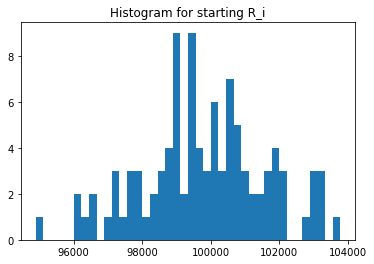

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([201996.5577461 , 229566.09001246, 230787.09001246, ...,
       151686.40387685, 150467.40387685, 145649.94264833])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14790., 14770., 14788., 14729., 14674., 14640., 14964.,
       14823., 14634., 14639., 14671., 14798., 14681., 14702., 14692.,
       14623., 14746., 14733., 14588., 14945., 14816., 14797., 14736.,
       14811., 14505., 14852., 14779., 14723., 14783., 14686., 14727.,
       14644., 14739., 14835., 14791., 14672., 14827., 14710., 14850.,
       14743., 14744., 14803., 14826., 14904., 14698., 14626., 14952.,
       14931., 14796., 14777., 14992., 14738., 14898., 14820., 14757.,
       14624., 14649., 14663., 14684., 14735., 14758., 14695., 14715.,
       14804., 14641., 14703., 14859., 14583., 14717., 14693., 14799.,
       14761., 14579., 14765., 14555., 14813., 14807., 14645., 14848.,
       14969., 14778., 14844., 14688., 14891., 14768., 14987., 14849.,
       14822., 14792., 14720., 14732., 14829., 15160., 14760., 14709.,
       14871., 14805., 14722., 14465., 14706., 14774., 14629., 14597.,
       14669., 14828., 14843., 14846., 14872., 14896., 14762., 14577.,
      

In [25]:
experiments.UNI_Qj.unique()

array([194418.4474541 , 155783.14952918, 156978.14952918, ...,
       129436.35420859, 128618.35420859, 127810.35420859])

In [26]:
experiments.UNI_Rj.unique()

array([ 97209.22372705, 130952.07476459, 129952.07476459, ...,
       156595.67710429, 157595.67710429, 158595.67710429])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 97209.22372705,  98998.20113728, 100952.07476459,  98300.46413933,
       101727.37587211,  98873.90621702,  97645.78559626, 100199.48150437,
        98581.59550495,  97898.01131135,  99111.03425438,  96946.57155313,
       103801.6581911 , 100137.2062818 , 102845.02743862,  97539.54654441,
        98197.84354311, 101586.46464126,  97235.50940288, 101594.48408897,
       102344.0095041 , 104477.83237737, 101321.63331229,  98038.615829  ,
       101259.0699654 , 101180.51050906,  98069.70501769,  97016.03465199,
       100429.06252756, 100595.67710429, 100950.8729639 ,  96836.4754268 ,
       100502.19239309, 100455.91051104, 102648.48940238, 101575.77585748,
       101438.1008063 ,  97393.91107535,  97556.69001982,  99554.11613914,
       100369.91329494, 101049.24513848, 100521.06647709, 100465.5412454 ,
       103148.09539139,  98320.83961603,  98445.85349378,  98178.13568982,
       100587.80719106,  97881.19793848, 100969.51802499, 100695.23274396,
       101640.17738244,  

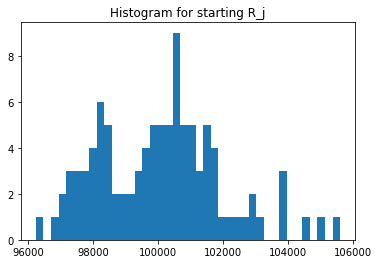

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100998.27887305,  99383.54500623,  98806.02781904,  99418.36888778,
       100716.70989512, 100194.32425272, 101955.97973737, 100754.1504107 ,
       100664.65974829,  97724.53133637, 101879.82436946, 101031.7181205 ,
        99973.01189183, 103773.6459511 ,  98335.73721185,  98803.91770933,
        99549.51030708,  99629.40756547, 100135.13413065,  99346.88336395,
        96103.21613609,  97190.99577765,  98605.84383074, 102974.38116142,
        97811.84641555, 100222.06920894,  99561.66365956, 101970.0495051 ,
        98917.24782412,  99046.32394905,  99083.04448048, 102083.1946731 ,
        97907.00331514, 101847.47977958,  96535.70193842, 100689.53428609,
        99768.99379084, 100650.2078689 , 101487.74385306,  98968.91569358,
       100394.45905789, 100343.29019185,  99001.60364256,  98396.17492283,
        98570.76742164, 102136.53705374,  99399.66208935,  97086.53581314,
       101230.74232906, 102999.60072183,  98946.17755173,  97588.11897026,
       101658.52873405, 1

In [31]:
experiments.UNI_ji.unique()

array([ 97209.22372705, 100952.07476459, 100199.48150437,  98998.20113728,
        98300.46413933,  99111.03425438, 101727.37587211,  98873.90621702,
        97645.78559626,  98038.615829  ,  98581.59550495,  97016.03465199,
        97898.01131135, 100137.2062818 , 103801.6581911 ,  96946.57155313,
        98197.84354311, 101586.46464126, 102845.02743862,  97539.54654441,
       105590.47096851,  97235.50940288, 100429.06252756, 101594.48408897,
       102344.0095041 , 104477.83237737, 101259.0699654 , 101321.63331229,
       101180.51050906,  98069.70501769,  97556.69001982, 100587.80719106,
       100951.58925445, 100950.8729639 , 100595.67710429, 101049.24513848,
        96836.4754268 , 100502.19239309, 100455.91051104, 100969.51802499,
        97568.56492513, 102648.48940238, 101438.1008063 ,  99554.11613914,
       101575.77585748,  97393.91107535, 100369.91329494, 100521.06647709,
       100465.5412454 ,  97881.19793848,  98320.83961603, 103148.09539139,
        98178.13568982,  

In [32]:
experiments.UNI_Sij.unique()

array([9.81796429e+09, 1.00329751e+10, 9.90031276e+09, 9.84223968e+09,
       9.90049933e+09, 9.93036310e+09, 1.03717143e+10, 9.96195642e+09,
       9.82947978e+09, 9.58077778e+09, 1.00434756e+10, 9.80169667e+09,
       9.78715905e+09, 1.03916030e+10, 1.02074126e+10, 9.57870108e+09,
       9.77554724e+09, 1.01209993e+10, 1.02984006e+10, 9.69024995e+09,
       1.01475839e+10, 9.45041598e+09, 9.90289246e+09, 1.04616291e+10,
       1.00104565e+10, 1.04709845e+10, 1.00815215e+10, 1.03317720e+10,
       1.00084976e+10, 9.71344377e+09, 9.66621386e+09, 1.02683247e+10,
       9.88386758e+09, 1.02815920e+10, 9.71107430e+09, 1.01746014e+10,
       9.66127772e+09, 1.01155666e+10, 1.01950437e+10, 9.99284372e+09,
       9.79534330e+09, 1.03000872e+10, 1.00425347e+10, 9.79574423e+09,
       1.00124022e+10, 9.94747681e+09, 9.97673547e+09, 9.75924212e+09,
       1.01702013e+10, 1.00817243e+10, 9.72847125e+09, 1.00660286e+10,
       9.98064483e+09, 9.88579074e+09, 9.99227694e+09, 9.89760437e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


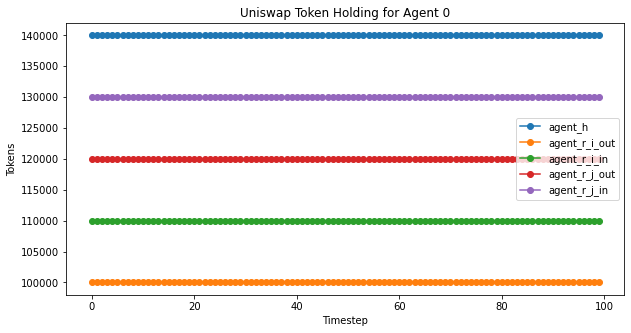

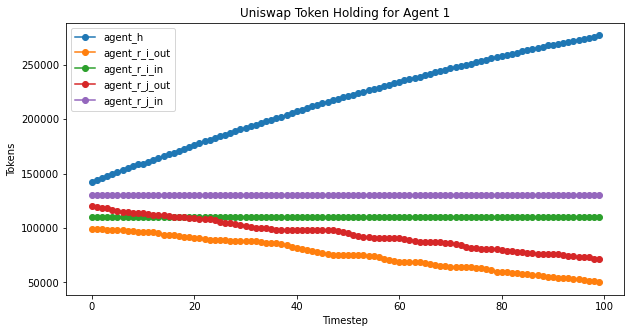

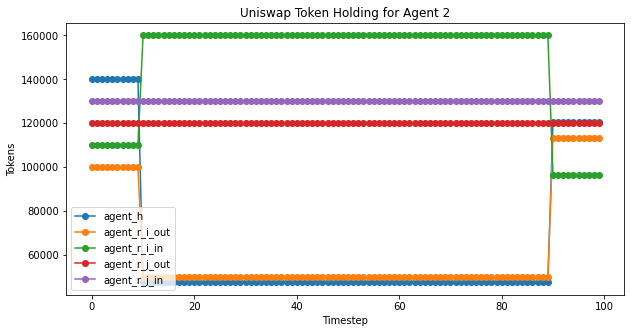

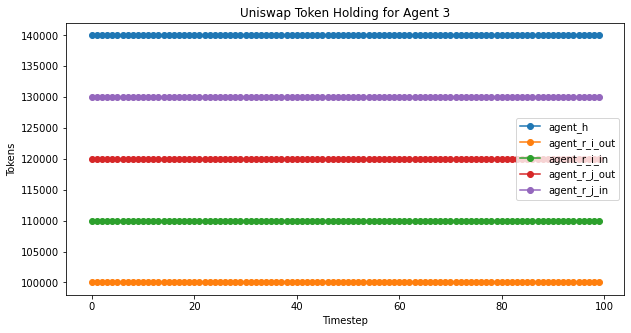

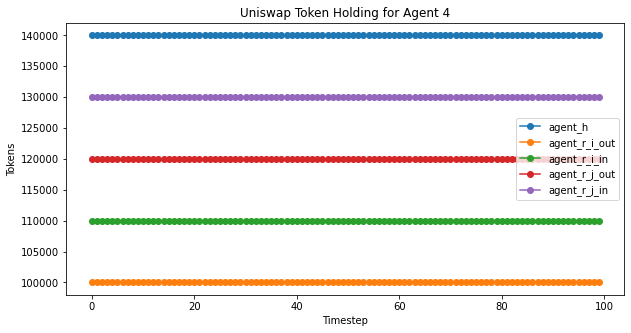

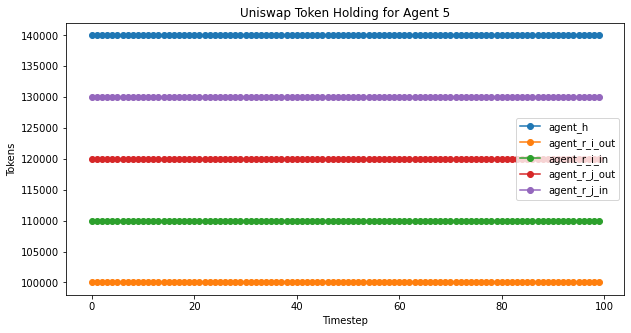

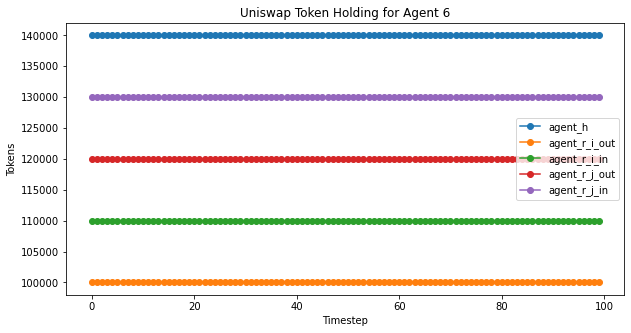

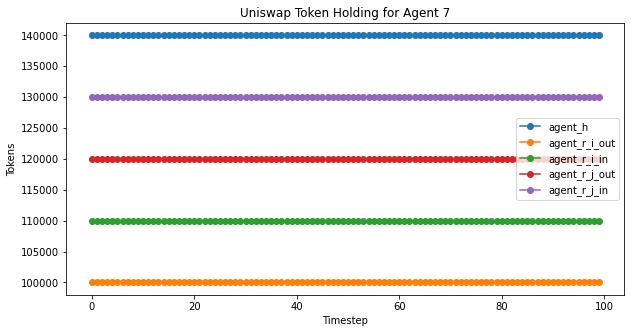

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


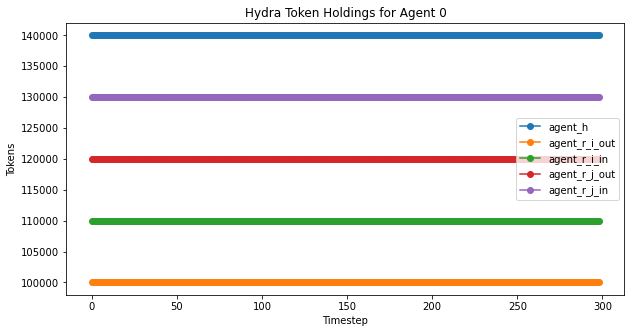

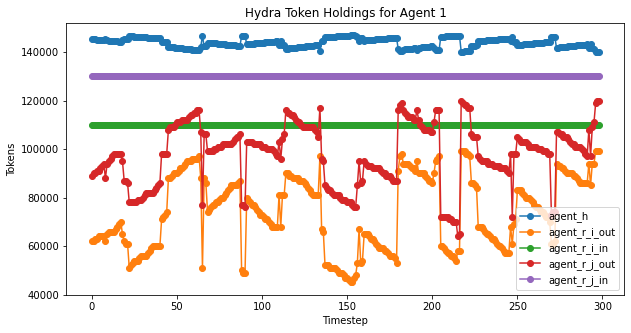

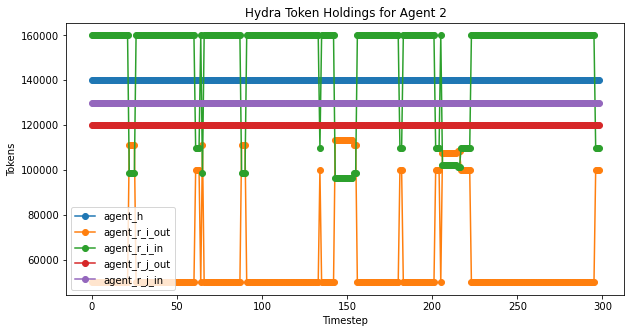

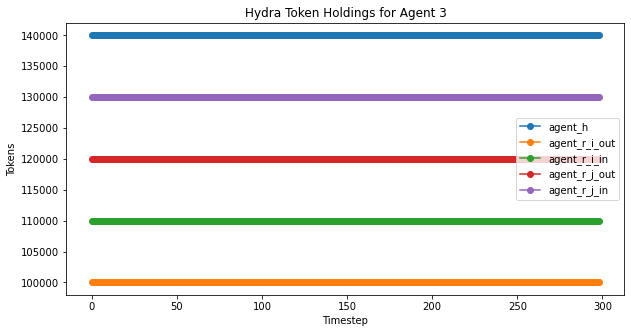

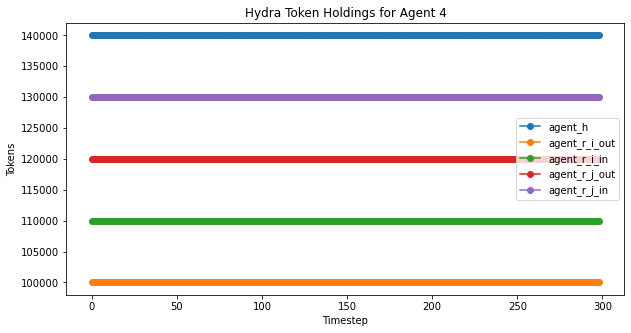

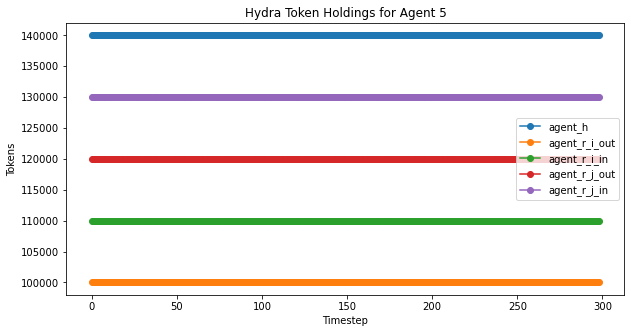

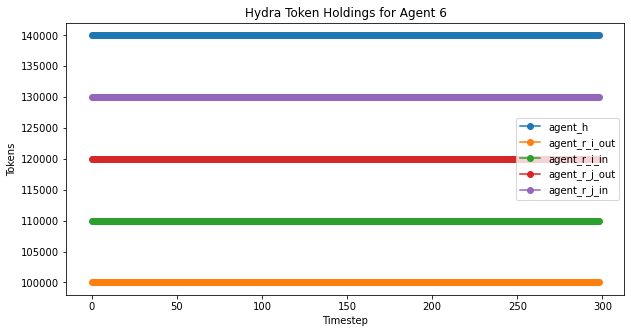

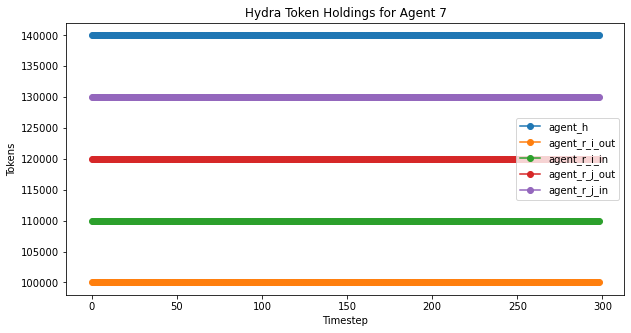

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

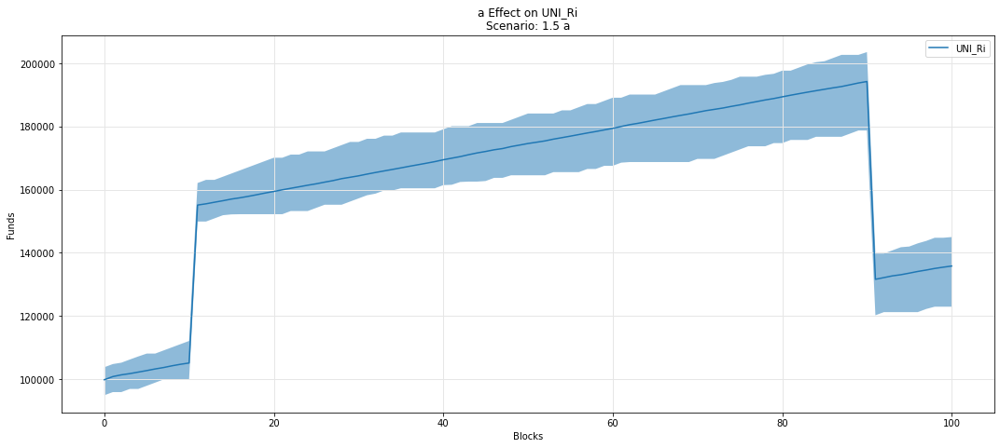

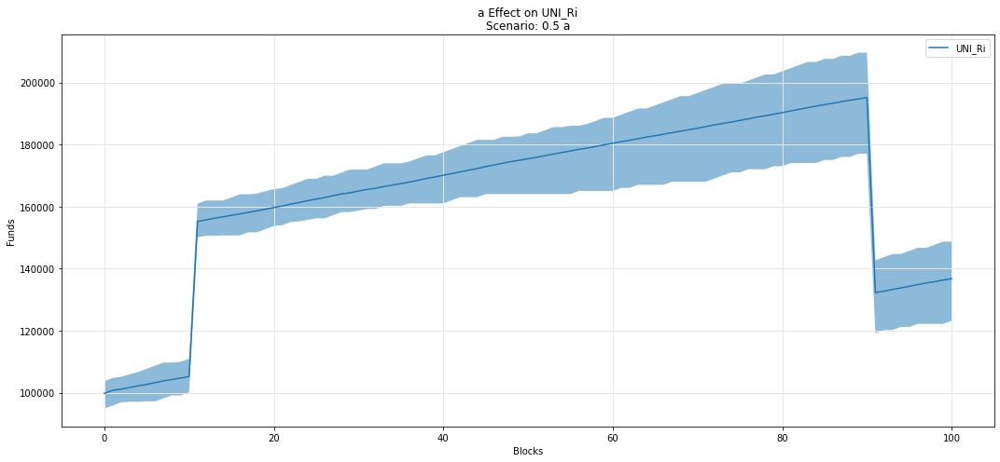

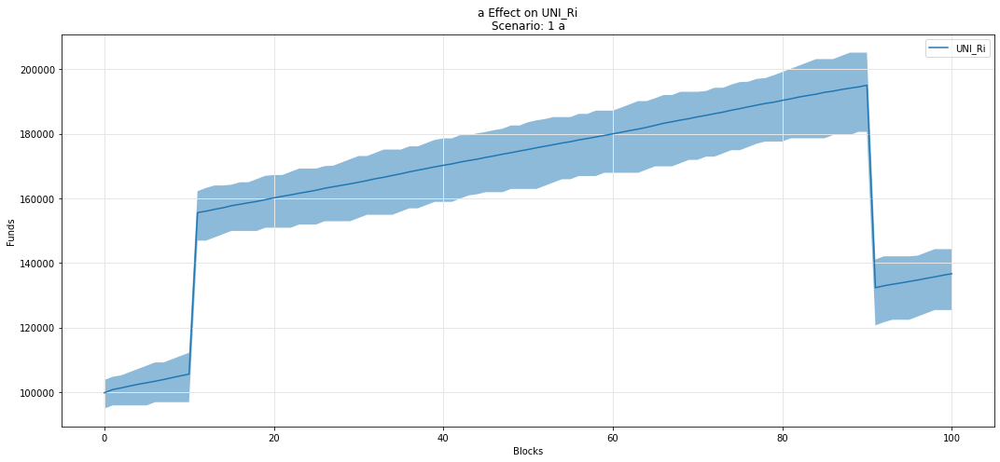

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

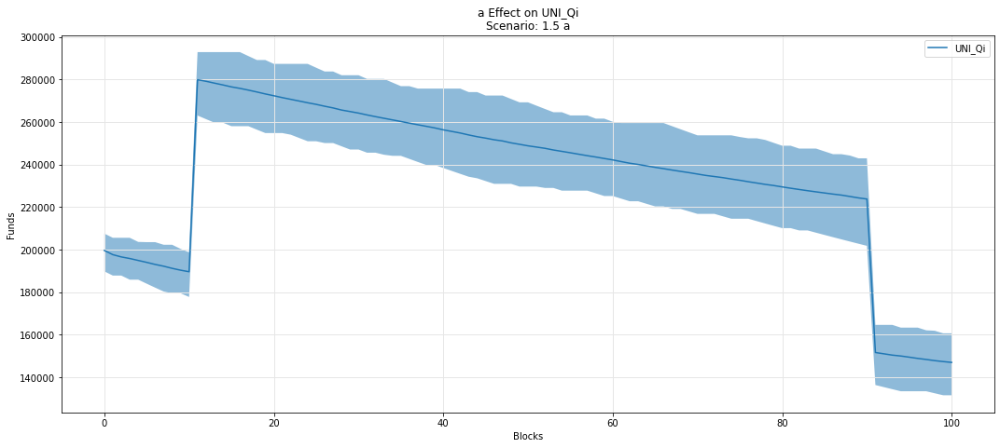

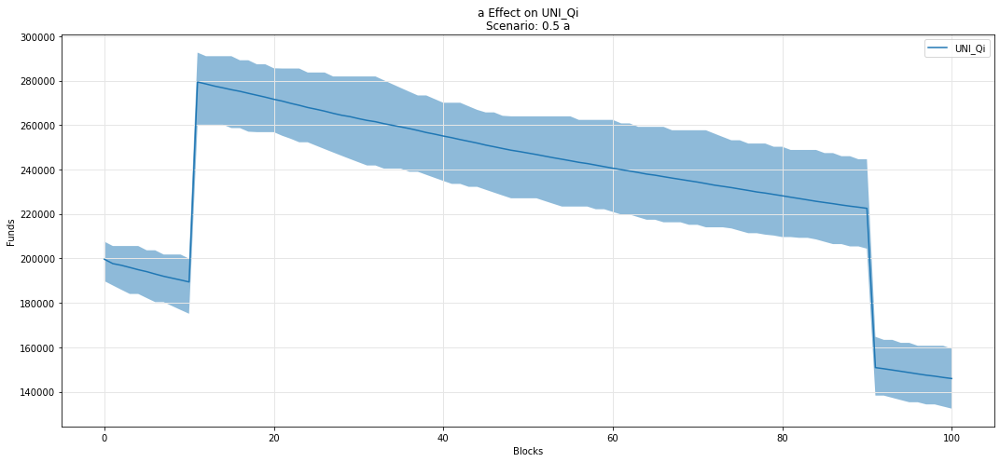

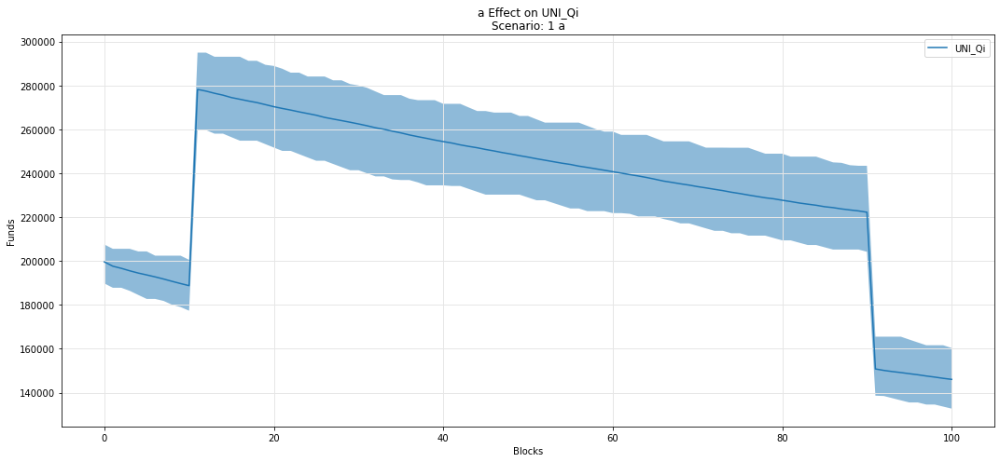

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

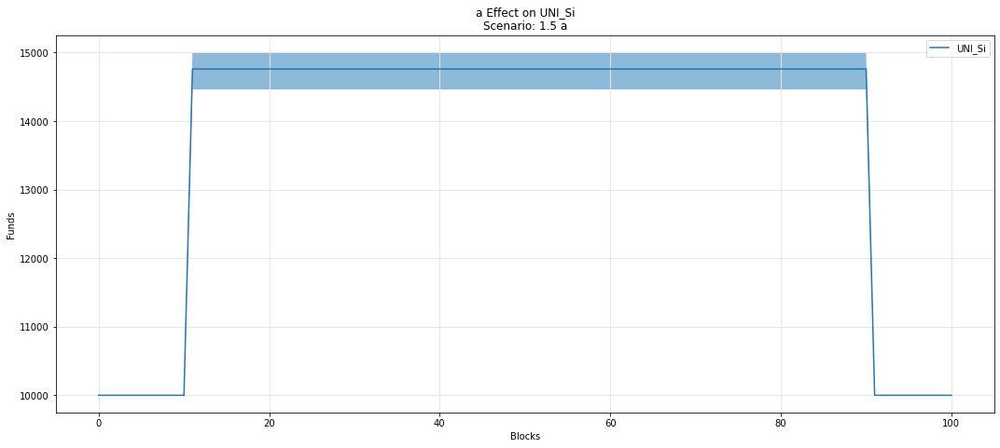

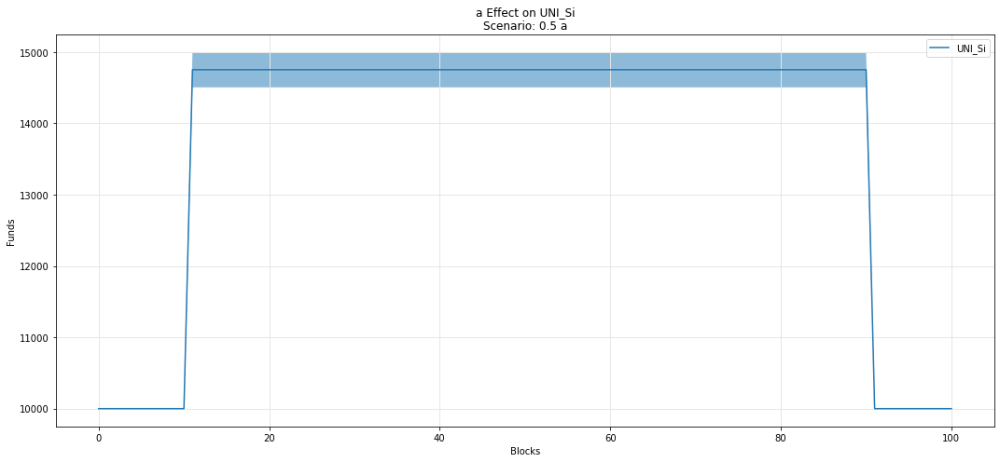

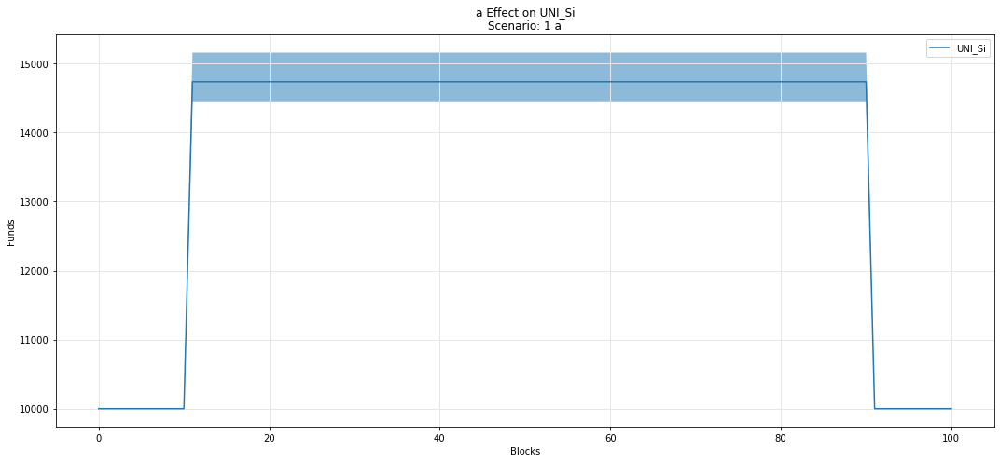

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

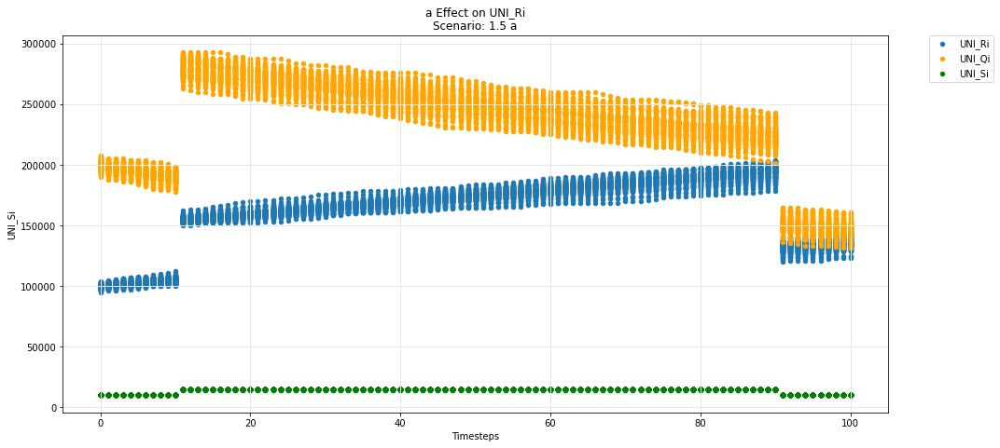

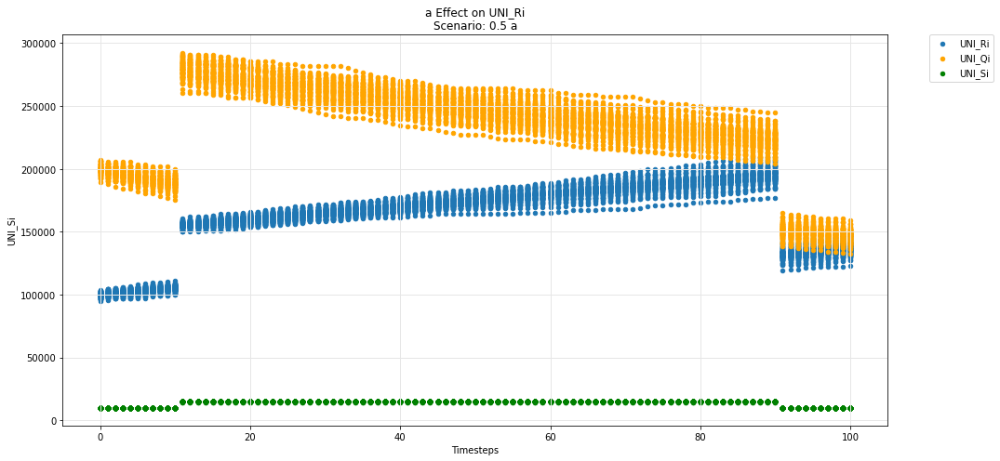

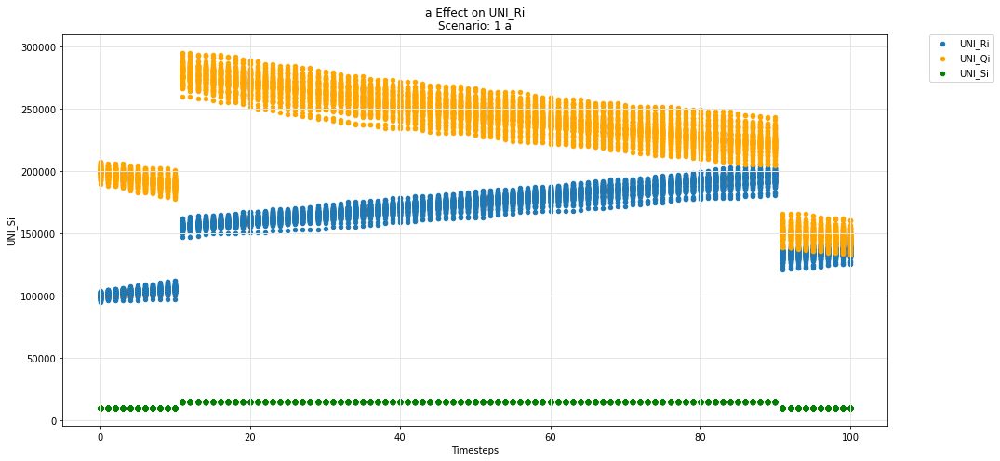

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

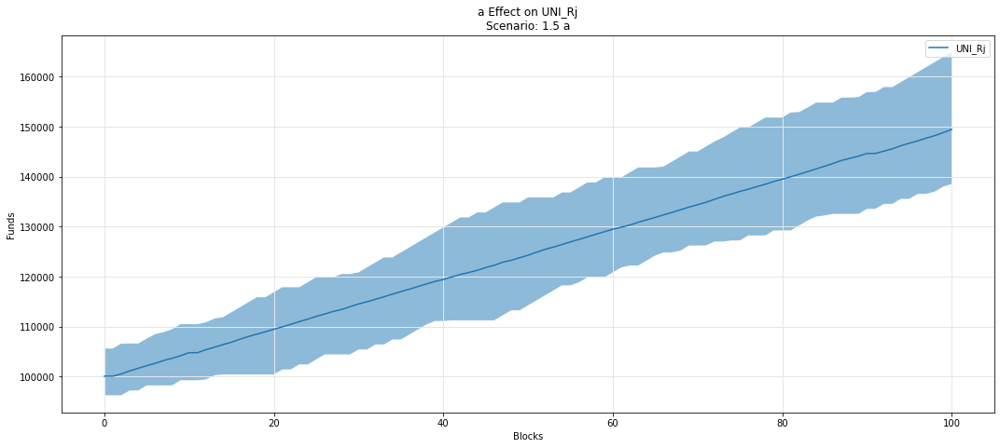

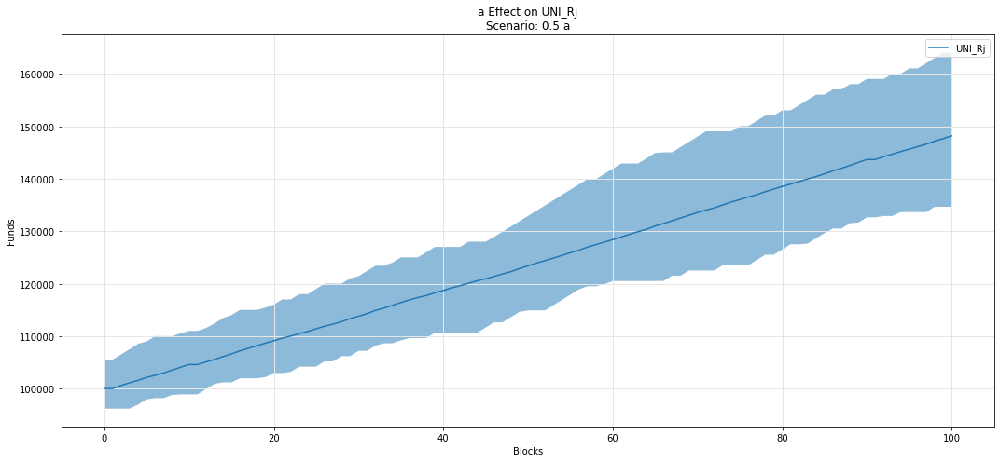

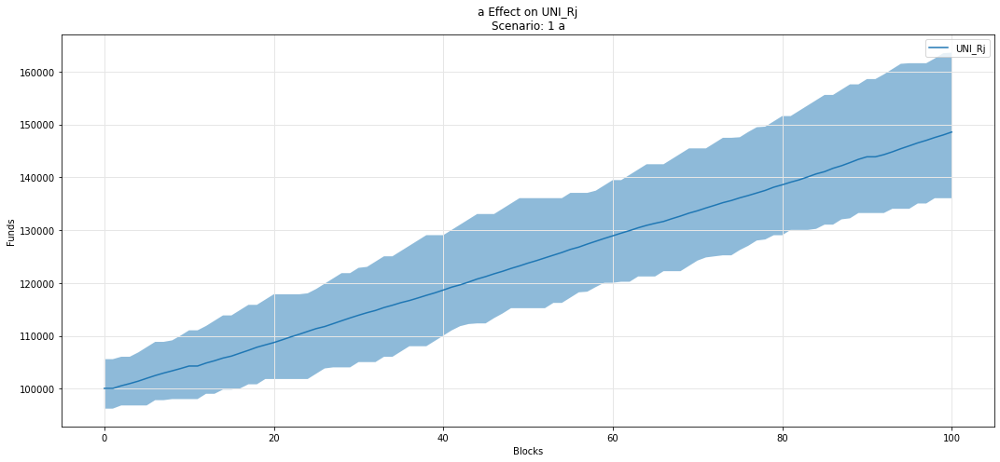

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

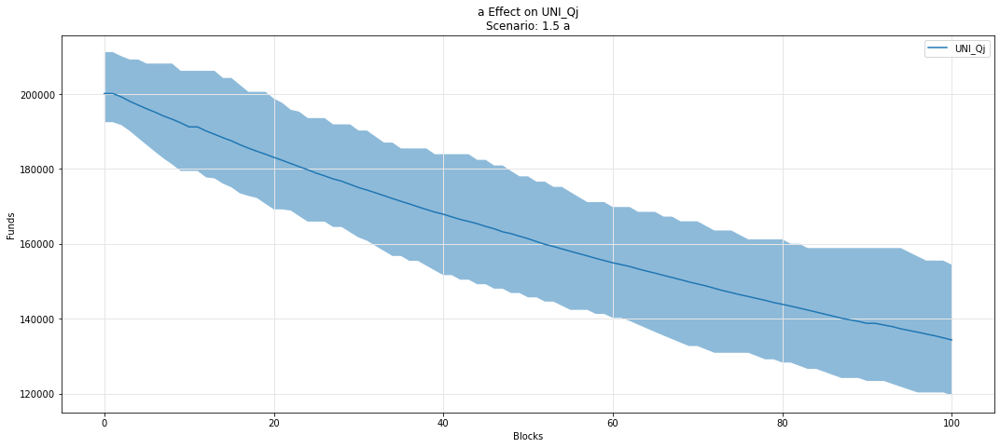

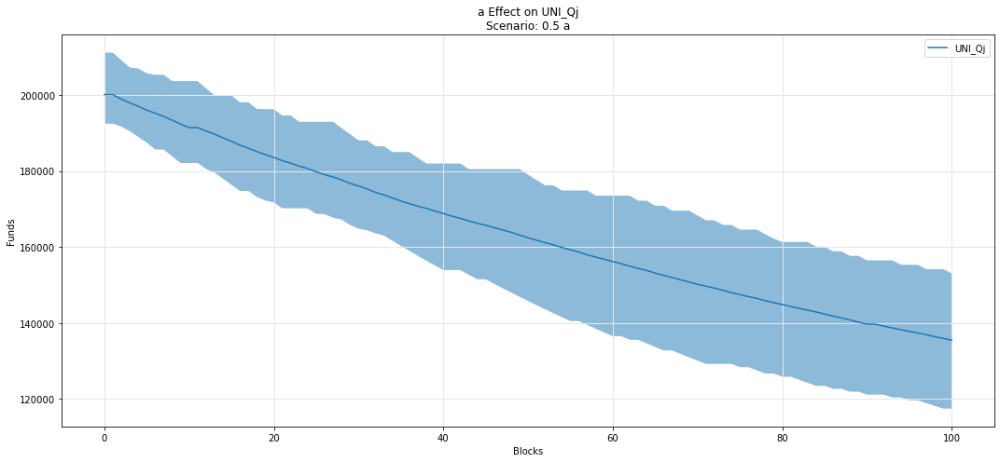

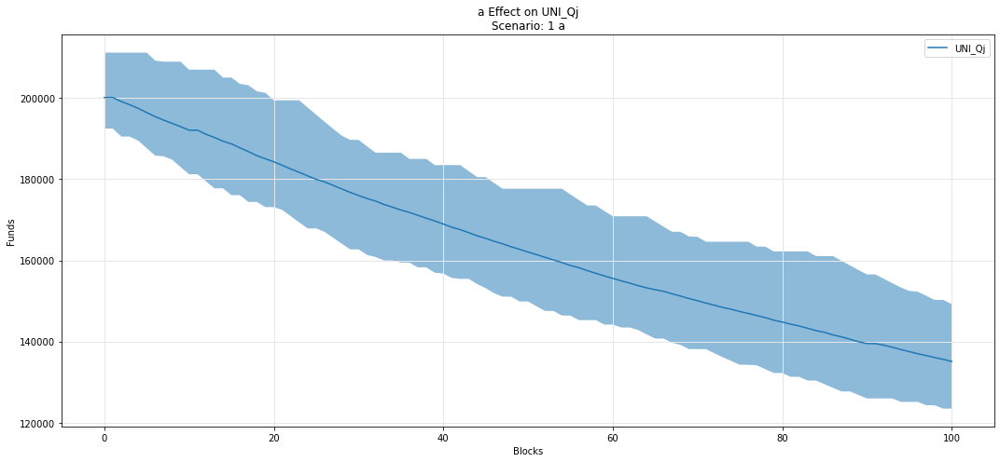

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

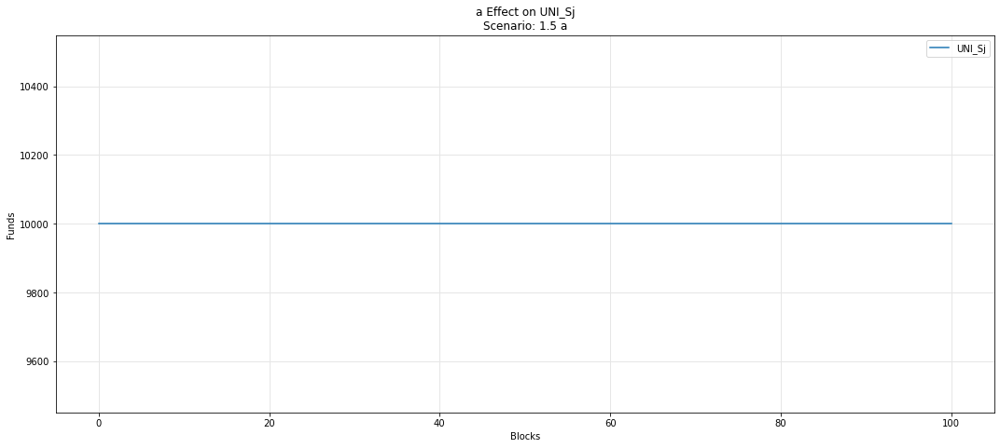

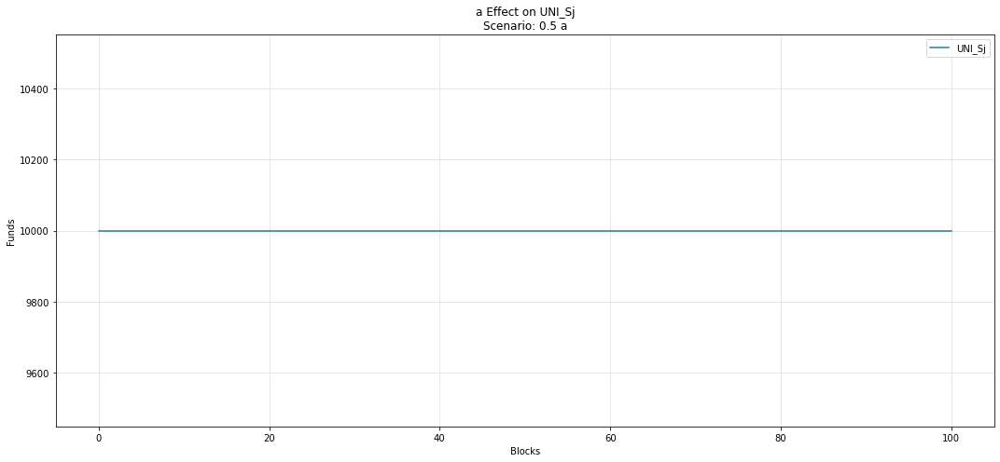

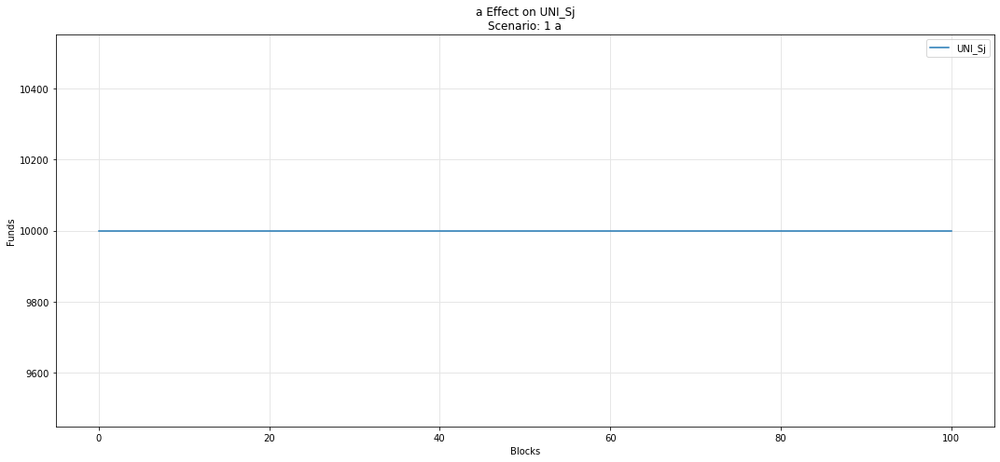

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

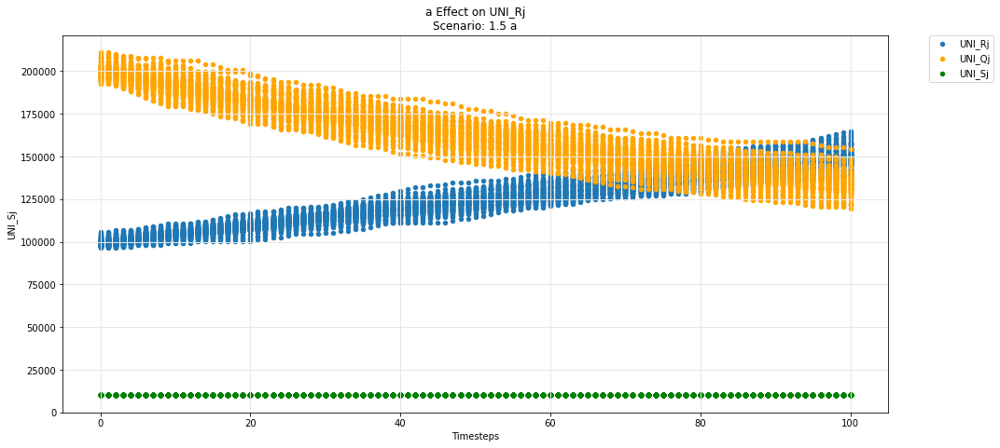

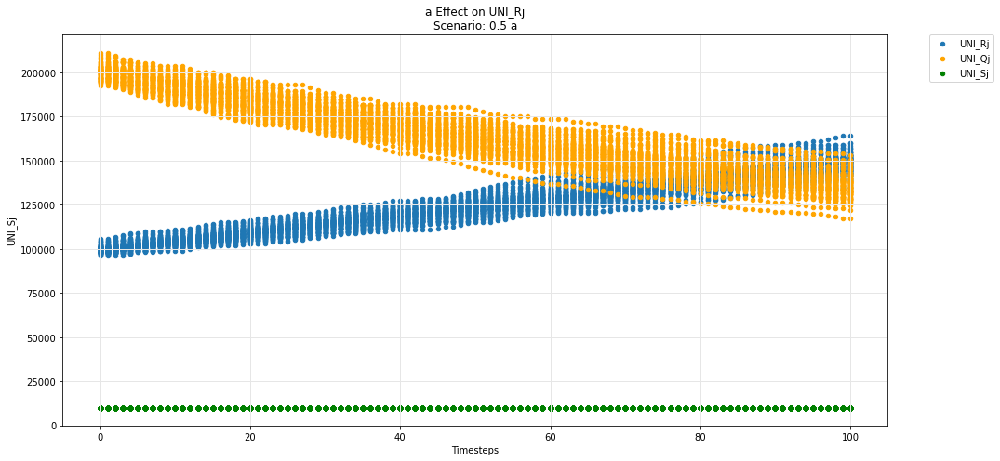

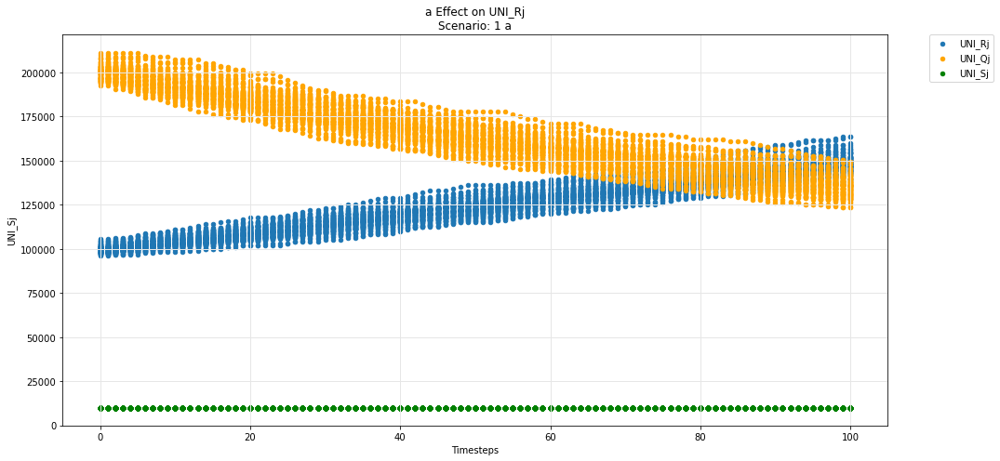

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

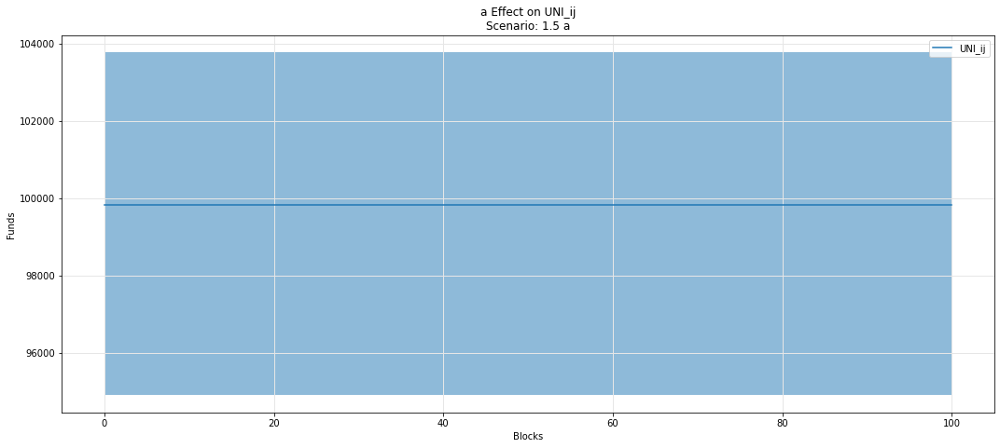

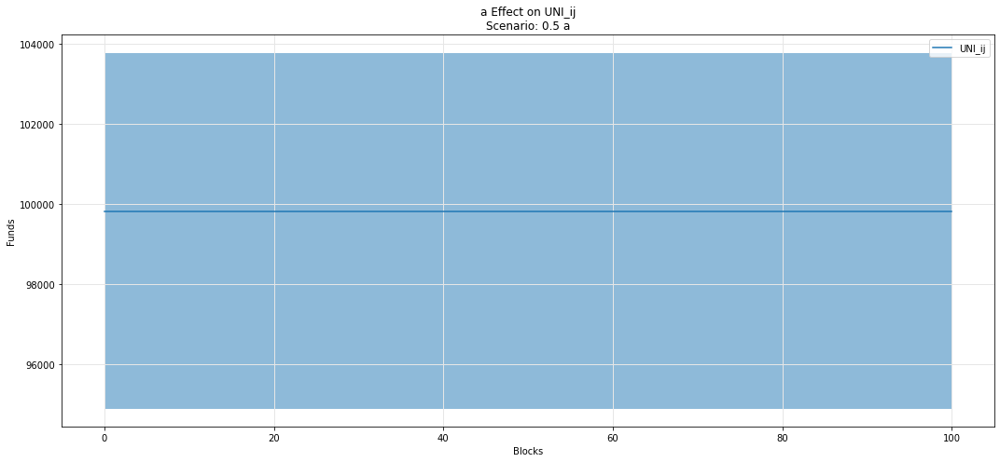

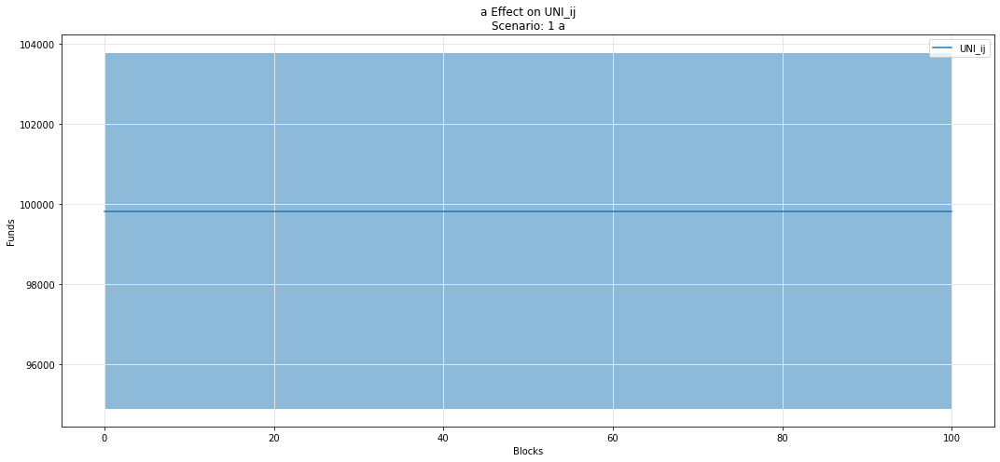

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

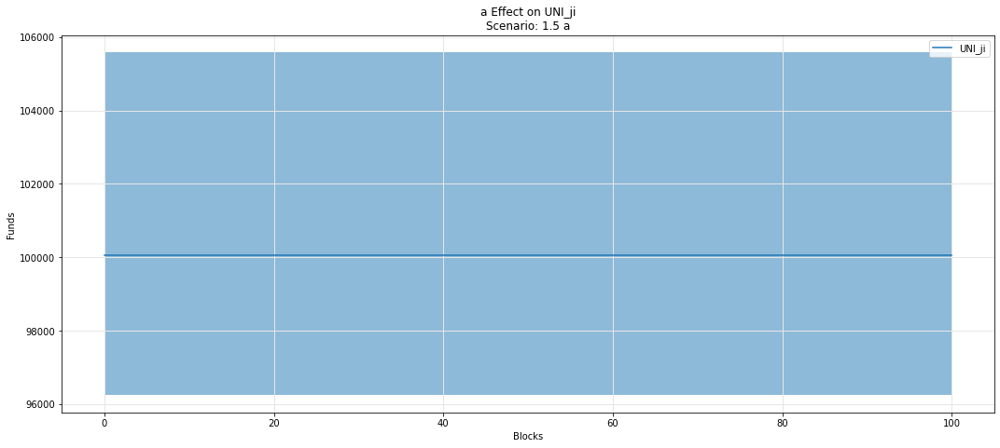

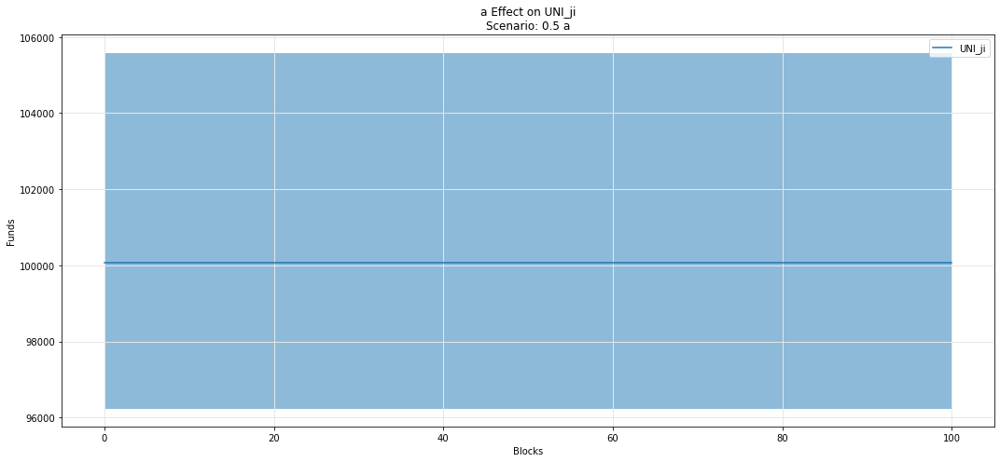

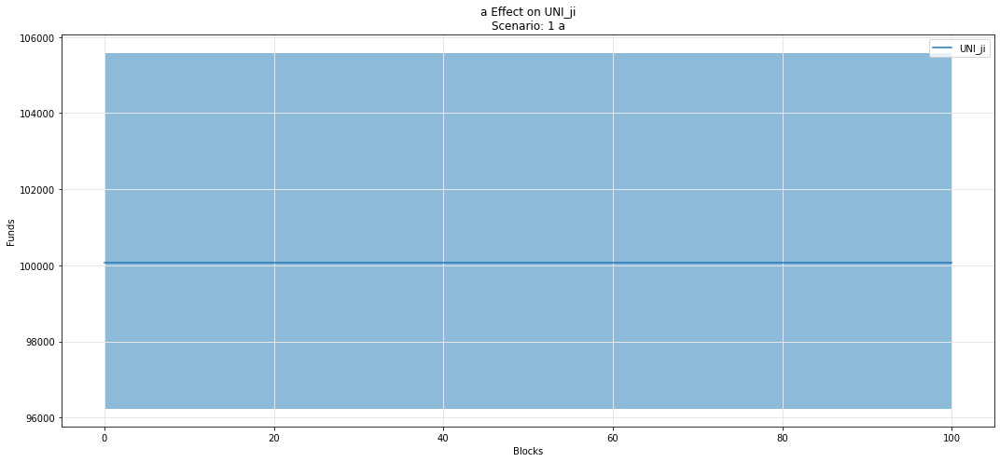

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

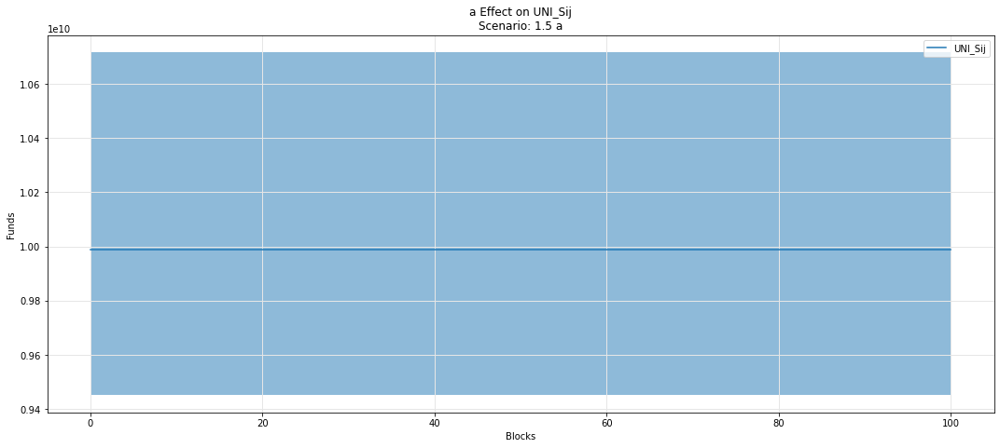

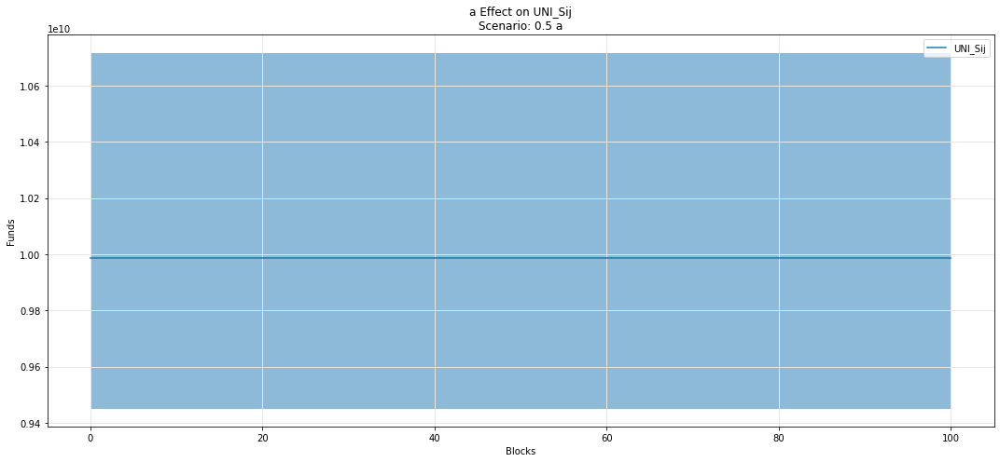

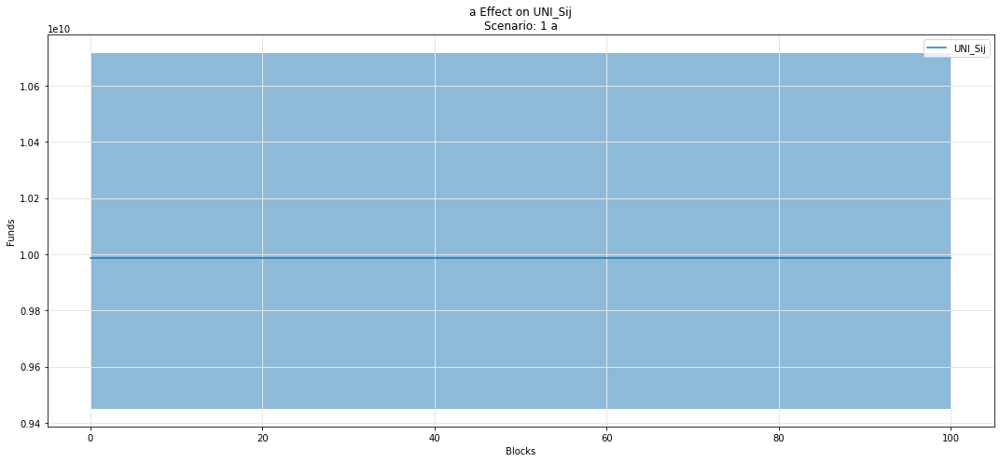

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

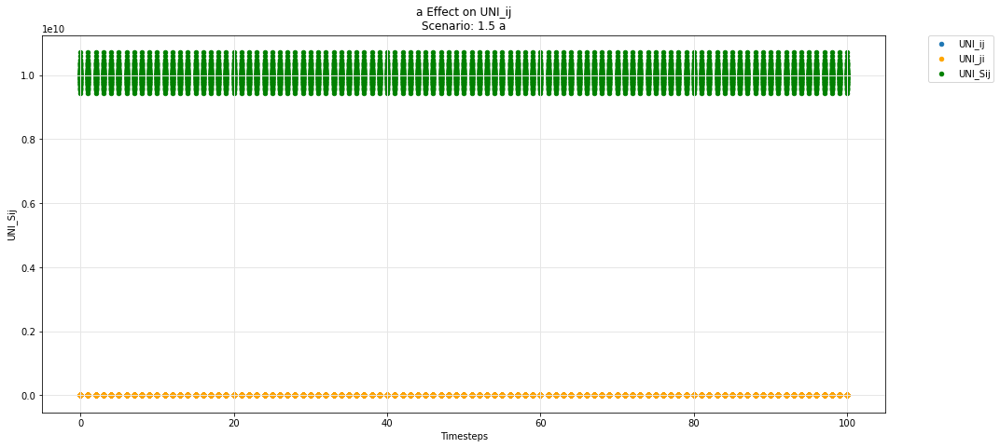

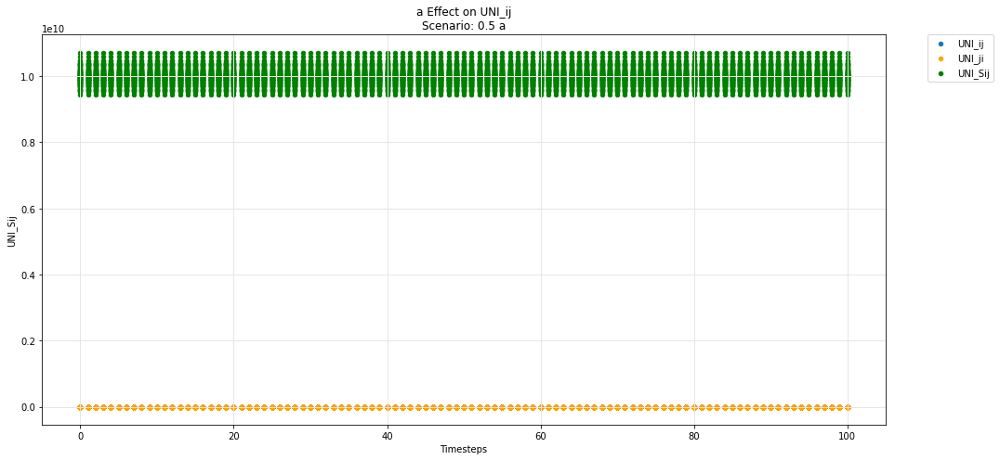

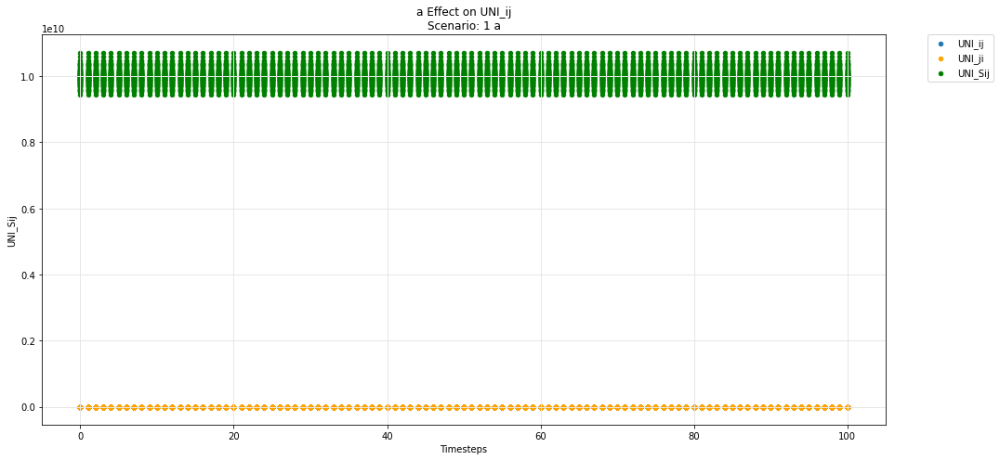

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

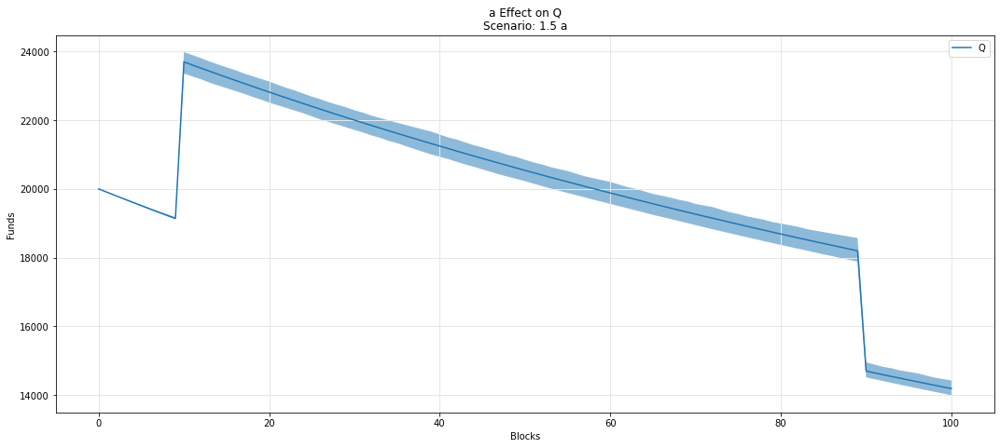

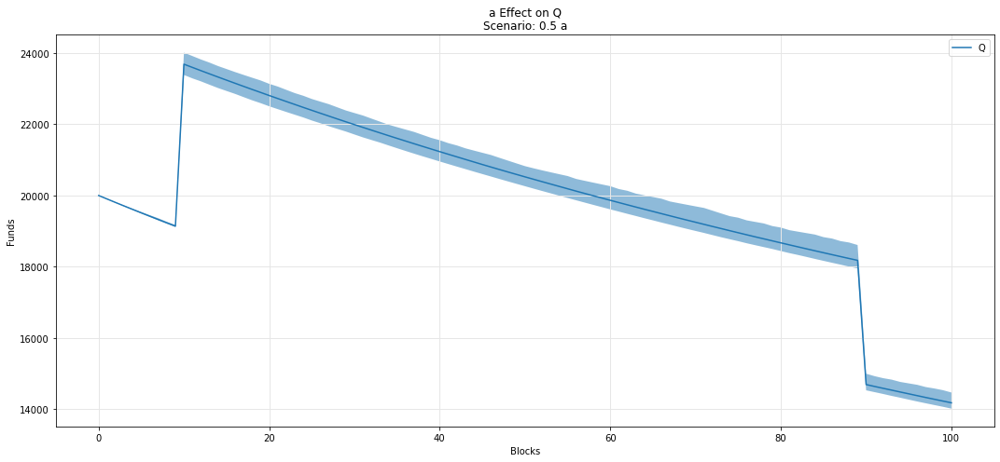

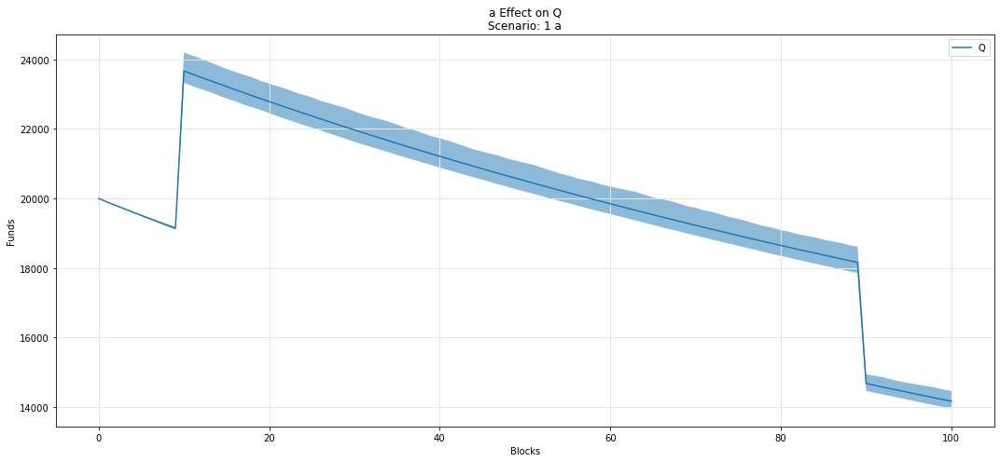

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

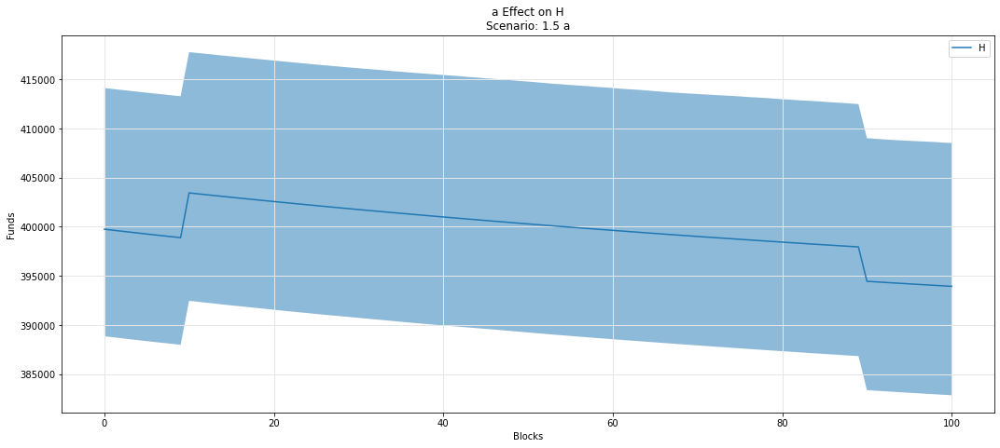

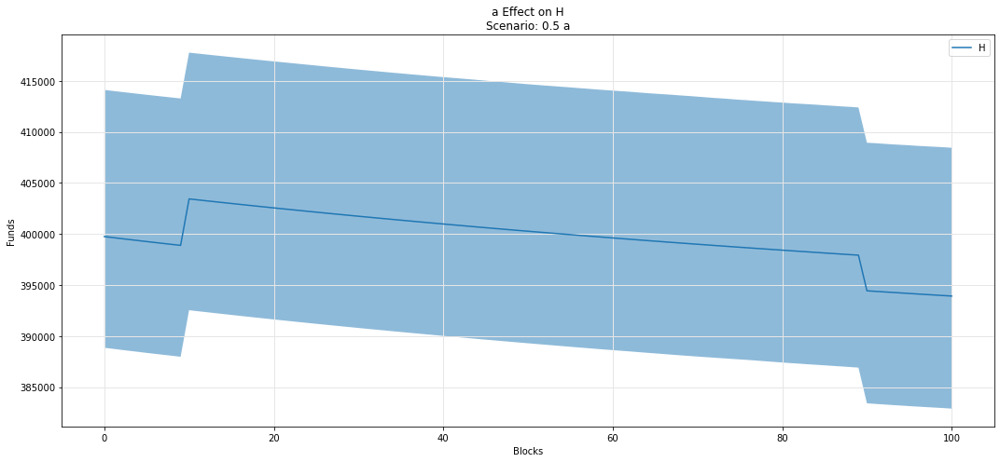

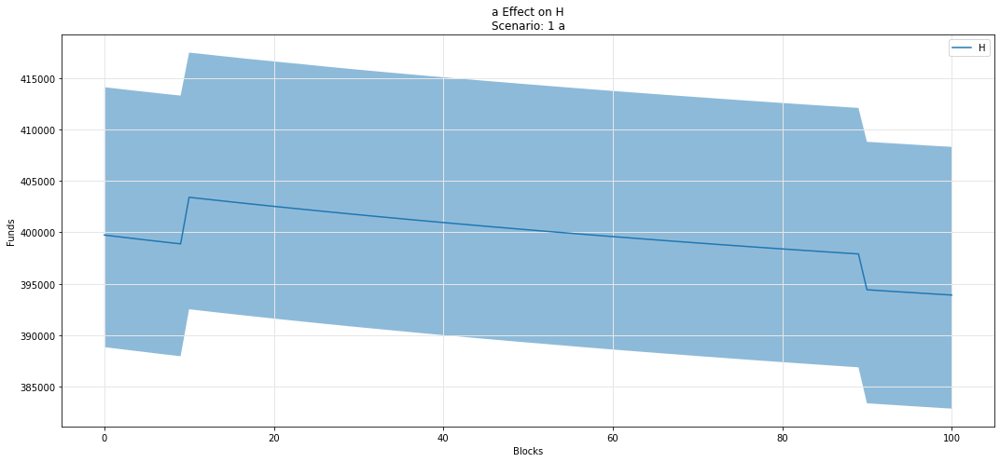

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

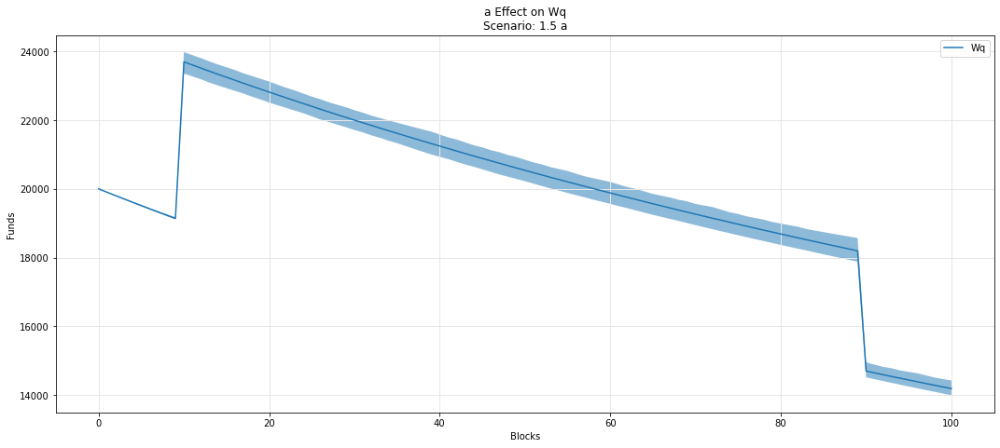

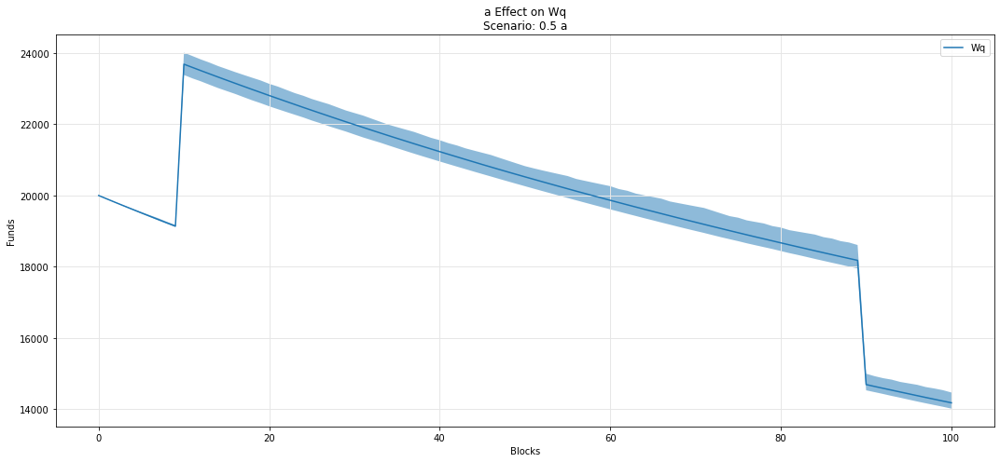

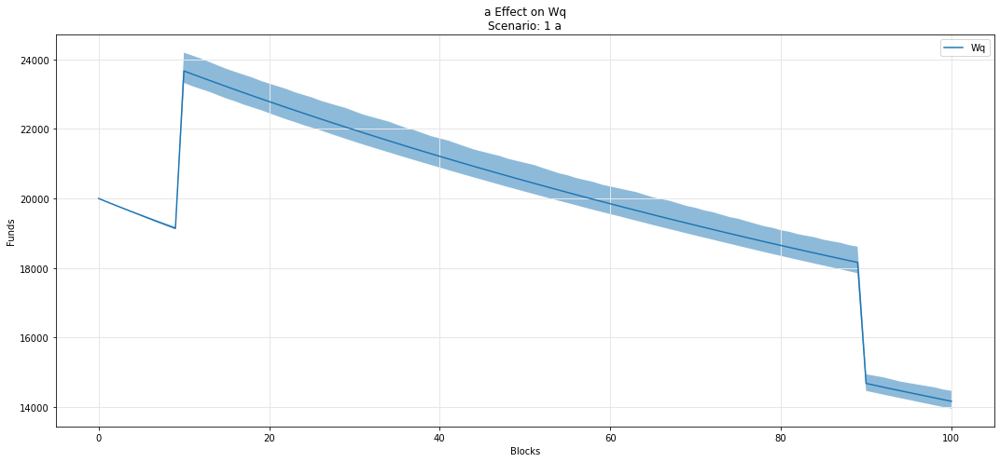

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

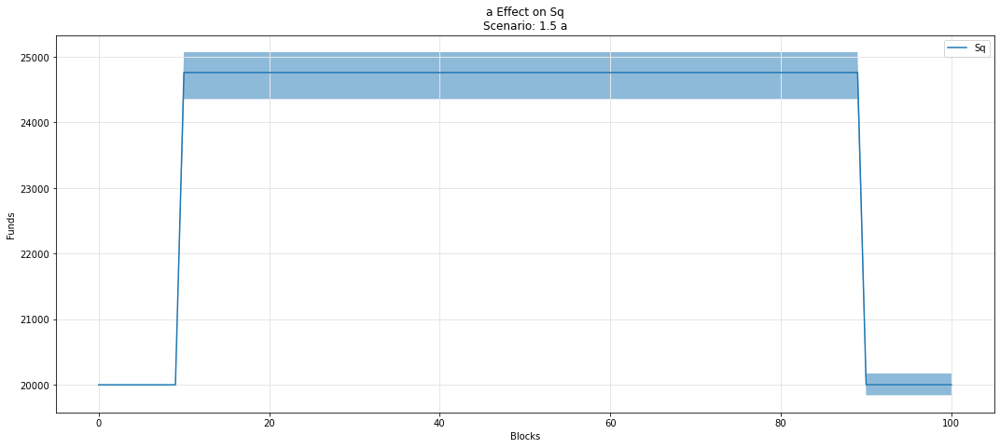

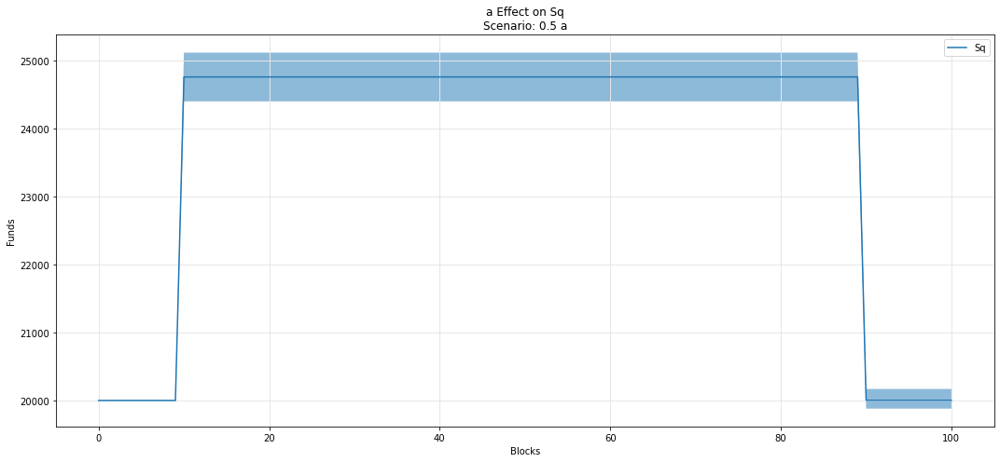

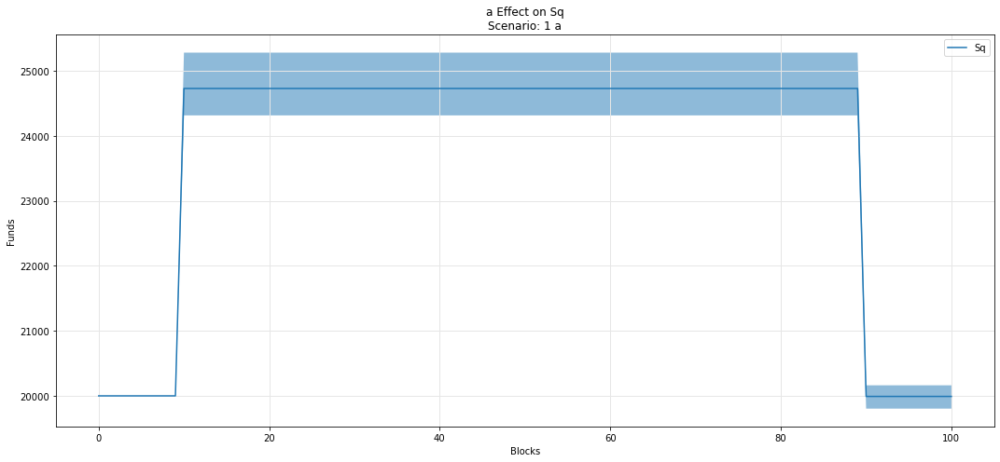

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

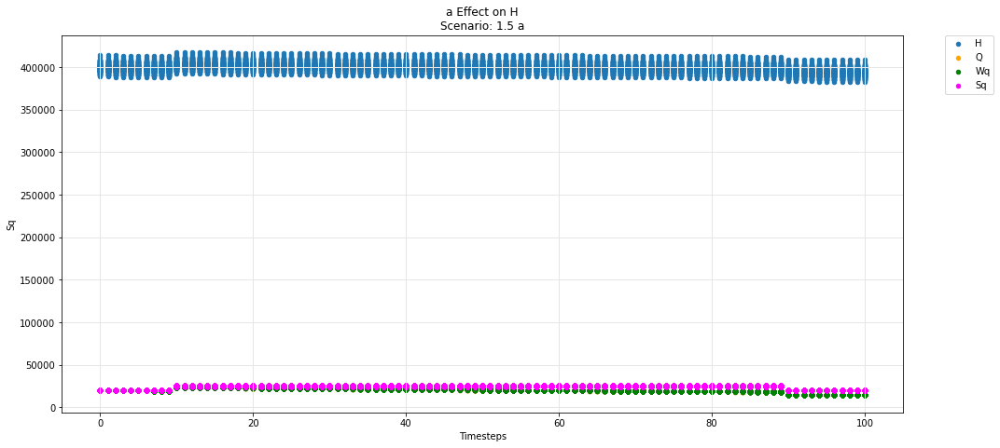

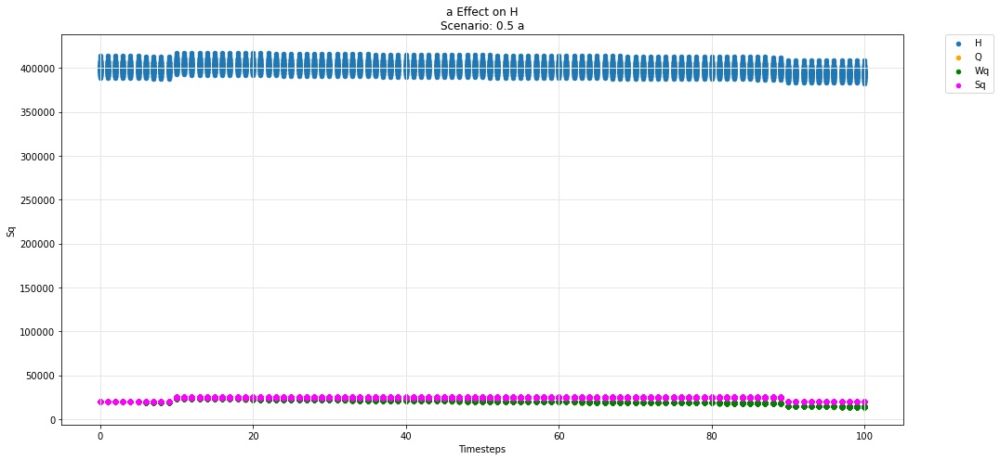

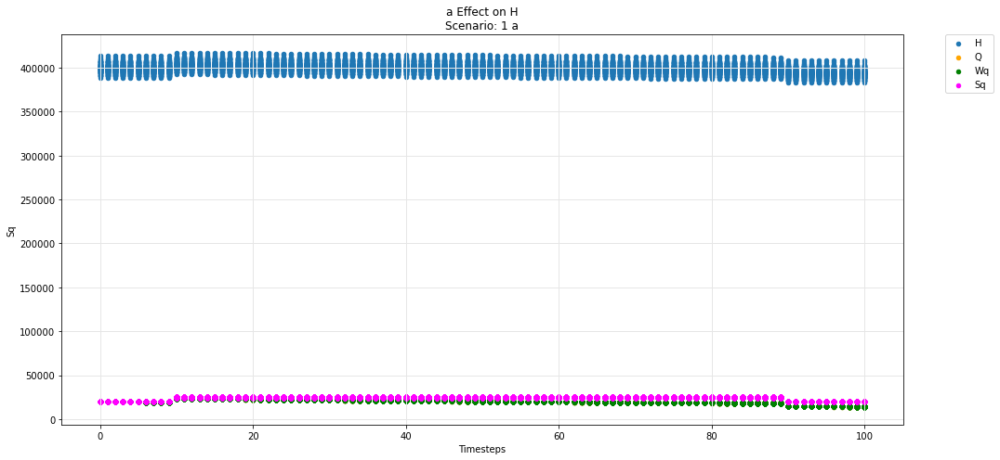

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

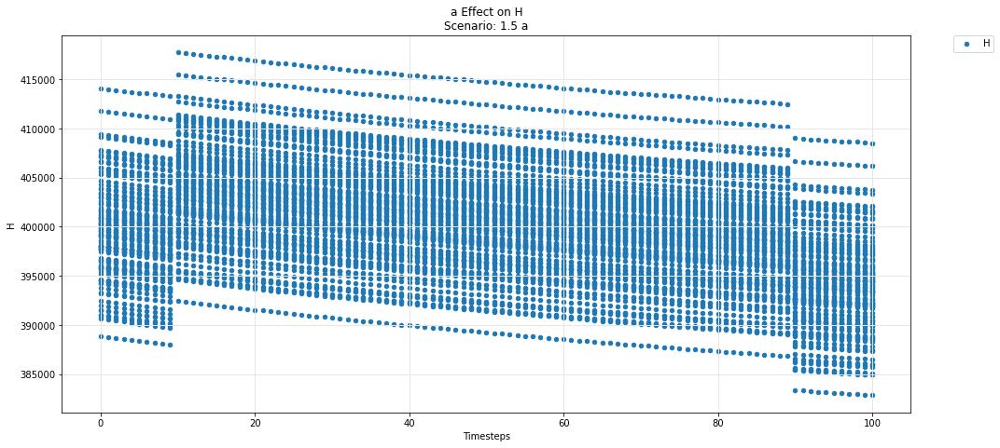

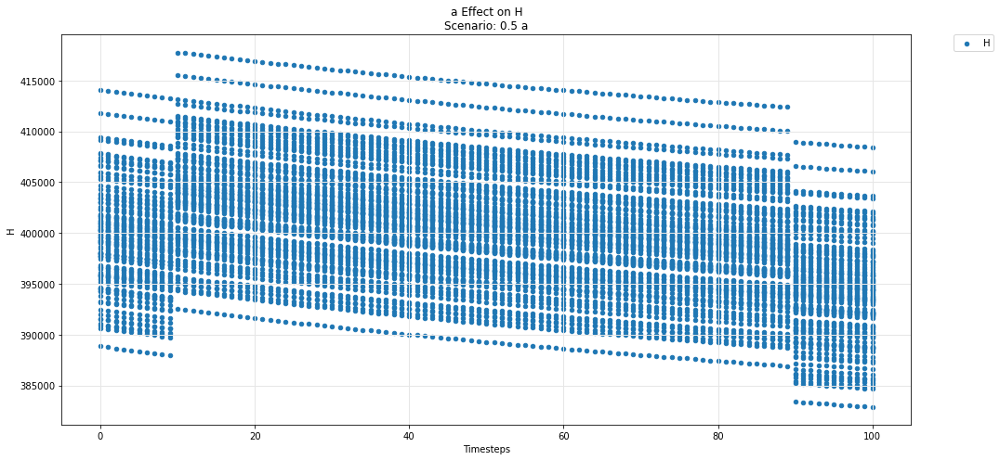

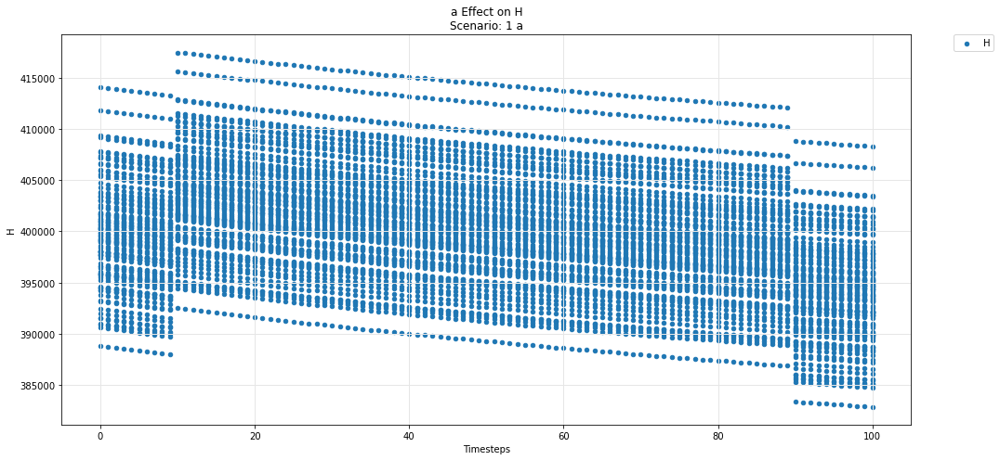

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

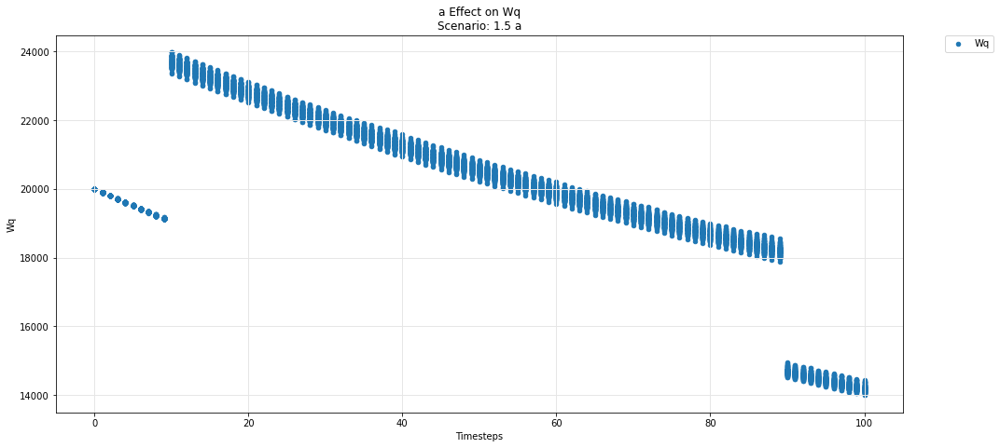

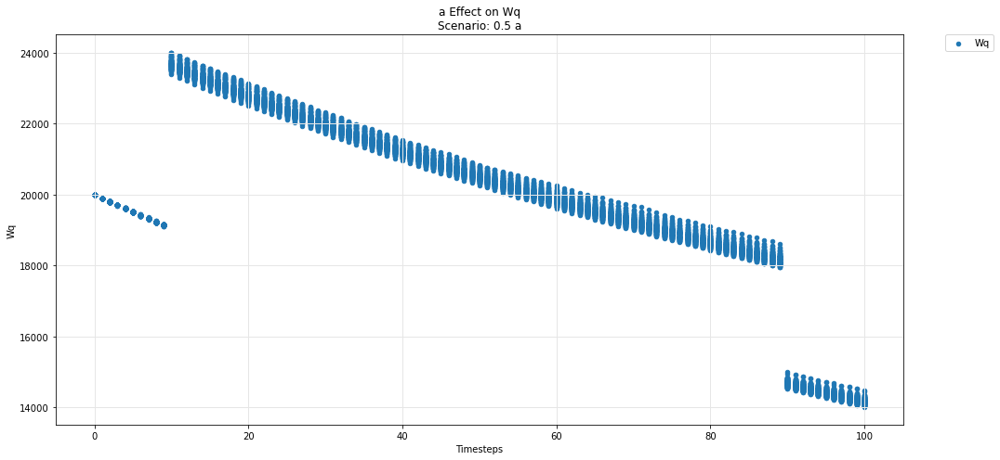

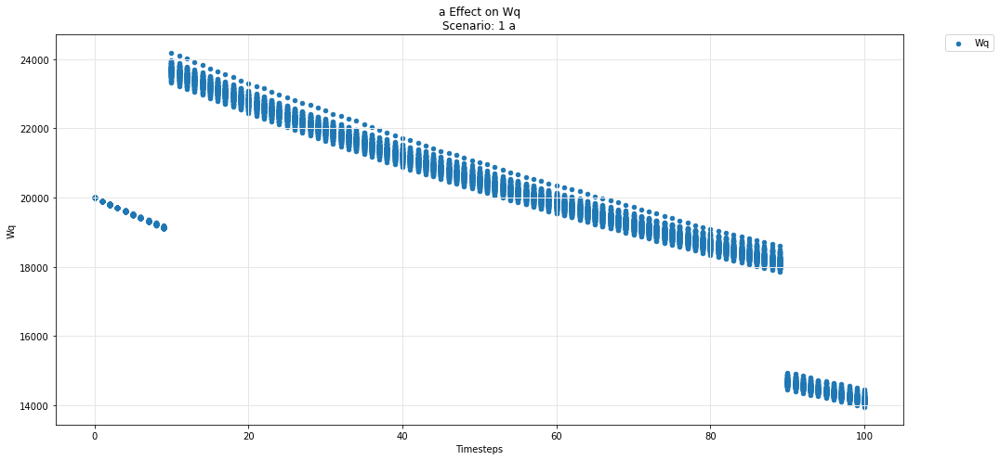

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

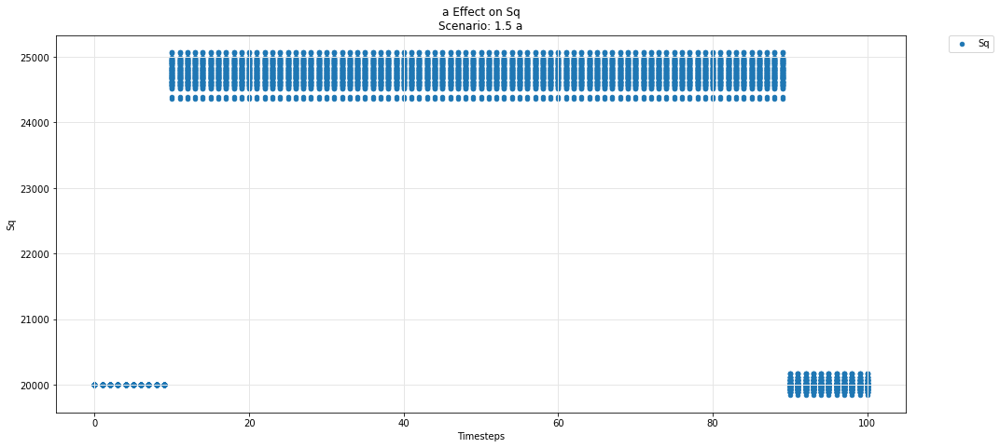

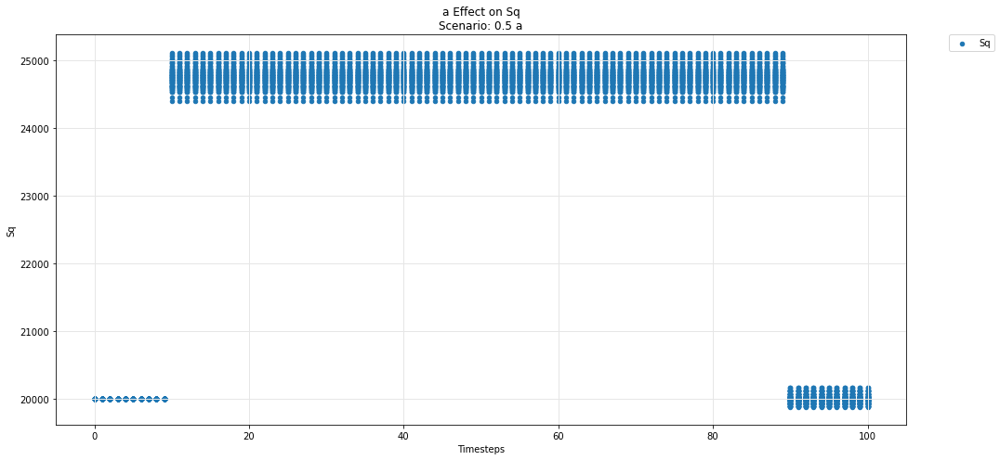

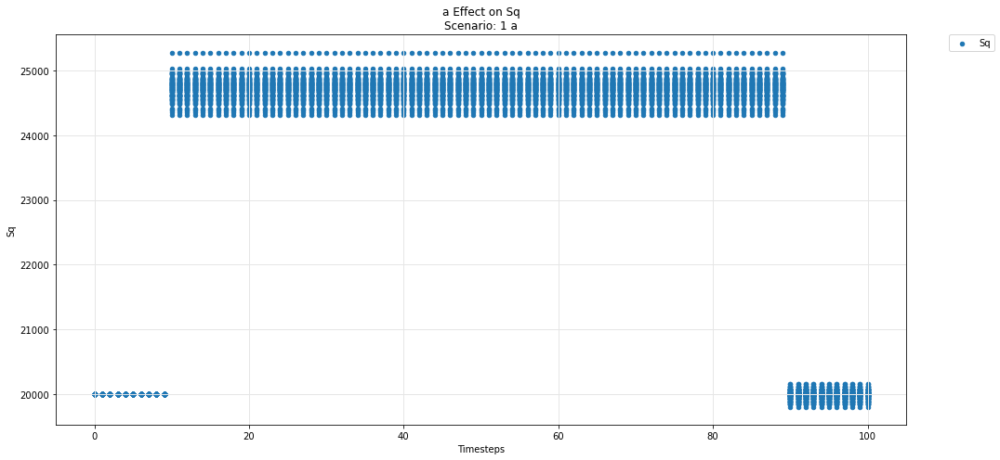

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

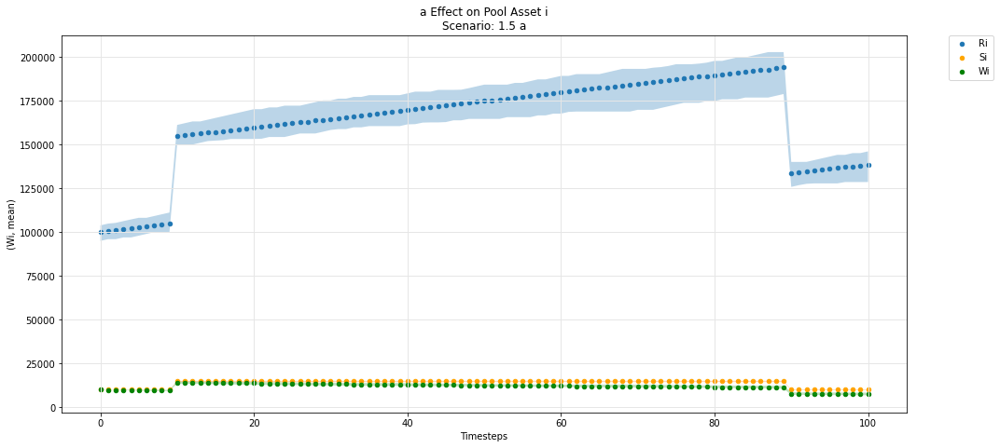

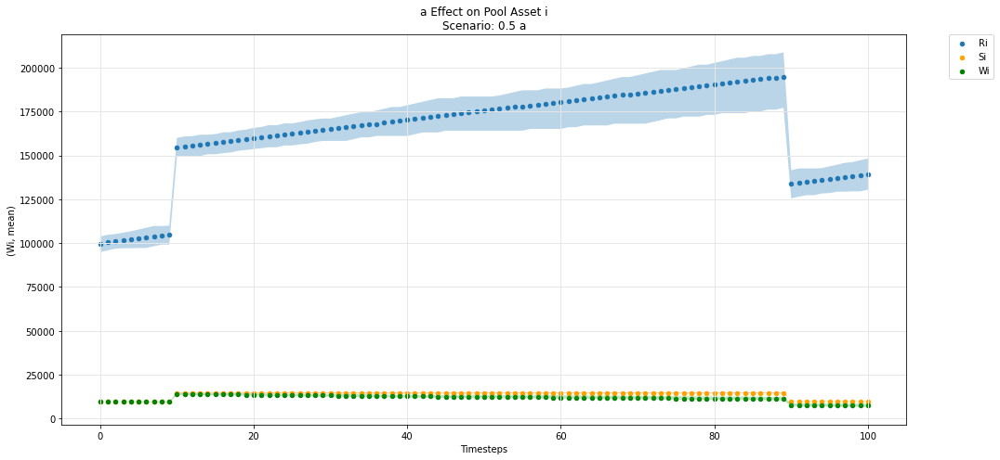

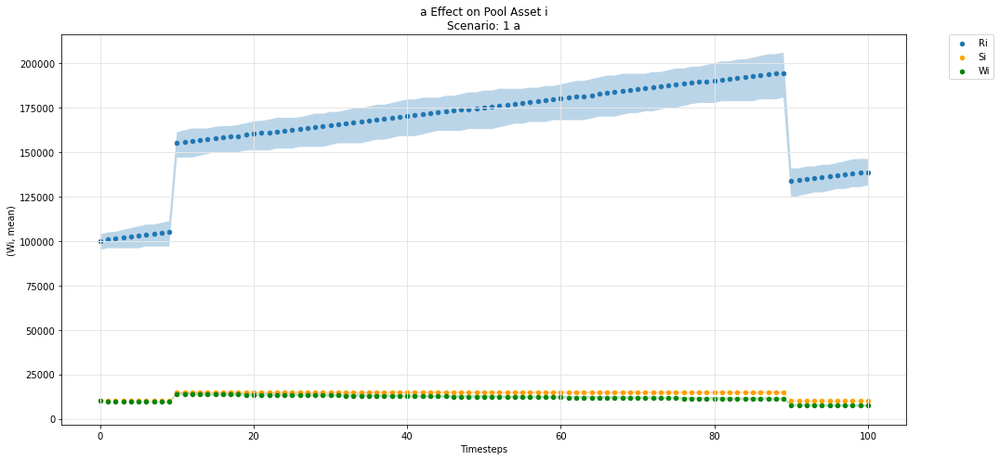

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

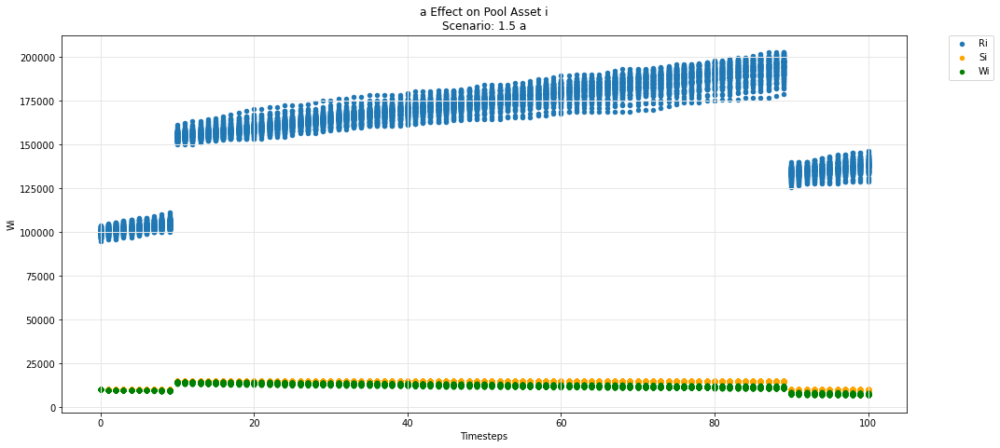

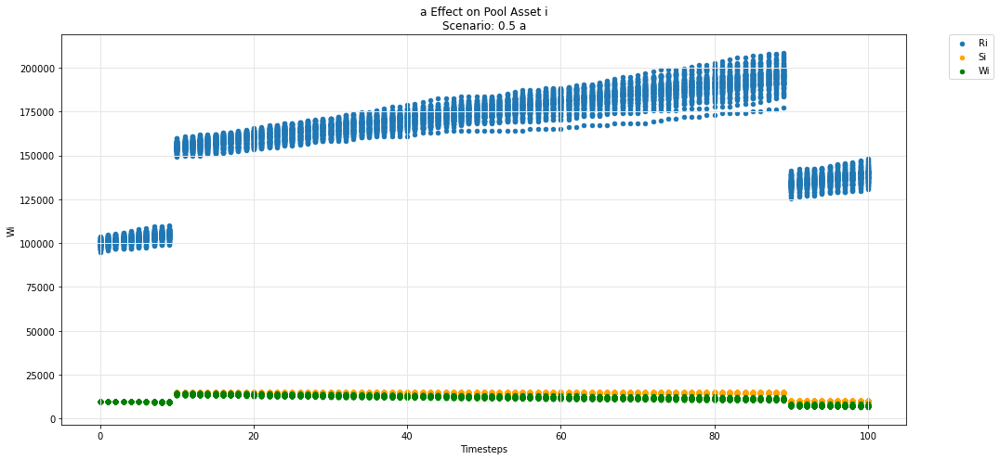

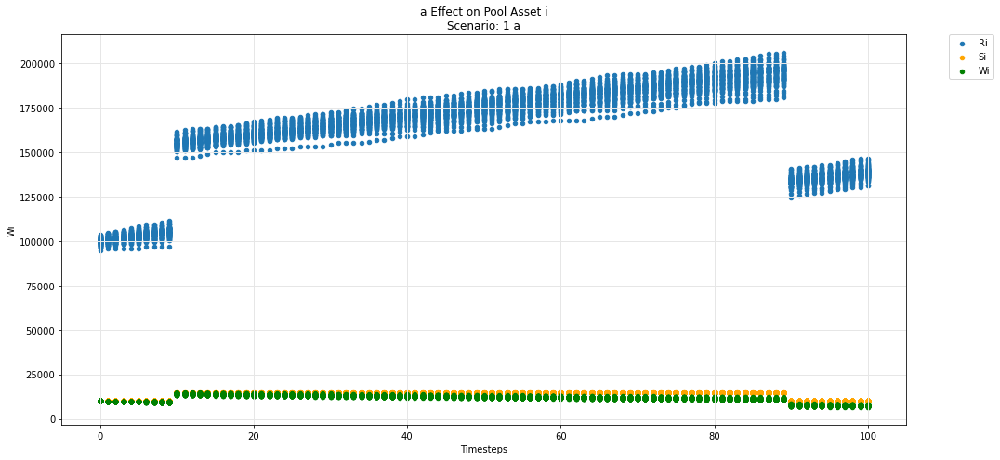

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

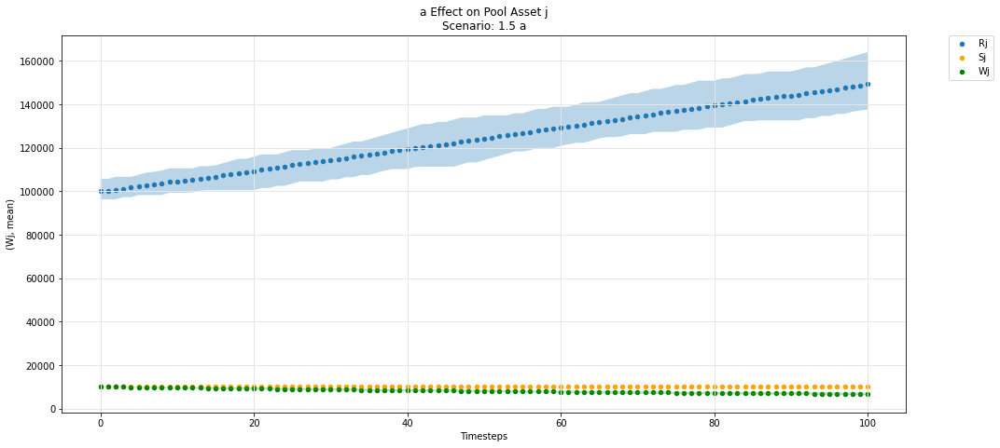

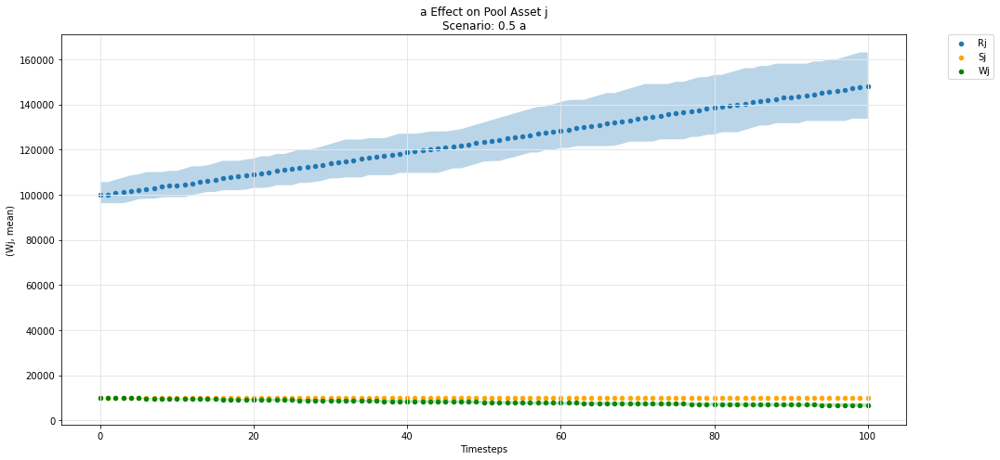

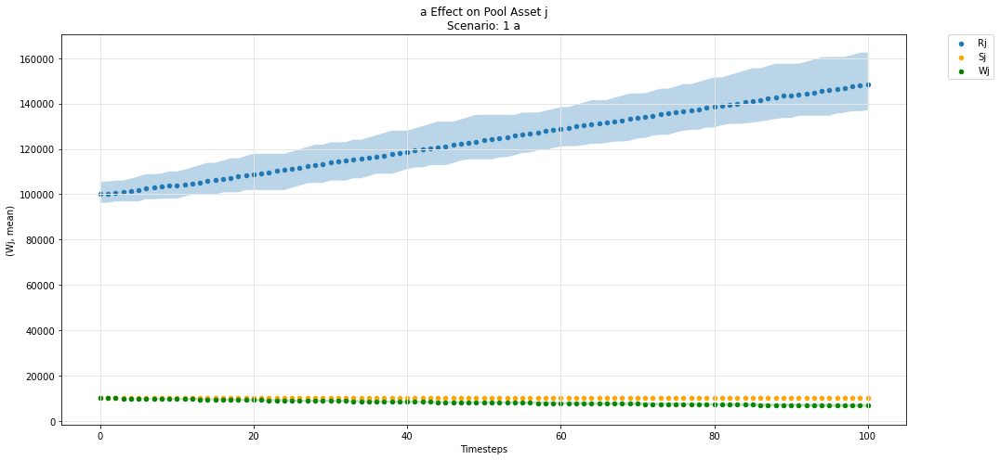

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

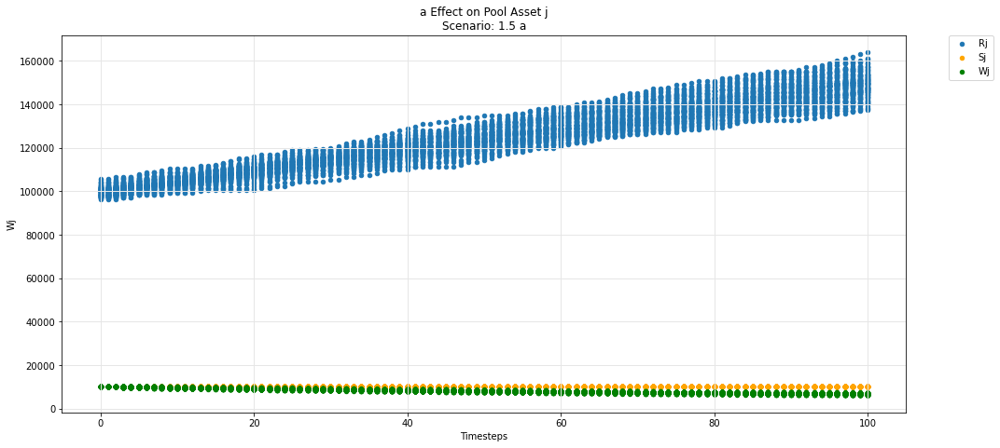

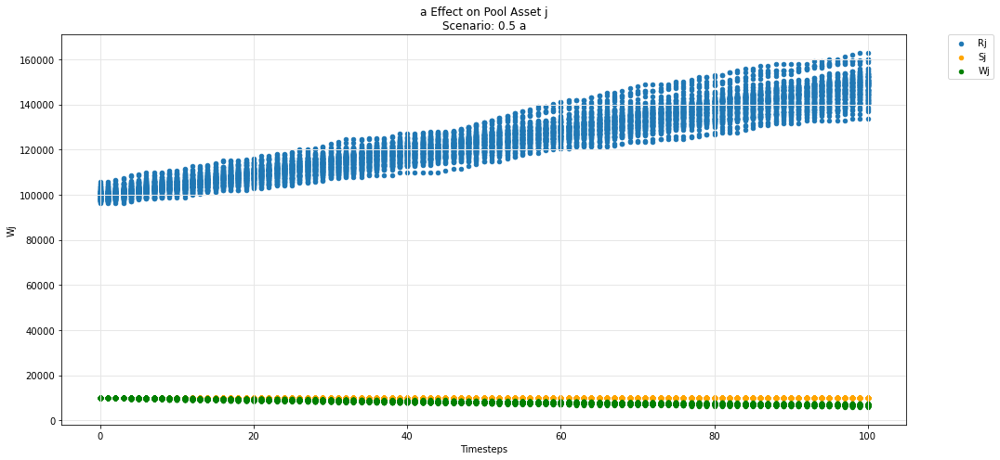

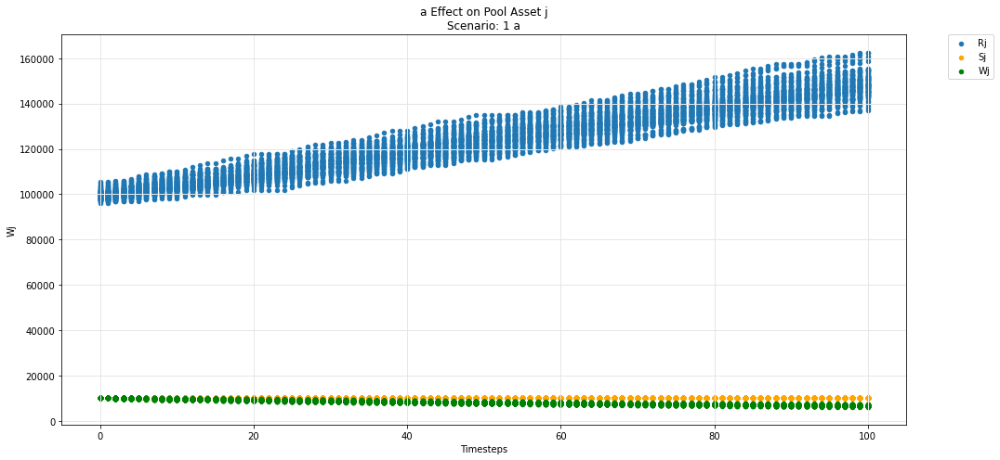

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

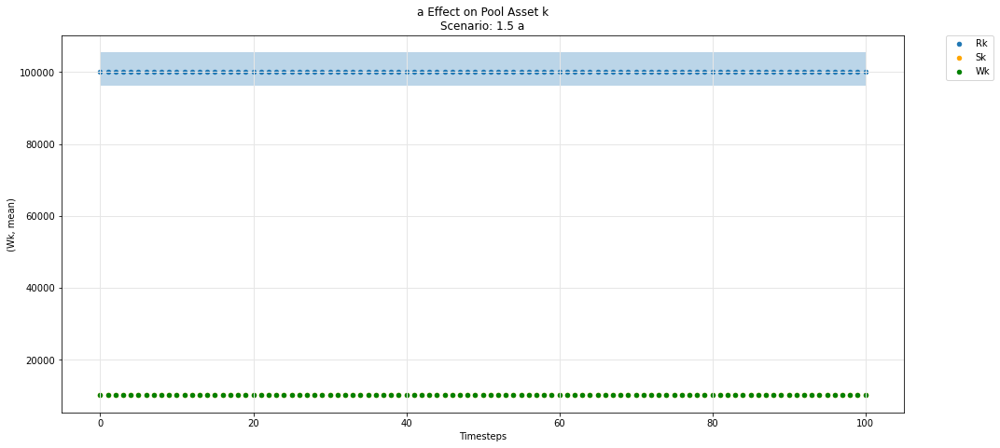

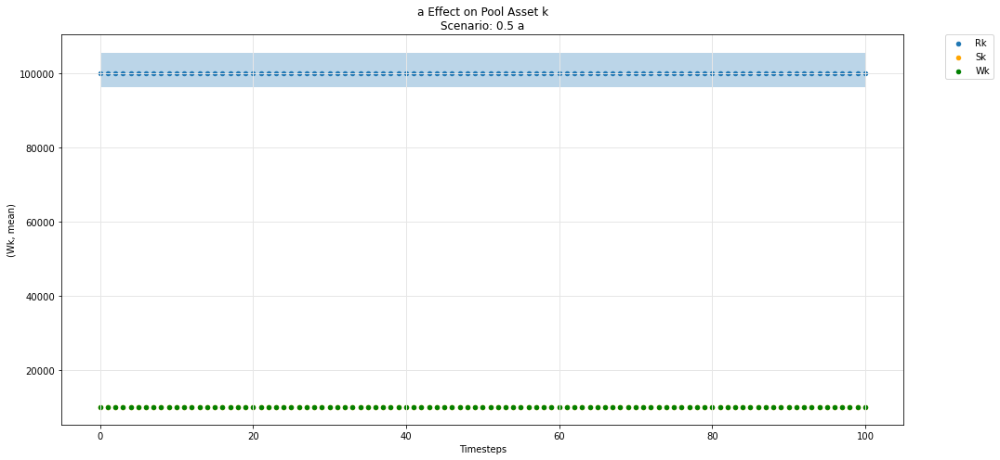

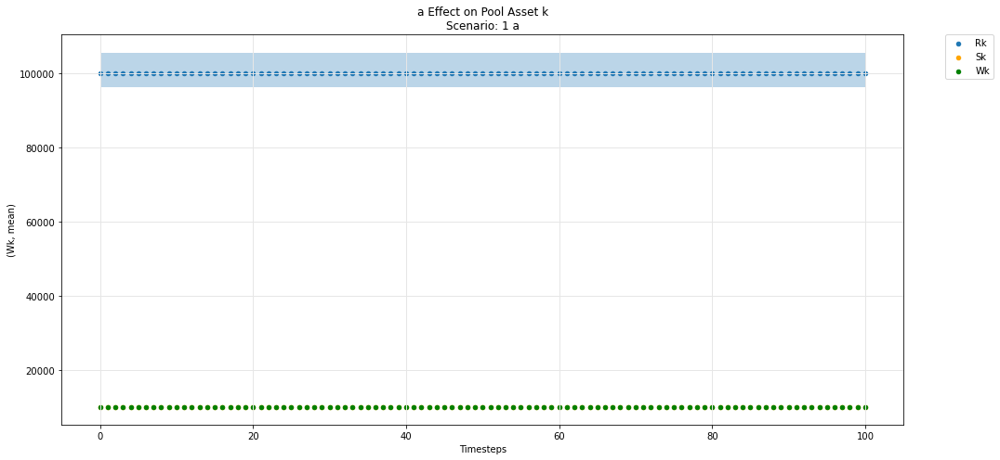

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

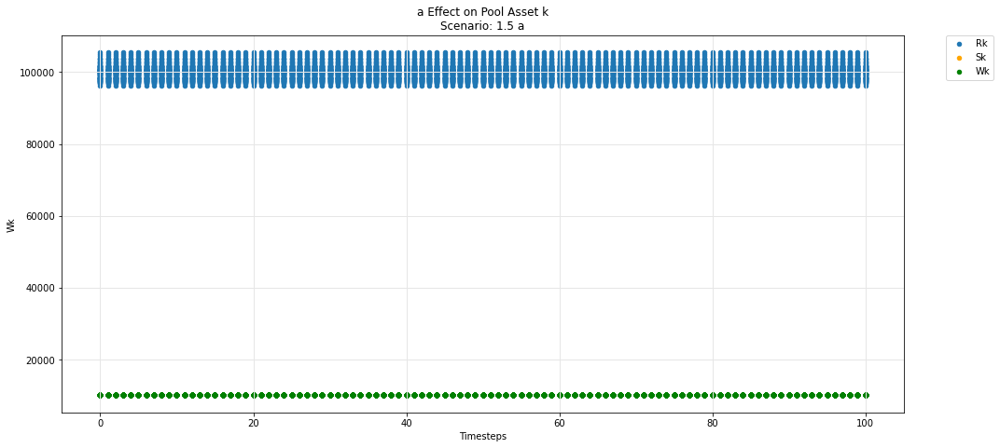

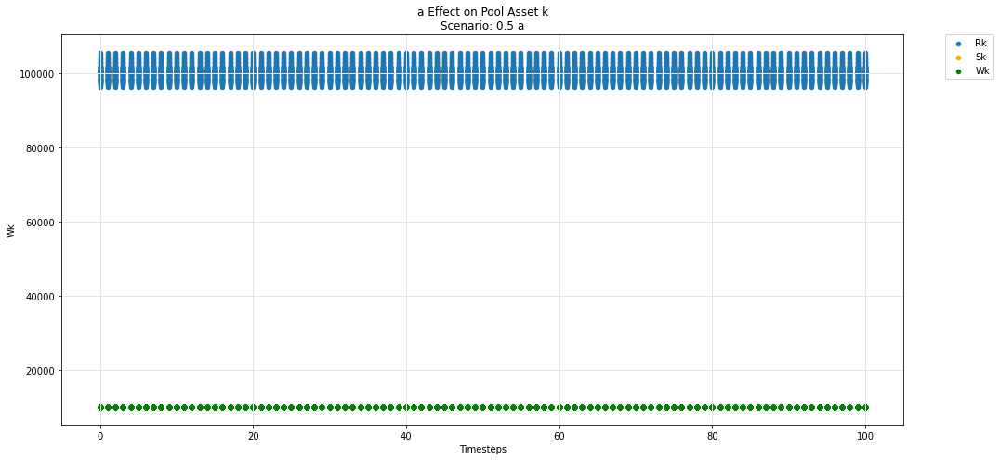

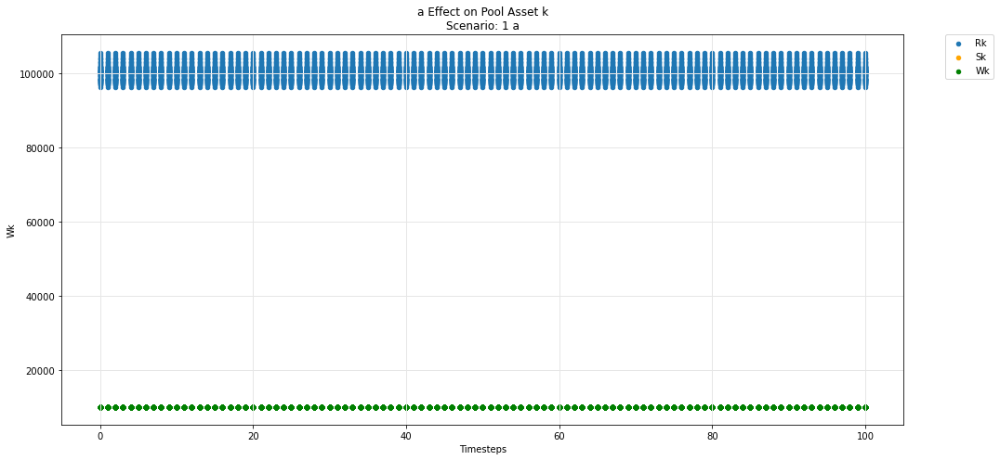

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

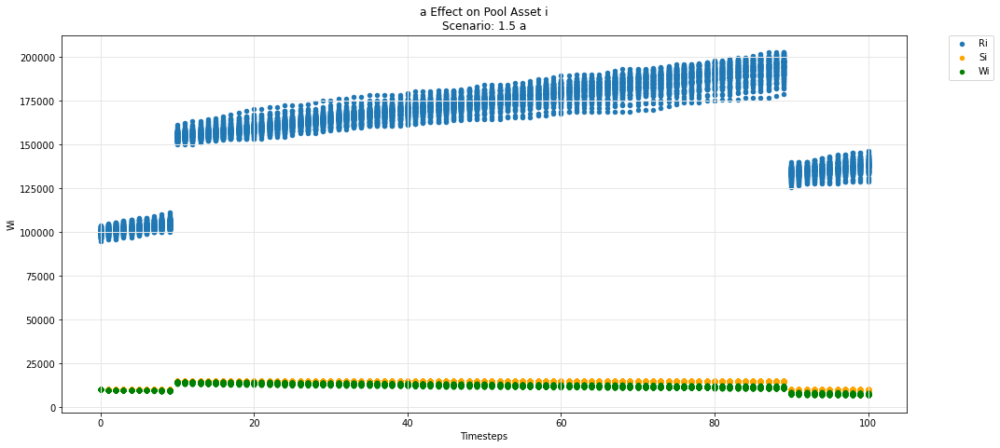

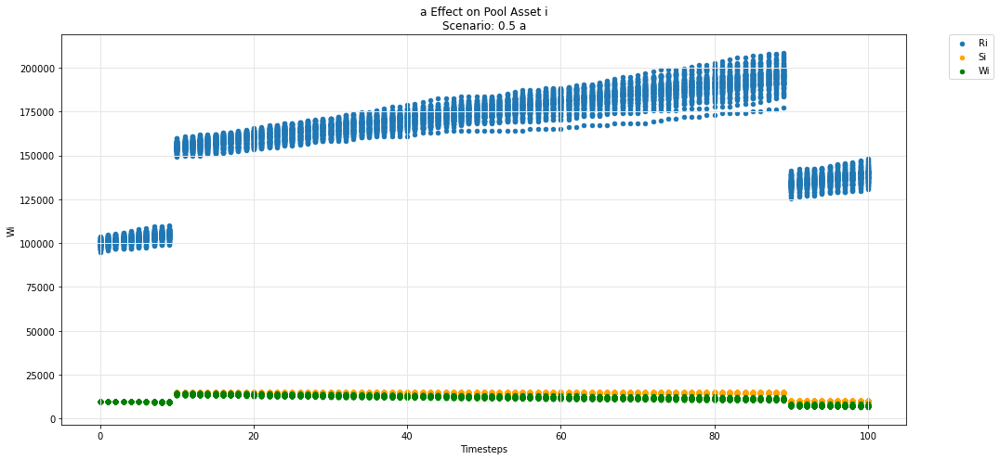

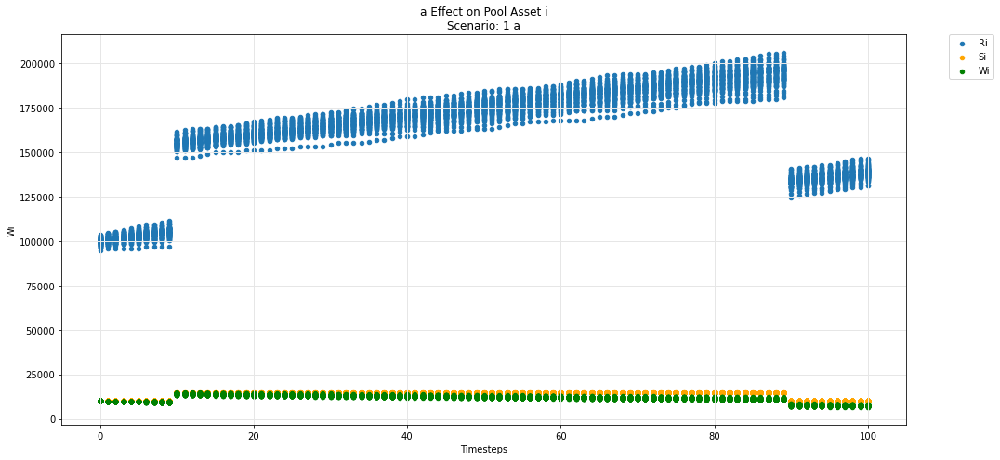

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

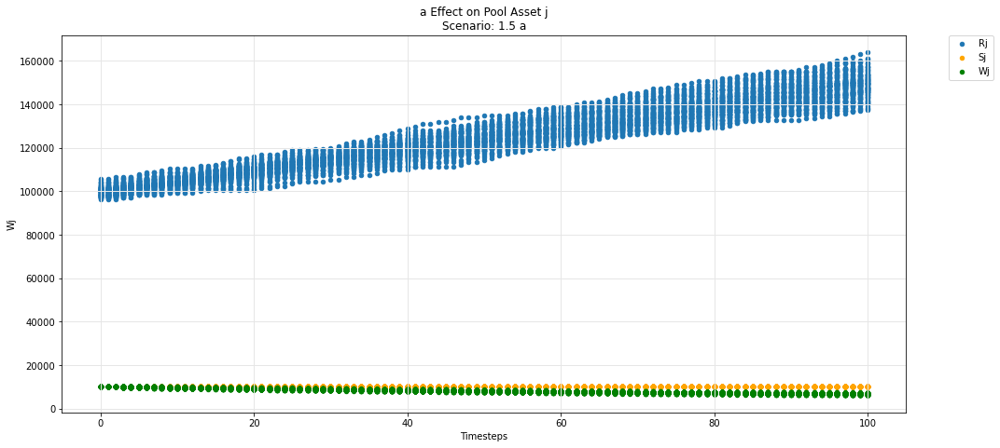

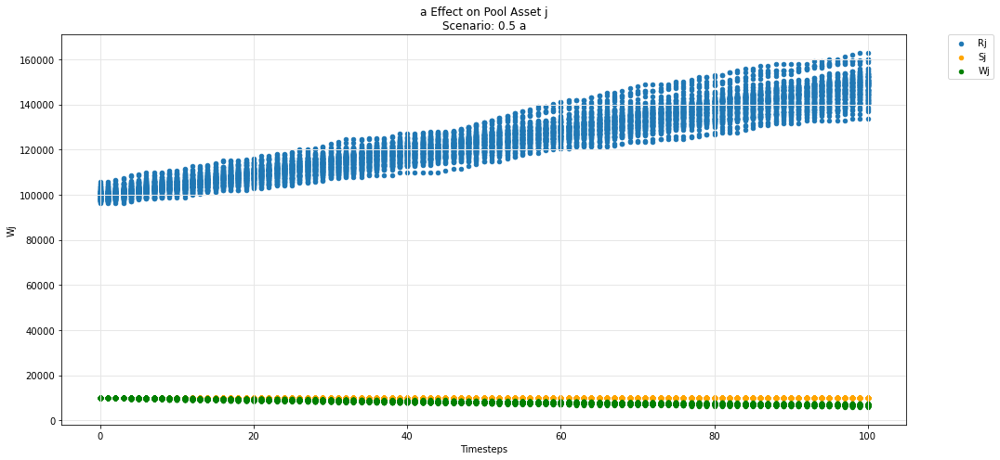

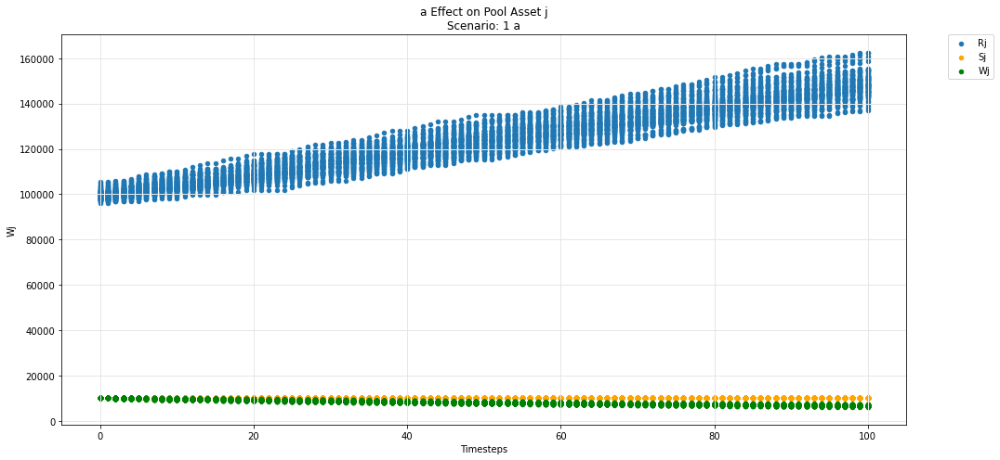

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

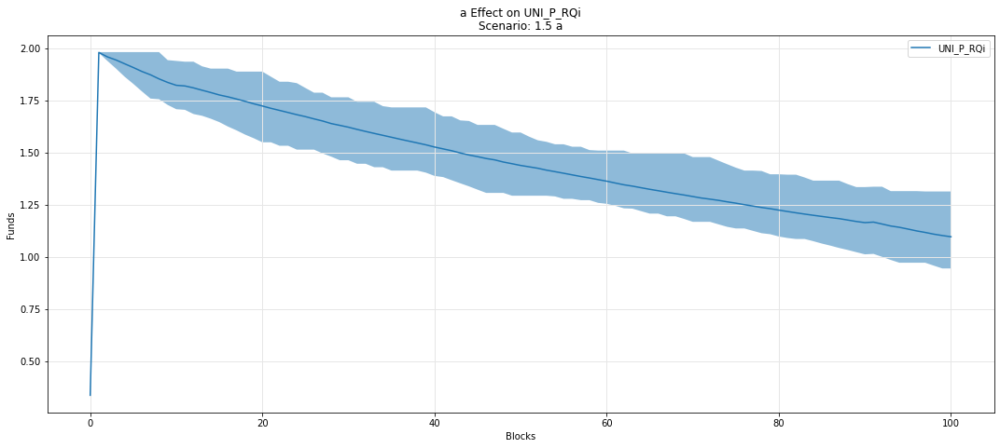

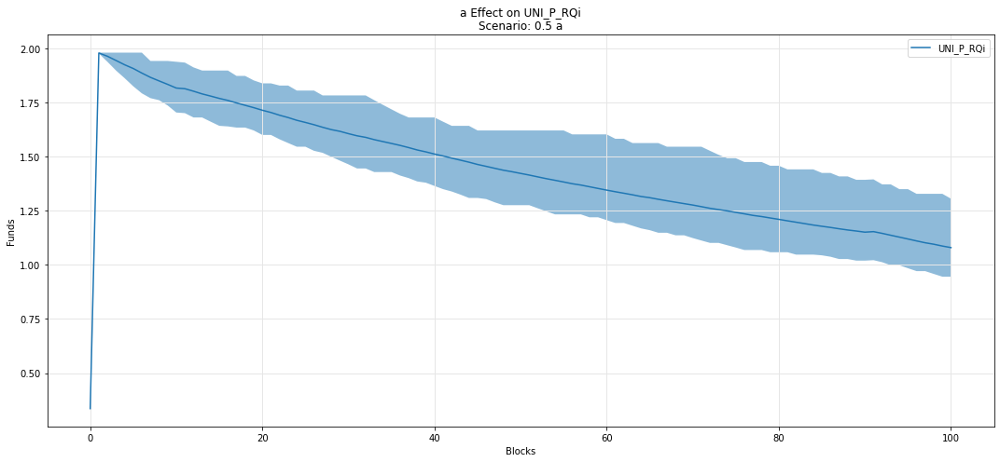

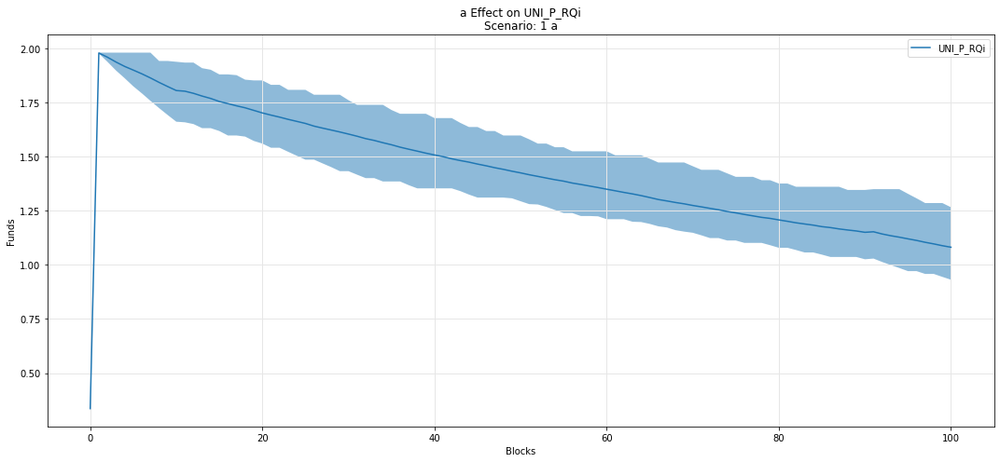

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

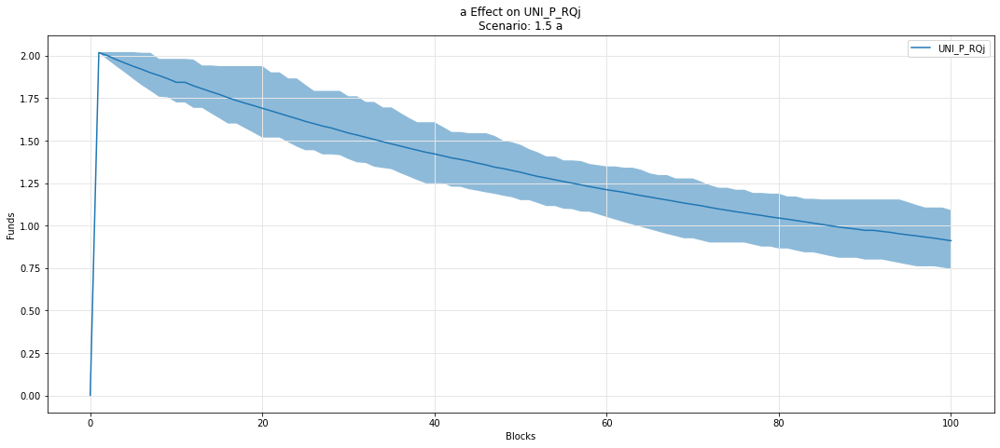

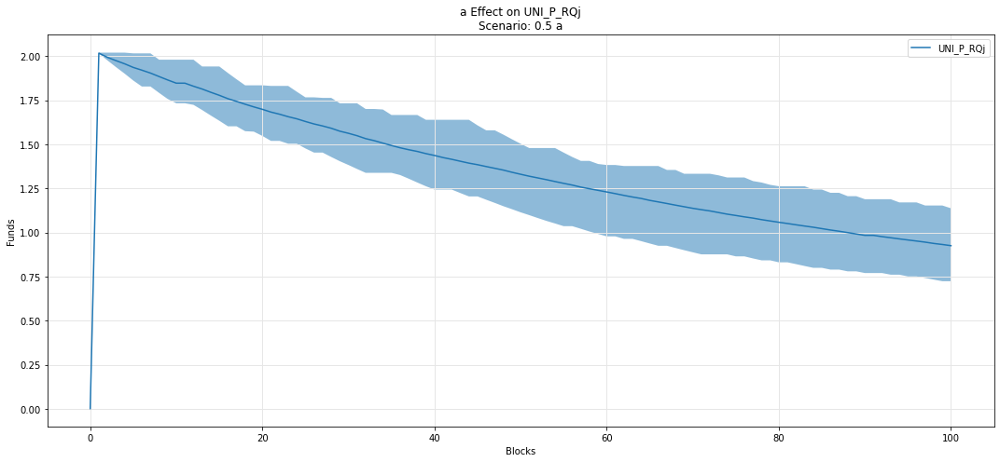

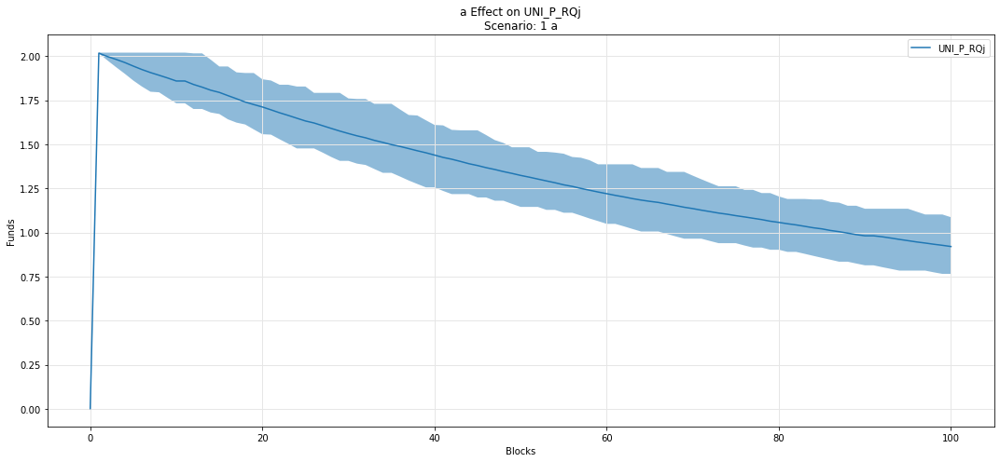

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

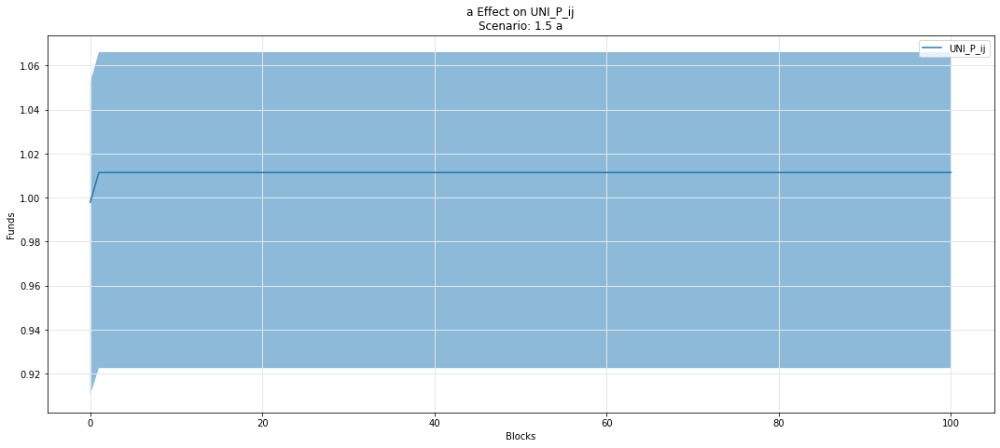

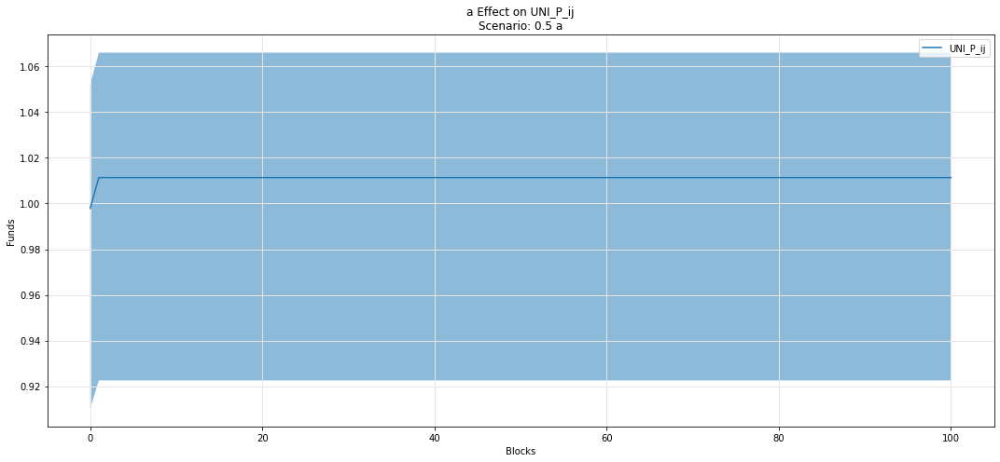

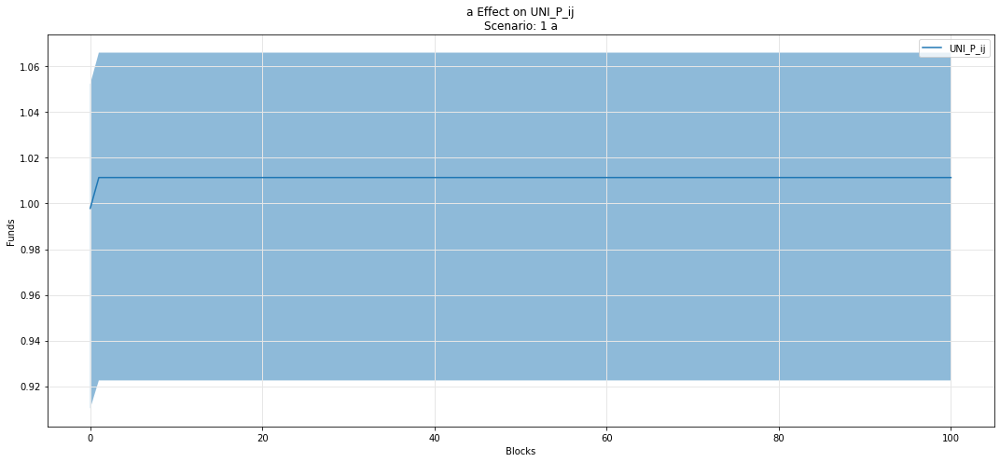

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

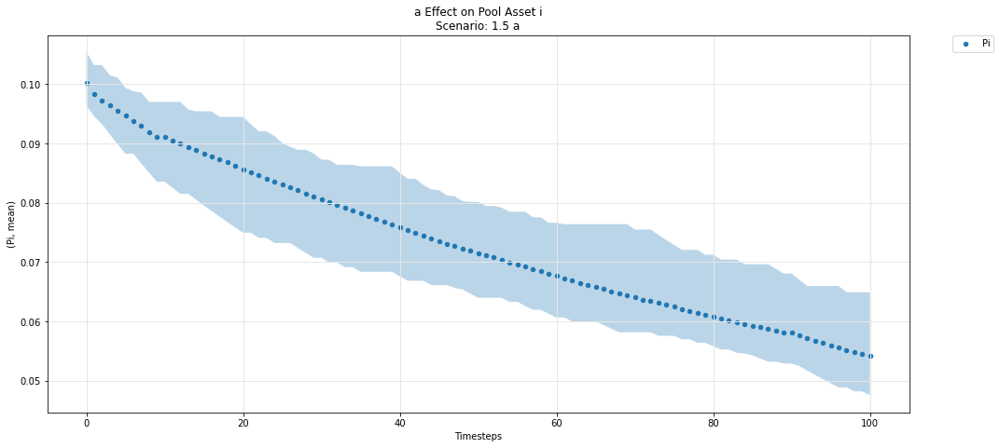

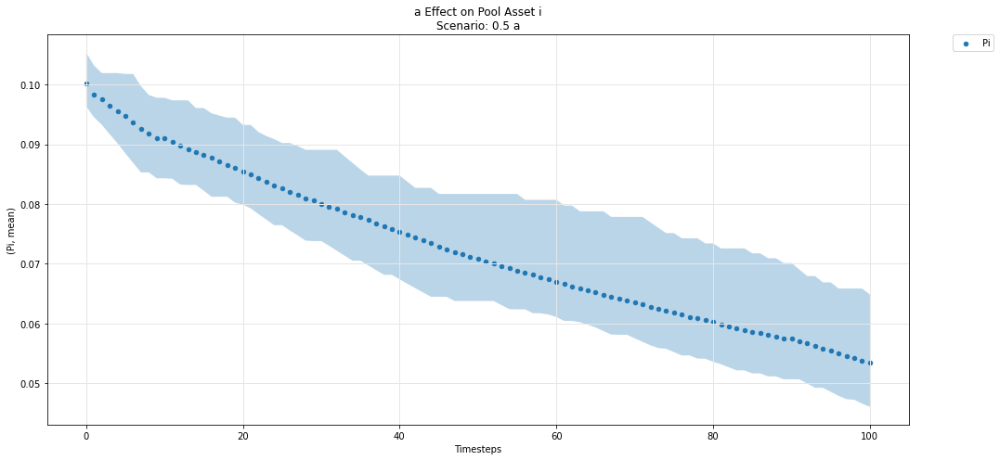

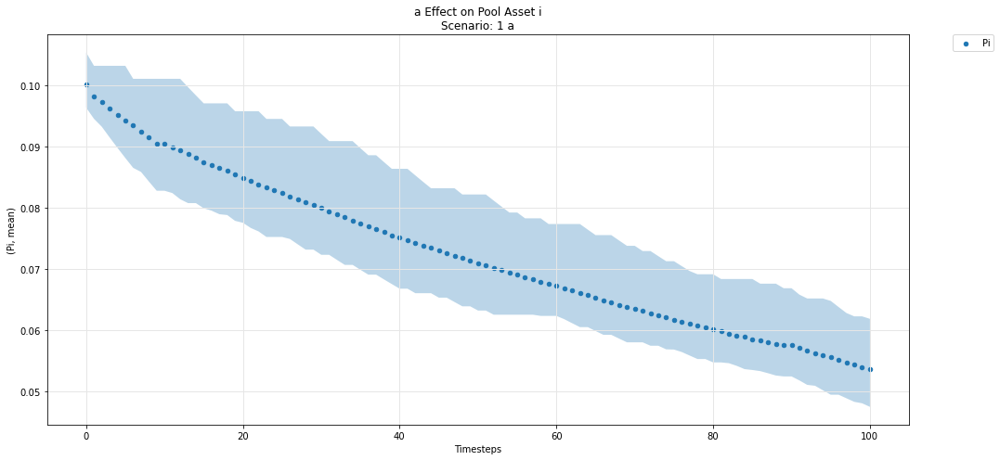

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

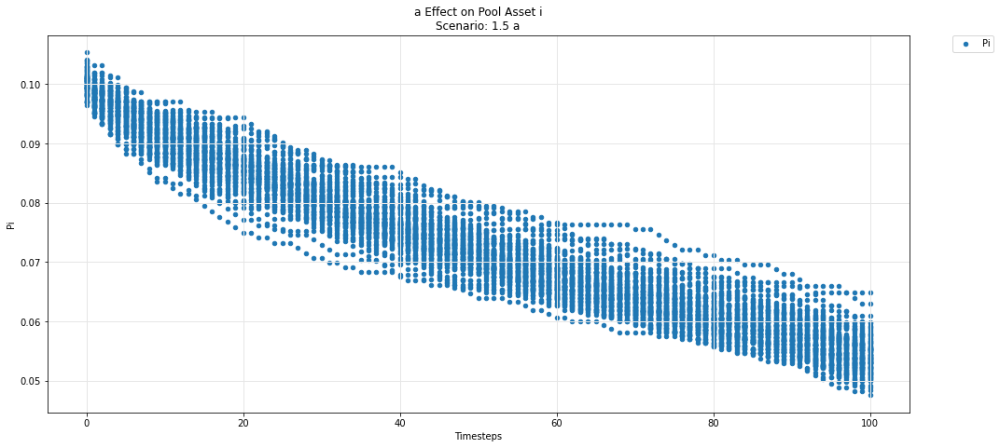

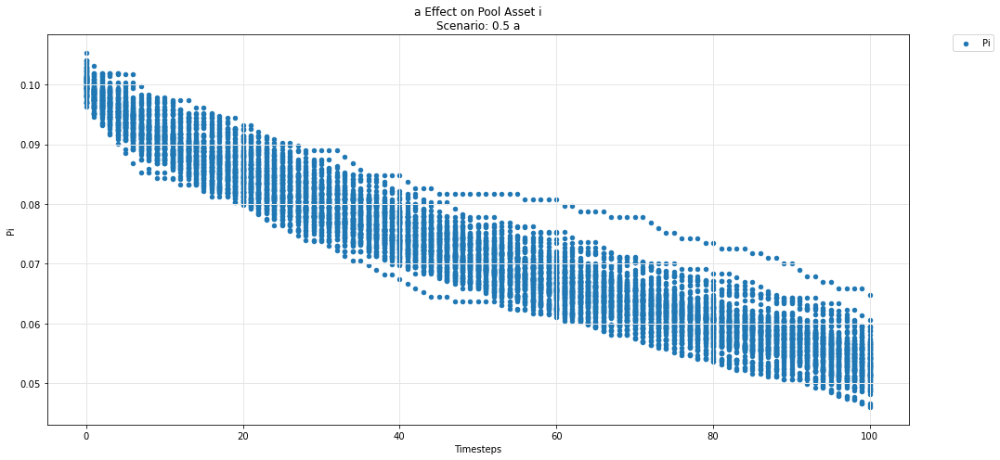

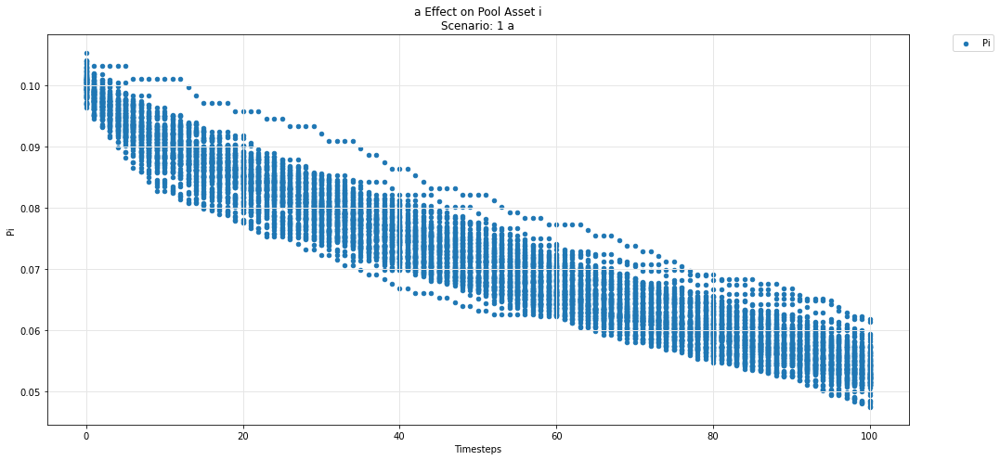

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

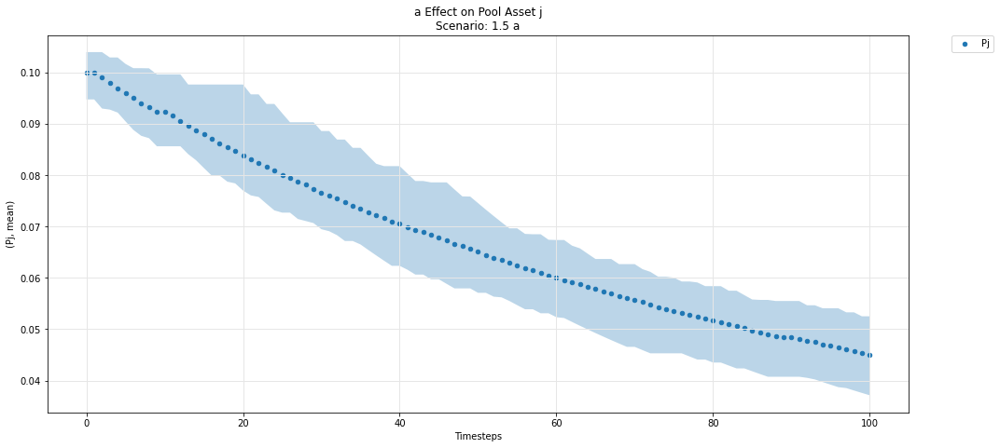

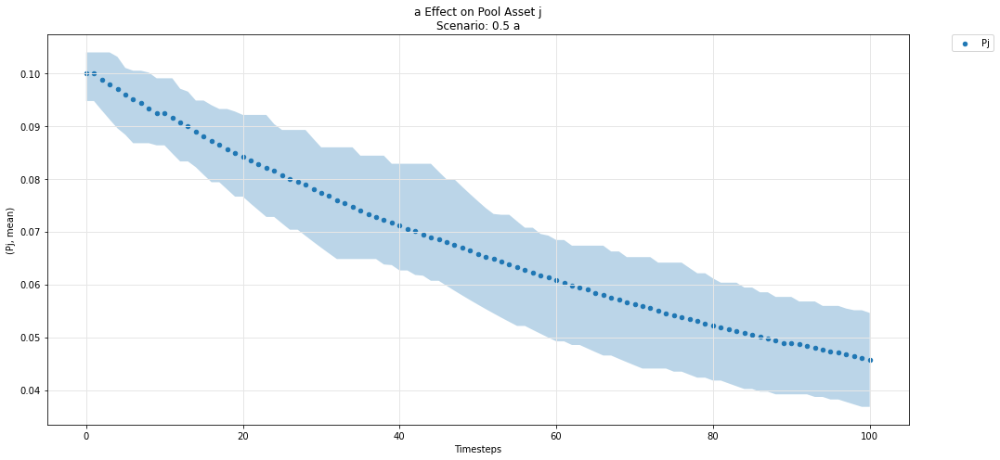

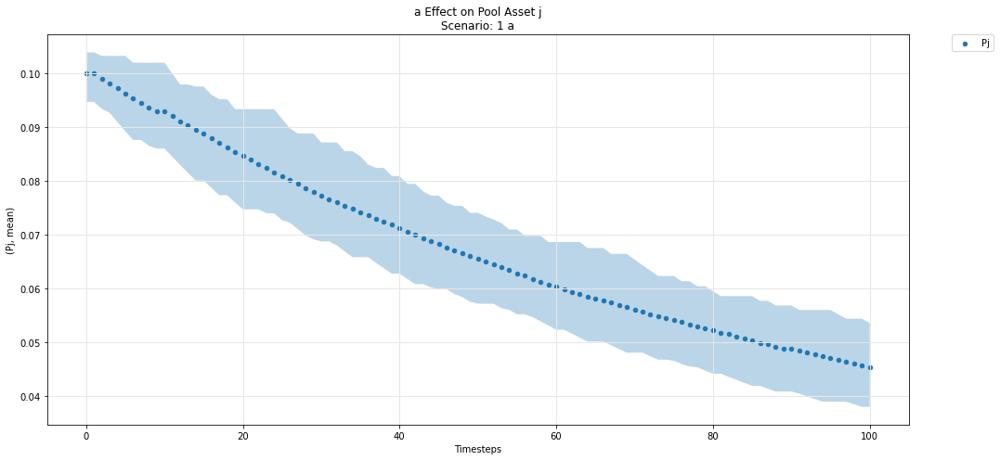

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

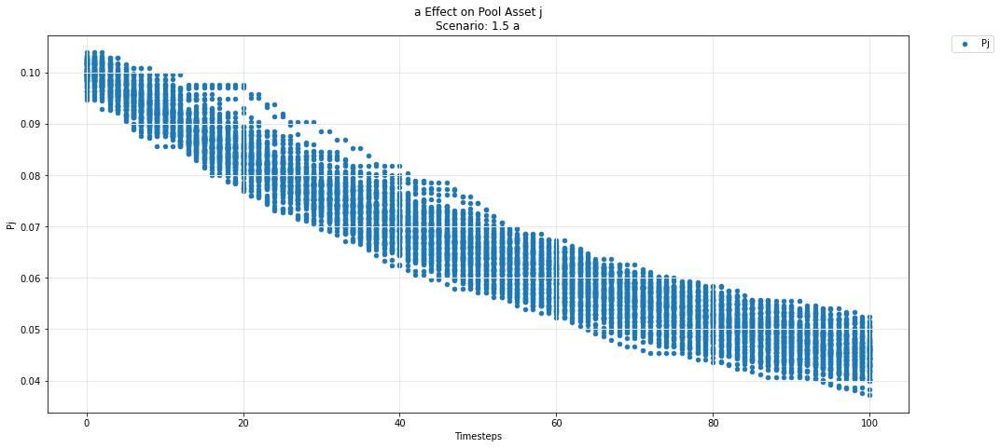

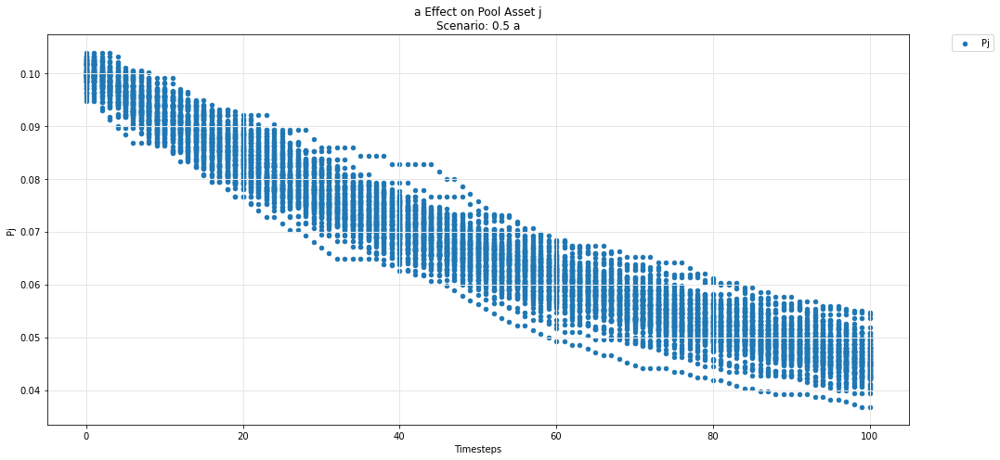

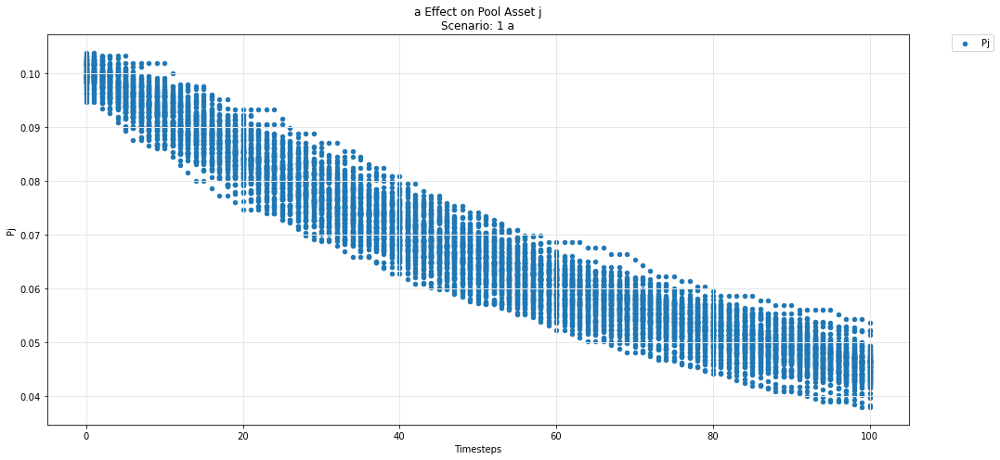

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

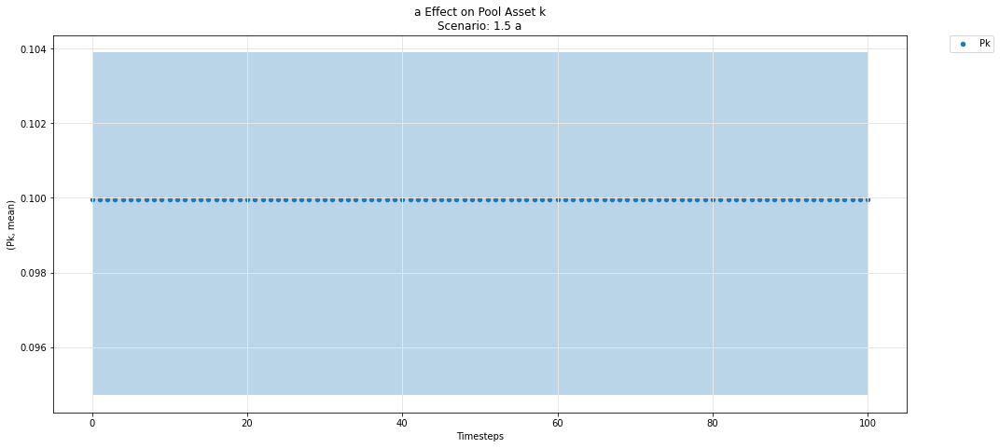

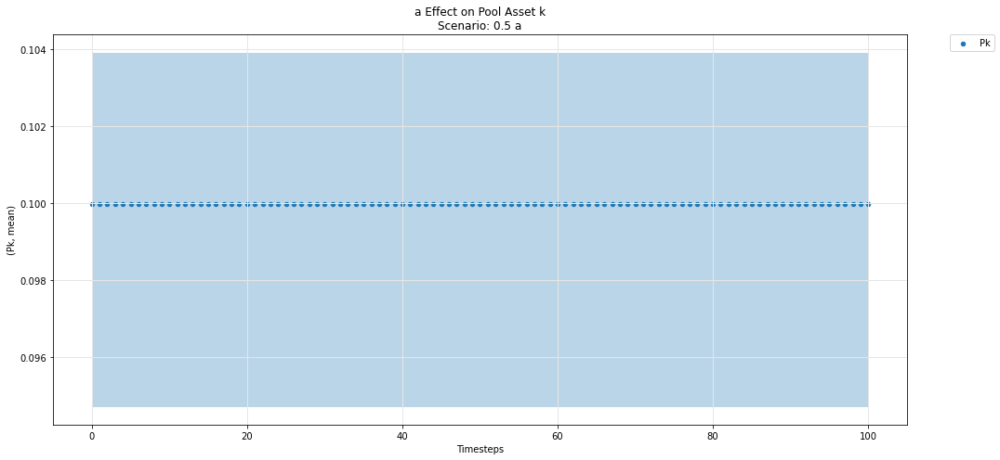

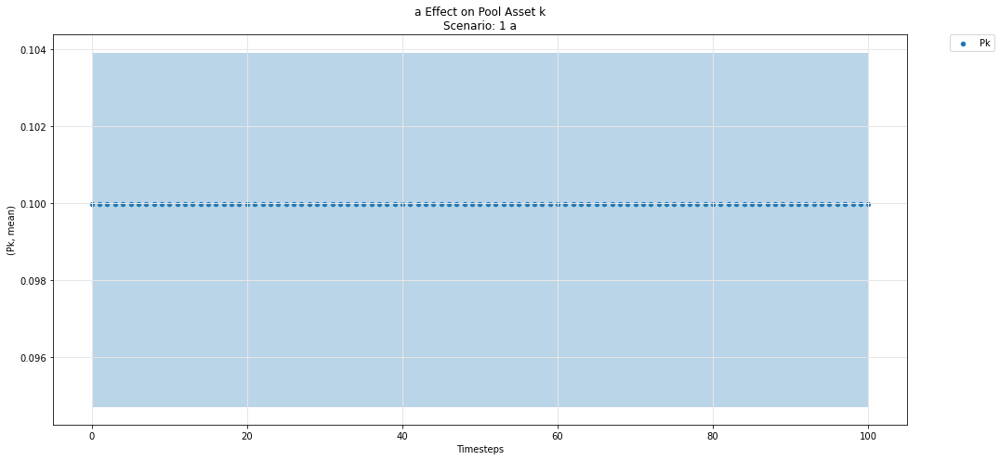

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

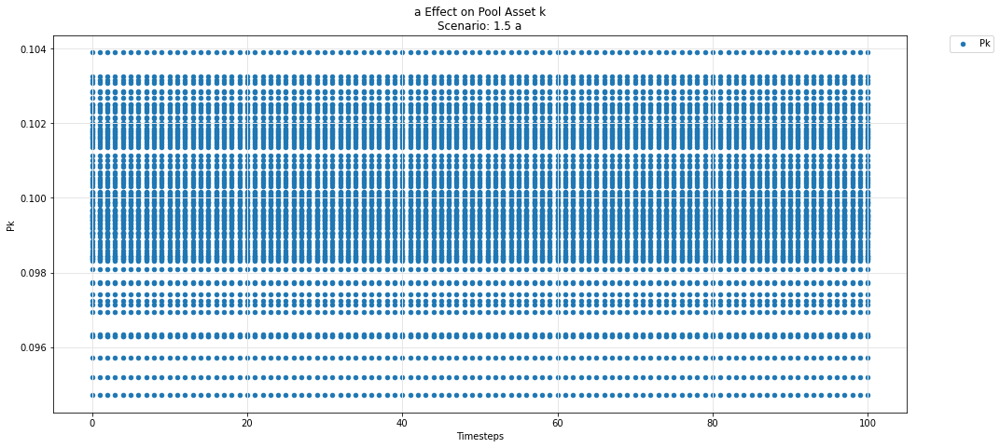

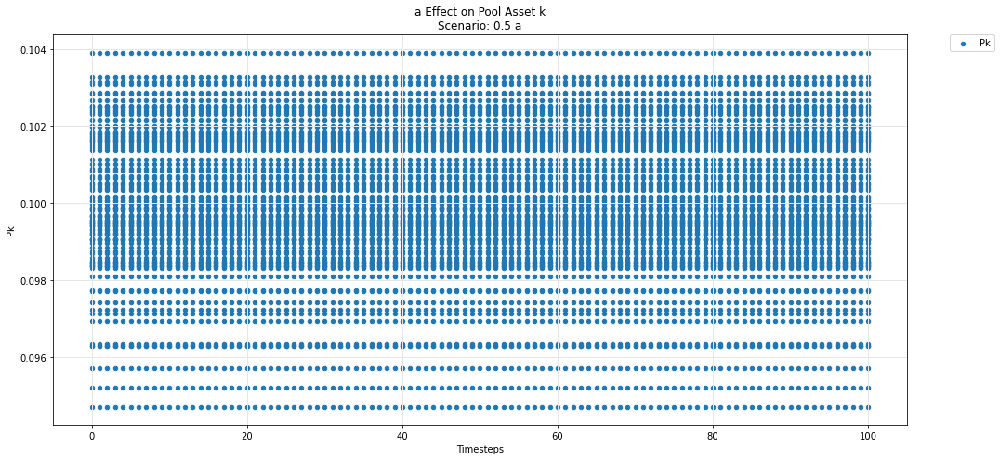

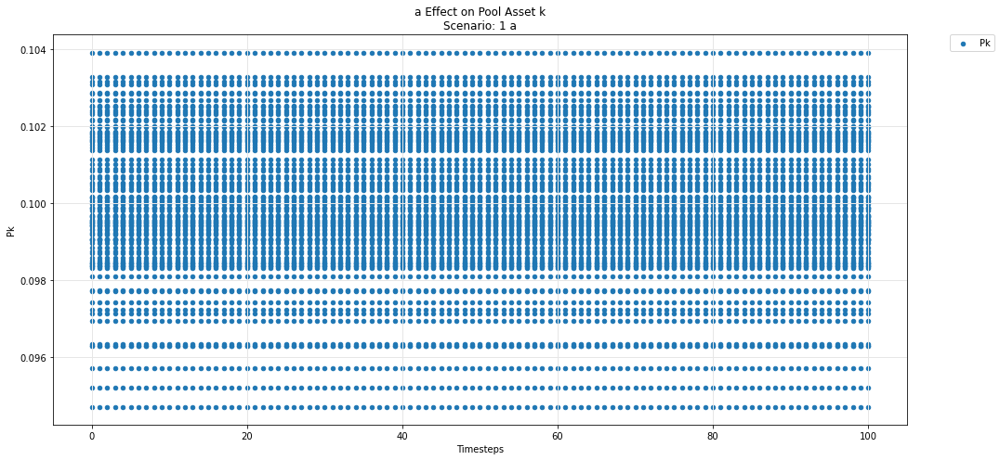

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')